In [35]:
import networkx as nx
import matplotlib.pyplot as plt
import random
import numpy as np

from itertools import permutations

In [3]:
# generate random Barabasi-Albert graph and assign random coordinates
g = nx.barabasi_albert_graph(10,1)
coords = nx.random_layout(g)


In [26]:
# modify graoh if needed
g.add_edge(8,7)
g.remove_edge(2,4)

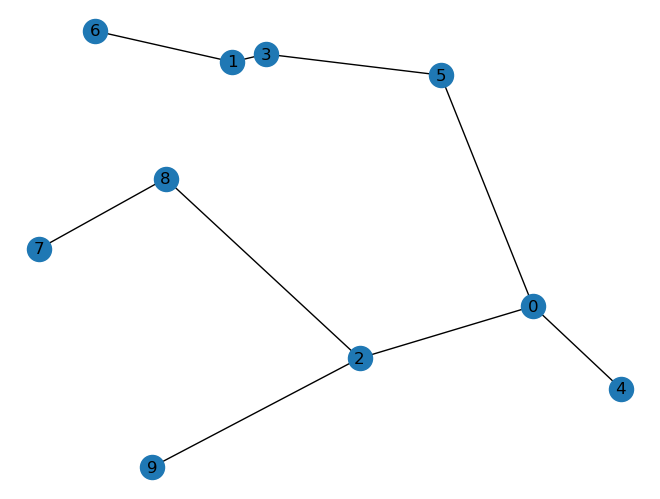

In [28]:
nx.draw(g, coords, with_labels = True)
plt.show()

In [29]:
# create several copies
h = g
j = g
k = g

In [30]:
# given a node, create a list of not connected nodes
def no_neighbor(node):
    nodes = list(g.nodes())
    for x in list(g.neighbors(node)):
        nodes.remove(x)
    nodes.remove(node)
    return nodes

In [42]:
# greedy and random search
def draw (graph, n, coords, policy, budget):
    #coords = nx.random_layout(graph)
    start_time = time.time()

    start_node = random.choice(list(graph.nodes()))
    cc = []
    cc1 = (nx.closeness_centrality(graph))
    print(cc1)
    cc.append(cc1[min(cc1, key = cc1.get)])
    S = []
    nodes = []
    worst_nodes = []
    rewards = []
    print ('KM budget', budget)
    nx.draw(graph,  coords,  with_labels = True)
    plt.show()
    cf = []
    fc = []
    for i in range(n):
        
        if start_node not in nodes: nodes.append(start_node)
        print('node sequence', nodes)
        print ('start node [0] =', start_node)
        if len(graph.edges(start_node)) == graph.number_of_nodes() -1: continue 
        cc1 = (nx.closeness_centrality(graph))
        cc.append(cc1[min(cc1, key = cc1.get)])
        worst_node = min(cc1, key = cc1.get)
        worst_nodes.append(worst_node)
        print('worst node :', worst_node)
        noneighbors =  [x for x in no_neighbor(start_node) if x not in nodes]
       
        cc_noneigbors = {x: cc1[x] for x in noneighbors}
        #print(graph.edges)
        #print(noneighbors)
        worst_no_neighbor = min(cc_noneigbors, key = cc_noneigbors.get)
        
        print('worst no neigbors node :', worst_no_neighbor)
        if policy == 'random':
            new_node = random.choice(noneighbors)
        elif policy == 'greedy':
            new_node = worst_no_neighbor
        
            
        print ('new node', new_node)
        if new_node not in nodes:
            S.append(new_node)
        else: continue
        graph.add_edge(start_node, new_node, color = 'r', weight = '3')
        
        cf.append((start_node, new_node))
        print('cf', cf)
        for i in range(len(cf)):
            fc.append(cf[i][::-1] )
        edge_colors = ["red" if edge in cf or edge in fc else "black" for edge in graph.edges()]

        kms = np.sqrt((coords[start_node][0]-coords[new_node][0])**2+(coords[start_node][1]-coords[new_node][1])**2)
        start_node = new_node
        print(cc1)
        print ('delta min closeness / reward', cc[i+1] - cc[i])
        rewards.append(cc[i+1] - cc[i])
        print ('cumul_rewards =', sum(rewards))
        print ('kilometres', kms)
        budget = budget - kms
        print ('budget left', budget)
        nx.draw(graph,  coords, edge_color = edge_colors, with_labels = True)
        plt.show()
        if budget <= 0:
            print ('out of budget')
            break
    print(S)
    print(worst_nodes)
    print("--- %s seconds ---" % (time.time() - start_time))



In [31]:
# exhaustive search
import time
def naive (graph, n, coords, budget):
    
    start_time = time.time()
    #coords = nx.random_layout(graph)
    nx.draw(graph, coords, with_labels = True)
    plt.show()
    all_perms = list( permutations (list(graph.nodes), n))
    start_node = 0
    cf = []
    cc1 = (nx.closeness_centrality(graph))
    cc = []
    done = False
    print(g.edges)
    ccs = {}
    for perm in range(len(all_perms)):
        print('-----------------------------------------------')
        cf = []
        fc = []
        done = False
        d = all_perms[perm]
        print(d)
        budget1 = budget
        for i in range(len(d)-1):
            edge = (d[i], d[i+1])
            kms = np.sqrt((coords[d[i]][0]-coords[d[i+1]][0])**2+(coords[d[i]][1]-coords[d[i+1]][1])**2)
            budget1 = budget1 - kms 
            if edge in graph.edges():
                done = True
                break
            elif budget1 <= 0:
                print ('out of budget')
            else: cf.append(edge)
            print('edge', edge)
        print ('done', done)    
        if done: continue    
        graph.add_edges_from(cf)
        for i in range(len(cf)):
            fc.append(cf[i][::-1] )
        edge_colors = ["red" if edge in cf or edge in fc else "black" for edge in graph.edges()]

        nx.draw(graph, coords, edge_color=edge_colors,with_labels = True)
        plt.show()
        cc1 = (nx.closeness_centrality(graph))
        print('added edges', cf)
        print('min cc',cc1[min(cc1, key = cc1.get)])
        ccs[tuple(cf)] = cc1[min(cc1, key = cc1.get)]
        cc.append(cc1[min(cc1, key = cc1.get)])
        graph.remove_edges_from(cf)
        print('budget', budget1)
        
    print(ccs)
    mincc = max(ccs, key = ccs.get),ccs[max(ccs, key = ccs.get)]
    print('minimum', mincc)

    print("--- %s seconds ---" % (time.time() - start_time))
        
        
        
        
        
    

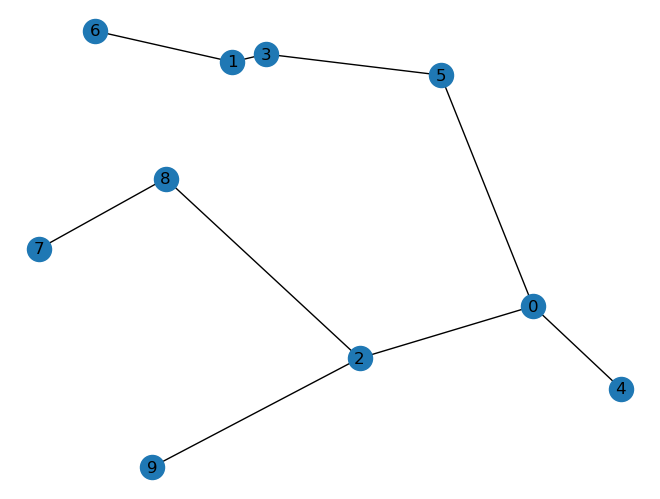

[(0, 2), (0, 5), (0, 4), (1, 6), (1, 3), (2, 8), (2, 9), (3, 5), (7, 8)]
-----------------------------------------------
(0, 1, 2)
edge (0, 1)
edge (1, 2)
done False


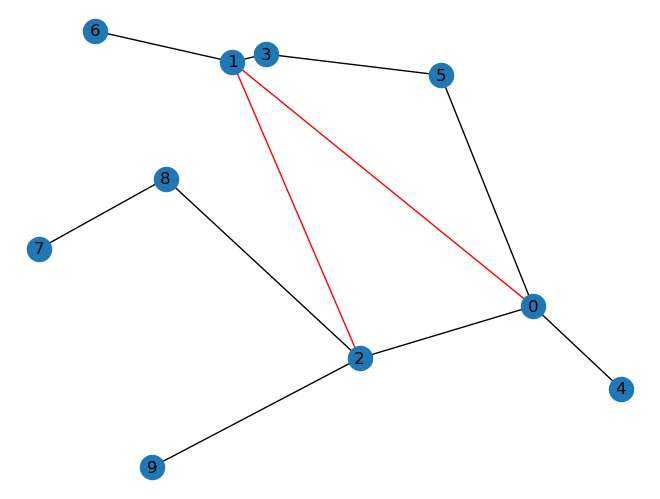

added edges [(0, 1), (1, 2)]
min cc 0.32142857142857145
budget 0.07064736871491928
-----------------------------------------------
(0, 1, 3)
edge (0, 1)
done True
-----------------------------------------------
(0, 1, 4)
edge (0, 1)
out of budget
edge (1, 4)
done False


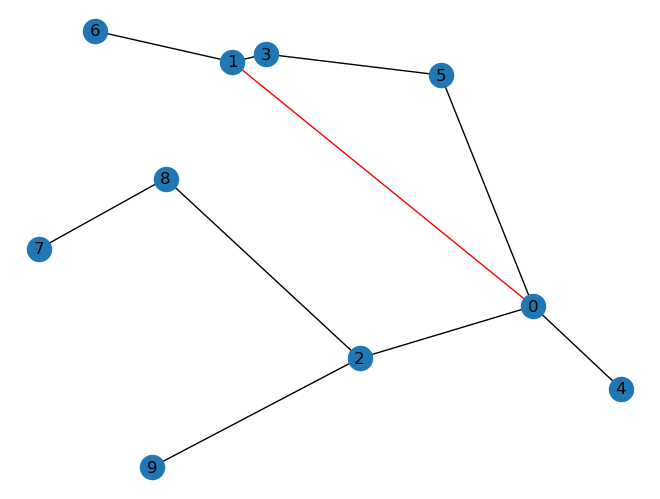

added edges [(0, 1)]
min cc 0.2903225806451613
budget -0.19866869015155741
-----------------------------------------------
(0, 1, 5)
edge (0, 1)
edge (1, 5)
done False


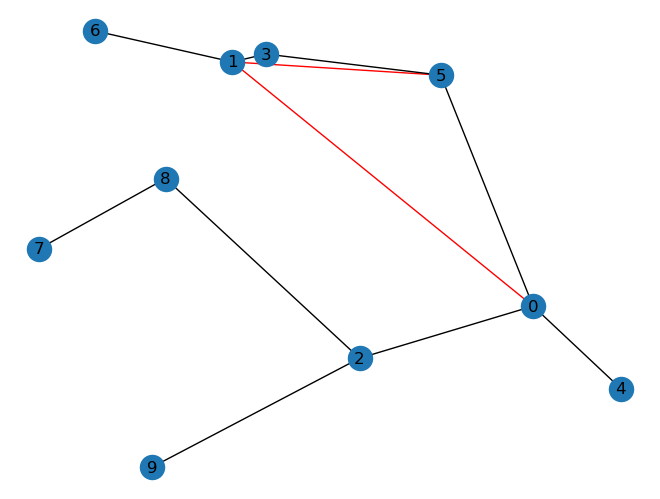

added edges [(0, 1), (1, 5)]
min cc 0.2903225806451613
budget 0.42936772405056456
-----------------------------------------------
(0, 1, 6)
edge (0, 1)
done True
-----------------------------------------------
(0, 1, 7)
edge (0, 1)
edge (1, 7)
done False


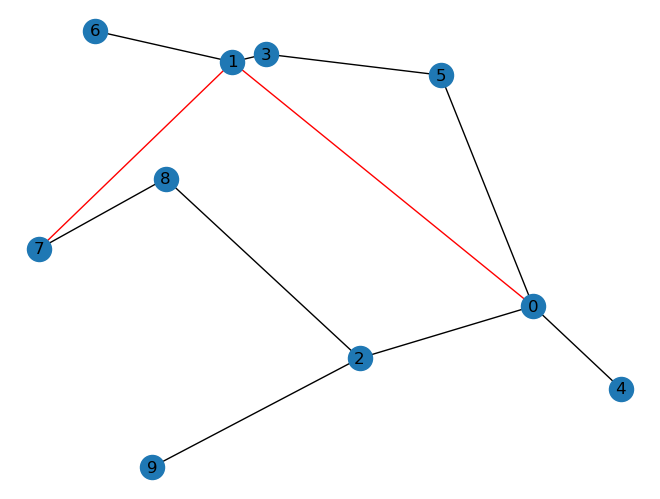

added edges [(0, 1), (1, 7)]
min cc 0.36
budget 0.24408181955448005
-----------------------------------------------
(0, 1, 8)
edge (0, 1)
edge (1, 8)
done False


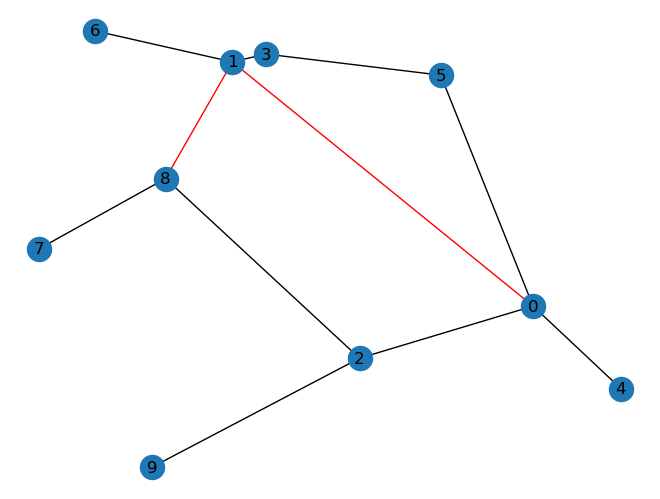

added edges [(0, 1), (1, 8)]
min cc 0.36
budget 0.48397598040394857
-----------------------------------------------
(0, 1, 9)
edge (0, 1)
out of budget
edge (1, 9)
done False


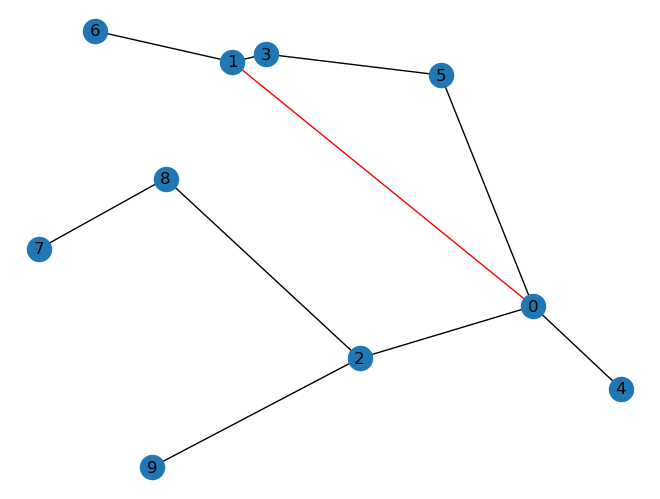

added edges [(0, 1)]
min cc 0.2903225806451613
budget -0.15237708990477672
-----------------------------------------------
(0, 2, 1)
done True
-----------------------------------------------
(0, 2, 3)
done True
-----------------------------------------------
(0, 2, 4)
done True
-----------------------------------------------
(0, 2, 5)
done True
-----------------------------------------------
(0, 2, 6)
done True
-----------------------------------------------
(0, 2, 7)
done True
-----------------------------------------------
(0, 2, 8)
done True
-----------------------------------------------
(0, 2, 9)
done True
-----------------------------------------------
(0, 3, 1)
edge (0, 3)
done True
-----------------------------------------------
(0, 3, 2)
edge (0, 3)
edge (3, 2)
done False


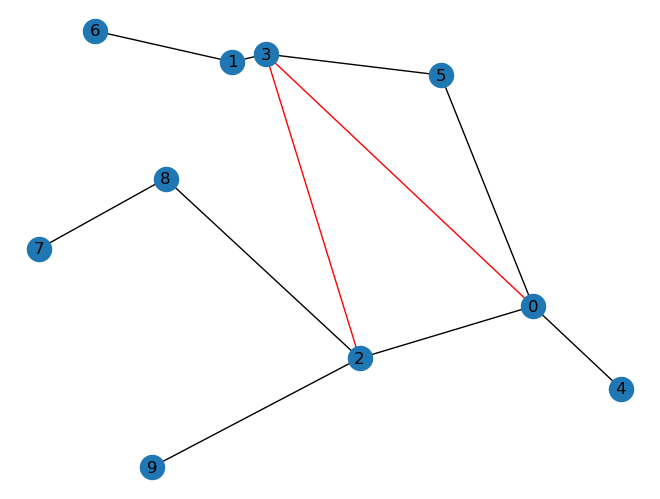

added edges [(0, 3), (3, 2)]
min cc 0.3103448275862069
budget 0.08769951288681954
-----------------------------------------------
(0, 3, 4)
edge (0, 3)
out of budget
edge (3, 4)
done False


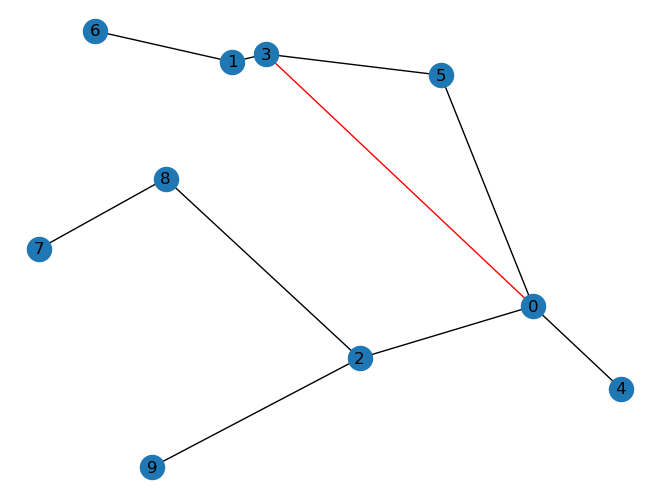

added edges [(0, 3)]
min cc 0.2727272727272727
budget -0.15814174584803153
-----------------------------------------------
(0, 3, 5)
edge (0, 3)
done True
-----------------------------------------------
(0, 3, 6)
edge (0, 3)
edge (3, 6)
done False


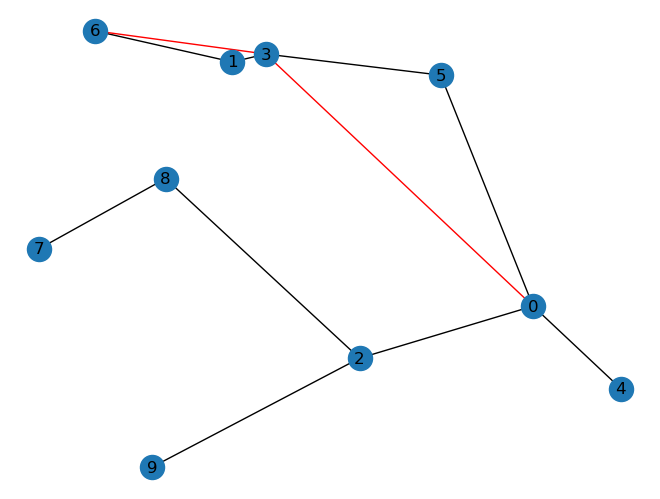

added edges [(0, 3), (3, 6)]
min cc 0.2903225806451613
budget 0.5066517926820895
-----------------------------------------------
(0, 3, 7)
edge (0, 3)
edge (3, 7)
done False


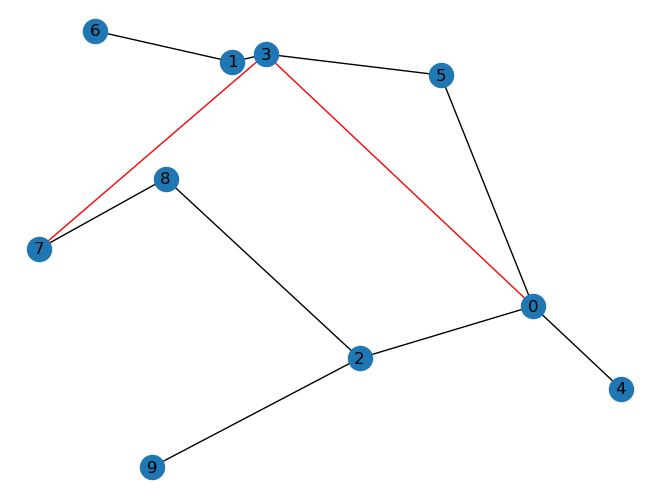

added edges [(0, 3), (3, 7)]
min cc 0.3103448275862069
budget 0.2171497519837805
-----------------------------------------------
(0, 3, 8)
edge (0, 3)
edge (3, 8)
done False


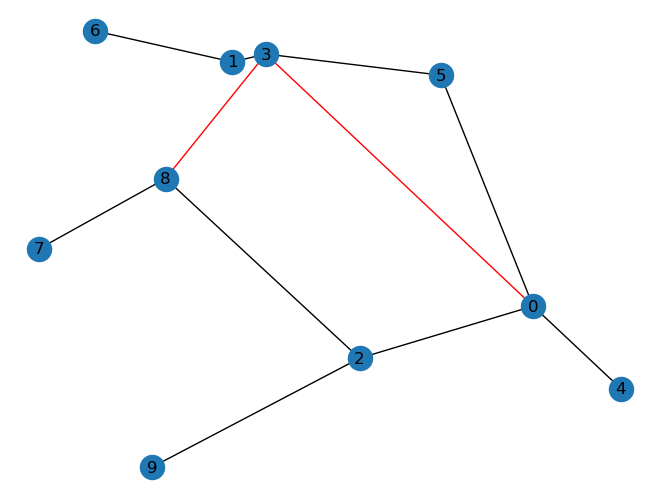

added edges [(0, 3), (3, 8)]
min cc 0.3103448275862069
budget 0.46455659105751584
-----------------------------------------------
(0, 3, 9)
edge (0, 3)
out of budget
edge (3, 9)
done False


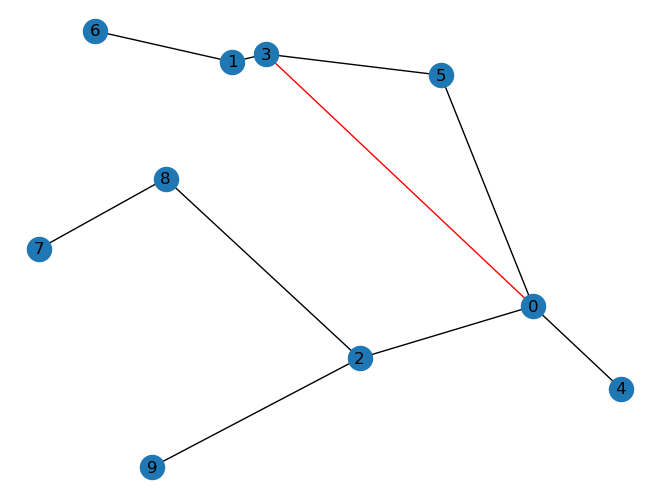

added edges [(0, 3)]
min cc 0.2727272727272727
budget -0.15852402079430683
-----------------------------------------------
(0, 4, 1)
done True
-----------------------------------------------
(0, 4, 2)
done True
-----------------------------------------------
(0, 4, 3)
done True
-----------------------------------------------
(0, 4, 5)
done True
-----------------------------------------------
(0, 4, 6)
done True
-----------------------------------------------
(0, 4, 7)
done True
-----------------------------------------------
(0, 4, 8)
done True
-----------------------------------------------
(0, 4, 9)
done True
-----------------------------------------------
(0, 5, 1)
done True
-----------------------------------------------
(0, 5, 2)
done True
-----------------------------------------------
(0, 5, 3)
done True
-----------------------------------------------
(0, 5, 4)
done True
-----------------------------------------------
(0, 5, 6)
done True
-----------------------------------------

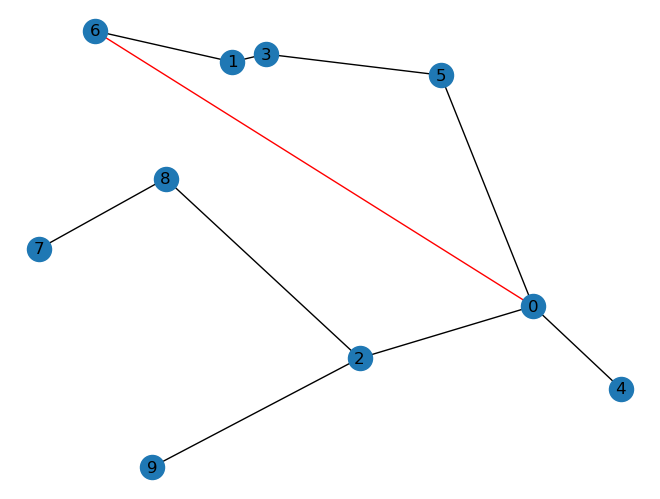

added edges [(0, 6)]
min cc 0.2903225806451613
budget -0.2911148192423373
-----------------------------------------------
(0, 6, 3)
edge (0, 6)
edge (6, 3)
done False


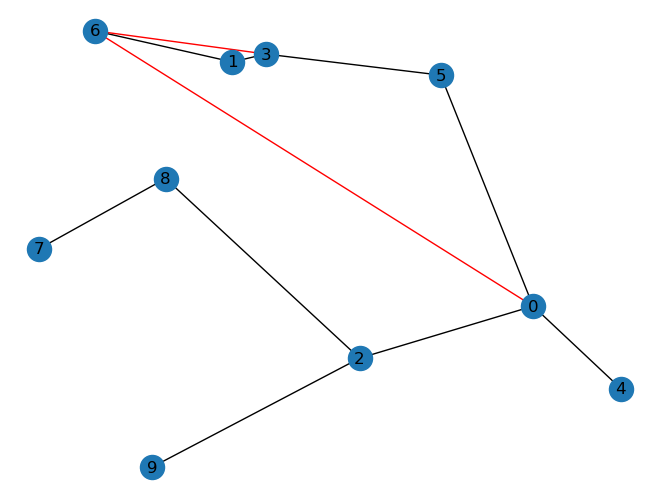

added edges [(0, 6), (6, 3)]
min cc 0.2903225806451613
budget 0.27869584537679626
-----------------------------------------------
(0, 6, 4)
edge (0, 6)
out of budget
edge (6, 4)
done False


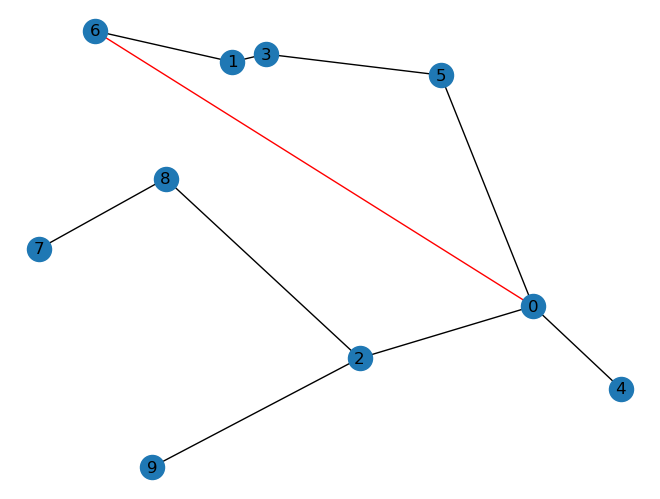

added edges [(0, 6)]
min cc 0.2903225806451613
budget -0.610318828469588
-----------------------------------------------
(0, 6, 5)
edge (0, 6)
out of budget
edge (6, 5)
done False


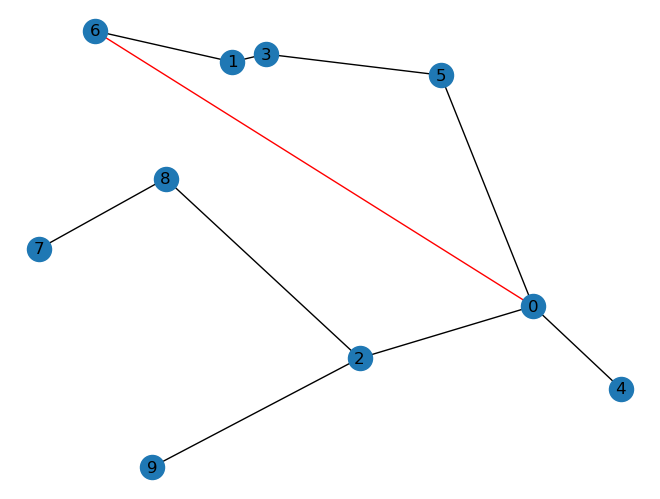

added edges [(0, 6)]
min cc 0.2903225806451613
budget -0.007899775891720306
-----------------------------------------------
(0, 6, 7)
edge (0, 6)
edge (6, 7)
done False


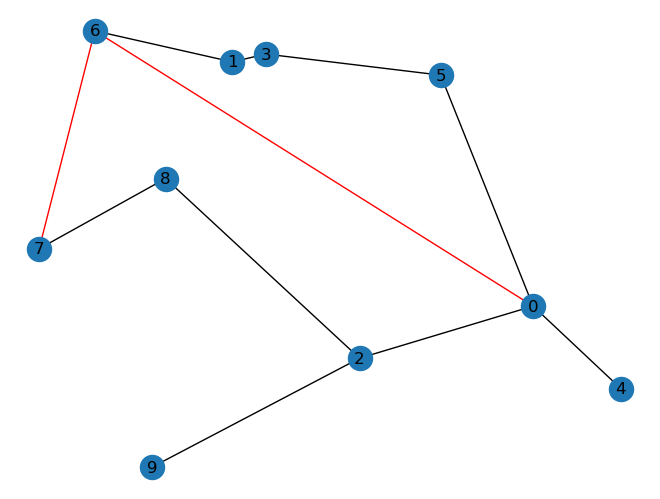

added edges [(0, 6), (6, 7)]
min cc 0.36
budget 0.06193166693279256
-----------------------------------------------
(0, 6, 8)
edge (0, 6)
edge (6, 8)
done False


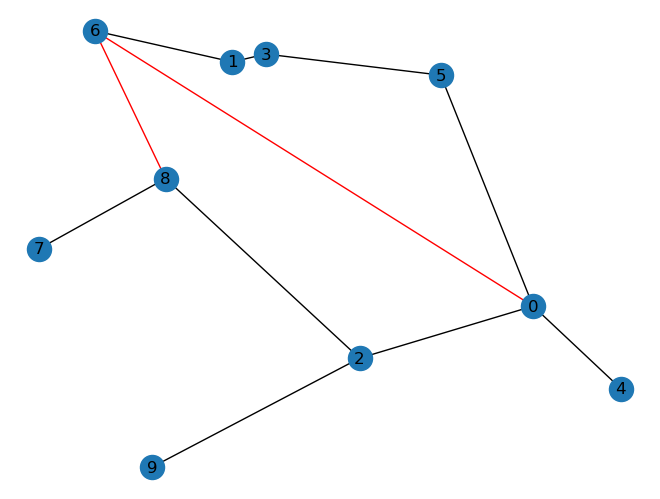

added edges [(0, 6), (6, 8)]
min cc 0.34615384615384615
budget 0.20879598032978514
-----------------------------------------------
(0, 6, 9)
edge (0, 6)
out of budget
edge (6, 9)
done False


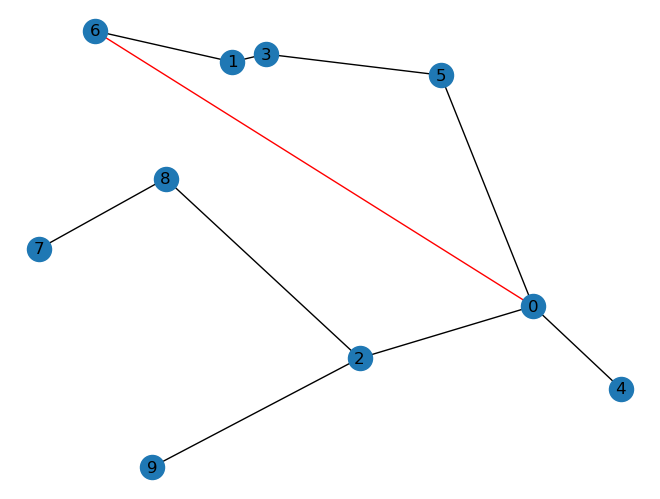

added edges [(0, 6)]
min cc 0.2903225806451613
budget -0.42488982806403075
-----------------------------------------------
(0, 7, 1)
edge (0, 7)
edge (7, 1)
done False


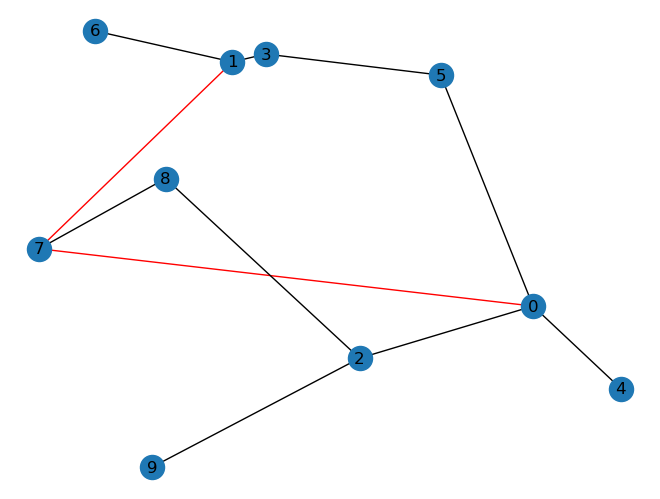

added edges [(0, 7), (7, 1)]
min cc 0.3333333333333333
budget 0.16826352408452927
-----------------------------------------------
(0, 7, 2)
edge (0, 7)
edge (7, 2)
done False


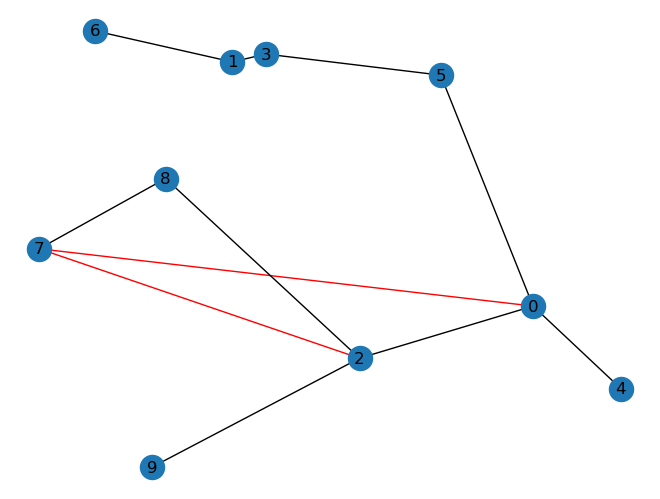

added edges [(0, 7), (7, 2)]
min cc 0.24324324324324326
budget 0.11819993601863521
-----------------------------------------------
(0, 7, 3)
edge (0, 7)
edge (7, 3)
done False


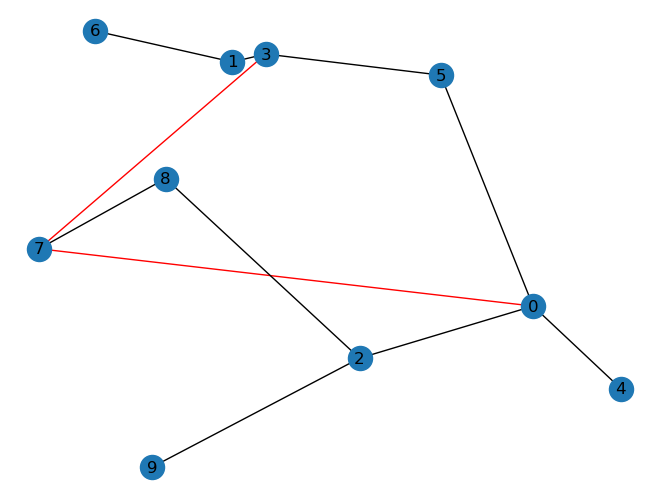

added edges [(0, 7), (7, 3)]
min cc 0.2727272727272727
budget 0.12083868464261593
-----------------------------------------------
(0, 7, 4)
edge (0, 7)
out of budget
edge (7, 4)
done False


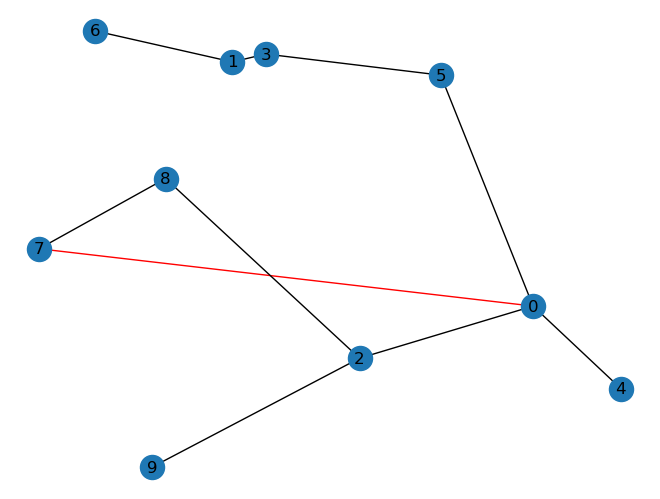

added edges [(0, 7)]
min cc 0.24324324324324326
budget -0.2999154527301573
-----------------------------------------------
(0, 7, 5)
edge (0, 7)
out of budget
edge (7, 5)
done False


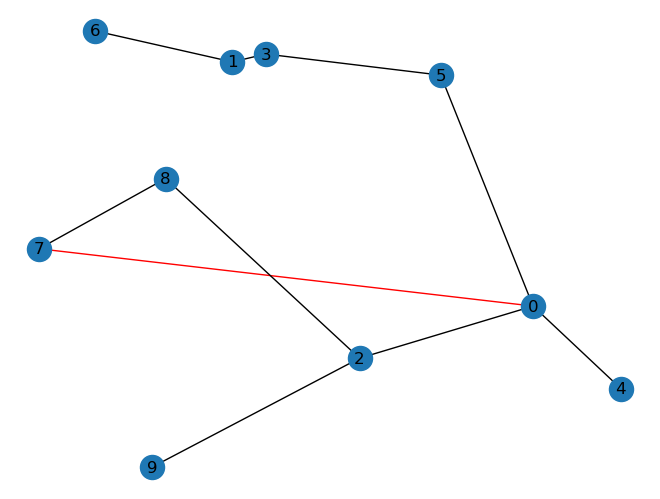

added edges [(0, 7)]
min cc 0.24324324324324326
budget -0.0657123007516831
-----------------------------------------------
(0, 7, 6)
edge (0, 7)
edge (7, 6)
done False


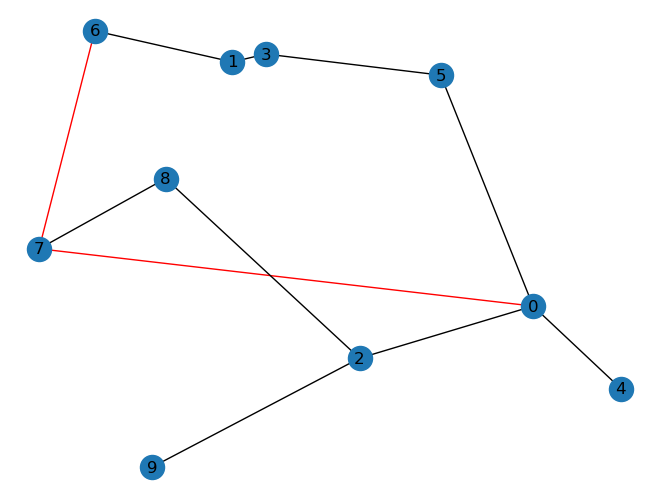

added edges [(0, 7), (7, 6)]
min cc 0.3333333333333333
budget 0.19357654689692122
-----------------------------------------------
(0, 7, 8)
edge (0, 7)
done True
-----------------------------------------------
(0, 7, 9)
edge (0, 7)
edge (7, 9)
done False


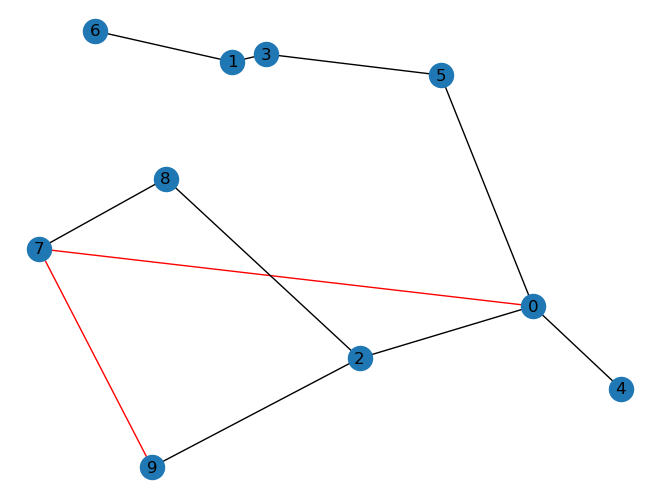

added edges [(0, 7), (7, 9)]
min cc 0.24324324324324326
budget 0.16795401833376167
-----------------------------------------------
(0, 8, 1)
edge (0, 8)
edge (8, 1)
done False


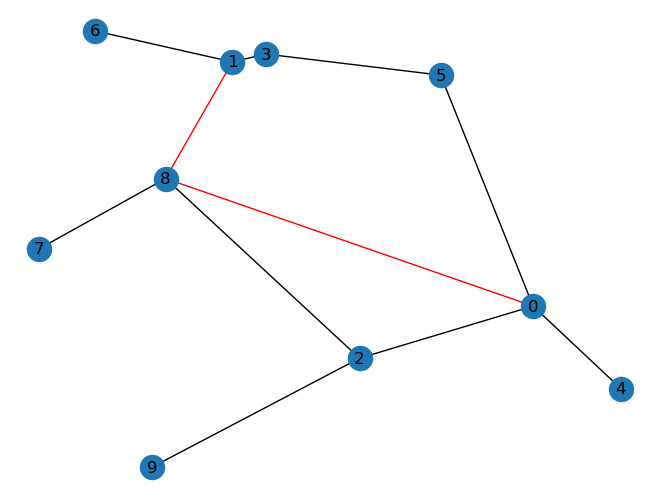

added edges [(0, 8), (8, 1)]
min cc 0.36
budget 0.5573350915698316
-----------------------------------------------
(0, 8, 2)
edge (0, 8)
done True
-----------------------------------------------
(0, 8, 3)
edge (0, 8)
edge (8, 3)
done False


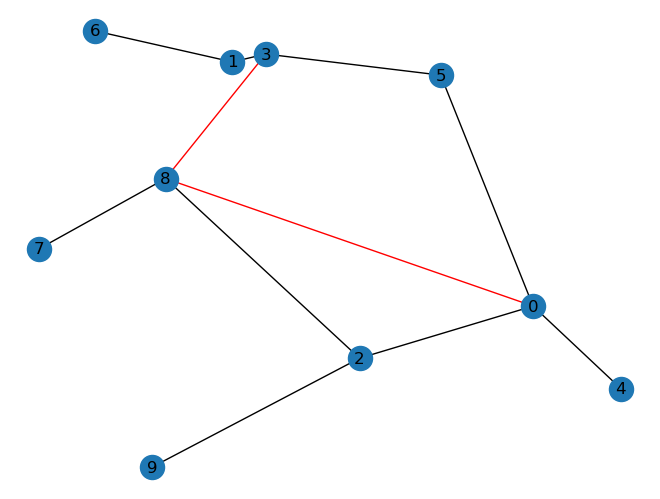

added edges [(0, 8), (8, 3)]
min cc 0.2903225806451613
budget 0.5174229303521851
-----------------------------------------------
(0, 8, 4)
edge (0, 8)
out of budget
edge (8, 4)
done False


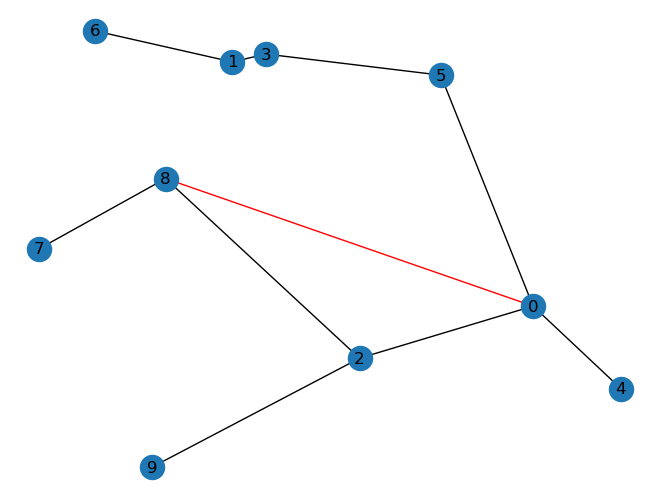

added edges [(0, 8)]
min cc 0.24324324324324326
budget -0.033647507173257485
-----------------------------------------------
(0, 8, 5)
edge (0, 8)
edge (8, 5)
done False


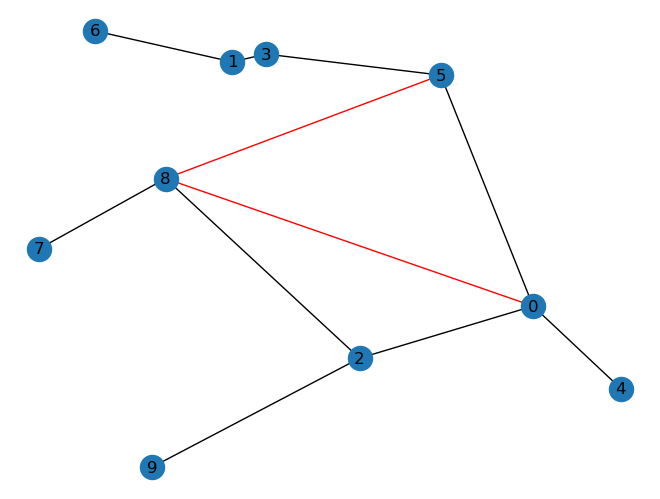

added edges [(0, 8), (8, 5)]
min cc 0.2571428571428571
budget 0.33904289246121166
-----------------------------------------------
(0, 8, 6)
edge (0, 8)
edge (8, 6)
done False


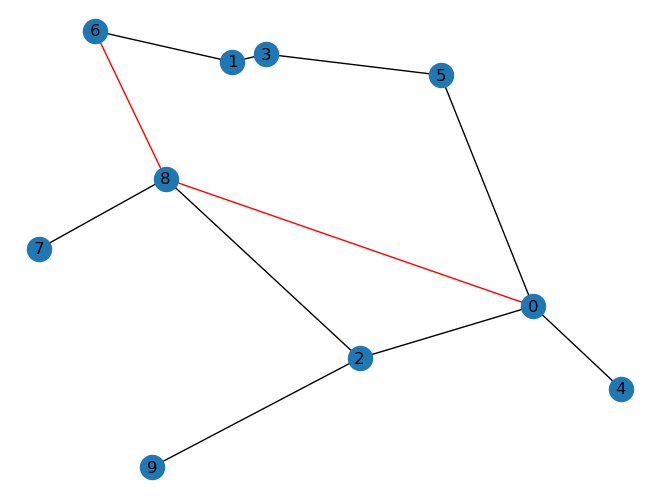

added edges [(0, 8), (8, 6)]
min cc 0.36
budget 0.4896182669297476
-----------------------------------------------
(0, 8, 7)
edge (0, 8)
done True
-----------------------------------------------
(0, 8, 9)
edge (0, 8)
edge (8, 9)
done False


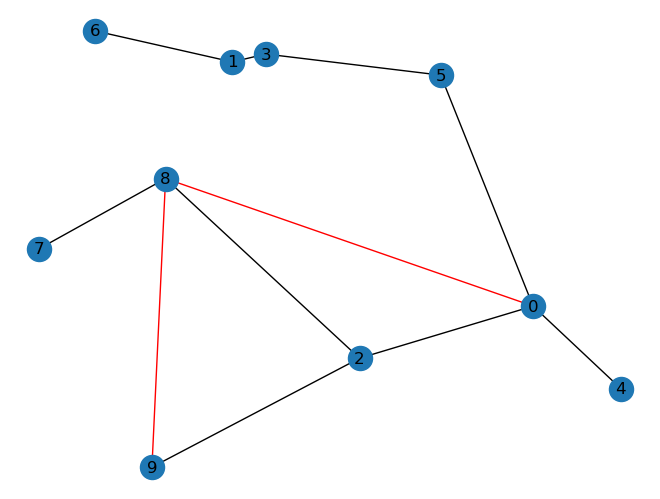

added edges [(0, 8), (8, 9)]
min cc 0.24324324324324326
budget 0.19174084484214649
-----------------------------------------------
(0, 9, 1)
edge (0, 9)
out of budget
edge (9, 1)
done False


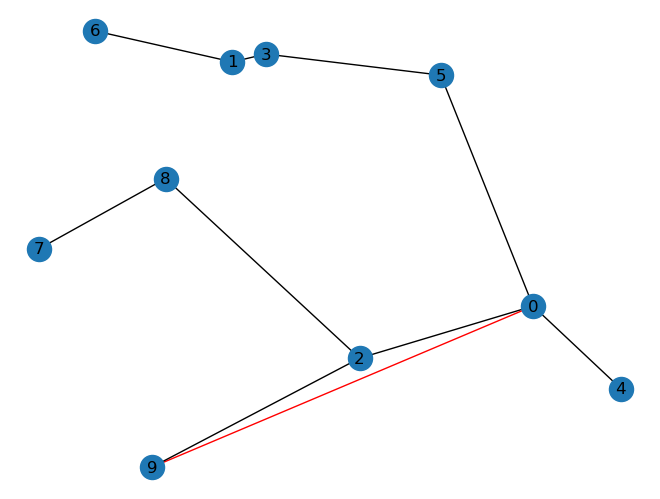

added edges [(0, 9)]
min cc 0.23684210526315788
budget -0.1339977777781166
-----------------------------------------------
(0, 9, 2)
edge (0, 9)
done True
-----------------------------------------------
(0, 9, 3)
edge (0, 9)
out of budget
edge (9, 3)
done False


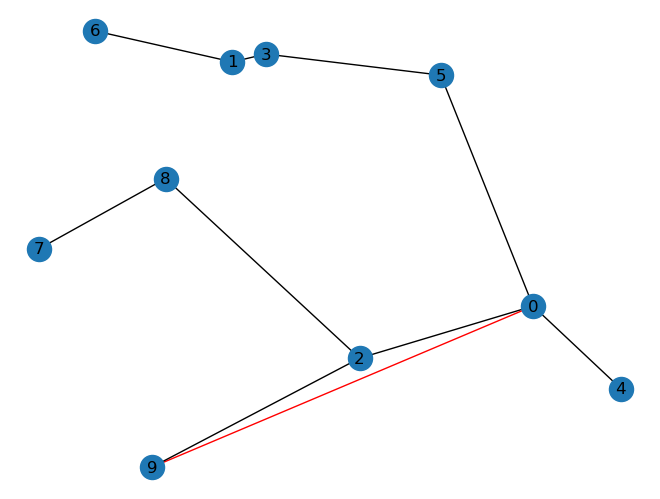

added edges [(0, 9)]
min cc 0.23684210526315788
budget -0.1606374805388605
-----------------------------------------------
(0, 9, 4)
edge (0, 9)
edge (9, 4)
done False


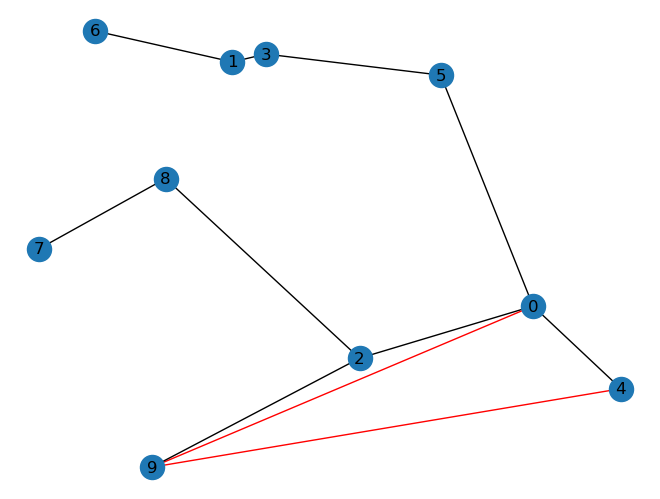

added edges [(0, 9), (9, 4)]
min cc 0.23684210526315788
budget 0.007534268673714539
-----------------------------------------------
(0, 9, 5)
edge (0, 9)
out of budget
edge (9, 5)
done False


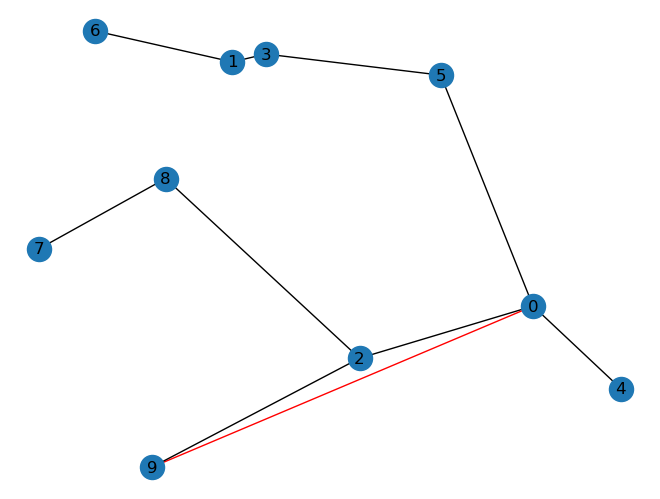

added edges [(0, 9)]
min cc 0.23684210526315788
budget -0.21109302058636115
-----------------------------------------------
(0, 9, 6)
edge (0, 9)
out of budget
edge (9, 6)
done False


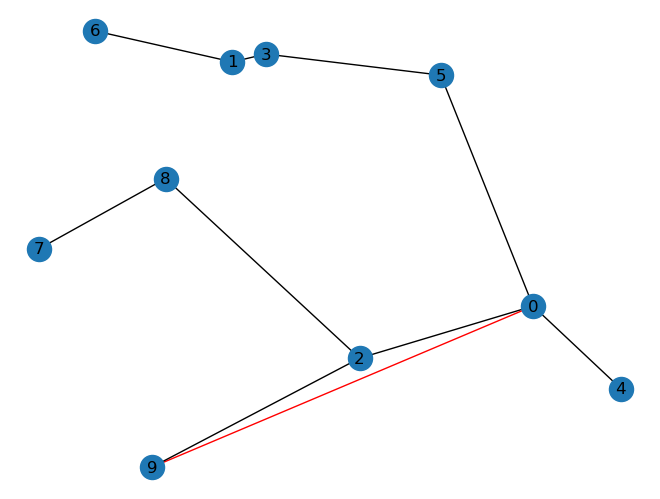

added edges [(0, 9)]
min cc 0.23684210526315788
budget -0.1990473405032912
-----------------------------------------------
(0, 9, 7)
edge (0, 9)
edge (9, 7)
done False


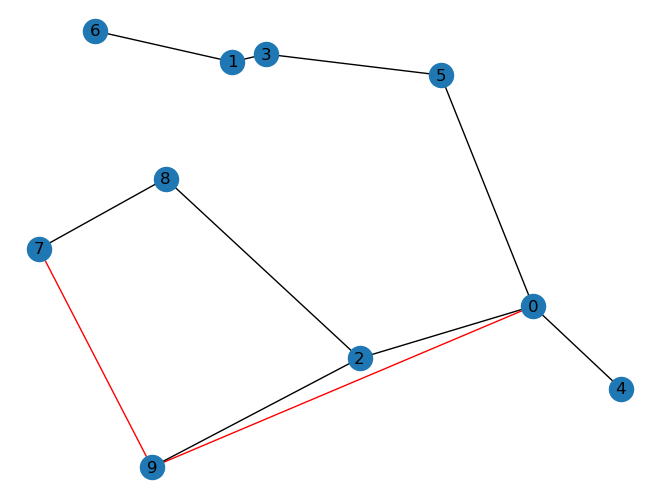

added edges [(0, 9), (9, 7)]
min cc 0.24324324324324326
budget 0.26215162593037256
-----------------------------------------------
(0, 9, 8)
edge (0, 9)
edge (9, 8)
done False


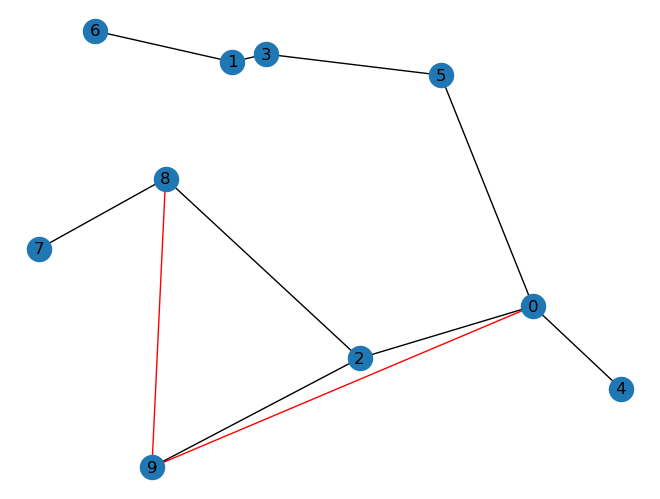

added edges [(0, 9), (9, 8)]
min cc 0.23684210526315788
budget 0.1367610458029236
-----------------------------------------------
(1, 0, 2)
edge (1, 0)
done True
-----------------------------------------------
(1, 0, 3)
edge (1, 0)
edge (0, 3)
done False


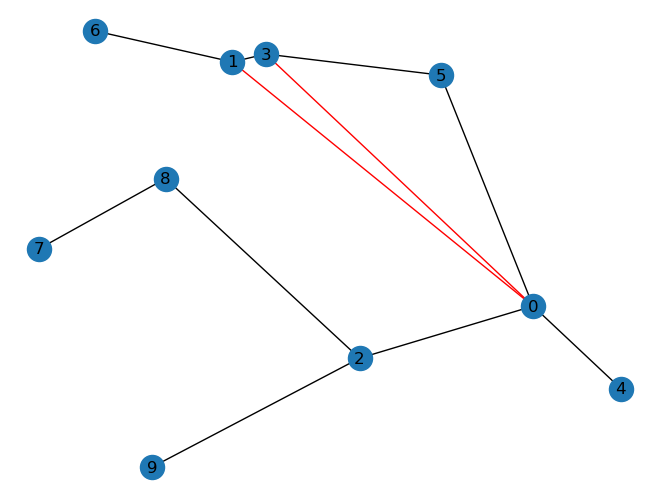

added edges [(1, 0), (0, 3)]
min cc 0.3
budget 0.05499985002147567
-----------------------------------------------
(1, 0, 4)
edge (1, 0)
done True
-----------------------------------------------
(1, 0, 5)
edge (1, 0)
done True
-----------------------------------------------
(1, 0, 6)
edge (1, 0)
out of budget
edge (0, 6)
done False


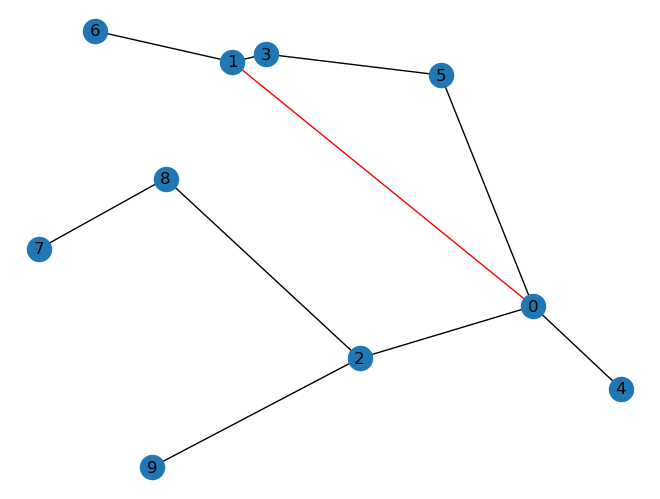

added edges [(1, 0)]
min cc 0.2903225806451613
budget -0.17295609728381756
-----------------------------------------------
(1, 0, 7)
edge (1, 0)
out of budget
edge (0, 7)
done False


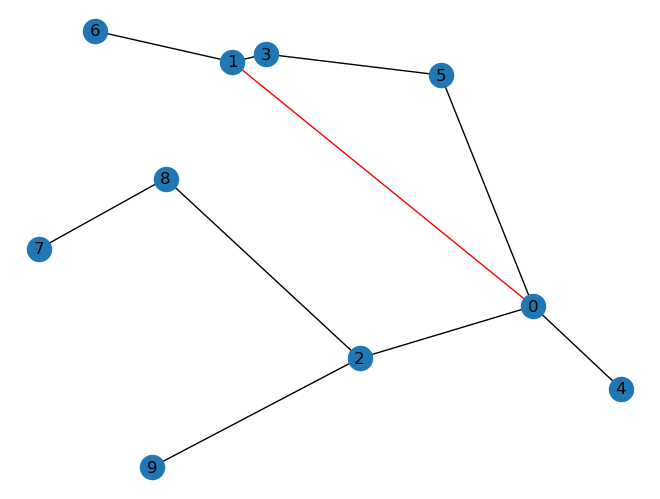

added edges [(1, 0)]
min cc 0.2903225806451613
budget -0.0413112173196889
-----------------------------------------------
(1, 0, 8)
edge (1, 0)
edge (0, 8)
done False


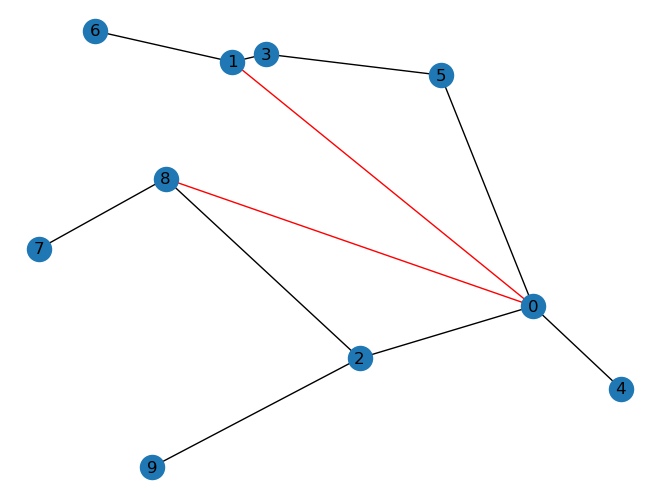

added edges [(1, 0), (0, 8)]
min cc 0.36
budget 0.10786618931614489
-----------------------------------------------
(1, 0, 9)
edge (1, 0)
edge (0, 9)
done False


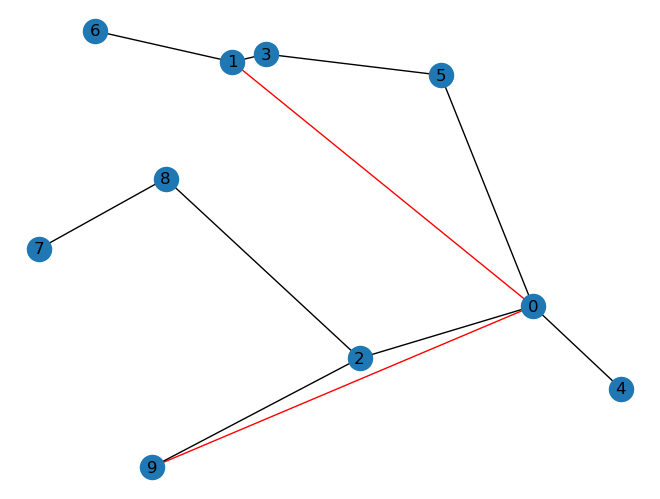

added edges [(1, 0), (0, 9)]
min cc 0.2903225806451613
budget 0.05288639027692199
-----------------------------------------------
(1, 2, 0)
edge (1, 2)
done True
-----------------------------------------------
(1, 2, 3)
edge (1, 2)
edge (2, 3)
done False


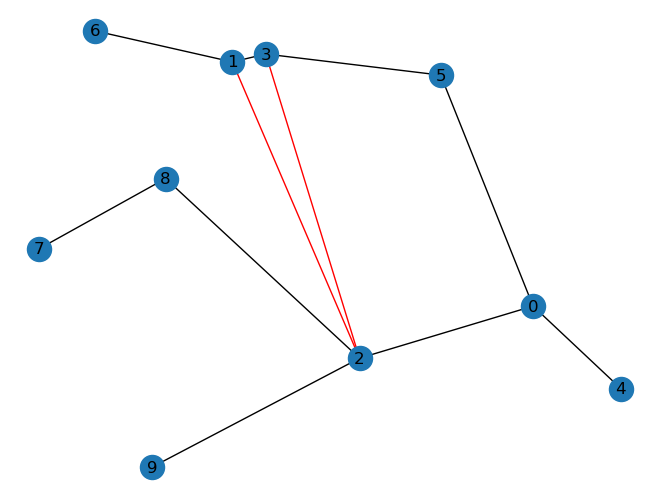

added edges [(1, 2), (2, 3)]
min cc 0.3333333333333333
budget 0.10334703158026315
-----------------------------------------------
(1, 2, 4)
edge (1, 2)
edge (2, 4)
done False


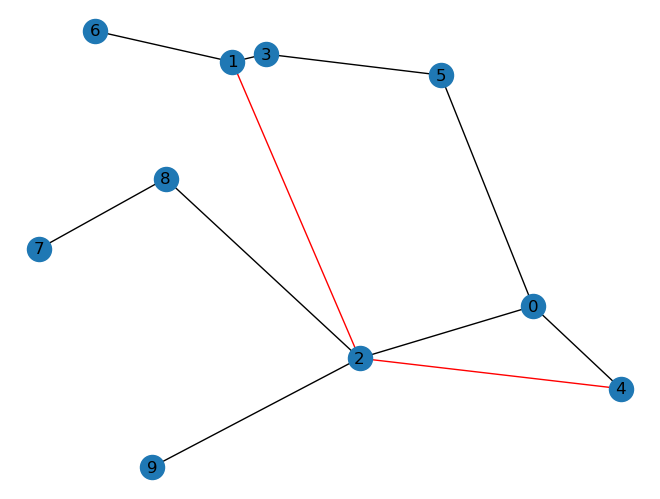

added edges [(1, 2), (2, 4)]
min cc 0.3333333333333333
budget 0.3754987967902903
-----------------------------------------------
(1, 2, 5)
edge (1, 2)
edge (2, 5)
done False


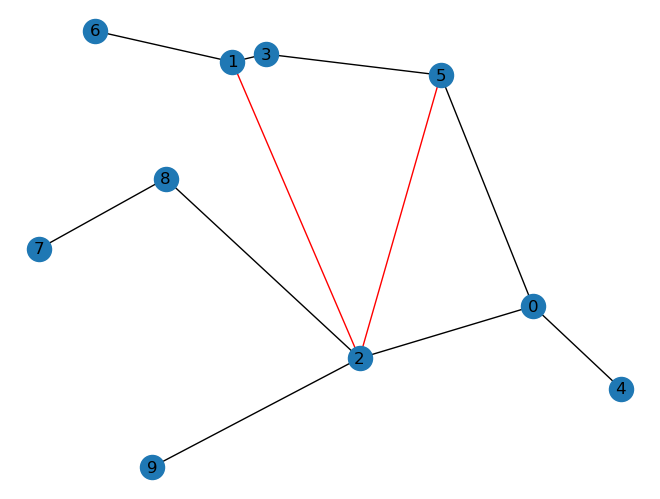

added edges [(1, 2), (2, 5)]
min cc 0.3333333333333333
budget 0.1540226461564359
-----------------------------------------------
(1, 2, 6)
edge (1, 2)
out of budget
edge (2, 6)
done False


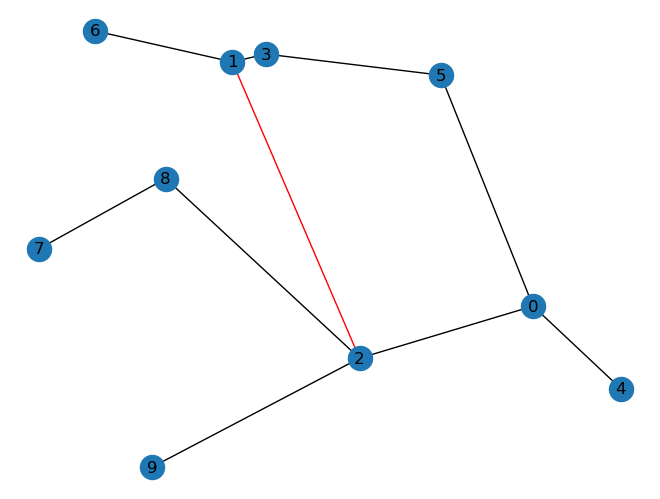

added edges [(1, 2)]
min cc 0.32142857142857145
budget -0.04751135324360045
-----------------------------------------------
(1, 2, 7)
edge (1, 2)
edge (2, 7)
done False


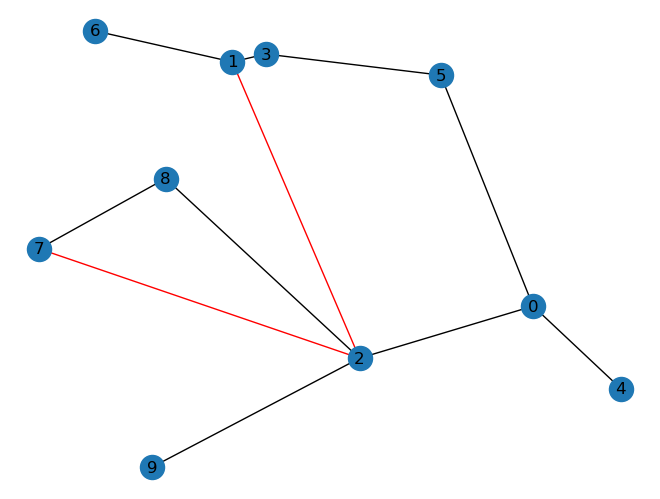

added edges [(1, 2), (2, 7)]
min cc 0.375
budget 0.2301585220532434
-----------------------------------------------
(1, 2, 8)
edge (1, 2)
done True
-----------------------------------------------
(1, 2, 9)
edge (1, 2)
done True
-----------------------------------------------
(1, 3, 0)
done True
-----------------------------------------------
(1, 3, 2)
done True
-----------------------------------------------
(1, 3, 4)
done True
-----------------------------------------------
(1, 3, 5)
done True
-----------------------------------------------
(1, 3, 6)
done True
-----------------------------------------------
(1, 3, 7)
done True
-----------------------------------------------
(1, 3, 8)
done True
-----------------------------------------------
(1, 3, 9)
done True
-----------------------------------------------
(1, 4, 0)
edge (1, 4)
done True
-----------------------------------------------
(1, 4, 2)
edge (1, 4)
edge (4, 2)
done False


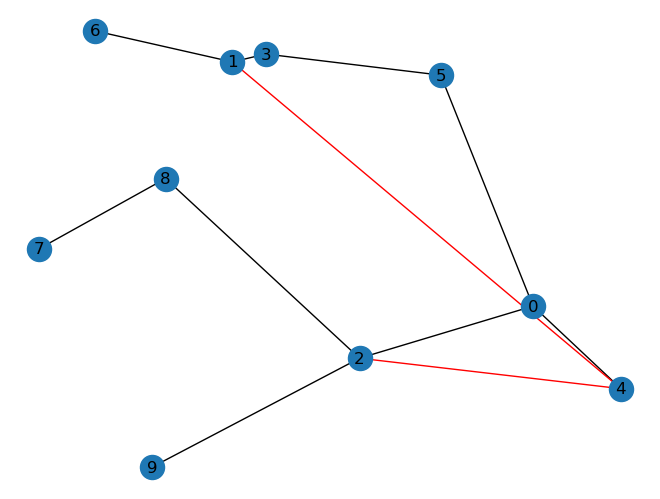

added edges [(1, 4), (4, 2)]
min cc 0.3
budget 0.10618273792381361
-----------------------------------------------
(1, 4, 3)
edge (1, 4)
out of budget
edge (4, 3)
done False


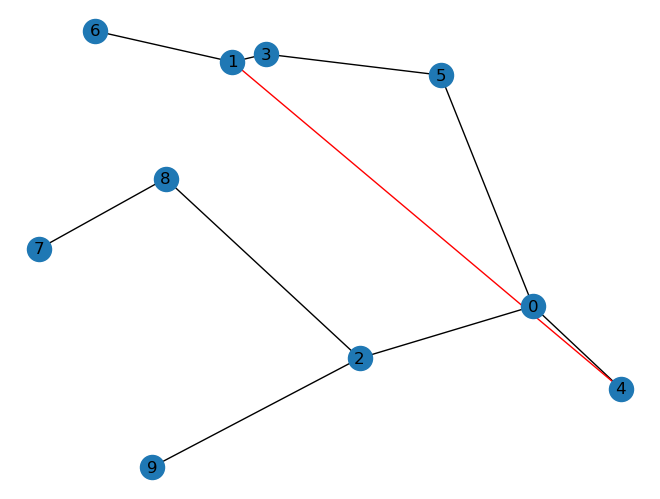

added edges [(1, 4)]
min cc 0.2727272727272727
budget -0.4118102860210646
-----------------------------------------------
(1, 4, 5)
edge (1, 4)
out of budget
edge (4, 5)
done False


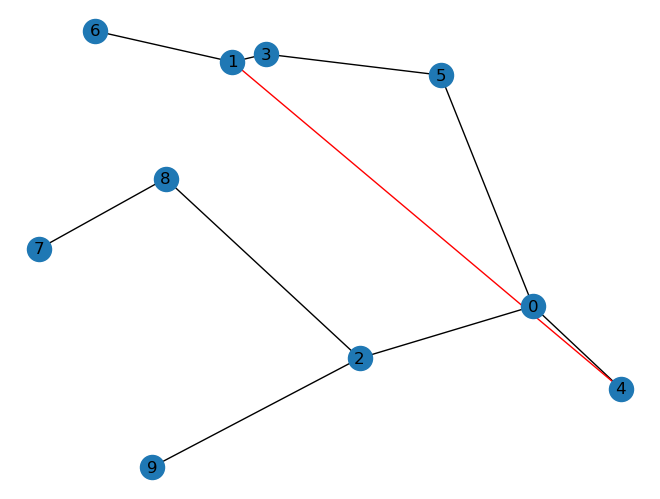

added edges [(1, 4)]
min cc 0.2727272727272727
budget -0.2281789235026499
-----------------------------------------------
(1, 4, 6)
edge (1, 4)
out of budget
edge (4, 6)
done False


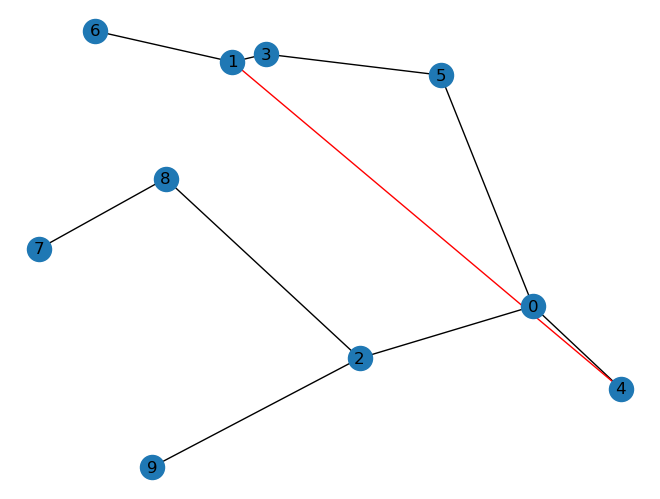

added edges [(1, 4)]
min cc 0.2727272727272727
budget -0.6360314213373278
-----------------------------------------------
(1, 4, 7)
edge (1, 4)
out of budget
edge (4, 7)
done False


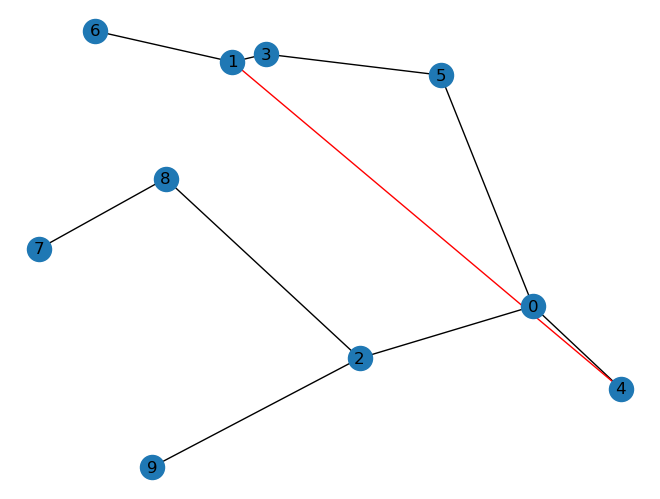

added edges [(1, 4)]
min cc 0.2727272727272727
budget -0.4572729255620258
-----------------------------------------------
(1, 4, 8)
edge (1, 4)
out of budget
edge (4, 8)
done False


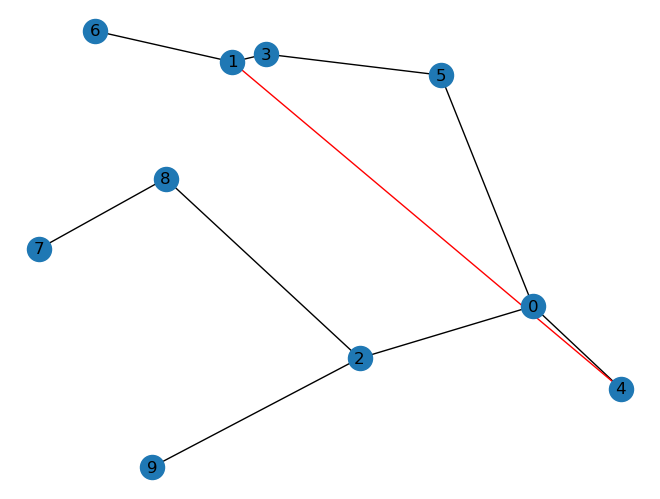

added edges [(1, 4)]
min cc 0.2727272727272727
budget -0.3401823866409598
-----------------------------------------------
(1, 4, 9)
edge (1, 4)
out of budget
edge (4, 9)
done False


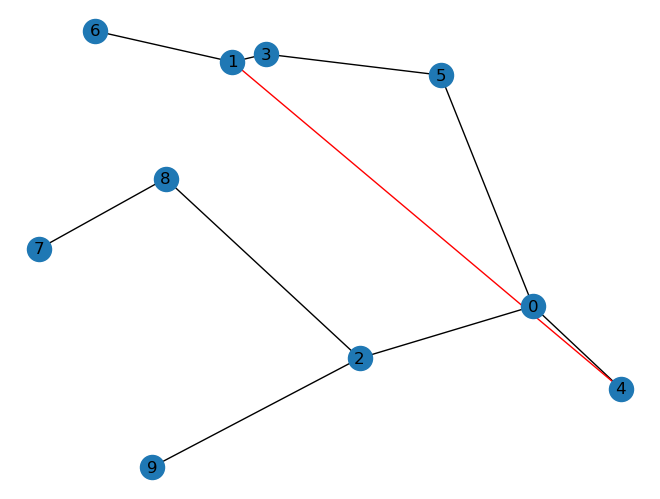

added edges [(1, 4)]
min cc 0.2727272727272727
budget -0.24402081175476487
-----------------------------------------------
(1, 5, 0)
edge (1, 5)
done True
-----------------------------------------------
(1, 5, 2)
edge (1, 5)
edge (5, 2)
done False


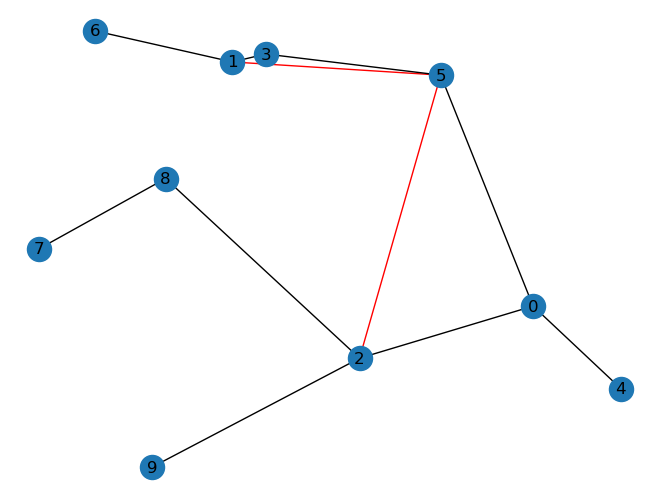

added edges [(1, 5), (5, 2)]
min cc 0.3103448275862069
budget 0.5127430014920811
-----------------------------------------------
(1, 5, 3)
edge (1, 5)
done True
-----------------------------------------------
(1, 5, 4)
edge (1, 5)
edge (5, 4)
done False


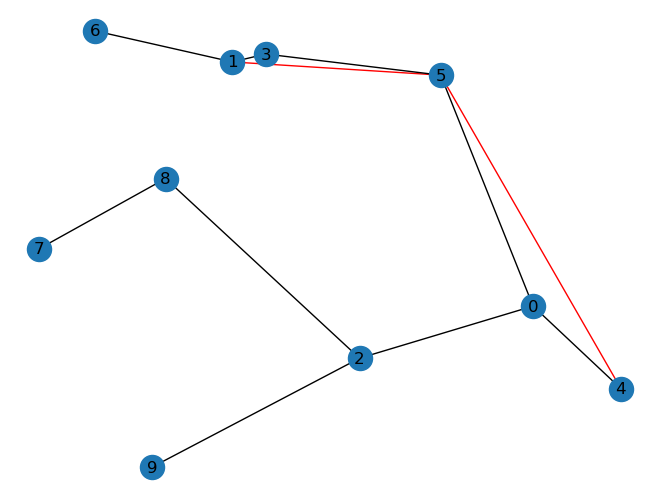

added edges [(1, 5), (5, 4)]
min cc 0.2727272727272727
budget 0.39985749069947196
-----------------------------------------------
(1, 5, 6)
edge (1, 5)
edge (5, 6)
done False


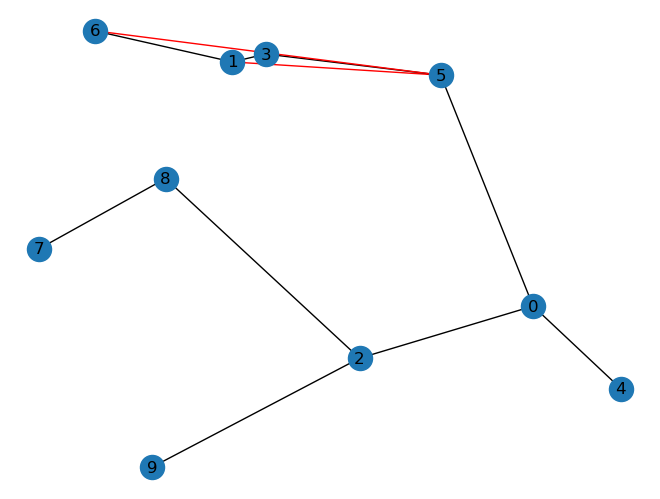

added edges [(1, 5), (5, 6)]
min cc 0.28125
budget 0.5944240454426617
-----------------------------------------------
(1, 5, 7)
edge (1, 5)
edge (5, 7)
done False


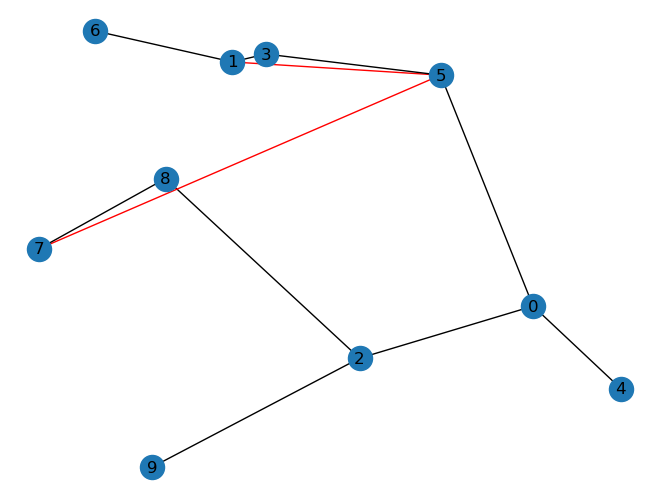

added edges [(1, 5), (5, 7)]
min cc 0.32142857142857145
budget 0.40496664061857024
-----------------------------------------------
(1, 5, 8)
edge (1, 5)
edge (5, 8)
done False


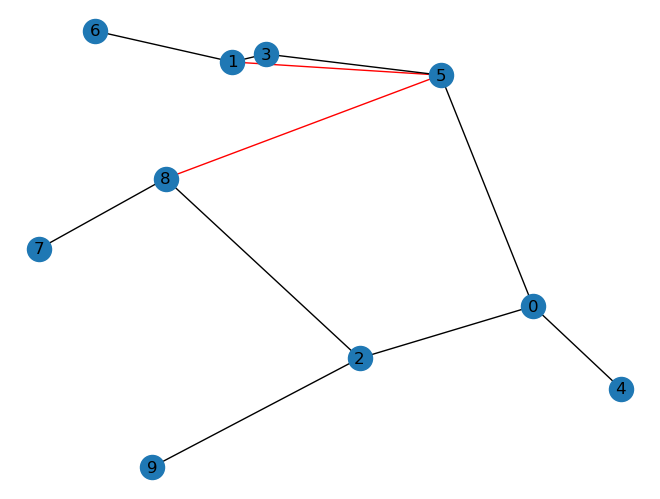

added edges [(1, 5), (5, 8)]
min cc 0.32142857142857145
budget 0.6605444271956312
-----------------------------------------------
(1, 5, 9)
edge (1, 5)
edge (5, 9)
done False


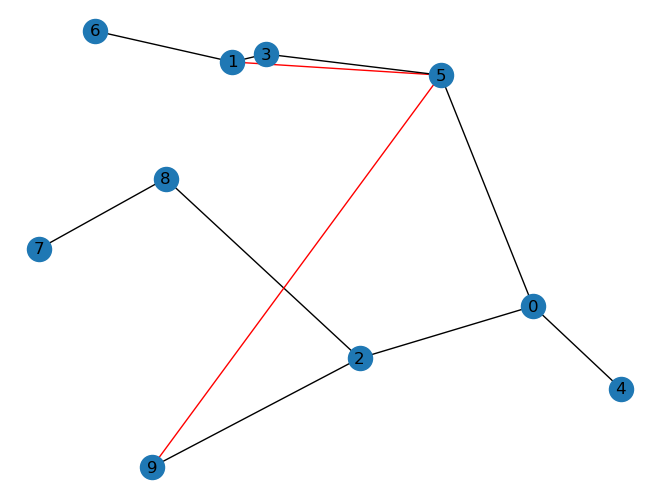

added edges [(1, 5), (5, 9)]
min cc 0.2727272727272727
budget 0.1653883131872813
-----------------------------------------------
(1, 6, 0)
done True
-----------------------------------------------
(1, 6, 2)
done True
-----------------------------------------------
(1, 6, 3)
done True
-----------------------------------------------
(1, 6, 4)
done True
-----------------------------------------------
(1, 6, 5)
done True
-----------------------------------------------
(1, 6, 7)
done True
-----------------------------------------------
(1, 6, 8)
done True
-----------------------------------------------
(1, 6, 9)
done True
-----------------------------------------------
(1, 7, 0)
edge (1, 7)
edge (7, 0)
done False


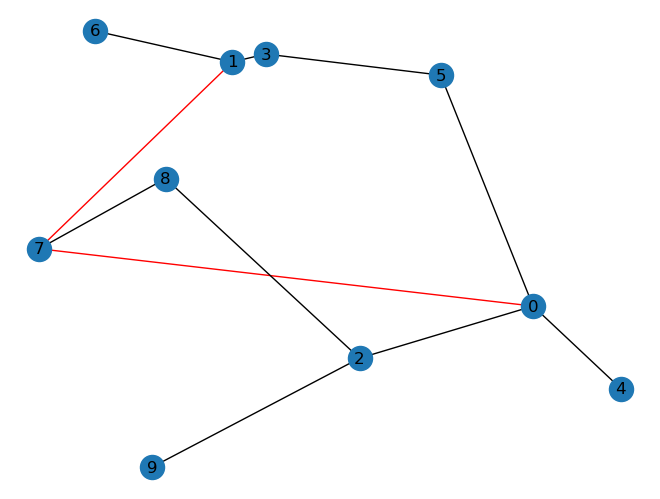

added edges [(1, 7), (7, 0)]
min cc 0.3333333333333333
budget 0.16826352408452927
-----------------------------------------------
(1, 7, 2)
edge (1, 7)
edge (7, 2)
done False


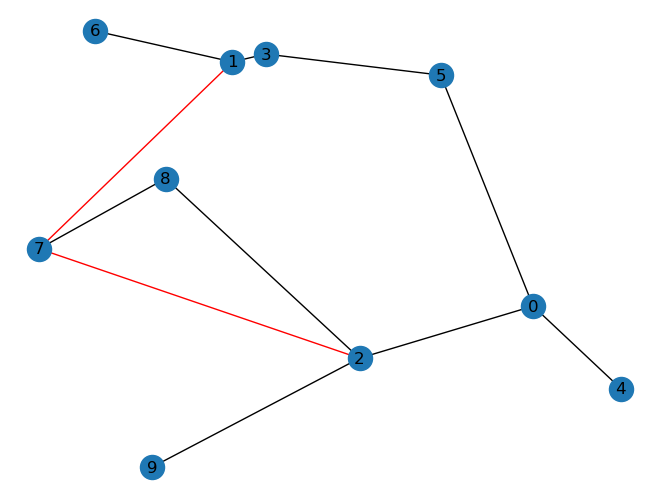

added edges [(1, 7), (7, 2)]
min cc 0.3333333333333333
budget 0.40359297289280416
-----------------------------------------------
(1, 7, 3)
edge (1, 7)
edge (7, 3)
done False


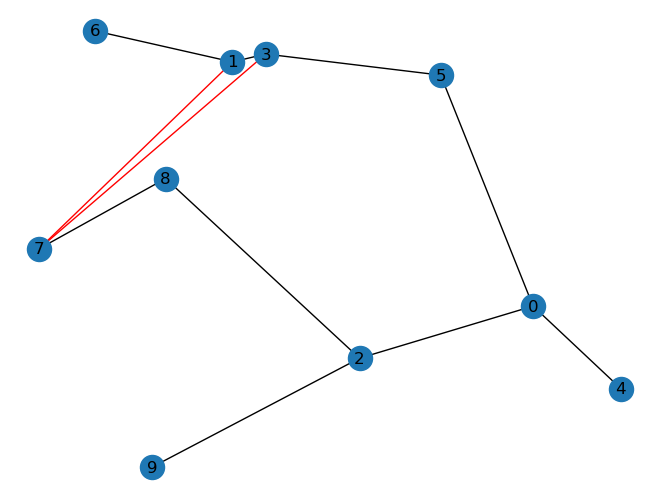

added edges [(1, 7), (7, 3)]
min cc 0.3103448275862069
budget 0.4062317215167849
-----------------------------------------------
(1, 7, 4)
edge (1, 7)
out of budget
edge (7, 4)
done False


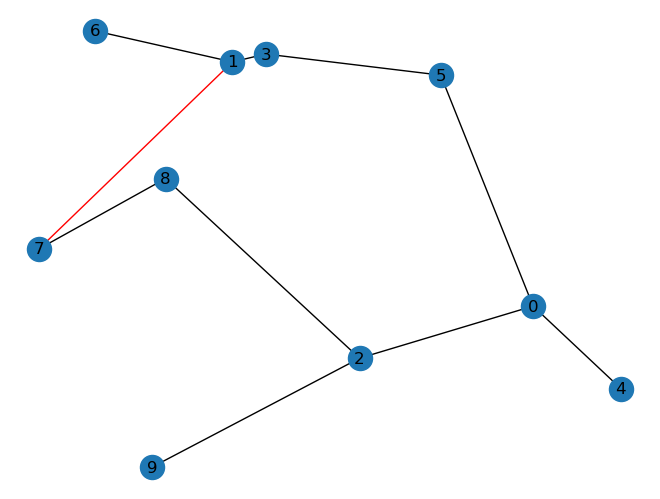

added edges [(1, 7)]
min cc 0.3103448275862069
budget -0.014522415855988347
-----------------------------------------------
(1, 7, 5)
edge (1, 7)
edge (7, 5)
done False


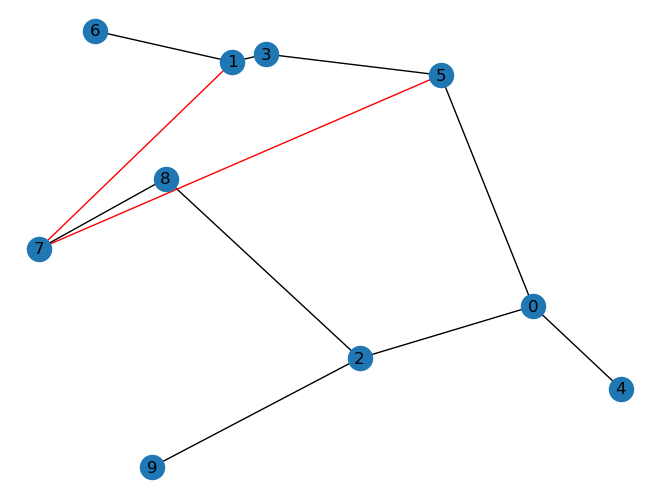

added edges [(1, 7), (7, 5)]
min cc 0.3103448275862069
budget 0.21968073612248584
-----------------------------------------------
(1, 7, 6)
edge (1, 7)
edge (7, 6)
done False


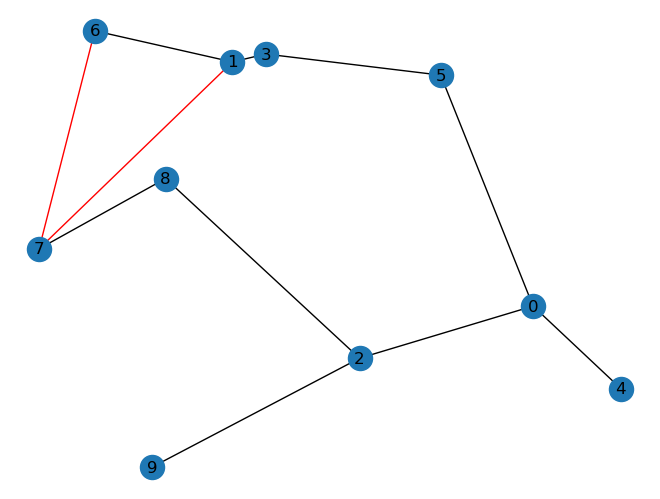

added edges [(1, 7), (7, 6)]
min cc 0.3333333333333333
budget 0.47896958377109017
-----------------------------------------------
(1, 7, 8)
edge (1, 7)
done True
-----------------------------------------------
(1, 7, 9)
edge (1, 7)
edge (7, 9)
done False


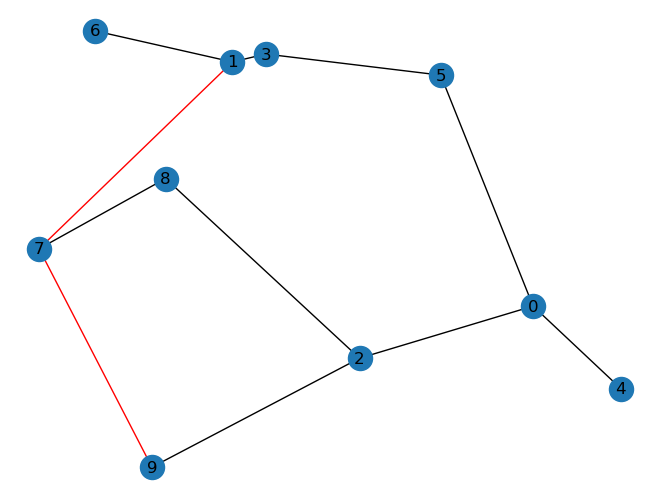

added edges [(1, 7), (7, 9)]
min cc 0.3333333333333333
budget 0.4533470552079306
-----------------------------------------------
(1, 8, 0)
edge (1, 8)
edge (8, 0)
done False


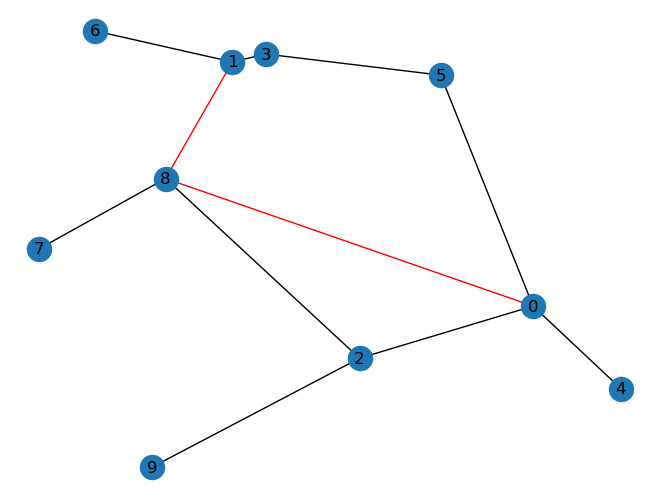

added edges [(1, 8), (8, 0)]
min cc 0.36
budget 0.5573350915698315
-----------------------------------------------
(1, 8, 2)
edge (1, 8)
done True
-----------------------------------------------
(1, 8, 3)
edge (1, 8)
edge (8, 3)
done False


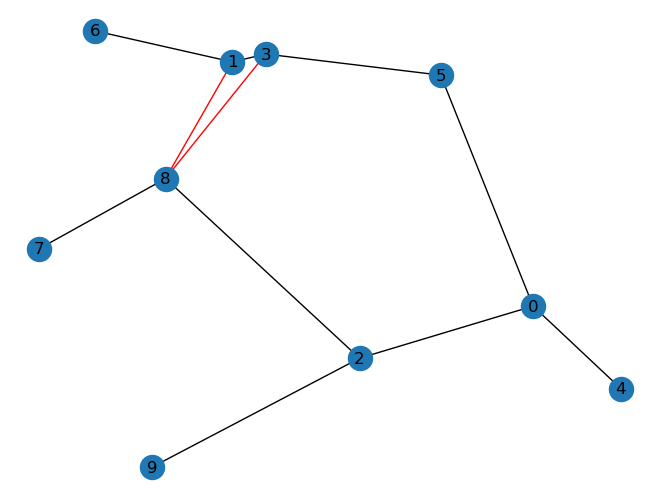

added edges [(1, 8), (8, 3)]
min cc 0.3333333333333333
budget 0.8935327214399886
-----------------------------------------------
(1, 8, 4)
edge (1, 8)
edge (8, 4)
done False


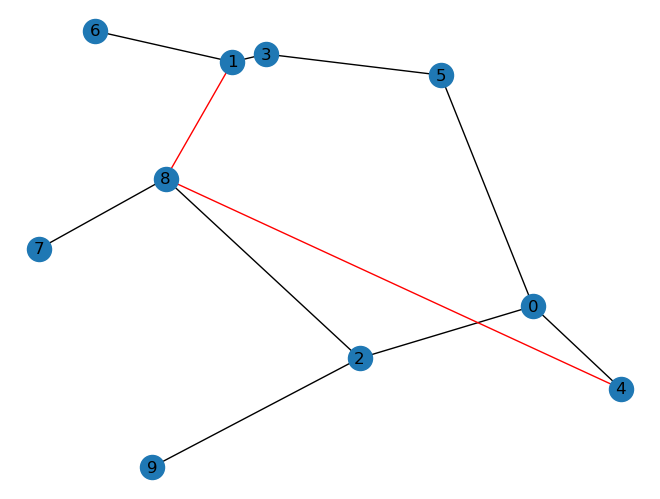

added edges [(1, 8), (8, 4)]
min cc 0.36
budget 0.34246228391454614
-----------------------------------------------
(1, 8, 5)
edge (1, 8)
edge (8, 5)
done False


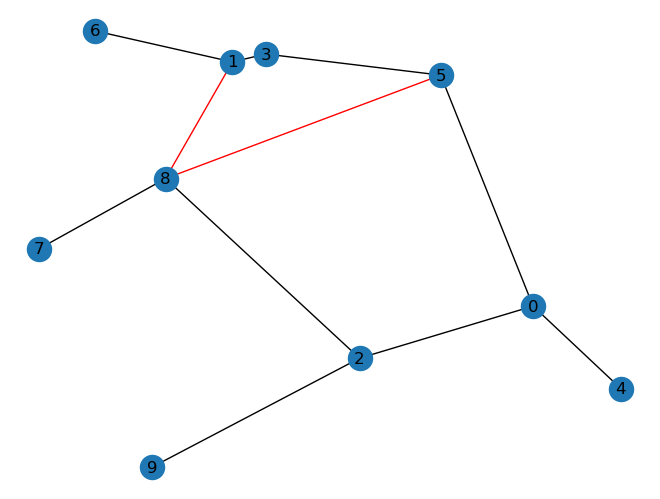

added edges [(1, 8), (8, 5)]
min cc 0.3333333333333333
budget 0.7151526835490153
-----------------------------------------------
(1, 8, 6)
edge (1, 8)
edge (8, 6)
done False


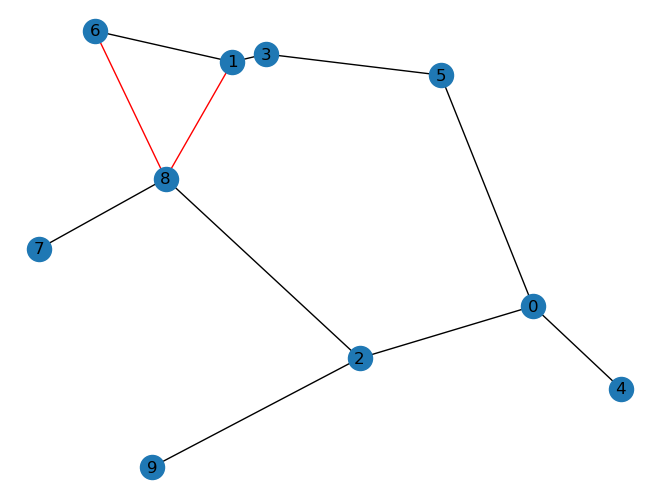

added edges [(1, 8), (8, 6)]
min cc 0.34615384615384615
budget 0.8657280580175513
-----------------------------------------------
(1, 8, 7)
edge (1, 8)
done True
-----------------------------------------------
(1, 8, 9)
edge (1, 8)
edge (8, 9)
done False


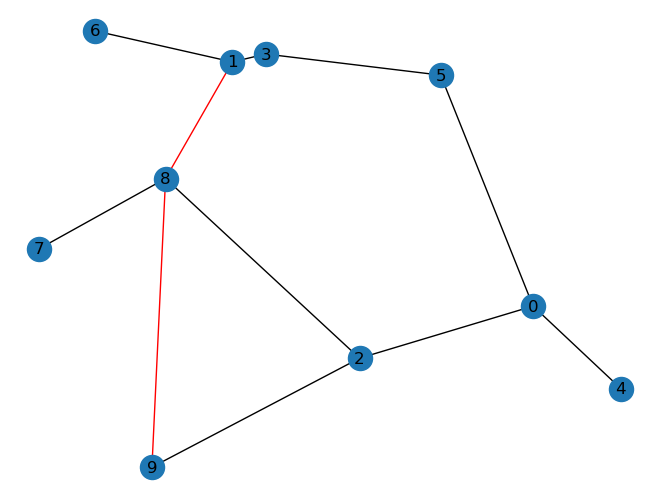

added edges [(1, 8), (8, 9)]
min cc 0.3333333333333333
budget 0.5678506359299501
-----------------------------------------------
(1, 9, 0)
edge (1, 9)
out of budget
edge (9, 0)
done False


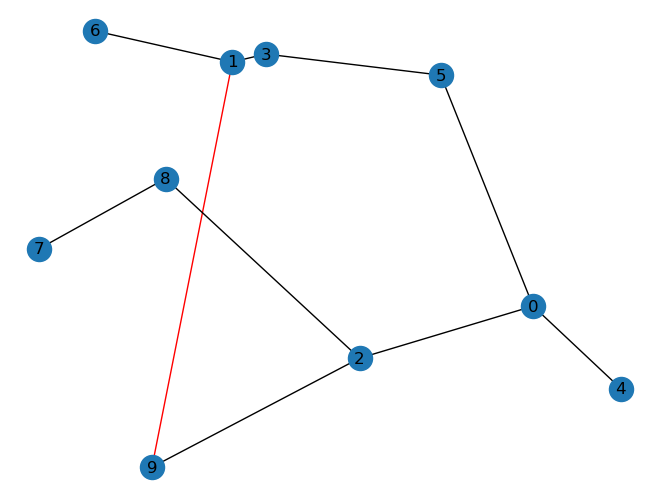

added edges [(1, 9)]
min cc 0.2903225806451613
budget -0.1339977777781166
-----------------------------------------------
(1, 9, 2)
edge (1, 9)
done True
-----------------------------------------------
(1, 9, 3)
edge (1, 9)
out of budget
edge (9, 3)
done False


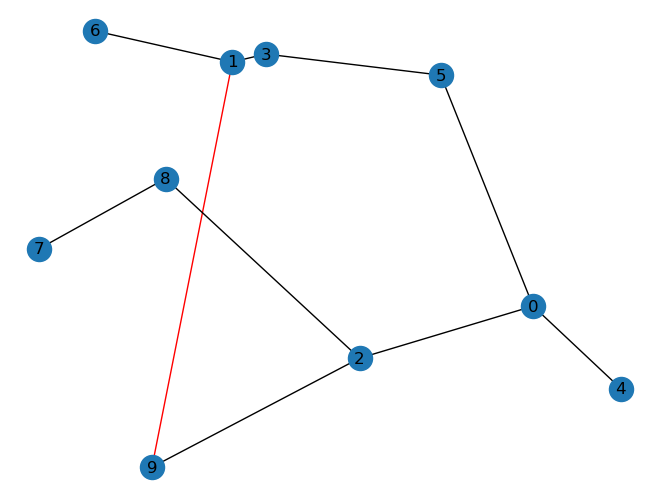

added edges [(1, 9)]
min cc 0.2903225806451613
budget -0.3659009607205592
-----------------------------------------------
(1, 9, 4)
edge (1, 9)
out of budget
edge (9, 4)
done False


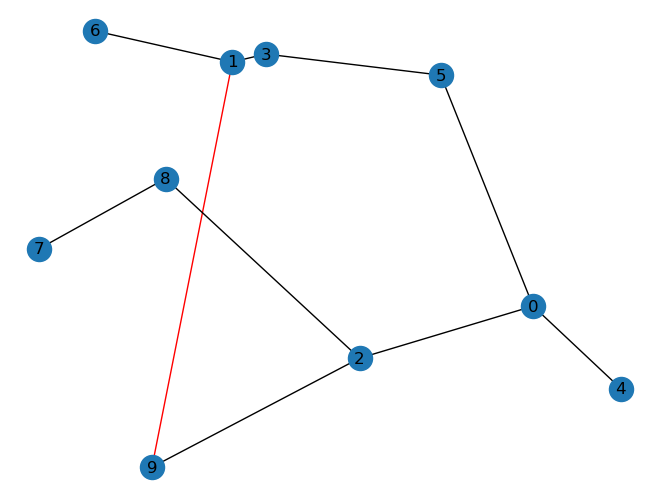

added edges [(1, 9)]
min cc 0.2903225806451613
budget -0.19772921150798417
-----------------------------------------------
(1, 9, 5)
edge (1, 9)
out of budget
edge (9, 5)
done False


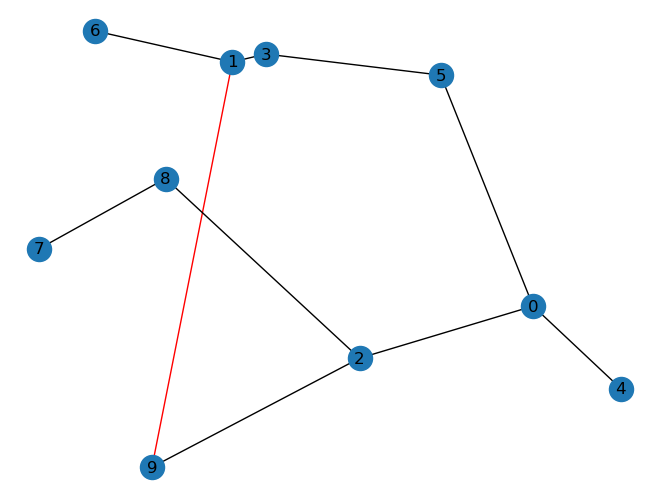

added edges [(1, 9)]
min cc 0.2903225806451613
budget -0.41635650076805986
-----------------------------------------------
(1, 9, 6)
edge (1, 9)
out of budget
edge (9, 6)
done False


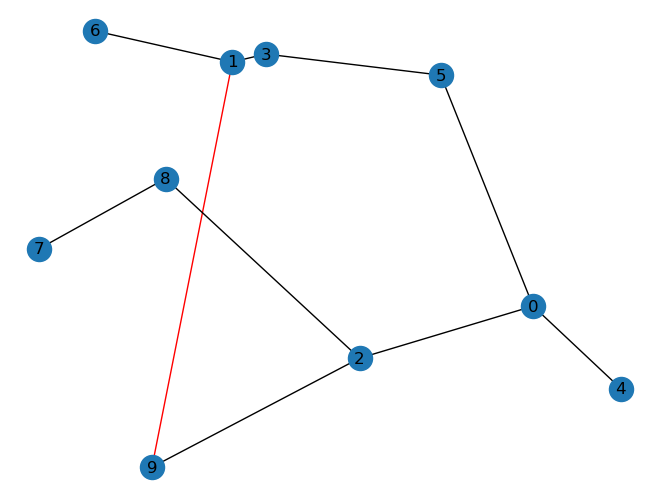

added edges [(1, 9)]
min cc 0.2903225806451613
budget -0.4043108206849899
-----------------------------------------------
(1, 9, 7)
edge (1, 9)
edge (9, 7)
done False


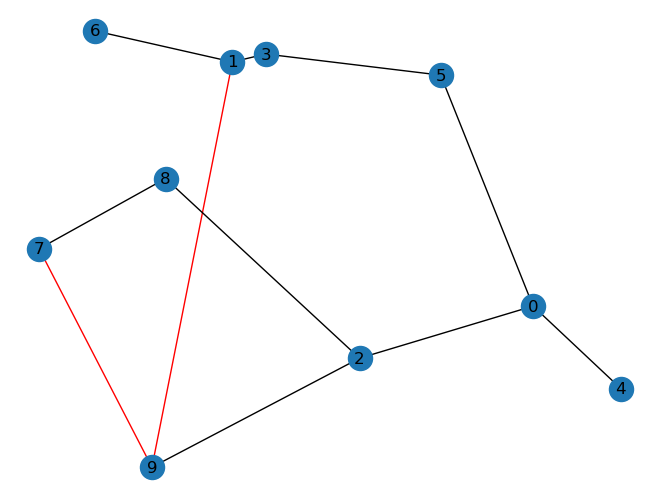

added edges [(1, 9), (9, 7)]
min cc 0.3333333333333333
budget 0.056888145748673846
-----------------------------------------------
(1, 9, 8)
edge (1, 9)
out of budget
edge (9, 8)
done False


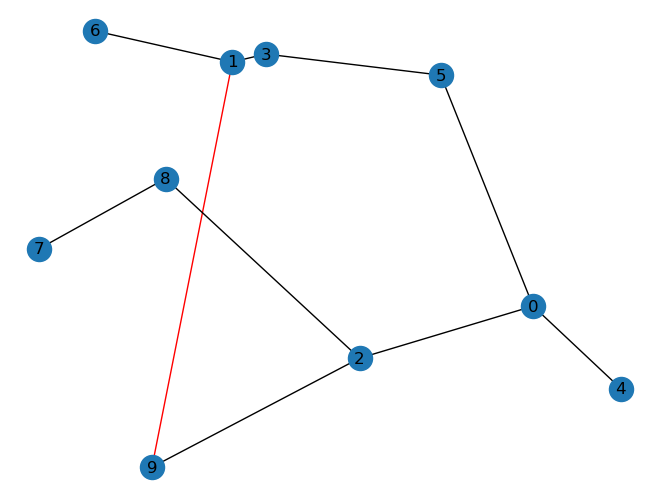

added edges [(1, 9)]
min cc 0.2903225806451613
budget -0.06850243437877512
-----------------------------------------------
(2, 0, 1)
done True
-----------------------------------------------
(2, 0, 3)
done True
-----------------------------------------------
(2, 0, 4)
done True
-----------------------------------------------
(2, 0, 5)
done True
-----------------------------------------------
(2, 0, 6)
done True
-----------------------------------------------
(2, 0, 7)
done True
-----------------------------------------------
(2, 0, 8)
done True
-----------------------------------------------
(2, 0, 9)
done True
-----------------------------------------------
(2, 1, 0)
edge (2, 1)
edge (1, 0)
done False


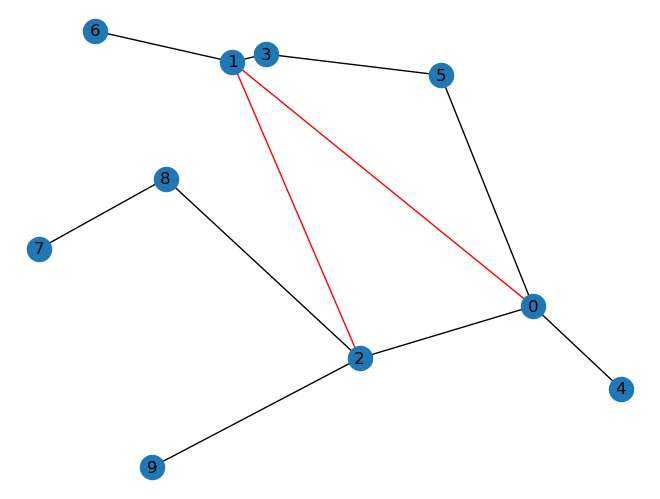

added edges [(2, 1), (1, 0)]
min cc 0.32142857142857145
budget 0.07064736871491928
-----------------------------------------------
(2, 1, 3)
edge (2, 1)
done True
-----------------------------------------------
(2, 1, 4)
edge (2, 1)
out of budget
edge (1, 4)
done False


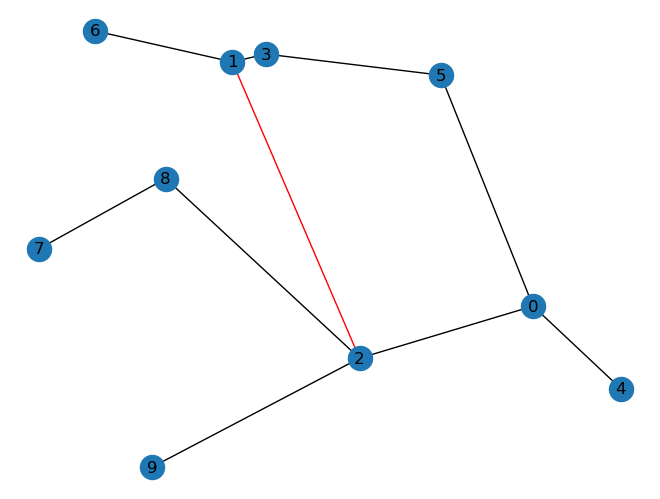

added edges [(2, 1)]
min cc 0.32142857142857145
budget -0.16252839958690002
-----------------------------------------------
(2, 1, 5)
edge (2, 1)
edge (1, 5)
done False


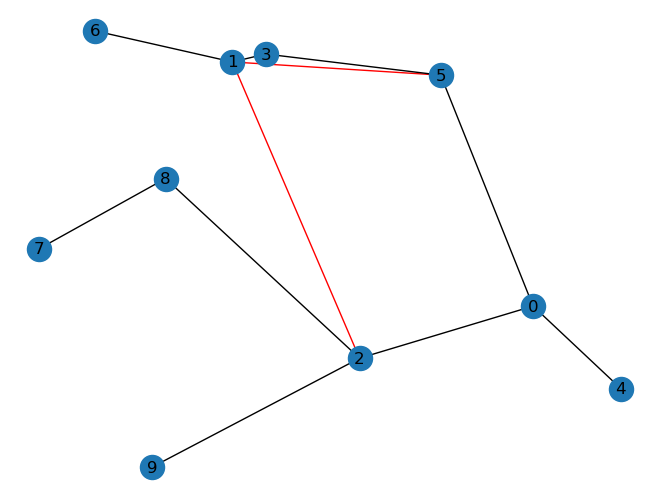

added edges [(2, 1), (1, 5)]
min cc 0.32142857142857145
budget 0.46550801461522195
-----------------------------------------------
(2, 1, 6)
edge (2, 1)
done True
-----------------------------------------------
(2, 1, 7)
edge (2, 1)
edge (1, 7)
done False


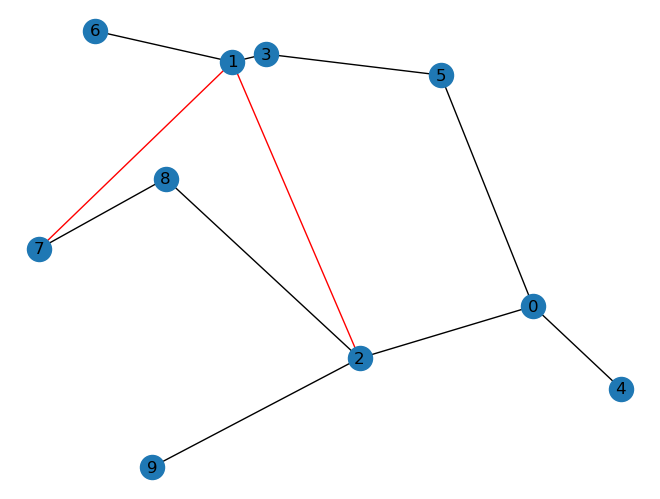

added edges [(2, 1), (1, 7)]
min cc 0.36
budget 0.28022211011913745
-----------------------------------------------
(2, 1, 8)
edge (2, 1)
edge (1, 8)
done False


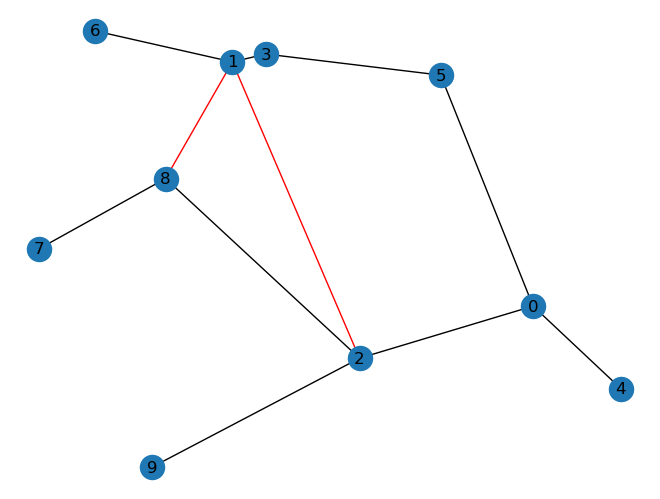

added edges [(2, 1), (1, 8)]
min cc 0.36
budget 0.520116270968606
-----------------------------------------------
(2, 1, 9)
edge (2, 1)
out of budget
edge (1, 9)
done False


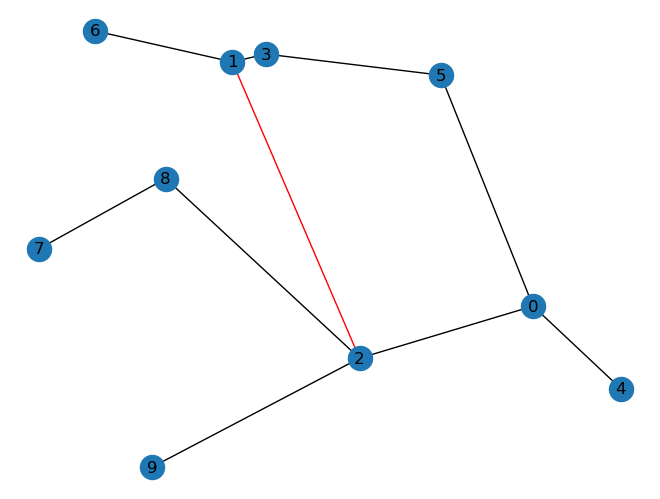

added edges [(2, 1)]
min cc 0.32142857142857145
budget -0.11623679934011932
-----------------------------------------------
(2, 3, 0)
edge (2, 3)
edge (3, 0)
done False


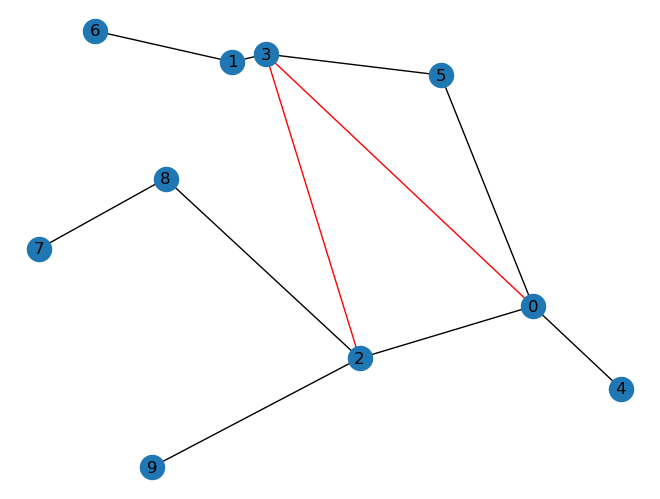

added edges [(2, 3), (3, 0)]
min cc 0.3103448275862069
budget 0.08769951288681954
-----------------------------------------------
(2, 3, 1)
edge (2, 3)
done True
-----------------------------------------------
(2, 3, 4)
edge (2, 3)
out of budget
edge (3, 4)
done False


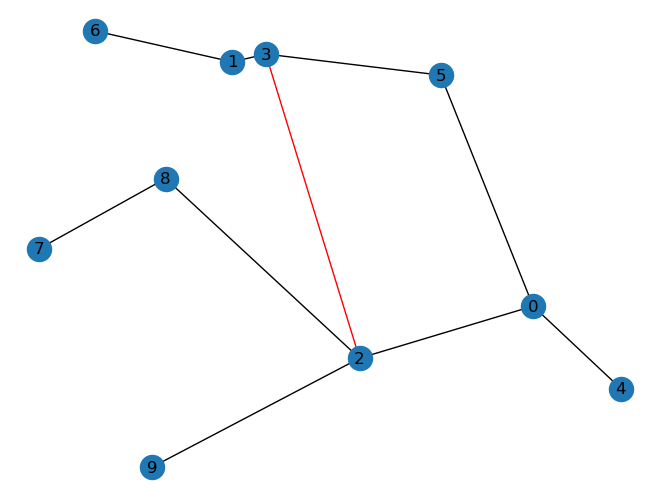

added edges [(2, 3)]
min cc 0.2903225806451613
budget -0.14593485485390145
-----------------------------------------------
(2, 3, 5)
edge (2, 3)
done True
-----------------------------------------------
(2, 3, 6)
edge (2, 3)
edge (3, 6)
done False


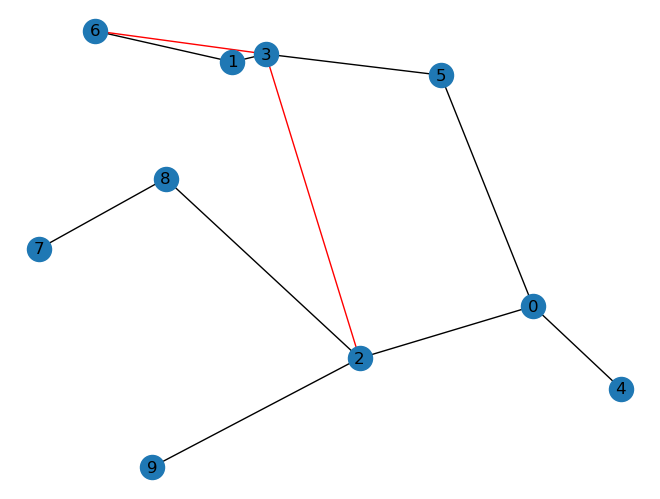

added edges [(2, 3), (3, 6)]
min cc 0.32142857142857145
budget 0.5188586836762196
-----------------------------------------------
(2, 3, 7)
edge (2, 3)
edge (3, 7)
done False


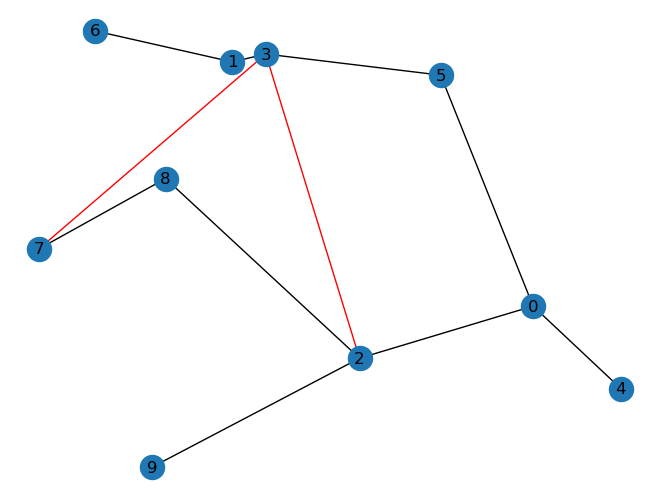

added edges [(2, 3), (3, 7)]
min cc 0.3103448275862069
budget 0.22935664297791059
-----------------------------------------------
(2, 3, 8)
edge (2, 3)
edge (3, 8)
done False


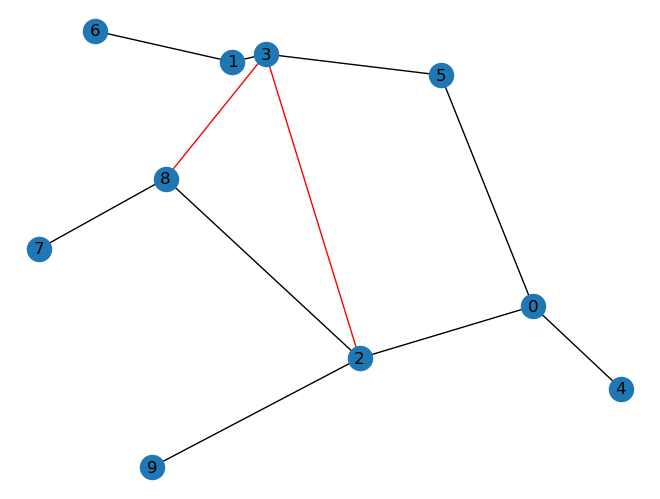

added edges [(2, 3), (3, 8)]
min cc 0.3103448275862069
budget 0.4767634820516459
-----------------------------------------------
(2, 3, 9)
edge (2, 3)
out of budget
edge (3, 9)
done False


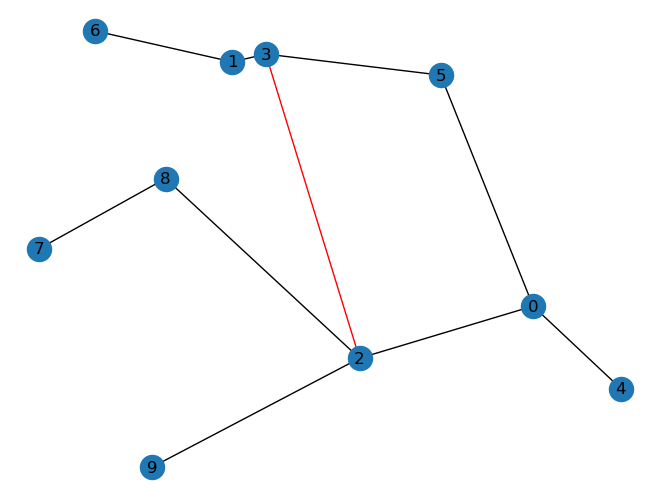

added edges [(2, 3)]
min cc 0.2903225806451613
budget -0.14631712980017675
-----------------------------------------------
(2, 4, 0)
edge (2, 4)
done True
-----------------------------------------------
(2, 4, 1)
edge (2, 4)
edge (4, 1)
done False


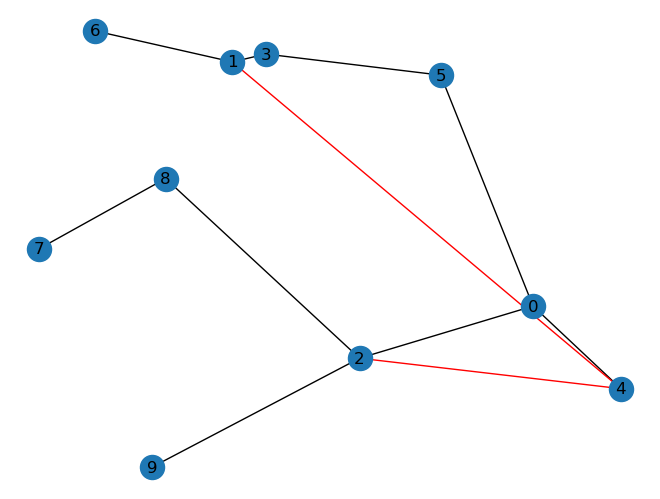

added edges [(2, 4), (4, 1)]
min cc 0.3
budget 0.1061827379238135
-----------------------------------------------
(2, 4, 3)
edge (2, 4)
edge (4, 3)
done False


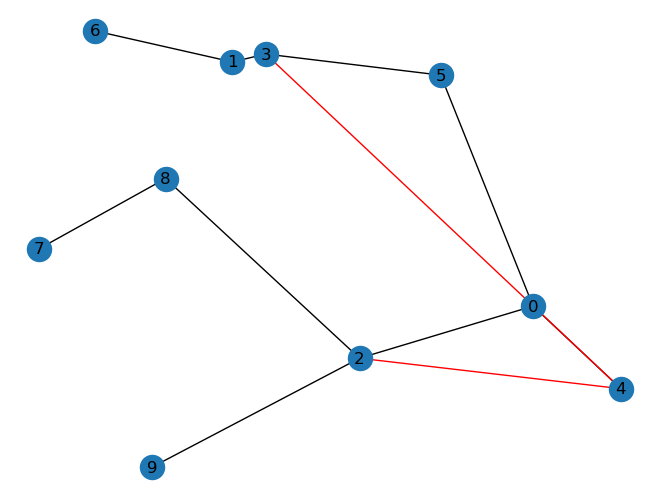

added edges [(2, 4), (4, 3)]
min cc 0.2727272727272727
budget 0.1262169103561256
-----------------------------------------------
(2, 4, 5)
edge (2, 4)
edge (4, 5)
done False


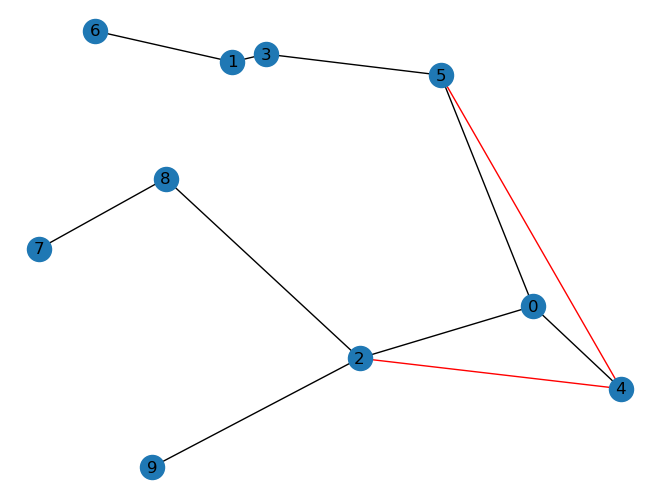

added edges [(2, 4), (4, 5)]
min cc 0.23684210526315788
budget 0.3098482728745403
-----------------------------------------------
(2, 4, 6)
edge (2, 4)
out of budget
edge (4, 6)
done False


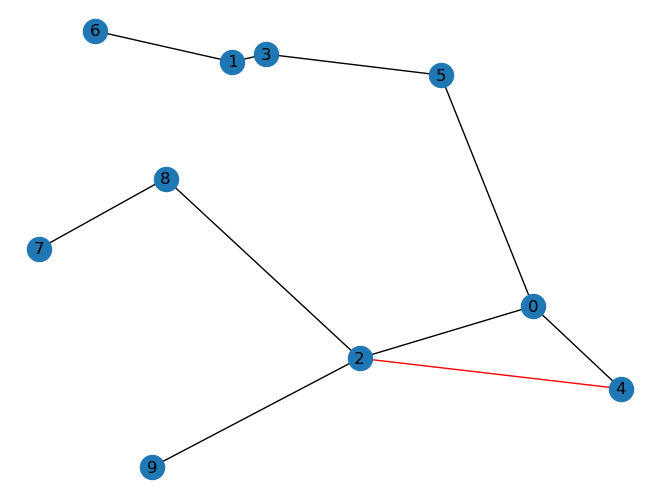

added edges [(2, 4)]
min cc 0.23076923076923078
budget -0.09800422496013761
-----------------------------------------------
(2, 4, 7)
edge (2, 4)
edge (4, 7)
done False


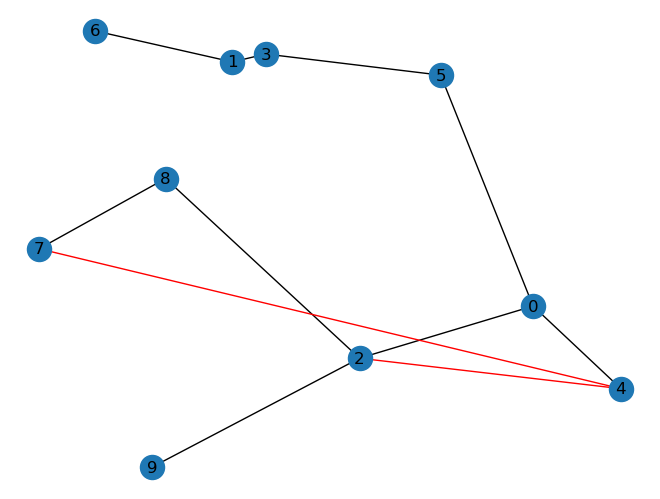

added edges [(2, 4), (4, 7)]
min cc 0.23684210526315788
budget 0.0807542708151644
-----------------------------------------------
(2, 4, 8)
edge (2, 4)
edge (4, 8)
done False


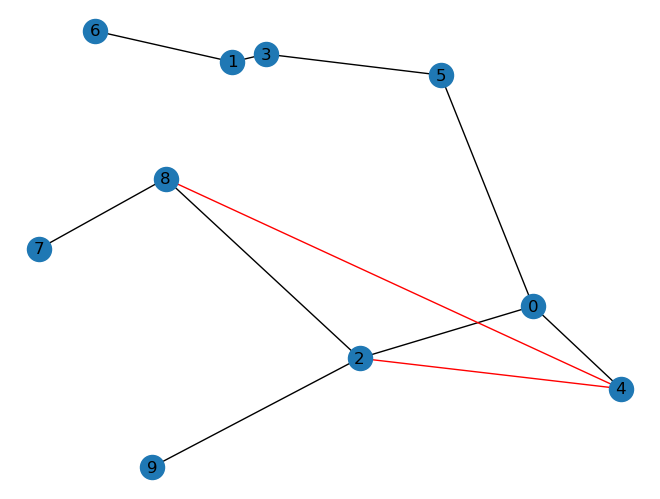

added edges [(2, 4), (4, 8)]
min cc 0.23076923076923078
budget 0.19784480973623042
-----------------------------------------------
(2, 4, 9)
edge (2, 4)
edge (4, 9)
done False


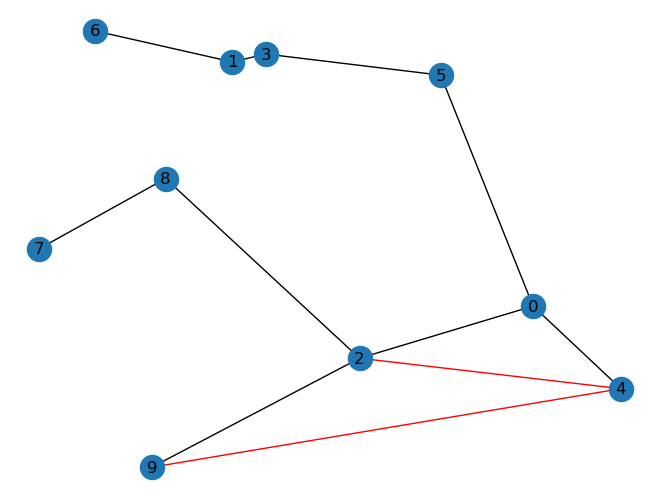

added edges [(2, 4), (4, 9)]
min cc 0.23076923076923078
budget 0.29400638462242534
-----------------------------------------------
(2, 5, 0)
edge (2, 5)
done True
-----------------------------------------------
(2, 5, 1)
edge (2, 5)
edge (5, 1)
done False


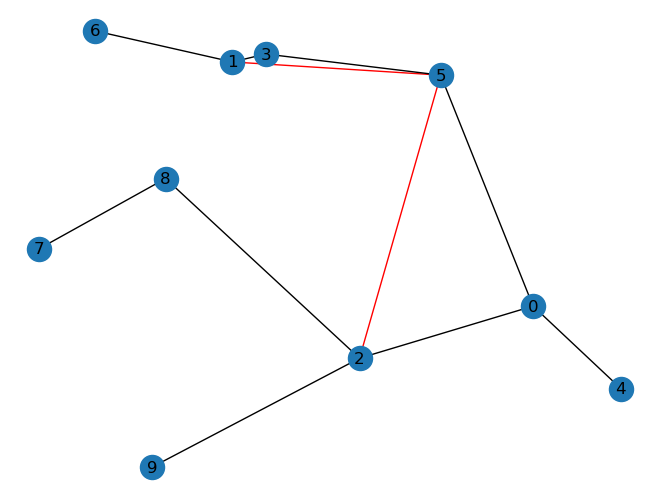

added edges [(2, 5), (5, 1)]
min cc 0.3103448275862069
budget 0.5127430014920812
-----------------------------------------------
(2, 5, 3)
edge (2, 5)
done True
-----------------------------------------------
(2, 5, 4)
edge (2, 5)
edge (5, 4)
done False


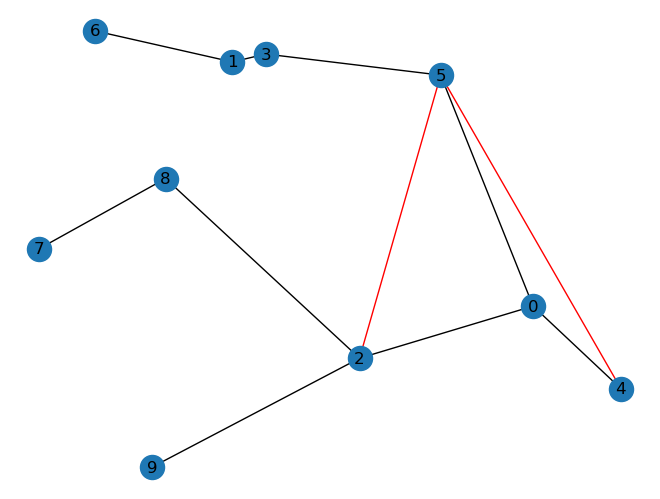

added edges [(2, 5), (5, 4)]
min cc 0.2647058823529412
budget 0.08837212224068602
-----------------------------------------------
(2, 5, 6)
edge (2, 5)
edge (5, 6)
done False


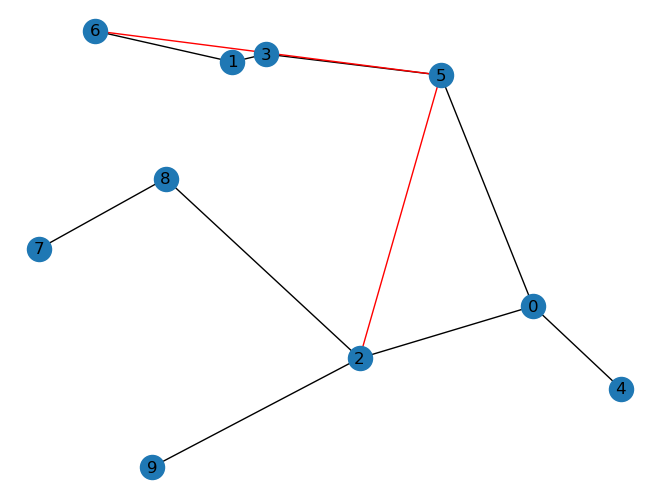

added edges [(2, 5), (5, 6)]
min cc 0.3103448275862069
budget 0.28293867698387576
-----------------------------------------------
(2, 5, 7)
edge (2, 5)
edge (5, 7)
done False


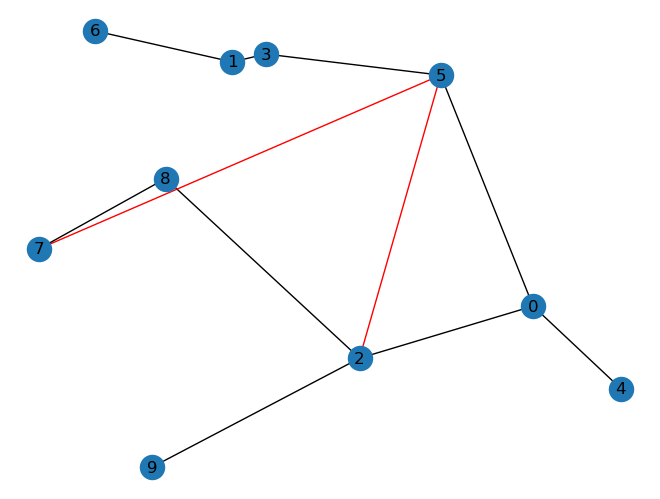

added edges [(2, 5), (5, 7)]
min cc 0.2727272727272727
budget 0.0934812721597843
-----------------------------------------------
(2, 5, 8)
edge (2, 5)
edge (5, 8)
done False


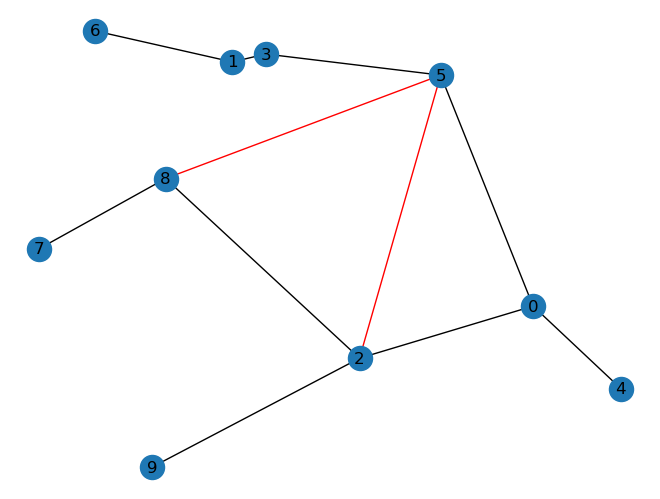

added edges [(2, 5), (5, 8)]
min cc 0.2727272727272727
budget 0.3490590587368453
-----------------------------------------------
(2, 5, 9)
edge (2, 5)
out of budget
edge (5, 9)
done False


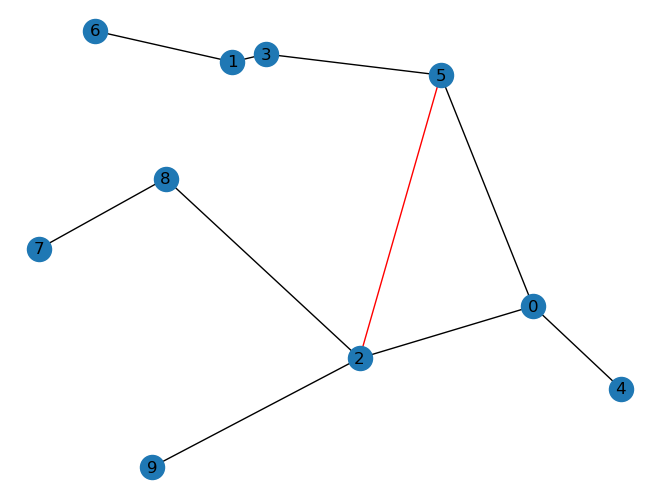

added edges [(2, 5)]
min cc 0.2571428571428571
budget -0.14609705527150463
-----------------------------------------------
(2, 6, 0)
edge (2, 6)
out of budget
edge (6, 0)
done False


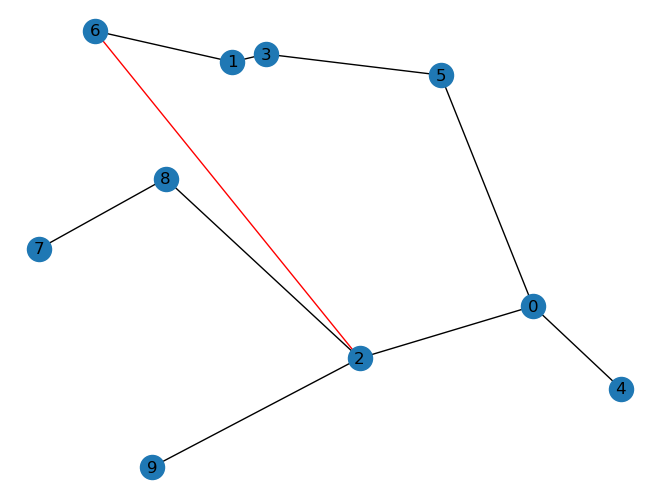

added edges [(2, 6)]
min cc 0.3103448275862069
budget -0.2911148192423373
-----------------------------------------------
(2, 6, 1)
edge (2, 6)
done True
-----------------------------------------------
(2, 6, 3)
edge (2, 6)
edge (6, 3)
done False


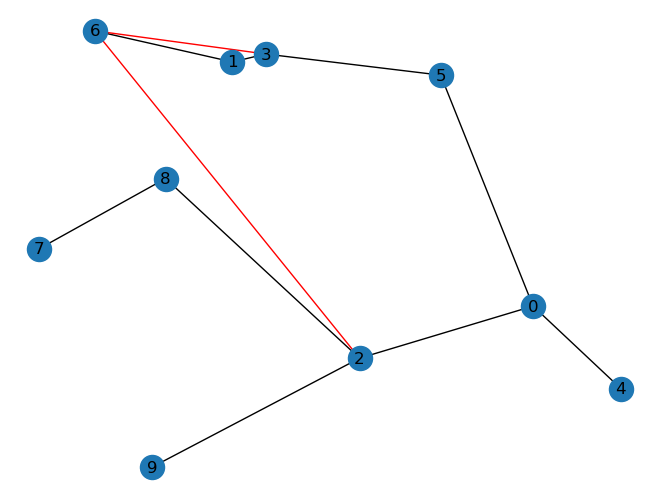

added edges [(2, 6), (6, 3)]
min cc 0.32142857142857145
budget 0.36800029885235597
-----------------------------------------------
(2, 6, 4)
edge (2, 6)
out of budget
edge (6, 4)
done False


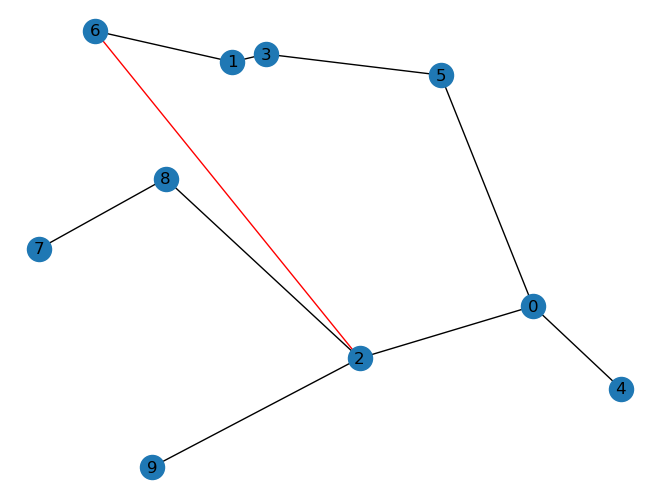

added edges [(2, 6)]
min cc 0.3103448275862069
budget -0.5210143749940283
-----------------------------------------------
(2, 6, 5)
edge (2, 6)
edge (6, 5)
done False


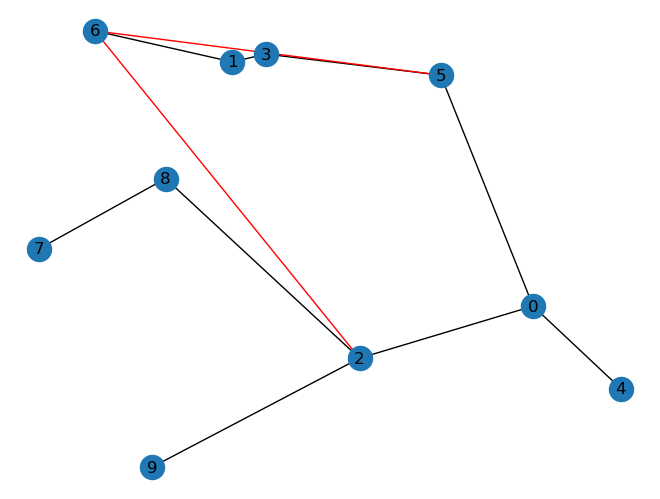

added edges [(2, 6), (6, 5)]
min cc 0.3103448275862069
budget 0.0814046775838394
-----------------------------------------------
(2, 6, 7)
edge (2, 6)
edge (6, 7)
done False


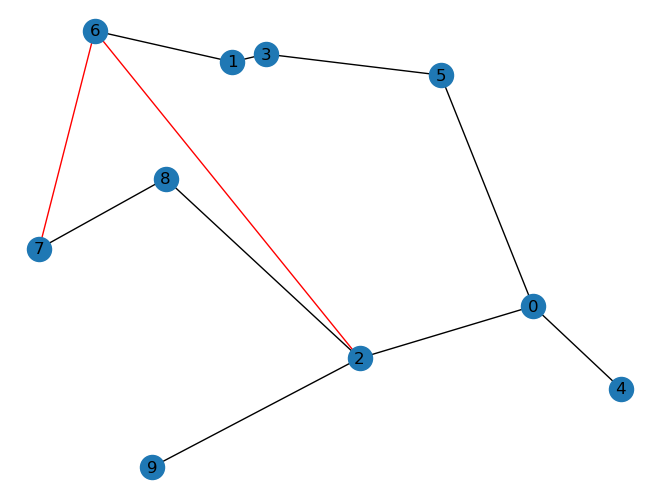

added edges [(2, 6), (6, 7)]
min cc 0.36
budget 0.15123612040835227
-----------------------------------------------
(2, 6, 8)
edge (2, 6)
edge (6, 8)
done False


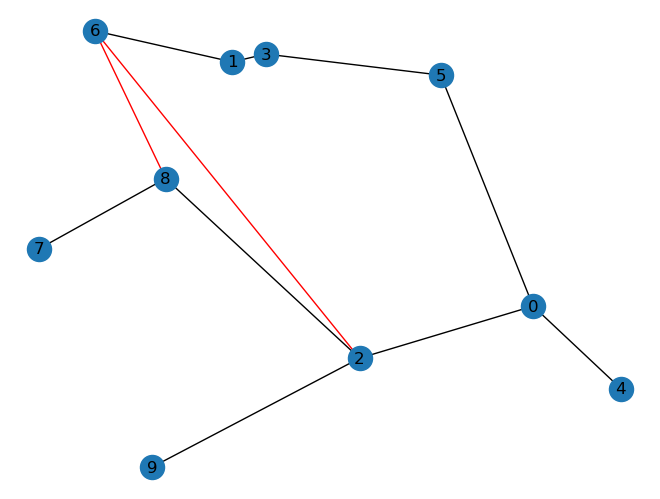

added edges [(2, 6), (6, 8)]
min cc 0.34615384615384615
budget 0.29810043380534484
-----------------------------------------------
(2, 6, 9)
edge (2, 6)
out of budget
edge (6, 9)
done False


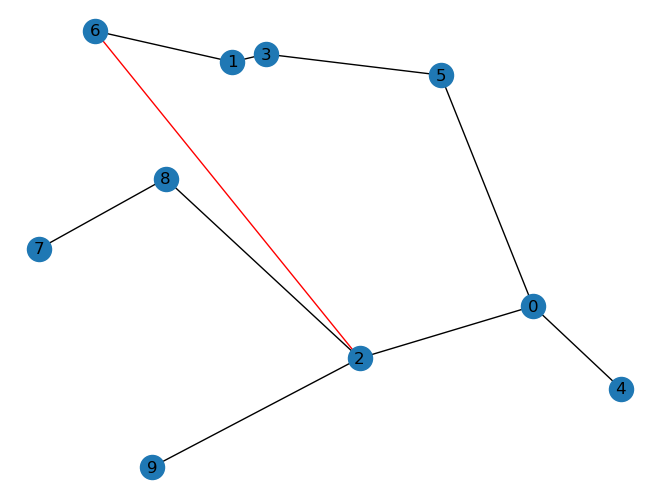

added edges [(2, 6)]
min cc 0.3103448275862069
budget -0.33558537458847104
-----------------------------------------------
(2, 7, 0)
edge (2, 7)
edge (7, 0)
done False


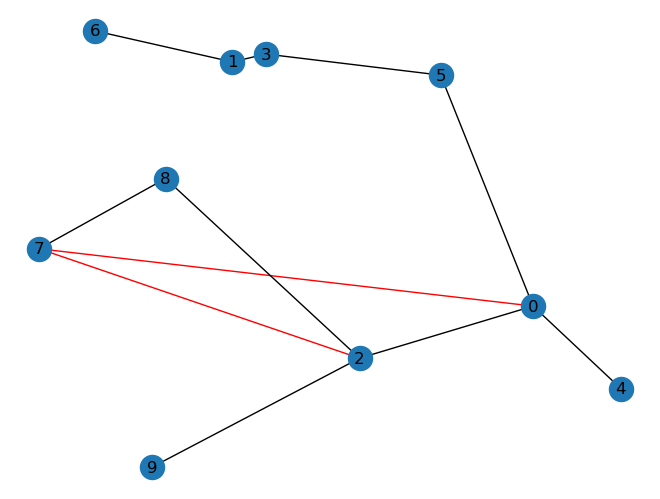

added edges [(2, 7), (7, 0)]
min cc 0.24324324324324326
budget 0.11819993601863521
-----------------------------------------------
(2, 7, 1)
edge (2, 7)
edge (7, 1)
done False


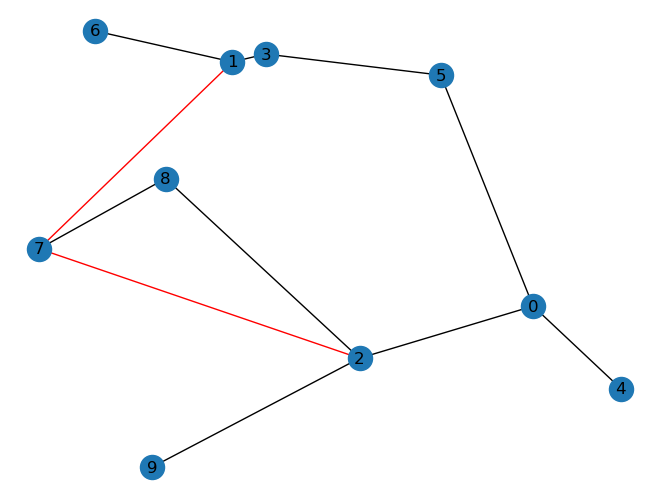

added edges [(2, 7), (7, 1)]
min cc 0.3333333333333333
budget 0.40359297289280416
-----------------------------------------------
(2, 7, 3)
edge (2, 7)
edge (7, 3)
done False


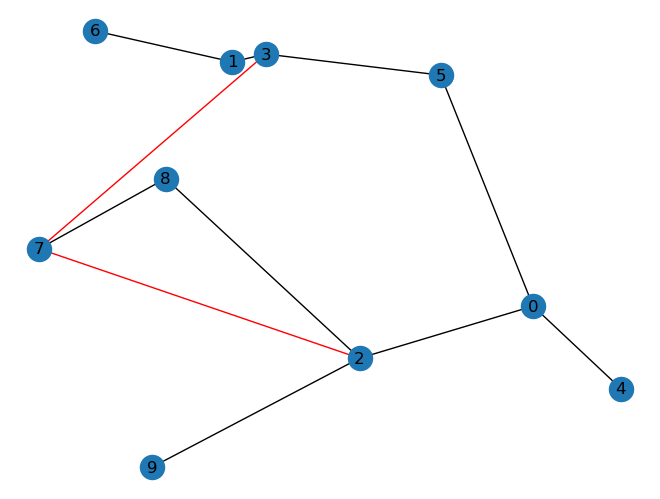

added edges [(2, 7), (7, 3)]
min cc 0.2903225806451613
budget 0.3561681334508908
-----------------------------------------------
(2, 7, 4)
edge (2, 7)
out of budget
edge (7, 4)
done False


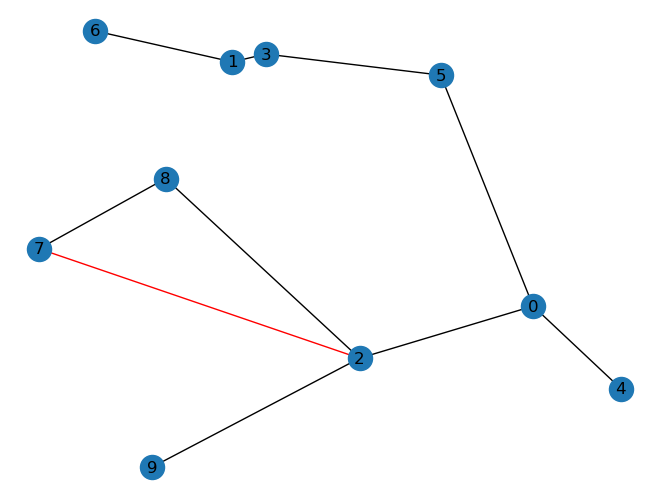

added edges [(2, 7)]
min cc 0.23684210526315788
budget -0.0645860039218824
-----------------------------------------------
(2, 7, 5)
edge (2, 7)
edge (7, 5)
done False


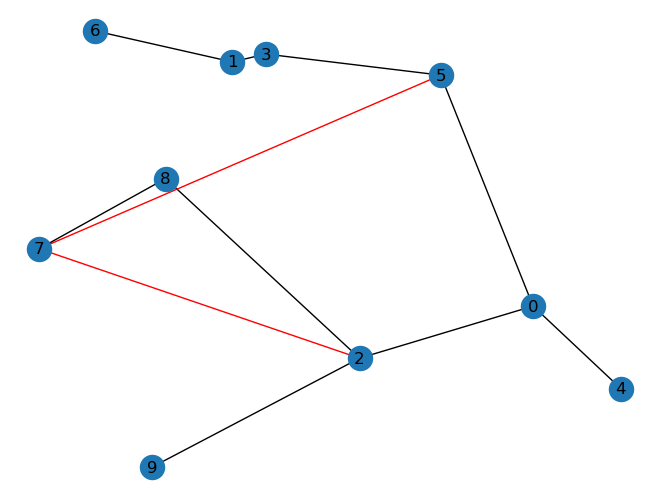

added edges [(2, 7), (7, 5)]
min cc 0.2571428571428571
budget 0.16961714805659178
-----------------------------------------------
(2, 7, 6)
edge (2, 7)
edge (7, 6)
done False


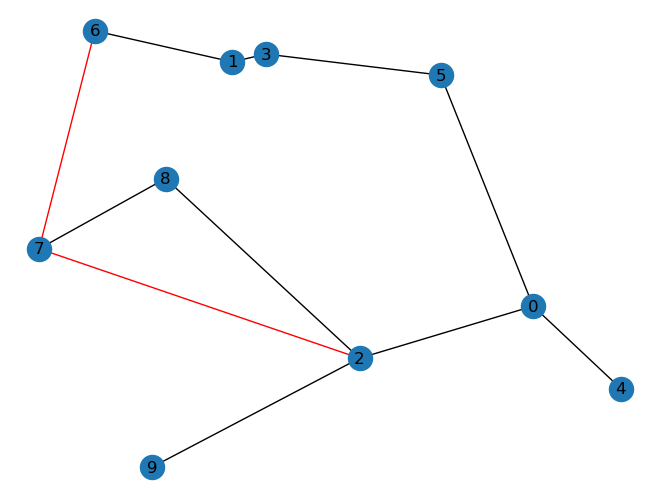

added edges [(2, 7), (7, 6)]
min cc 0.36
budget 0.4289059957051961
-----------------------------------------------
(2, 7, 8)
edge (2, 7)
done True
-----------------------------------------------
(2, 7, 9)
edge (2, 7)
edge (7, 9)
done False


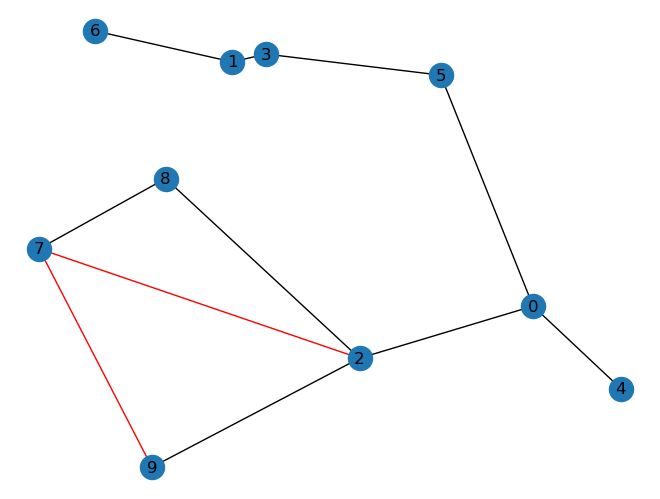

added edges [(2, 7), (7, 9)]
min cc 0.23684210526315788
budget 0.40328346714203656
-----------------------------------------------
(2, 8, 0)
done True
-----------------------------------------------
(2, 8, 1)
done True
-----------------------------------------------
(2, 8, 3)
done True
-----------------------------------------------
(2, 8, 4)
done True
-----------------------------------------------
(2, 8, 5)
done True
-----------------------------------------------
(2, 8, 6)
done True
-----------------------------------------------
(2, 8, 7)
done True
-----------------------------------------------
(2, 8, 9)
done True
-----------------------------------------------
(2, 9, 0)
done True
-----------------------------------------------
(2, 9, 1)
done True
-----------------------------------------------
(2, 9, 3)
done True
-----------------------------------------------
(2, 9, 4)
done True
-----------------------------------------------
(2, 9, 5)
done True
---------------------------------

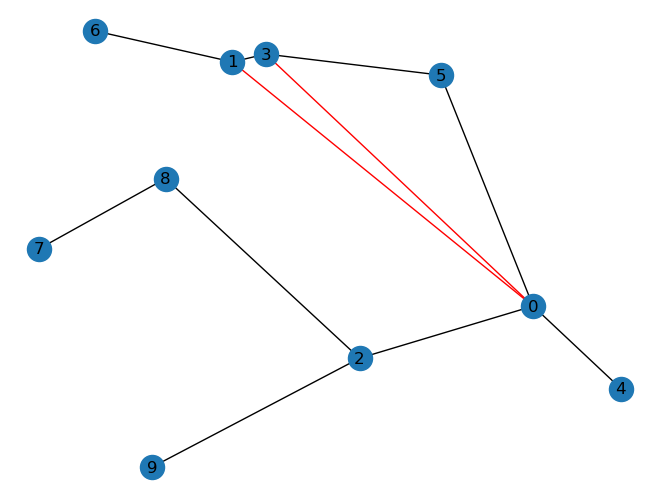

added edges [(3, 0), (0, 1)]
min cc 0.3
budget 0.05499985002147567
-----------------------------------------------
(3, 0, 2)
edge (3, 0)
done True
-----------------------------------------------
(3, 0, 4)
edge (3, 0)
done True
-----------------------------------------------
(3, 0, 5)
edge (3, 0)
done True
-----------------------------------------------
(3, 0, 6)
edge (3, 0)
out of budget
edge (0, 6)
done False


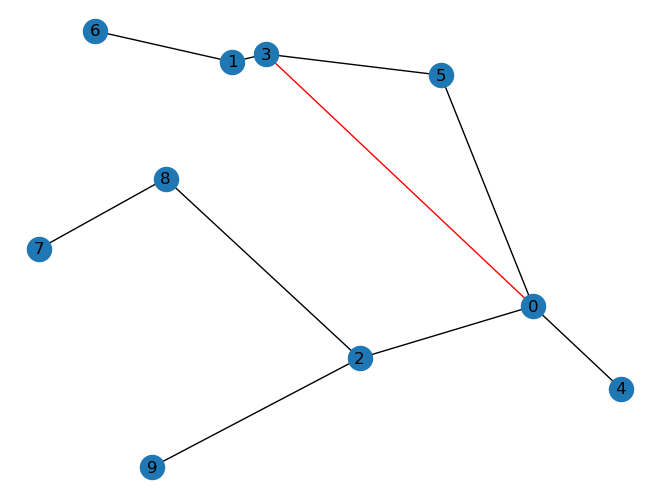

added edges [(3, 0)]
min cc 0.2727272727272727
budget -0.15246332541260377
-----------------------------------------------
(3, 0, 7)
edge (3, 0)
out of budget
edge (0, 7)
done False


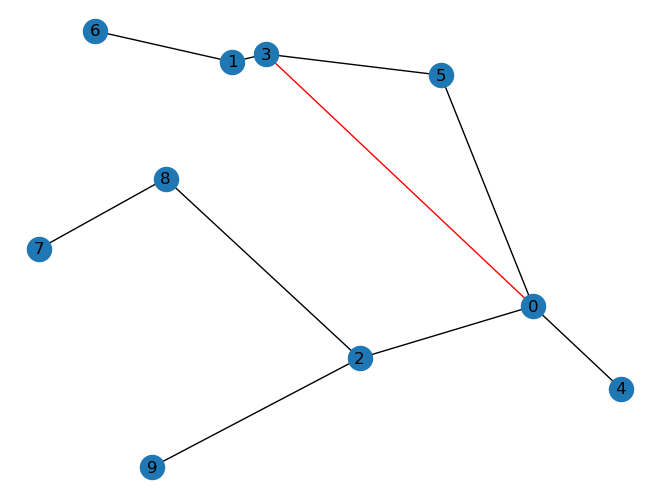

added edges [(3, 0)]
min cc 0.2727272727272727
budget -0.02081844544847511
-----------------------------------------------
(3, 0, 8)
edge (3, 0)
edge (0, 8)
done False


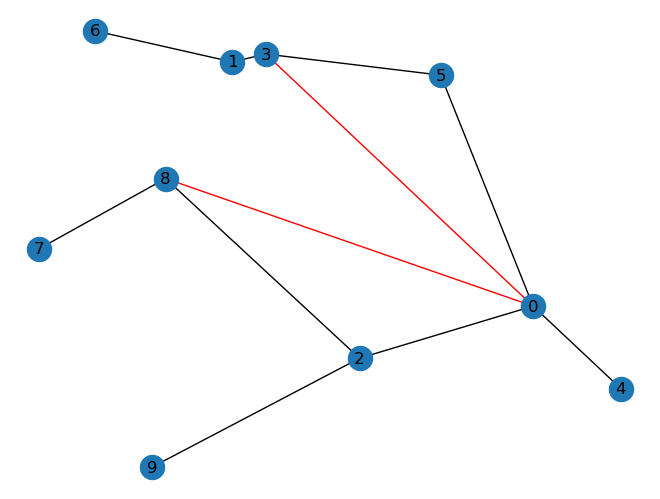

added edges [(3, 0), (0, 8)]
min cc 0.2903225806451613
budget 0.12835896118735868
-----------------------------------------------
(3, 0, 9)
edge (3, 0)
edge (0, 9)
done False


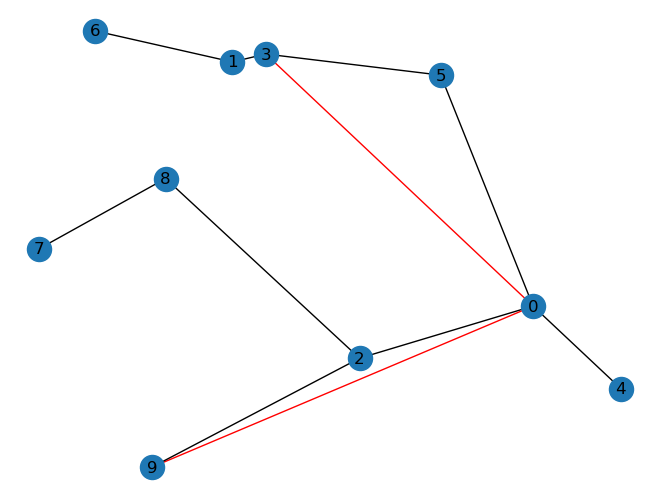

added edges [(3, 0), (0, 9)]
min cc 0.28125
budget 0.07337916214813578
-----------------------------------------------
(3, 1, 0)
done True
-----------------------------------------------
(3, 1, 2)
done True
-----------------------------------------------
(3, 1, 4)
done True
-----------------------------------------------
(3, 1, 5)
done True
-----------------------------------------------
(3, 1, 6)
done True
-----------------------------------------------
(3, 1, 7)
done True
-----------------------------------------------
(3, 1, 8)
done True
-----------------------------------------------
(3, 1, 9)
done True
-----------------------------------------------
(3, 2, 0)
edge (3, 2)
done True
-----------------------------------------------
(3, 2, 1)
edge (3, 2)
edge (2, 1)
done False


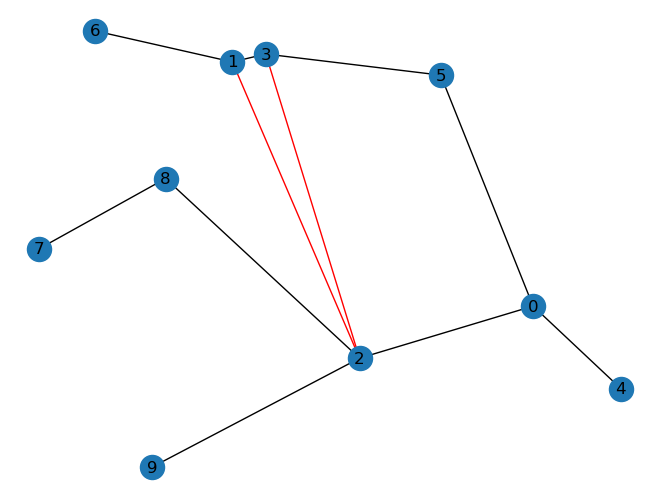

added edges [(3, 2), (2, 1)]
min cc 0.3333333333333333
budget 0.10334703158026315
-----------------------------------------------
(3, 2, 4)
edge (3, 2)
edge (2, 4)
done False


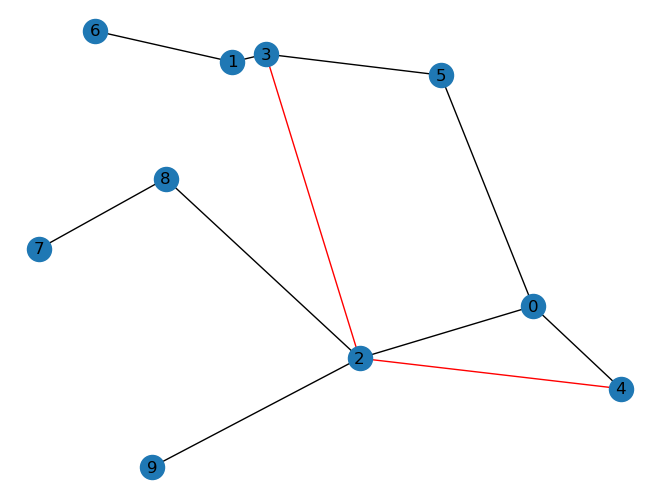

added edges [(3, 2), (2, 4)]
min cc 0.3
budget 0.3720581690909768
-----------------------------------------------
(3, 2, 5)
edge (3, 2)
edge (2, 5)
done False


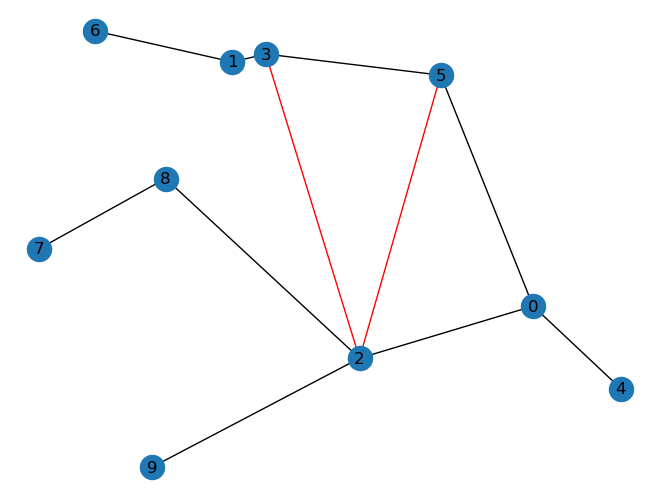

added edges [(3, 2), (2, 5)]
min cc 0.2903225806451613
budget 0.15058201845712238
-----------------------------------------------
(3, 2, 6)
edge (3, 2)
out of budget
edge (2, 6)
done False


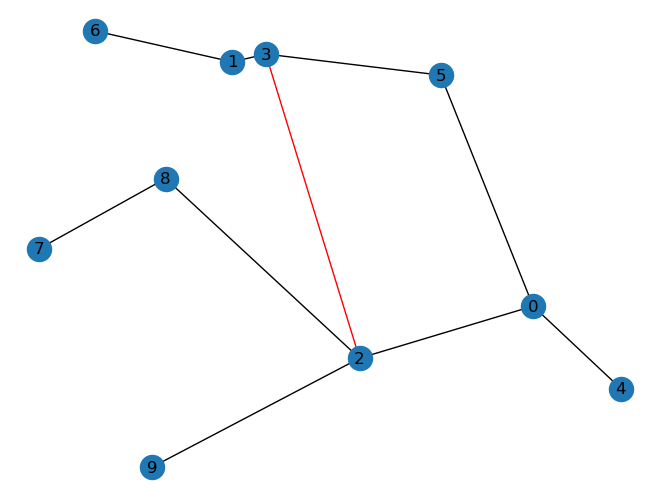

added edges [(3, 2)]
min cc 0.2903225806451613
budget -0.05095198094291398
-----------------------------------------------
(3, 2, 7)
edge (3, 2)
edge (2, 7)
done False


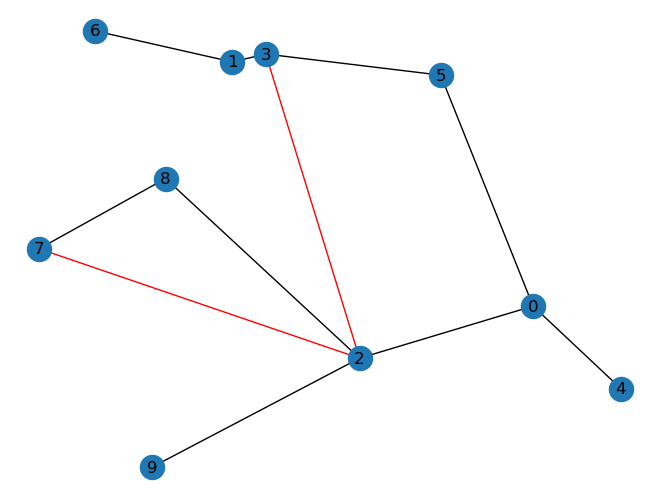

added edges [(3, 2), (2, 7)]
min cc 0.3
budget 0.22671789435392986
-----------------------------------------------
(3, 2, 8)
edge (3, 2)
done True
-----------------------------------------------
(3, 2, 9)
edge (3, 2)
done True
-----------------------------------------------
(3, 4, 0)
edge (3, 4)
done True
-----------------------------------------------
(3, 4, 1)
edge (3, 4)
out of budget
edge (4, 1)
done False


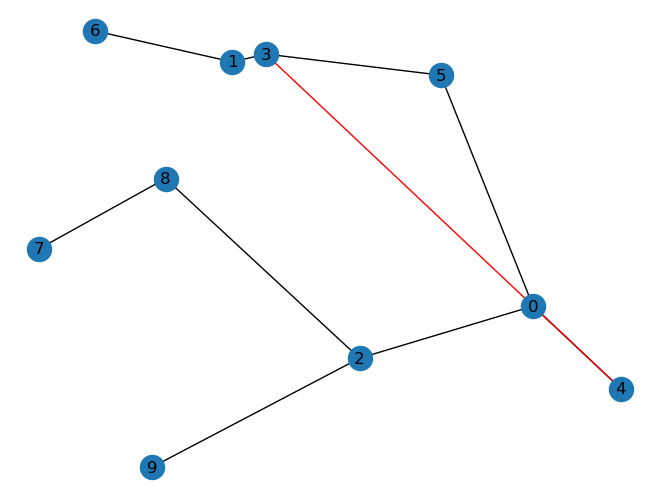

added edges [(3, 4)]
min cc 0.24324324324324326
budget -0.4118102860210646
-----------------------------------------------
(3, 4, 2)
edge (3, 4)
edge (4, 2)
done False


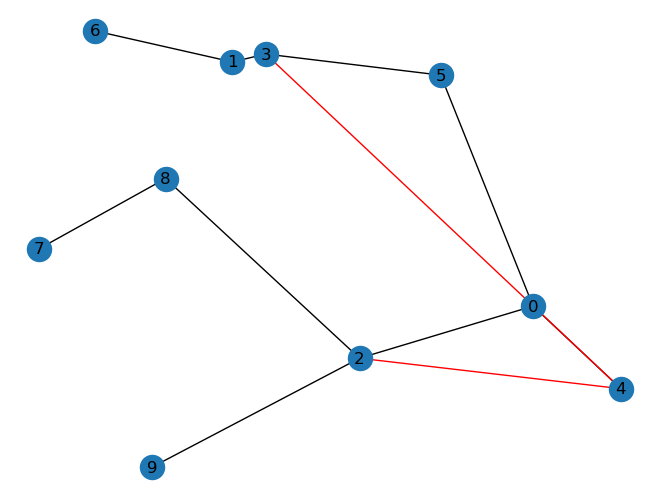

added edges [(3, 4), (4, 2)]
min cc 0.2727272727272727
budget 0.1262169103561257
-----------------------------------------------
(3, 4, 5)
edge (3, 4)
out of budget
edge (4, 5)
done False


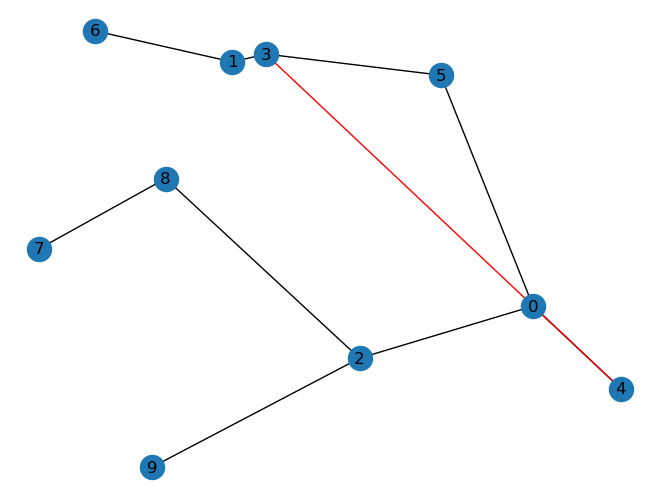

added edges [(3, 4)]
min cc 0.24324324324324326
budget -0.2081447510703378
-----------------------------------------------
(3, 4, 6)
edge (3, 4)
out of budget
edge (4, 6)
done False


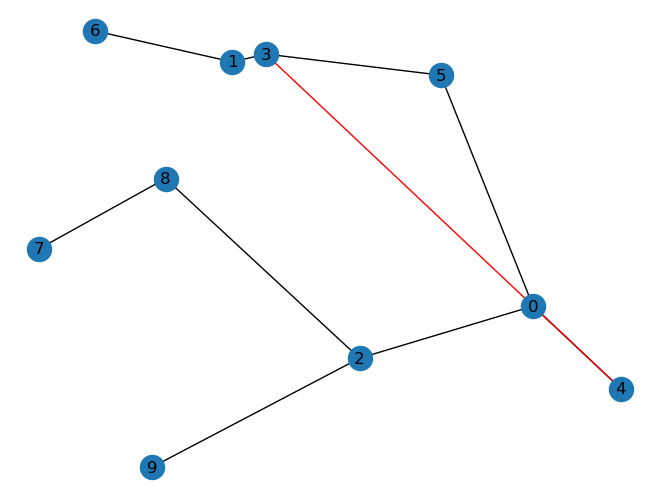

added edges [(3, 4)]
min cc 0.24324324324324326
budget -0.6159972489050157
-----------------------------------------------
(3, 4, 7)
edge (3, 4)
out of budget
edge (4, 7)
done False


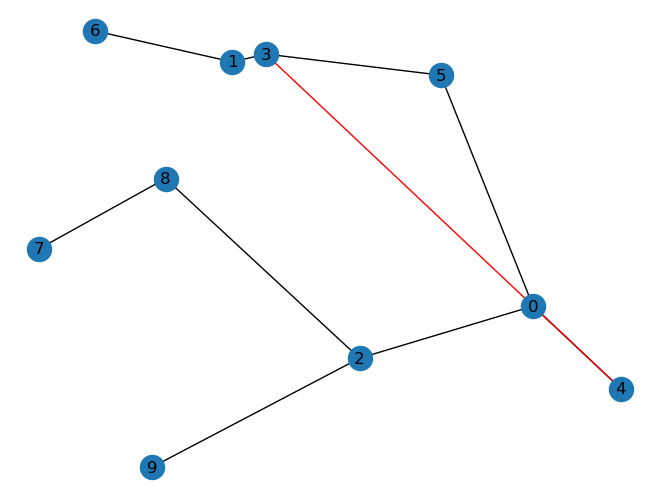

added edges [(3, 4)]
min cc 0.24324324324324326
budget -0.4372387531297137
-----------------------------------------------
(3, 4, 8)
edge (3, 4)
out of budget
edge (4, 8)
done False


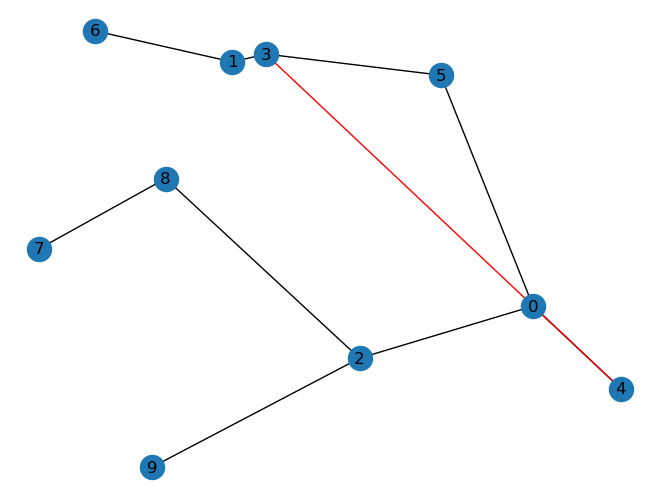

added edges [(3, 4)]
min cc 0.24324324324324326
budget -0.3201482142086477
-----------------------------------------------
(3, 4, 9)
edge (3, 4)
out of budget
edge (4, 9)
done False


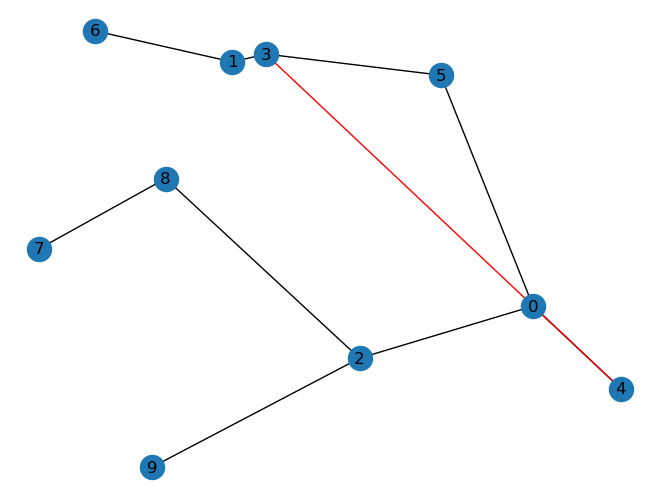

added edges [(3, 4)]
min cc 0.24324324324324326
budget -0.22398663932245277
-----------------------------------------------
(3, 5, 0)
done True
-----------------------------------------------
(3, 5, 1)
done True
-----------------------------------------------
(3, 5, 2)
done True
-----------------------------------------------
(3, 5, 4)
done True
-----------------------------------------------
(3, 5, 6)
done True
-----------------------------------------------
(3, 5, 7)
done True
-----------------------------------------------
(3, 5, 8)
done True
-----------------------------------------------
(3, 5, 9)
done True
-----------------------------------------------
(3, 6, 0)
edge (3, 6)
edge (6, 0)
done False


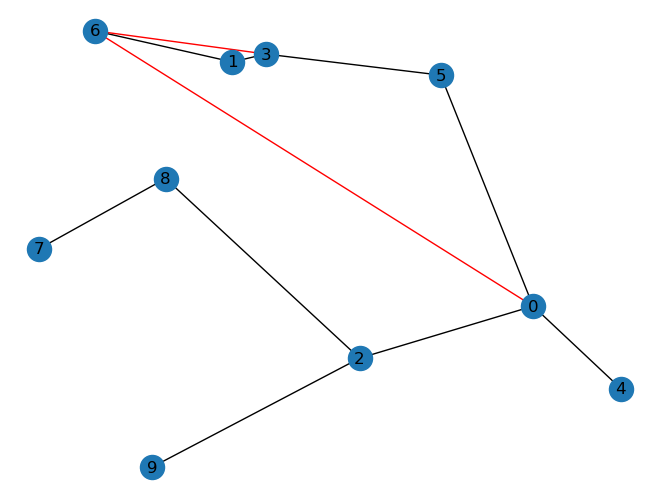

added edges [(3, 6), (6, 0)]
min cc 0.2903225806451613
budget 0.27869584537679626
-----------------------------------------------
(3, 6, 1)
edge (3, 6)
done True
-----------------------------------------------
(3, 6, 2)
edge (3, 6)
edge (6, 2)
done False


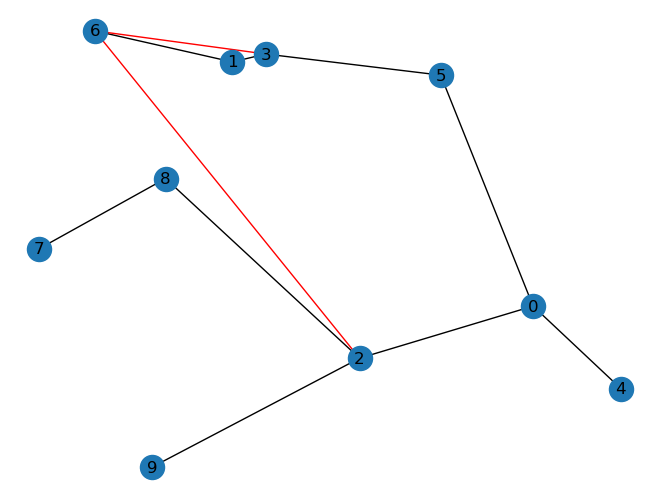

added edges [(3, 6), (6, 2)]
min cc 0.32142857142857145
budget 0.36800029885235597
-----------------------------------------------
(3, 6, 4)
edge (3, 6)
edge (6, 4)
done False


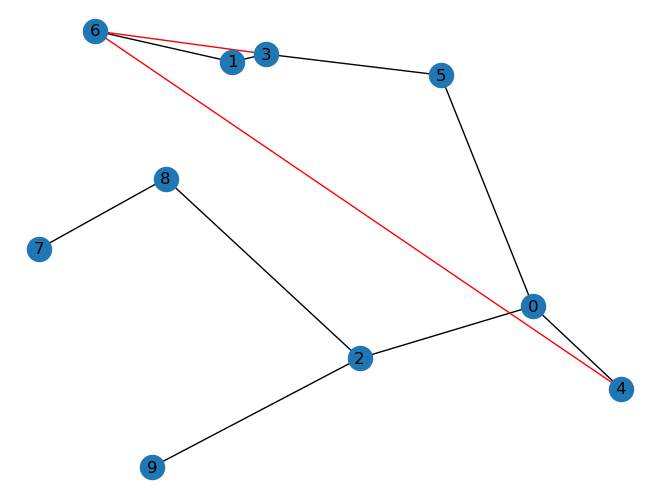

added edges [(3, 6), (6, 4)]
min cc 0.2727272727272727
budget 0.048796289625105294
-----------------------------------------------
(3, 6, 5)
edge (3, 6)
edge (6, 5)
done False


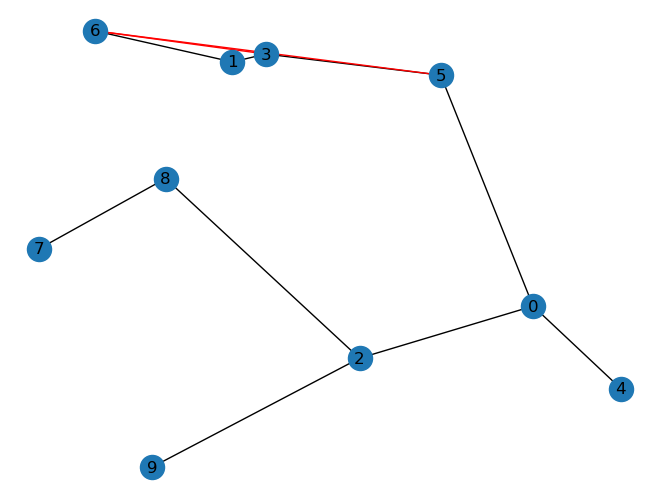

added edges [(3, 6), (6, 5)]
min cc 0.2727272727272727
budget 0.651215342202973
-----------------------------------------------
(3, 6, 7)
edge (3, 6)
edge (6, 7)
done False


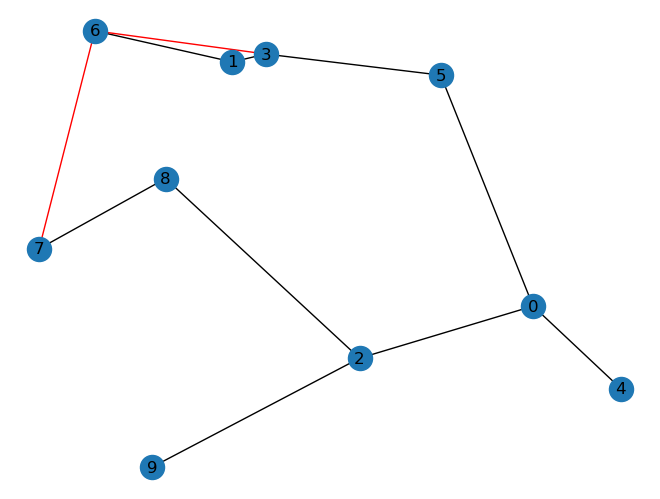

added edges [(3, 6), (6, 7)]
min cc 0.3333333333333333
budget 0.7210467850274858
-----------------------------------------------
(3, 6, 8)
edge (3, 6)
edge (6, 8)
done False


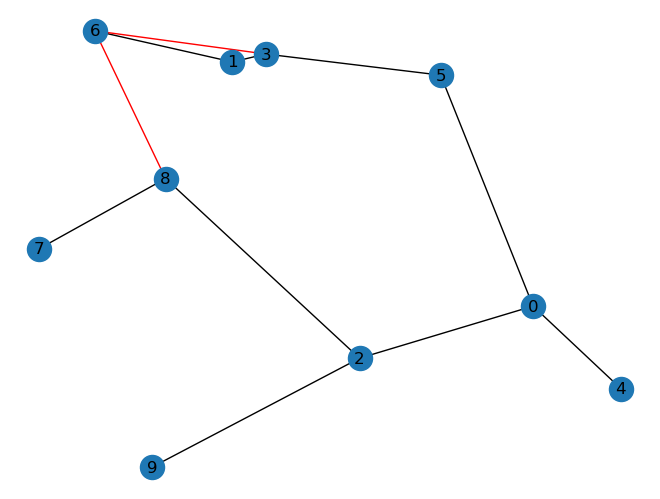

added edges [(3, 6), (6, 8)]
min cc 0.34615384615384615
budget 0.8679110984244784
-----------------------------------------------
(3, 6, 9)
edge (3, 6)
edge (6, 9)
done False


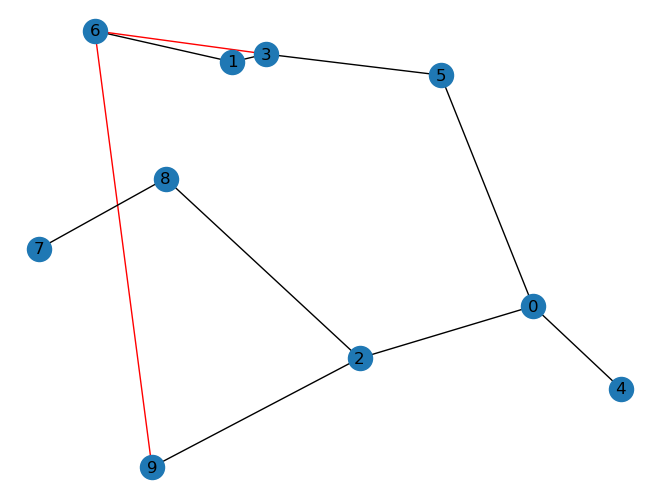

added edges [(3, 6), (6, 9)]
min cc 0.2903225806451613
budget 0.2342252900306625
-----------------------------------------------
(3, 7, 0)
edge (3, 7)
edge (7, 0)
done False


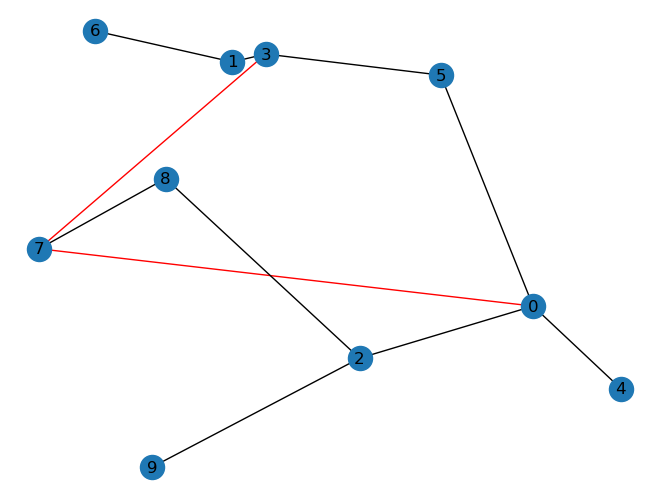

added edges [(3, 7), (7, 0)]
min cc 0.2727272727272727
budget 0.12083868464261593
-----------------------------------------------
(3, 7, 1)
edge (3, 7)
edge (7, 1)
done False


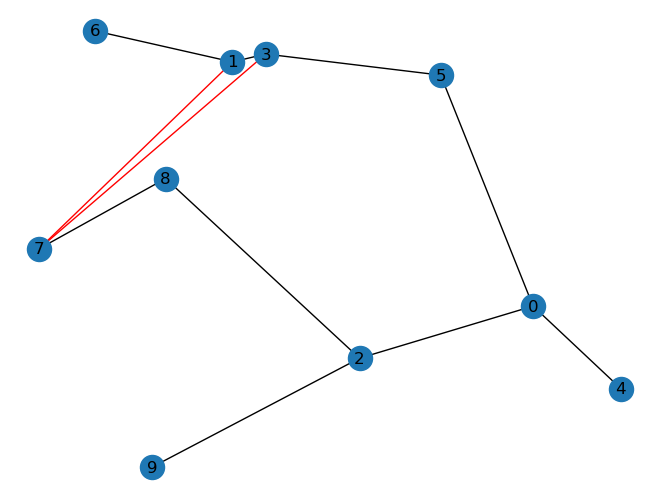

added edges [(3, 7), (7, 1)]
min cc 0.3103448275862069
budget 0.4062317215167849
-----------------------------------------------
(3, 7, 2)
edge (3, 7)
edge (7, 2)
done False


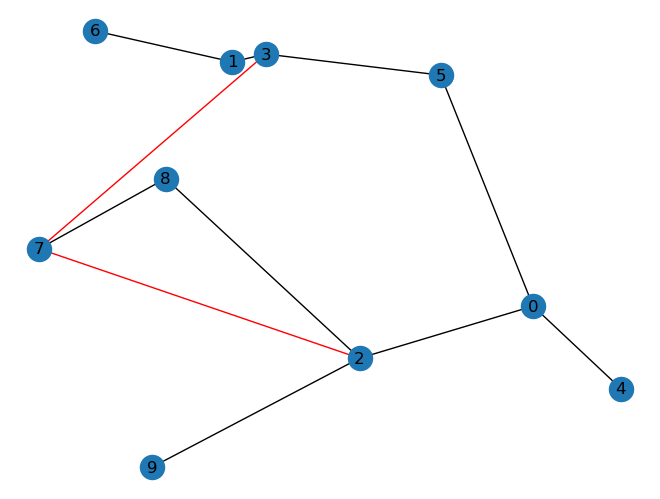

added edges [(3, 7), (7, 2)]
min cc 0.2903225806451613
budget 0.3561681334508908
-----------------------------------------------
(3, 7, 4)
edge (3, 7)
out of budget
edge (7, 4)
done False


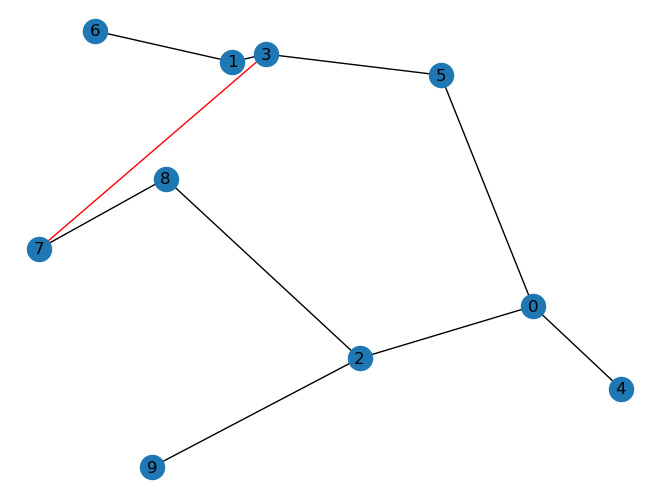

added edges [(3, 7)]
min cc 0.2727272727272727
budget -0.06194725529790168
-----------------------------------------------
(3, 7, 5)
edge (3, 7)
edge (7, 5)
done False


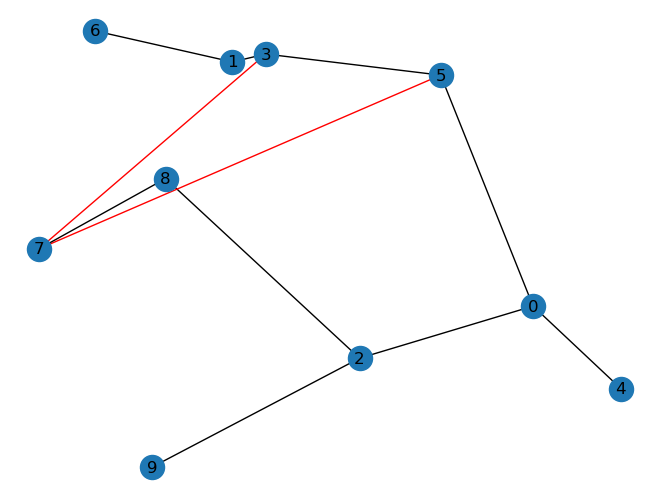

added edges [(3, 7), (7, 5)]
min cc 0.2727272727272727
budget 0.1722558966805725
-----------------------------------------------
(3, 7, 6)
edge (3, 7)
edge (7, 6)
done False


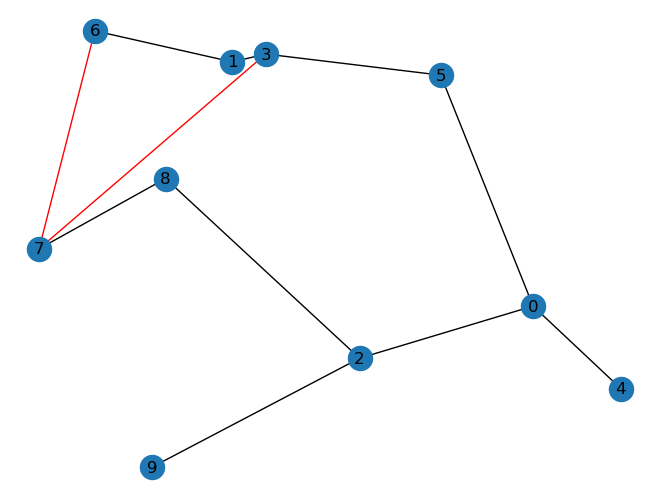

added edges [(3, 7), (7, 6)]
min cc 0.3333333333333333
budget 0.43154474432917683
-----------------------------------------------
(3, 7, 8)
edge (3, 7)
done True
-----------------------------------------------
(3, 7, 9)
edge (3, 7)
edge (7, 9)
done False


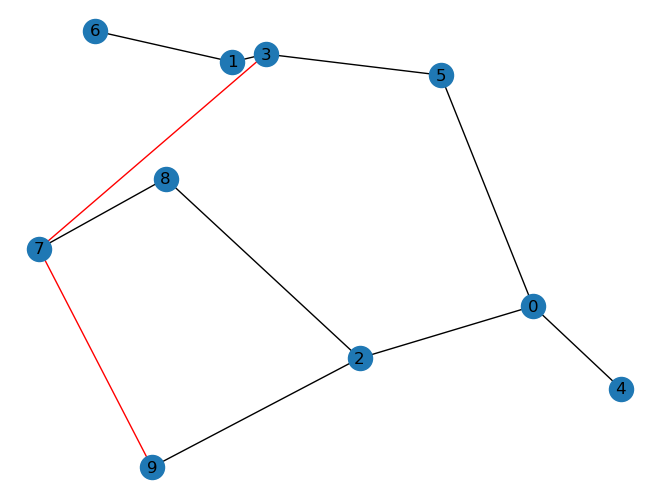

added edges [(3, 7), (7, 9)]
min cc 0.2903225806451613
budget 0.4059222157660173
-----------------------------------------------
(3, 8, 0)
edge (3, 8)
edge (8, 0)
done False


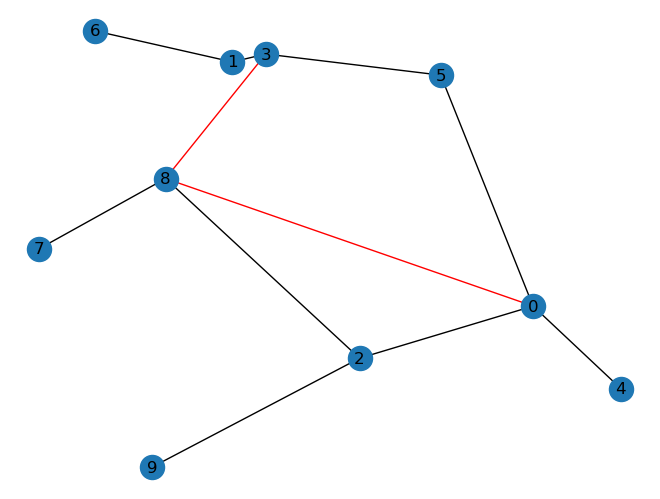

added edges [(3, 8), (8, 0)]
min cc 0.2903225806451613
budget 0.517422930352185
-----------------------------------------------
(3, 8, 1)
edge (3, 8)
edge (8, 1)
done False


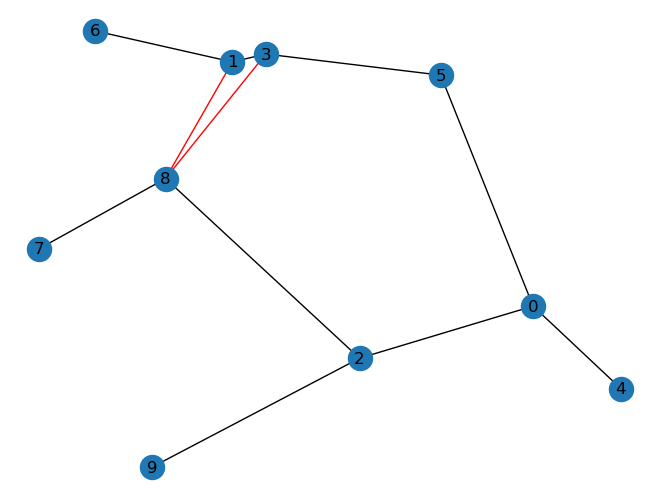

added edges [(3, 8), (8, 1)]
min cc 0.3333333333333333
budget 0.8935327214399886
-----------------------------------------------
(3, 8, 2)
edge (3, 8)
done True
-----------------------------------------------
(3, 8, 4)
edge (3, 8)
edge (8, 4)
done False


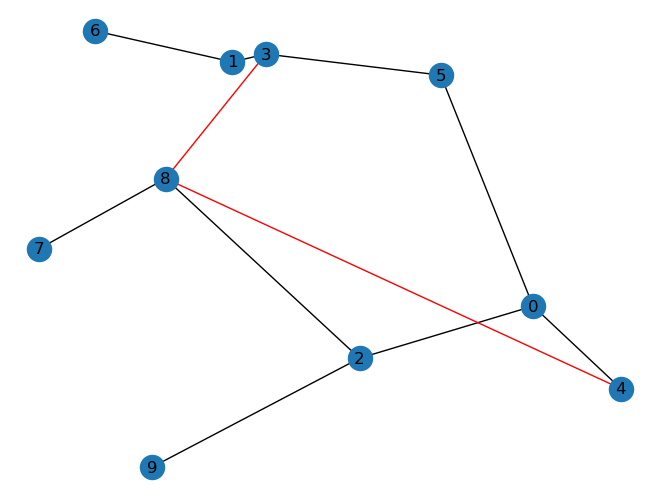

added edges [(3, 8), (8, 4)]
min cc 0.3
budget 0.3025501226968996
-----------------------------------------------
(3, 8, 5)
edge (3, 8)
edge (8, 5)
done False


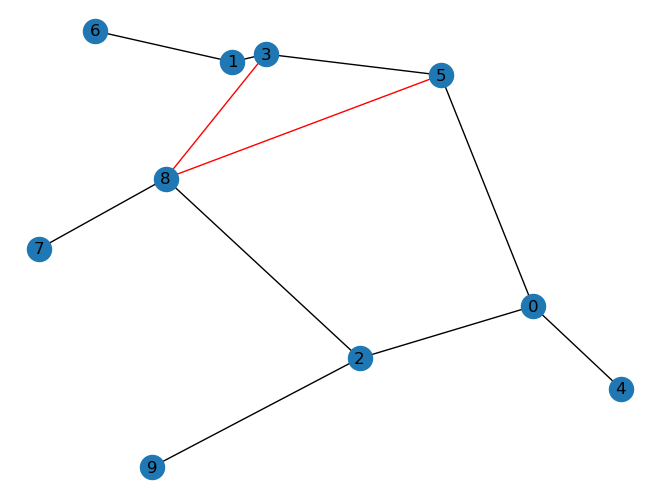

added edges [(3, 8), (8, 5)]
min cc 0.2903225806451613
budget 0.6752405223313688
-----------------------------------------------
(3, 8, 6)
edge (3, 8)
edge (8, 6)
done False


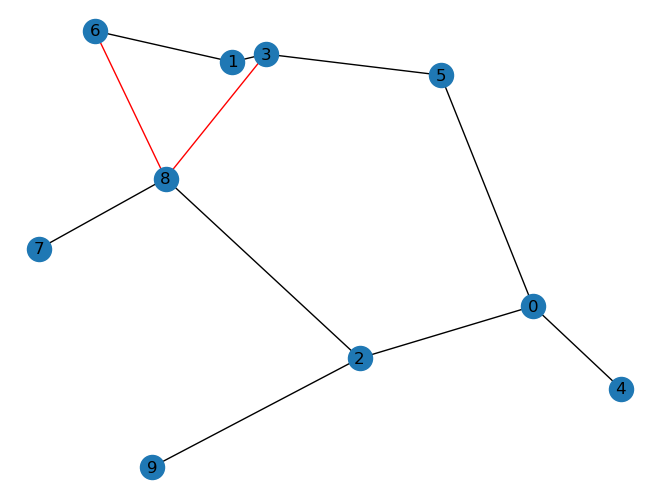

added edges [(3, 8), (8, 6)]
min cc 0.34615384615384615
budget 0.8258158967999047
-----------------------------------------------
(3, 8, 7)
edge (3, 8)
done True
-----------------------------------------------
(3, 8, 9)
edge (3, 8)
edge (8, 9)
done False


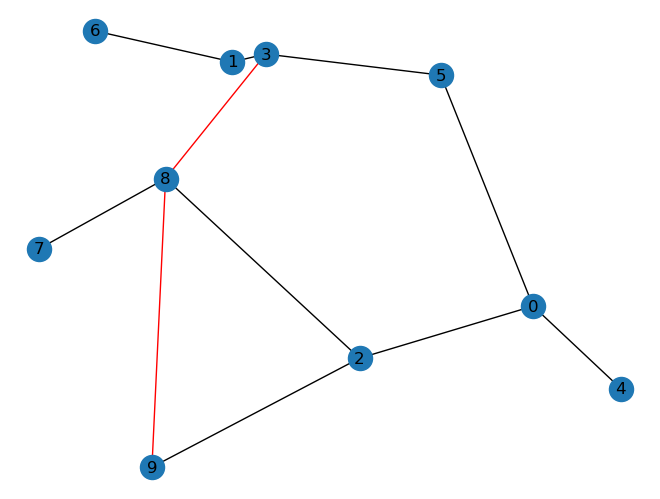

added edges [(3, 8), (8, 9)]
min cc 0.3
budget 0.5279384747123036
-----------------------------------------------
(3, 9, 0)
edge (3, 9)
out of budget
edge (9, 0)
done False


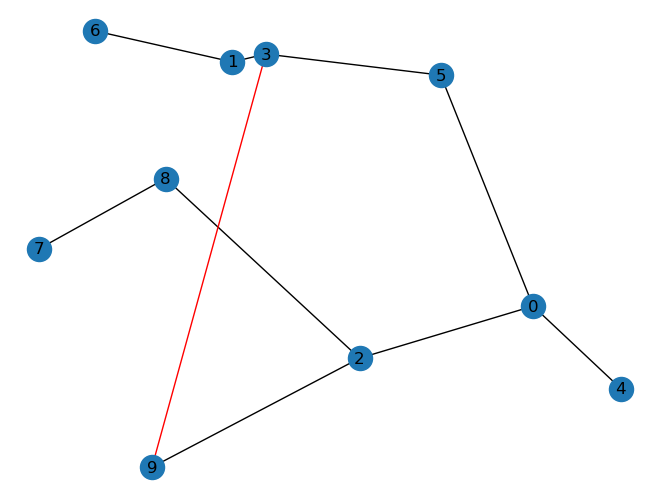

added edges [(3, 9)]
min cc 0.2727272727272727
budget -0.1606374805388605
-----------------------------------------------
(3, 9, 1)
edge (3, 9)
out of budget
edge (9, 1)
done False


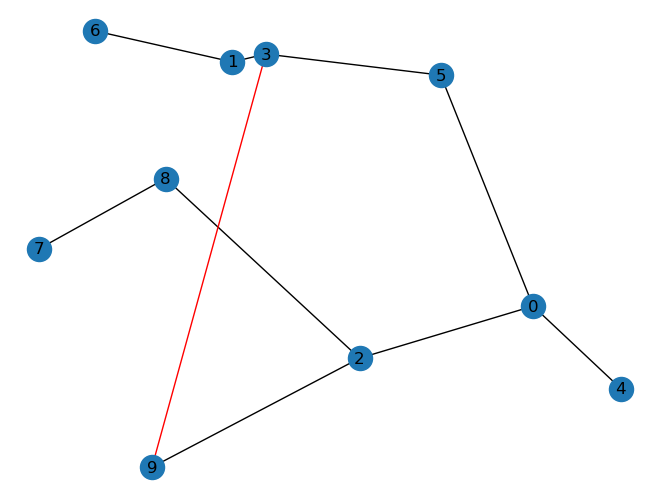

added edges [(3, 9)]
min cc 0.2727272727272727
budget -0.3659009607205592
-----------------------------------------------
(3, 9, 2)
edge (3, 9)
done True
-----------------------------------------------
(3, 9, 4)
edge (3, 9)
out of budget
edge (9, 4)
done False


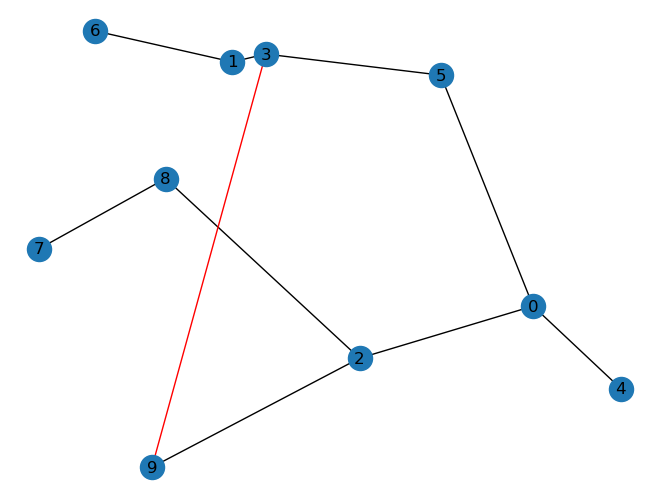

added edges [(3, 9)]
min cc 0.2727272727272727
budget -0.22436891426872807
-----------------------------------------------
(3, 9, 5)
edge (3, 9)
out of budget
edge (9, 5)
done False


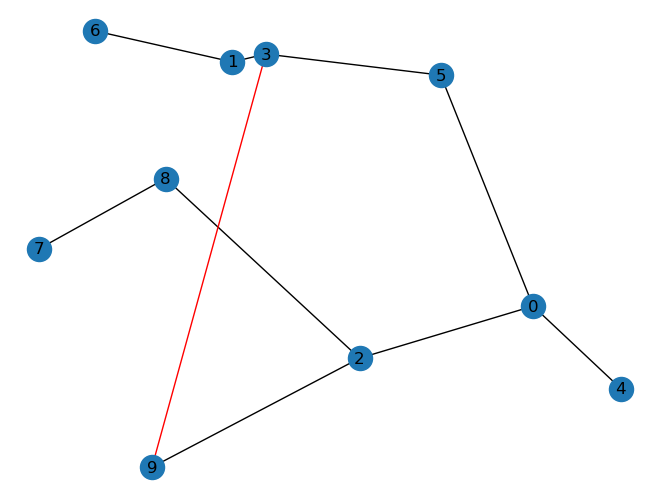

added edges [(3, 9)]
min cc 0.2727272727272727
budget -0.44299620352880376
-----------------------------------------------
(3, 9, 6)
edge (3, 9)
out of budget
edge (9, 6)
done False


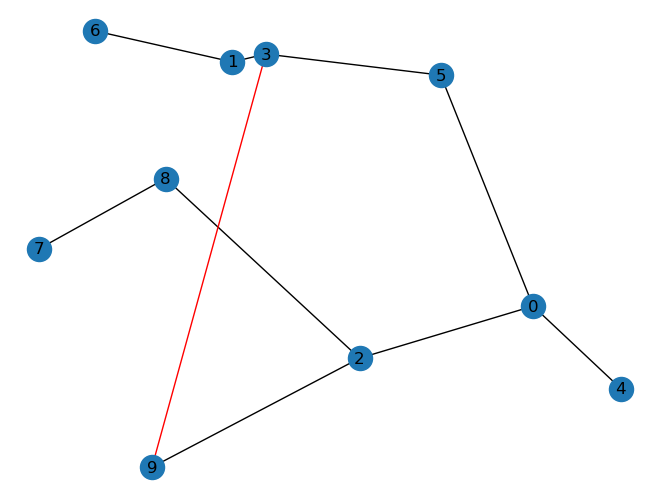

added edges [(3, 9)]
min cc 0.2727272727272727
budget -0.4309505234457338
-----------------------------------------------
(3, 9, 7)
edge (3, 9)
edge (9, 7)
done False


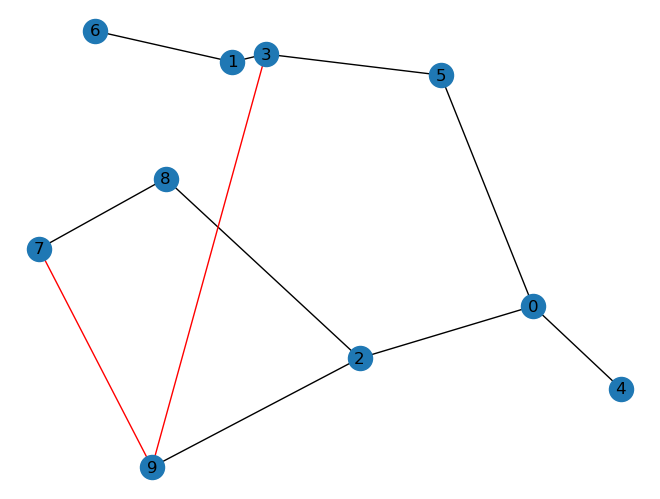

added edges [(3, 9), (9, 7)]
min cc 0.2903225806451613
budget 0.030248442987929947
-----------------------------------------------
(3, 9, 8)
edge (3, 9)
out of budget
edge (9, 8)
done False


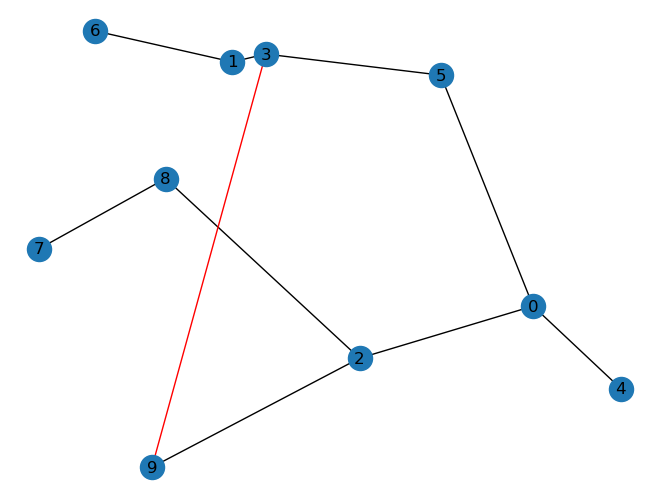

added edges [(3, 9)]
min cc 0.2727272727272727
budget -0.09514213713951902
-----------------------------------------------
(4, 0, 1)
done True
-----------------------------------------------
(4, 0, 2)
done True
-----------------------------------------------
(4, 0, 3)
done True
-----------------------------------------------
(4, 0, 5)
done True
-----------------------------------------------
(4, 0, 6)
done True
-----------------------------------------------
(4, 0, 7)
done True
-----------------------------------------------
(4, 0, 8)
done True
-----------------------------------------------
(4, 0, 9)
done True
-----------------------------------------------
(4, 1, 0)
edge (4, 1)
out of budget
edge (1, 0)
done False


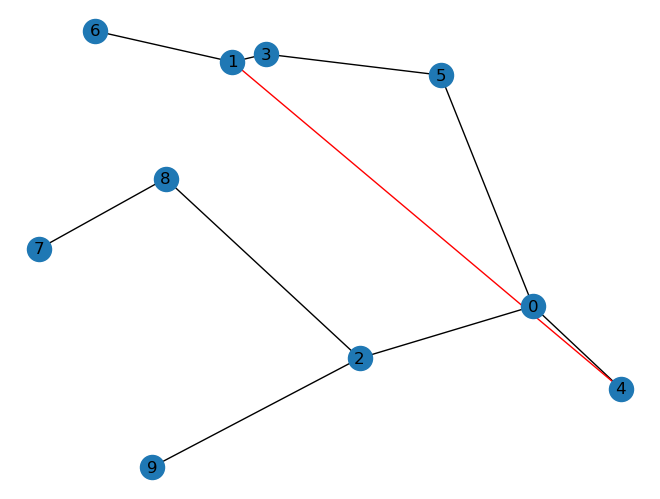

added edges [(4, 1)]
min cc 0.2727272727272727
budget -0.19866869015155741
-----------------------------------------------
(4, 1, 2)
edge (4, 1)
out of budget
edge (1, 2)
done False


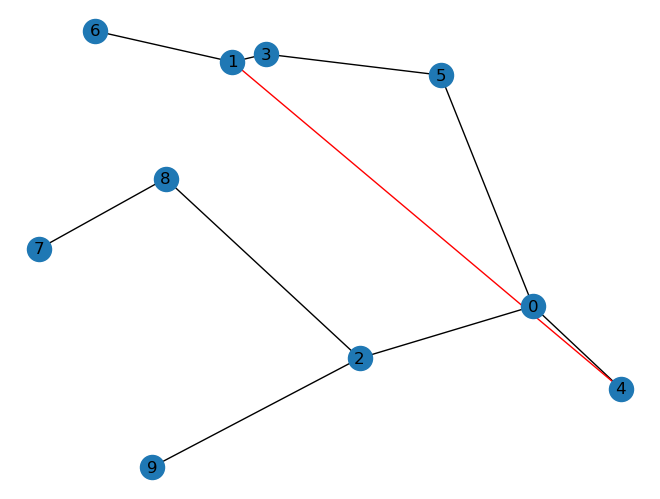

added edges [(4, 1)]
min cc 0.2727272727272727
budget -0.16252839958690002
-----------------------------------------------
(4, 1, 3)
edge (4, 1)
done True
-----------------------------------------------
(4, 1, 5)
edge (4, 1)
edge (1, 5)
done False


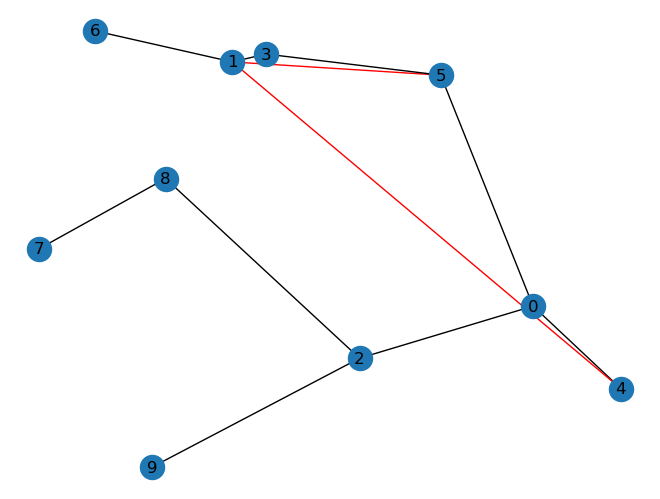

added edges [(4, 1), (1, 5)]
min cc 0.2727272727272727
budget 0.19619195574874526
-----------------------------------------------
(4, 1, 6)
edge (4, 1)
done True
-----------------------------------------------
(4, 1, 7)
edge (4, 1)
edge (1, 7)
done False


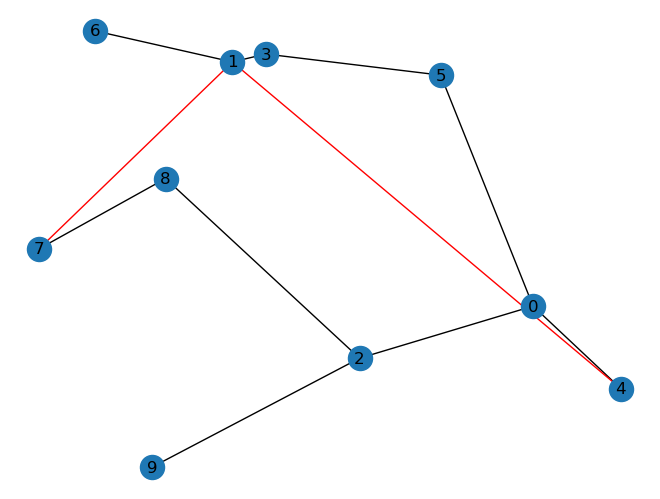

added edges [(4, 1), (1, 7)]
min cc 0.3333333333333333
budget 0.010906051252660753
-----------------------------------------------
(4, 1, 8)
edge (4, 1)
edge (1, 8)
done False


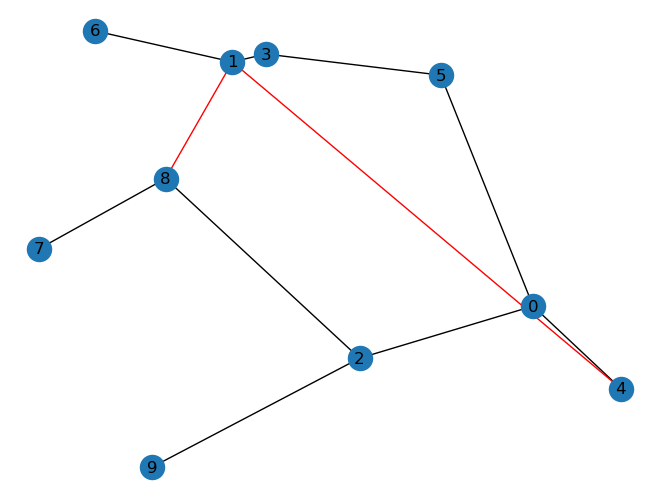

added edges [(4, 1), (1, 8)]
min cc 0.36
budget 0.25080021210212927
-----------------------------------------------
(4, 1, 9)
edge (4, 1)
out of budget
edge (1, 9)
done False


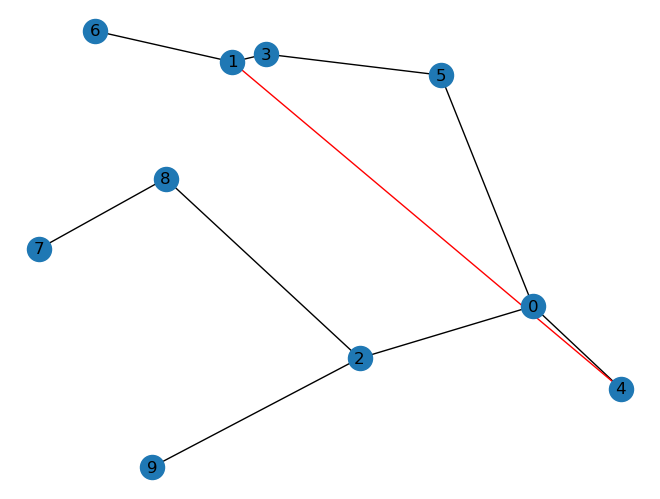

added edges [(4, 1)]
min cc 0.2727272727272727
budget -0.385552858206596
-----------------------------------------------
(4, 2, 0)
edge (4, 2)
done True
-----------------------------------------------
(4, 2, 1)
edge (4, 2)
edge (2, 1)
done False


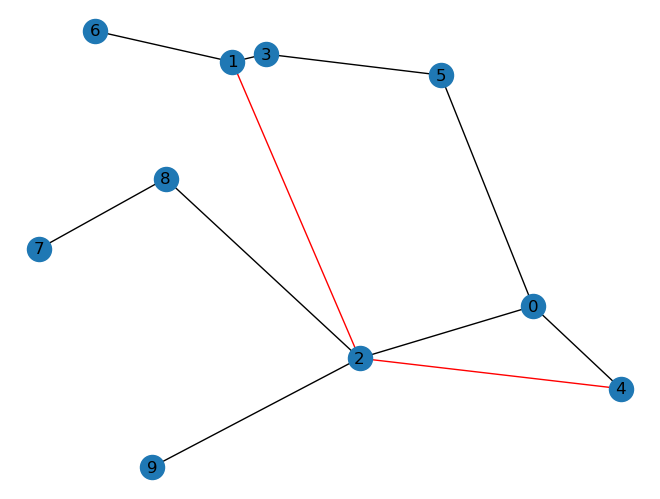

added edges [(4, 2), (2, 1)]
min cc 0.3333333333333333
budget 0.3754987967902902
-----------------------------------------------
(4, 2, 3)
edge (4, 2)
edge (2, 3)
done False


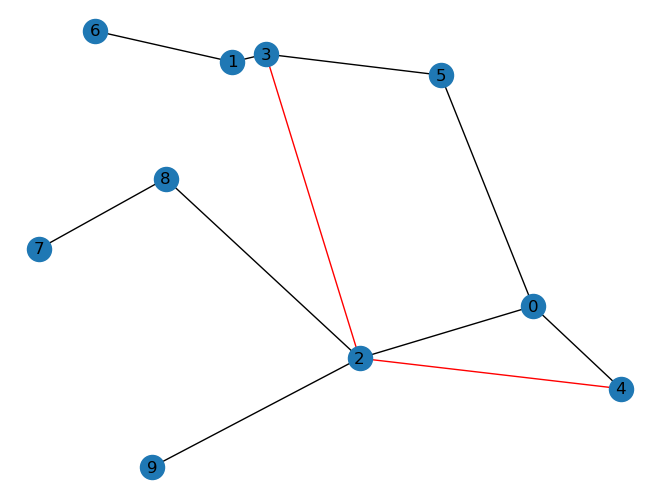

added edges [(4, 2), (2, 3)]
min cc 0.3
budget 0.37205816909097666
-----------------------------------------------
(4, 2, 5)
edge (4, 2)
edge (2, 5)
done False


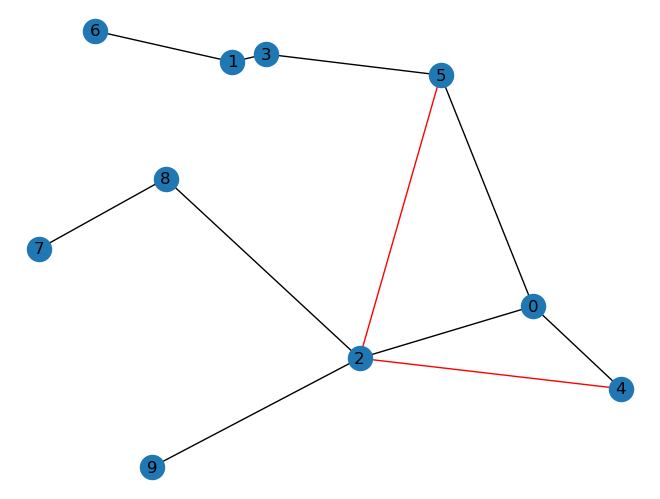

added edges [(4, 2), (2, 5)]
min cc 0.2571428571428571
budget 0.4227337836671494
-----------------------------------------------
(4, 2, 6)
edge (4, 2)
edge (2, 6)
done False


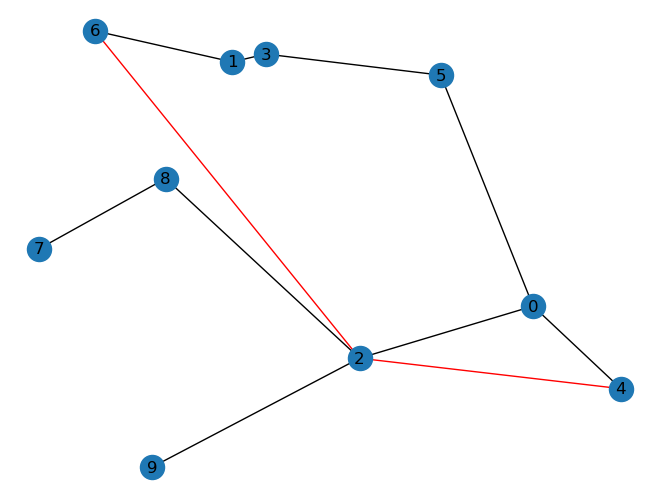

added edges [(4, 2), (2, 6)]
min cc 0.32142857142857145
budget 0.22119978426711306
-----------------------------------------------
(4, 2, 7)
edge (4, 2)
edge (2, 7)
done False


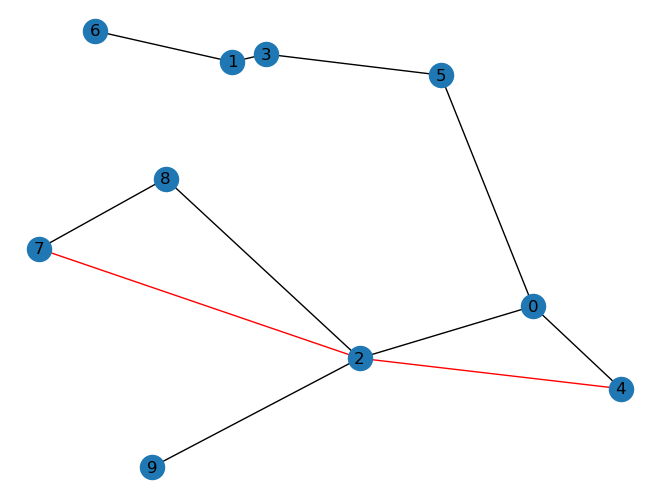

added edges [(4, 2), (2, 7)]
min cc 0.23684210526315788
budget 0.4988696595639569
-----------------------------------------------
(4, 2, 8)
edge (4, 2)
done True
-----------------------------------------------
(4, 2, 9)
edge (4, 2)
done True
-----------------------------------------------
(4, 3, 0)
edge (4, 3)
out of budget
edge (3, 0)
done False


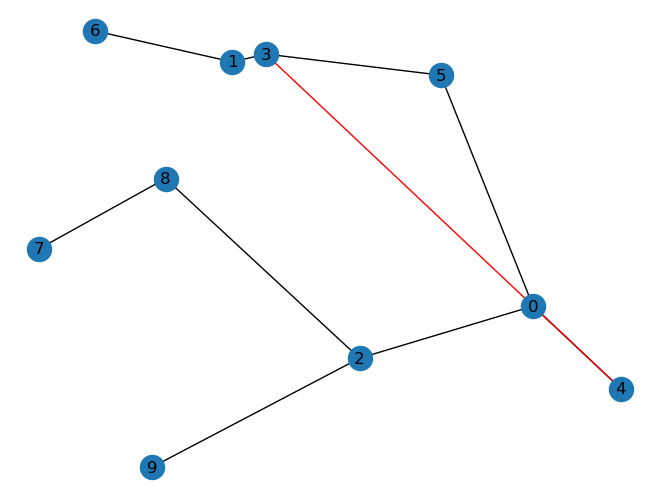

added edges [(4, 3)]
min cc 0.24324324324324326
budget -0.15814174584803153
-----------------------------------------------
(4, 3, 1)
edge (4, 3)
done True
-----------------------------------------------
(4, 3, 2)
edge (4, 3)
out of budget
edge (3, 2)
done False


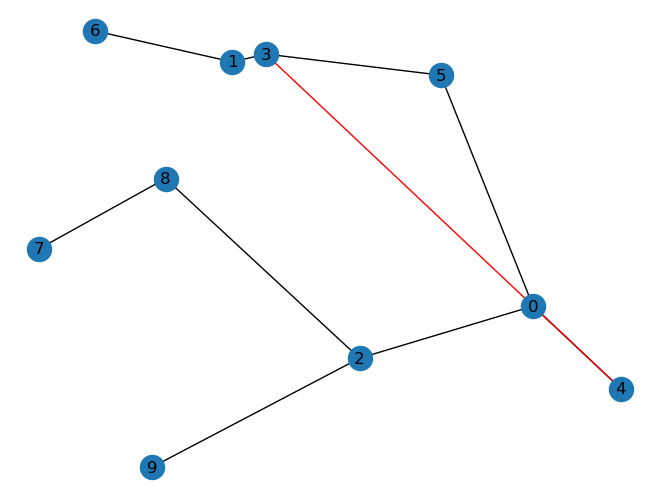

added edges [(4, 3)]
min cc 0.24324324324324326
budget -0.14593485485390145
-----------------------------------------------
(4, 3, 5)
edge (4, 3)
done True
-----------------------------------------------
(4, 3, 6)
edge (4, 3)
edge (3, 6)
done False


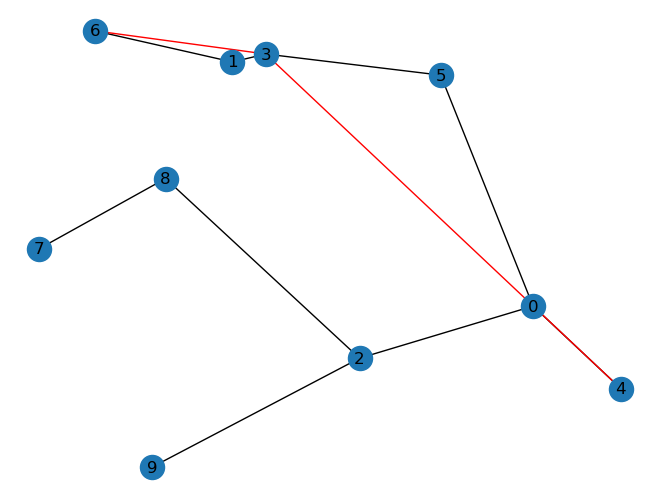

added edges [(4, 3), (3, 6)]
min cc 0.2647058823529412
budget 0.2730174249413685
-----------------------------------------------
(4, 3, 7)
edge (4, 3)
out of budget
edge (3, 7)
done False


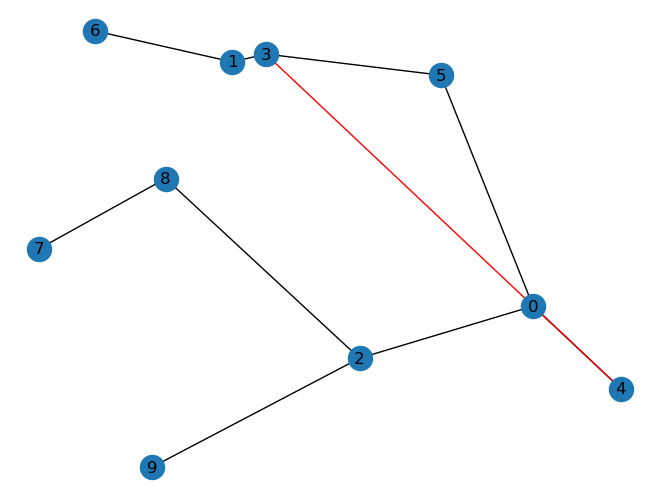

added edges [(4, 3)]
min cc 0.24324324324324326
budget -0.01648461575694049
-----------------------------------------------
(4, 3, 8)
edge (4, 3)
edge (3, 8)
done False


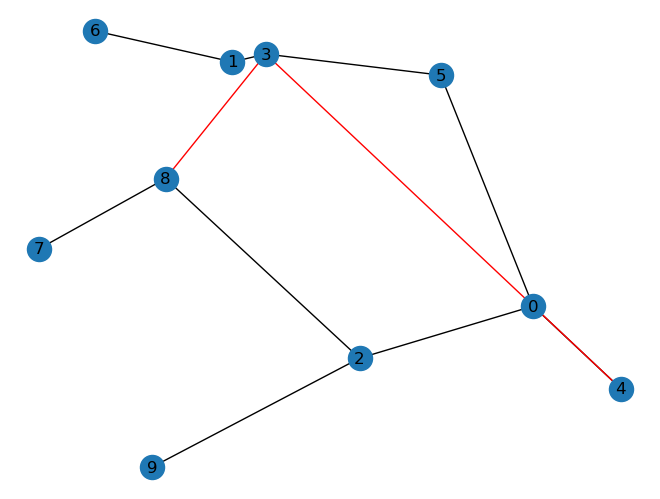

added edges [(4, 3), (3, 8)]
min cc 0.3103448275862069
budget 0.23092222331679485
-----------------------------------------------
(4, 3, 9)
edge (4, 3)
out of budget
edge (3, 9)
done False


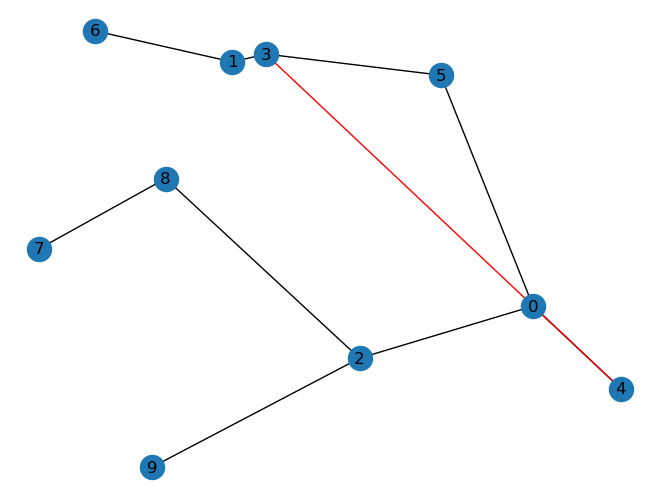

added edges [(4, 3)]
min cc 0.24324324324324326
budget -0.3921583885350278
-----------------------------------------------
(4, 5, 0)
edge (4, 5)
done True
-----------------------------------------------
(4, 5, 1)
edge (4, 5)
edge (5, 1)
done False


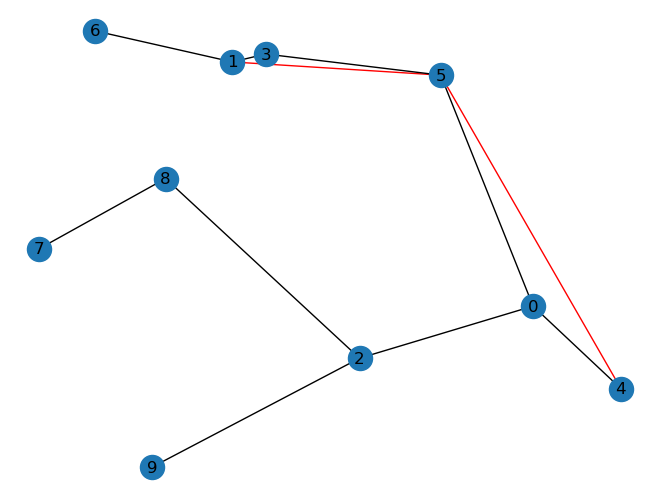

added edges [(4, 5), (5, 1)]
min cc 0.2727272727272727
budget 0.3998574906994721
-----------------------------------------------
(4, 5, 2)
edge (4, 5)
edge (5, 2)
done False


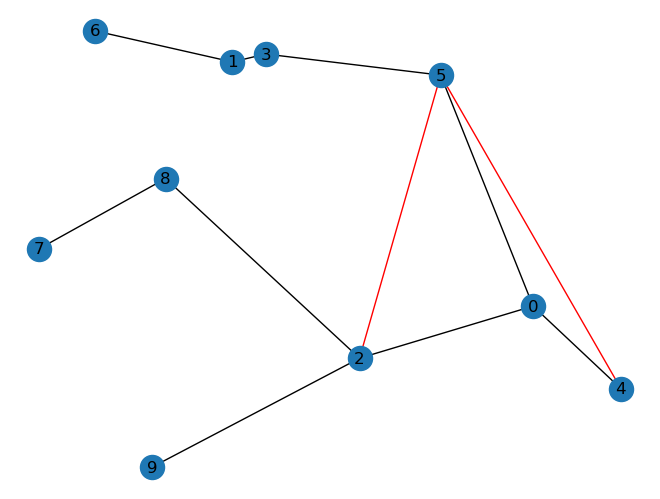

added edges [(4, 5), (5, 2)]
min cc 0.2647058823529412
budget 0.08837212224068602
-----------------------------------------------
(4, 5, 3)
edge (4, 5)
done True
-----------------------------------------------
(4, 5, 6)
edge (4, 5)
edge (5, 6)
done False


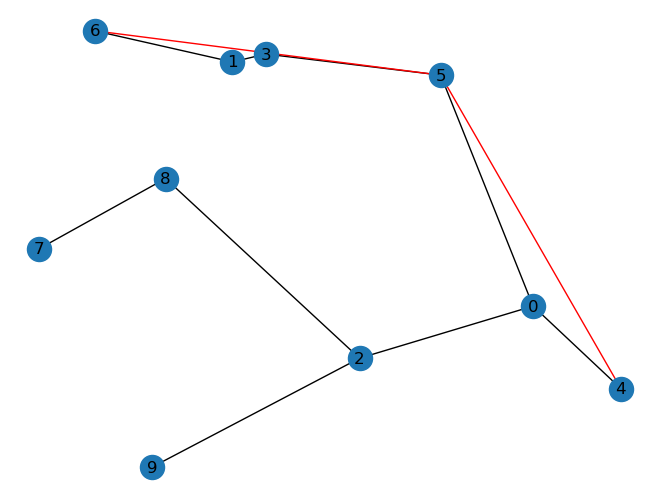

added edges [(4, 5), (5, 6)]
min cc 0.2727272727272727
budget 0.17005316619126665
-----------------------------------------------
(4, 5, 7)
edge (4, 5)
out of budget
edge (5, 7)
done False


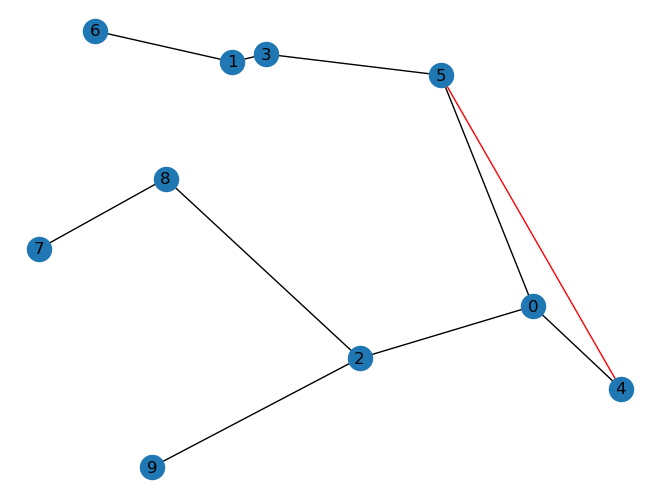

added edges [(4, 5)]
min cc 0.23684210526315788
budget -0.01940423863282481
-----------------------------------------------
(4, 5, 8)
edge (4, 5)
edge (5, 8)
done False


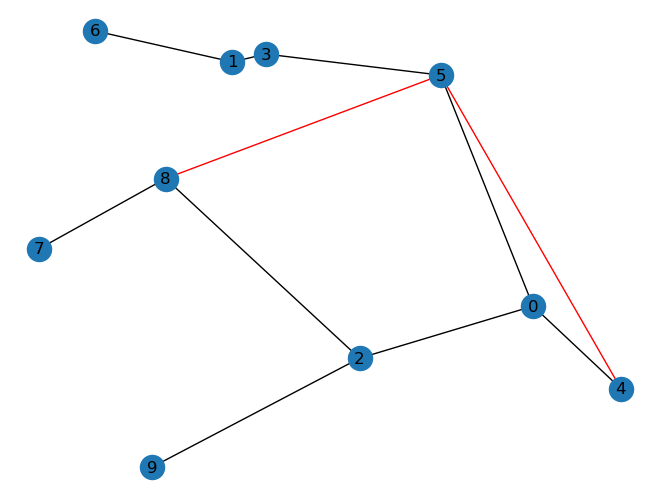

added edges [(4, 5), (5, 8)]
min cc 0.2647058823529412
budget 0.23617354794423617
-----------------------------------------------
(4, 5, 9)
edge (4, 5)
out of budget
edge (5, 9)
done False


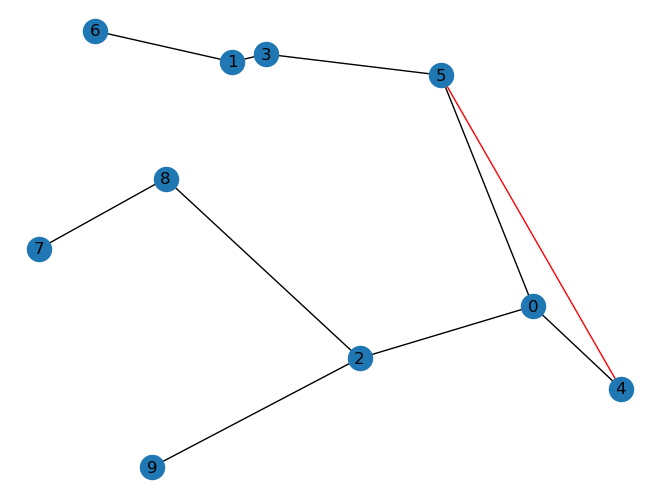

added edges [(4, 5)]
min cc 0.23684210526315788
budget -0.25898256606411374
-----------------------------------------------
(4, 6, 0)
edge (4, 6)
out of budget
edge (6, 0)
done False


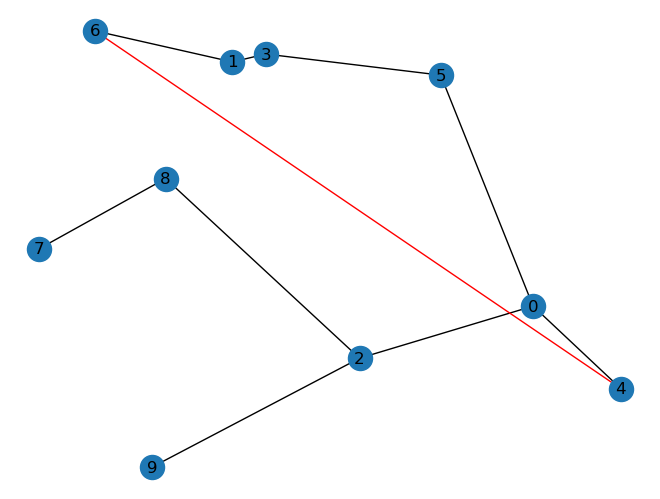

added edges [(4, 6)]
min cc 0.2727272727272727
budget -0.610318828469588
-----------------------------------------------
(4, 6, 1)
edge (4, 6)
done True
-----------------------------------------------
(4, 6, 2)
edge (4, 6)
out of budget
edge (6, 2)
done False


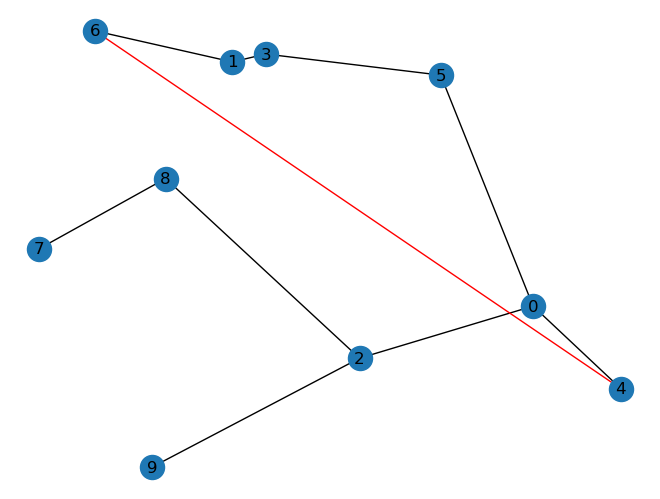

added edges [(4, 6)]
min cc 0.2727272727272727
budget -0.5210143749940283
-----------------------------------------------
(4, 6, 3)
edge (4, 6)
edge (6, 3)
done False


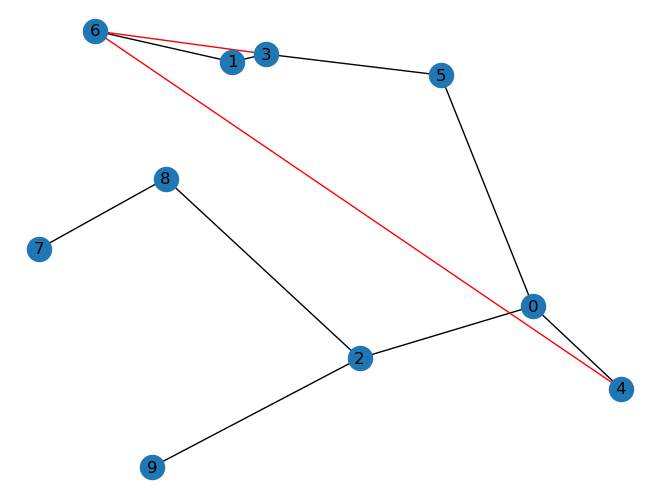

added edges [(4, 6), (6, 3)]
min cc 0.2727272727272727
budget 0.048796289625105294
-----------------------------------------------
(4, 6, 5)
edge (4, 6)
out of budget
edge (6, 5)
done False


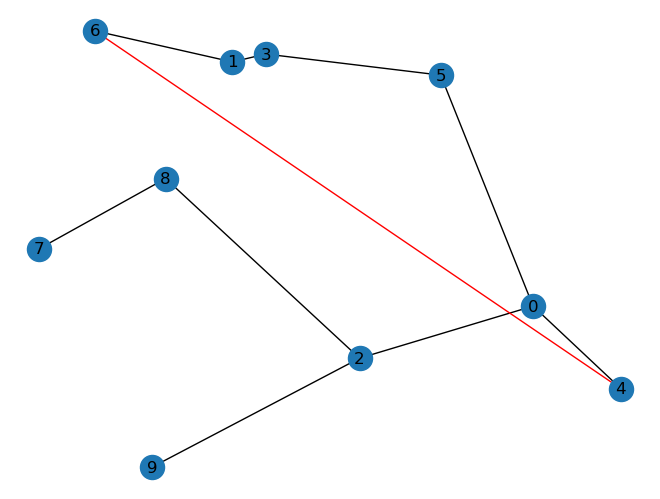

added edges [(4, 6)]
min cc 0.2727272727272727
budget -0.23779933164341127
-----------------------------------------------
(4, 6, 7)
edge (4, 6)
out of budget
edge (6, 7)
done False


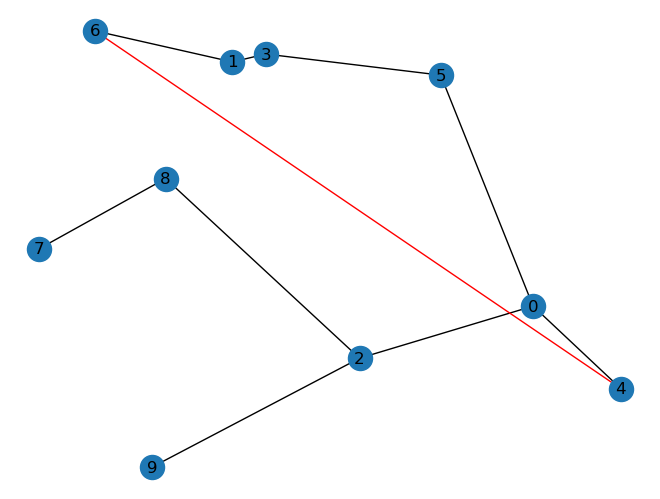

added edges [(4, 6)]
min cc 0.2727272727272727
budget -0.1679678888188984
-----------------------------------------------
(4, 6, 8)
edge (4, 6)
out of budget
edge (6, 8)
done False


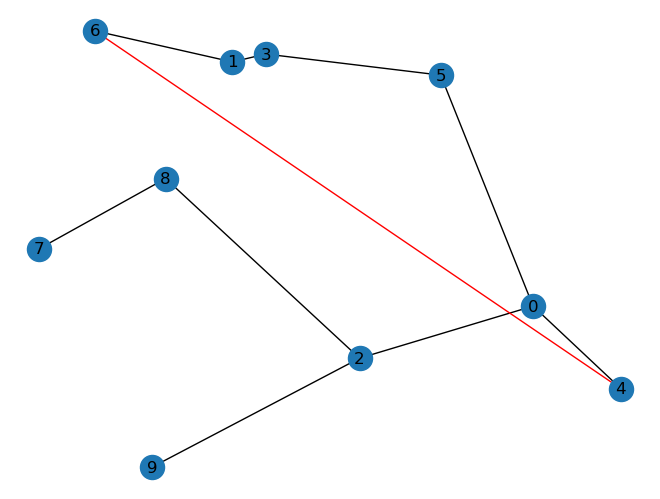

added edges [(4, 6)]
min cc 0.2727272727272727
budget -0.02110357542190583
-----------------------------------------------
(4, 6, 9)
edge (4, 6)
out of budget
edge (6, 9)
done False


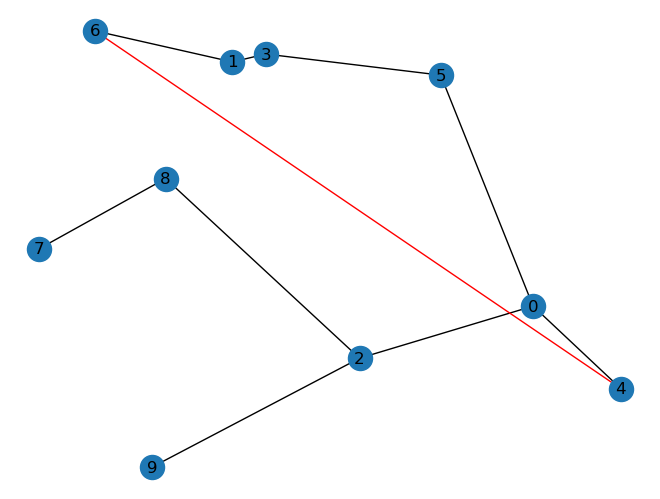

added edges [(4, 6)]
min cc 0.2727272727272727
budget -0.6547893838157217
-----------------------------------------------
(4, 7, 0)
edge (4, 7)
out of budget
edge (7, 0)
done False


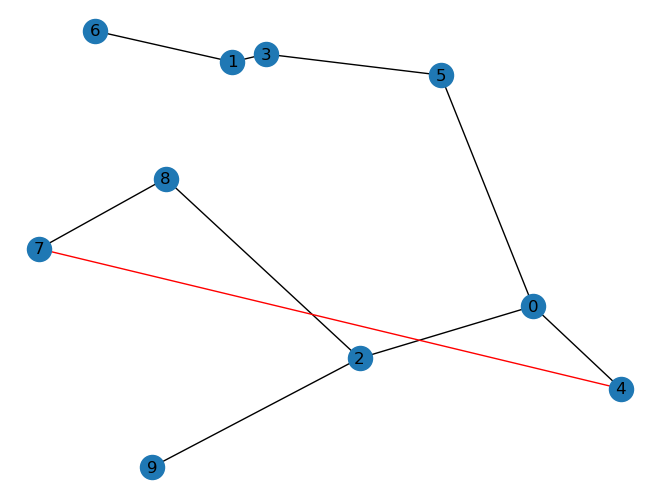

added edges [(4, 7)]
min cc 0.23684210526315788
budget -0.2999154527301573
-----------------------------------------------
(4, 7, 1)
edge (4, 7)
out of budget
edge (7, 1)
done False


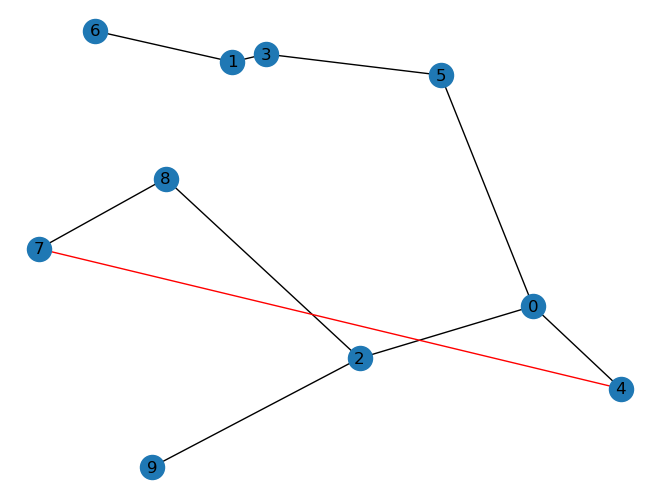

added edges [(4, 7)]
min cc 0.23684210526315788
budget -0.014522415855988347
-----------------------------------------------
(4, 7, 2)
edge (4, 7)
out of budget
edge (7, 2)
done False


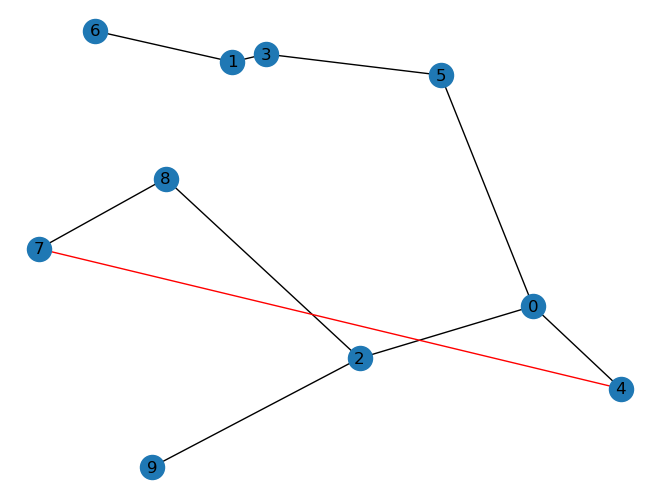

added edges [(4, 7)]
min cc 0.23684210526315788
budget -0.0645860039218824
-----------------------------------------------
(4, 7, 3)
edge (4, 7)
out of budget
edge (7, 3)
done False


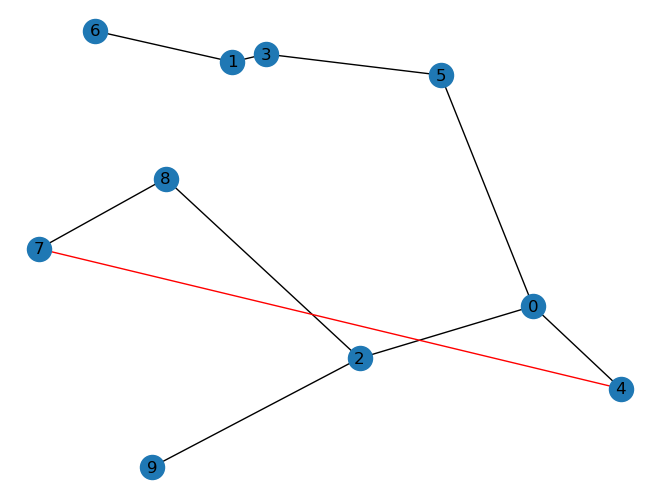

added edges [(4, 7)]
min cc 0.23684210526315788
budget -0.06194725529790168
-----------------------------------------------
(4, 7, 5)
edge (4, 7)
out of budget
edge (7, 5)
done False


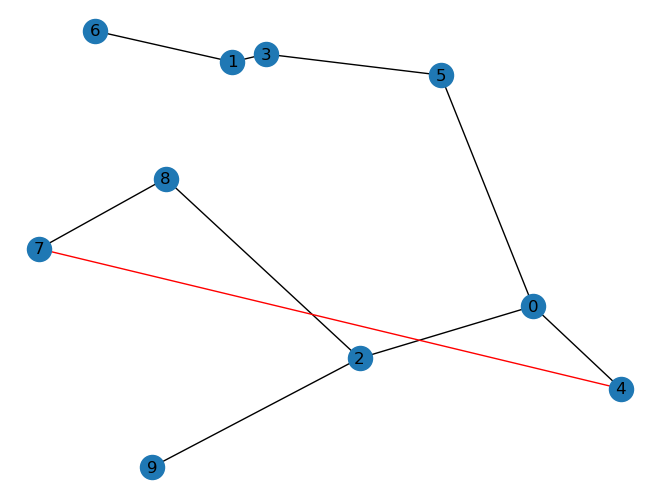

added edges [(4, 7)]
min cc 0.23684210526315788
budget -0.24849824069220072
-----------------------------------------------
(4, 7, 6)
edge (4, 7)
edge (7, 6)
done False


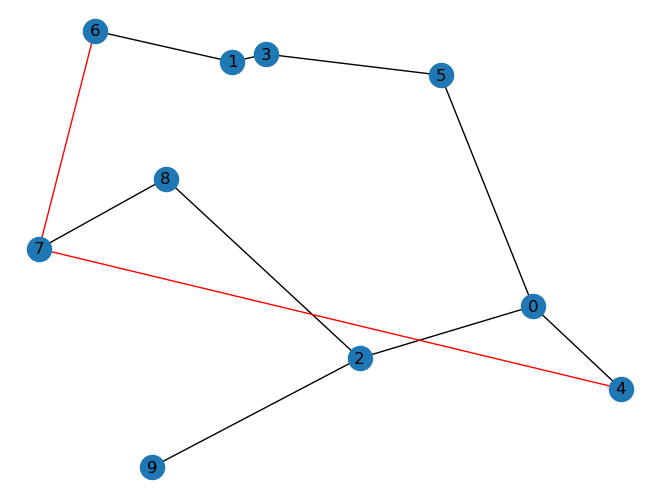

added edges [(4, 7), (7, 6)]
min cc 0.3333333333333333
budget 0.010790606956403603
-----------------------------------------------
(4, 7, 8)
edge (4, 7)
done True
-----------------------------------------------
(4, 7, 9)
edge (4, 7)
out of budget
edge (7, 9)
done False


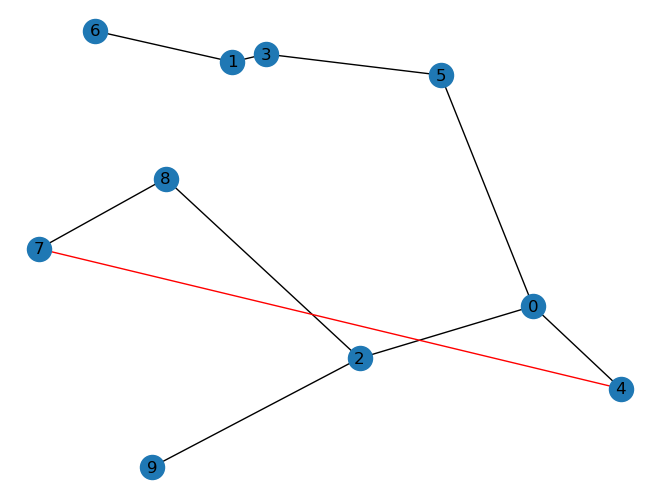

added edges [(4, 7)]
min cc 0.23684210526315788
budget -0.014831921606755949
-----------------------------------------------
(4, 8, 0)
edge (4, 8)
out of budget
edge (8, 0)
done False


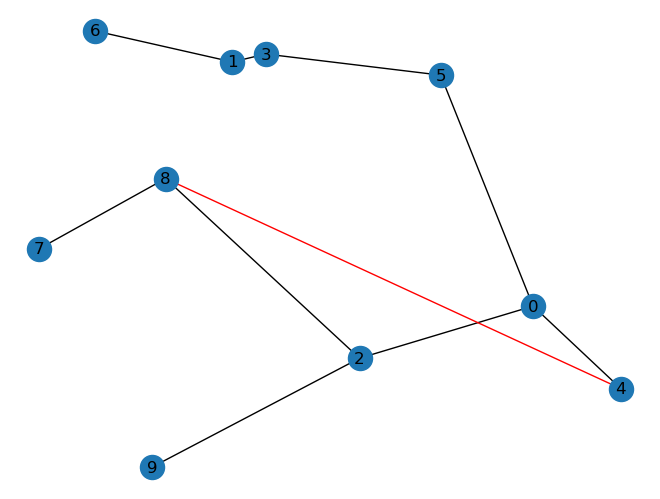

added edges [(4, 8)]
min cc 0.23076923076923078
budget -0.033647507173257485
-----------------------------------------------
(4, 8, 1)
edge (4, 8)
edge (8, 1)
done False


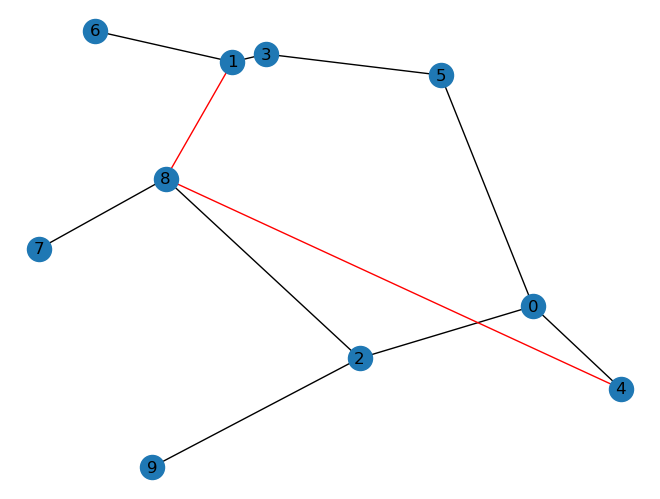

added edges [(4, 8), (8, 1)]
min cc 0.36
budget 0.3424622839145462
-----------------------------------------------
(4, 8, 2)
edge (4, 8)
done True
-----------------------------------------------
(4, 8, 3)
edge (4, 8)
edge (8, 3)
done False


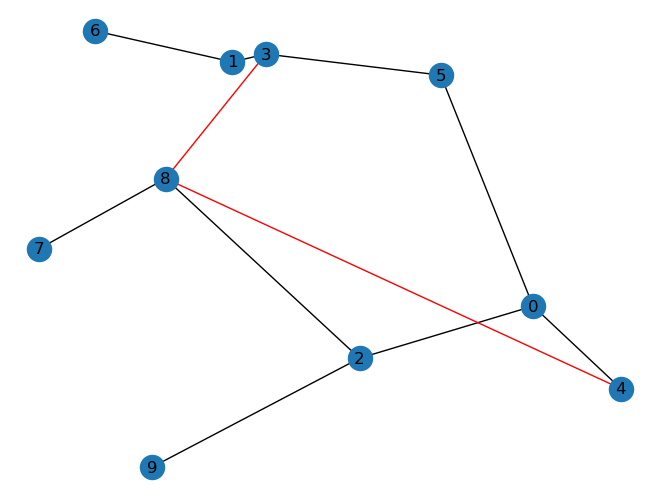

added edges [(4, 8), (8, 3)]
min cc 0.3
budget 0.3025501226968997
-----------------------------------------------
(4, 8, 5)
edge (4, 8)
edge (8, 5)
done False


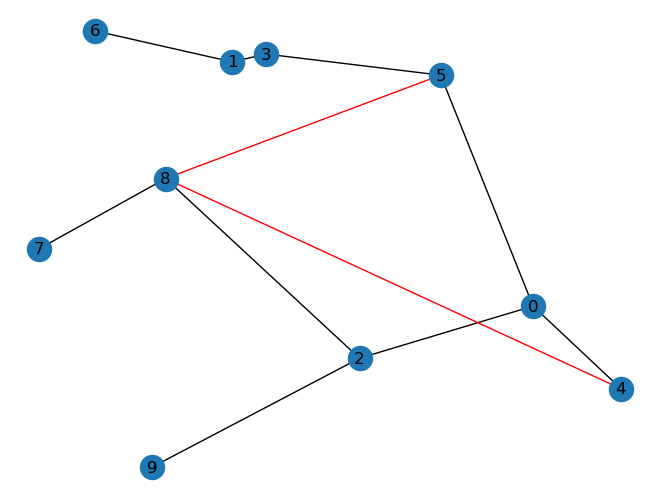

added edges [(4, 8), (8, 5)]
min cc 0.2571428571428571
budget 0.12417008480592628
-----------------------------------------------
(4, 8, 6)
edge (4, 8)
edge (8, 6)
done False


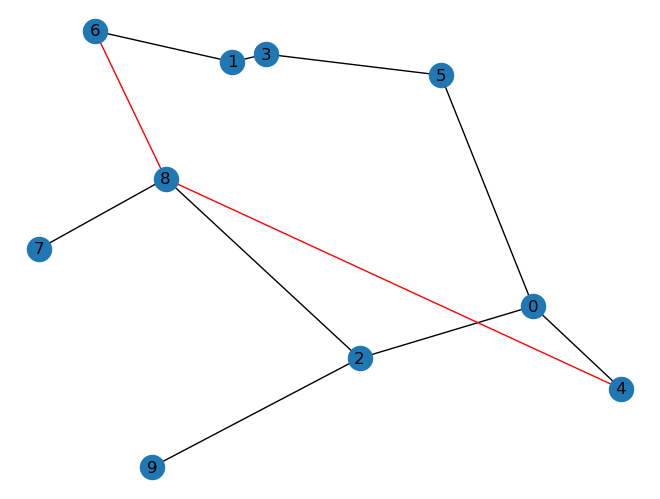

added edges [(4, 8), (8, 6)]
min cc 0.36
budget 0.2747454592744622
-----------------------------------------------
(4, 8, 7)
edge (4, 8)
done True
-----------------------------------------------
(4, 8, 9)
edge (4, 8)
out of budget
edge (8, 9)
done False


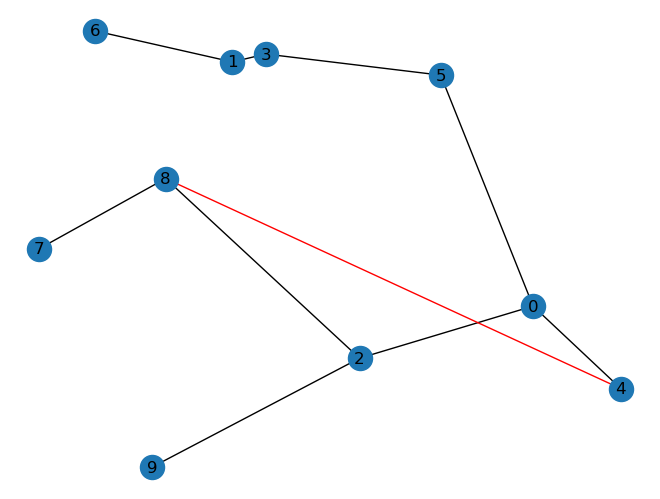

added edges [(4, 8)]
min cc 0.23076923076923078
budget -0.023131962813138895
-----------------------------------------------
(4, 9, 0)
edge (4, 9)
edge (9, 0)
done False


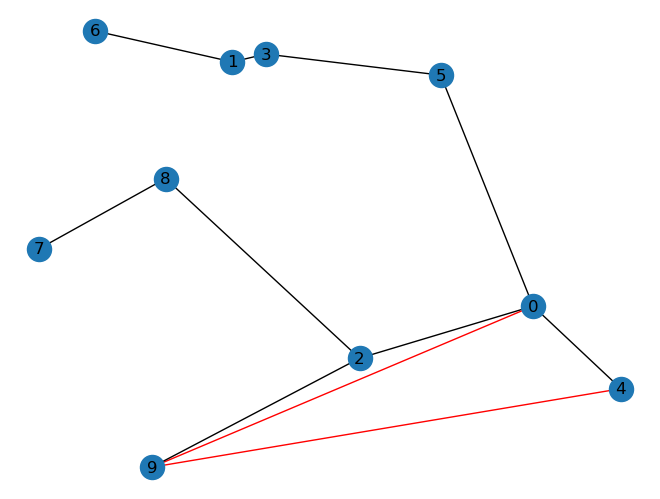

added edges [(4, 9), (9, 0)]
min cc 0.23684210526315788
budget 0.007534268673714539
-----------------------------------------------
(4, 9, 1)
edge (4, 9)
out of budget
edge (9, 1)
done False


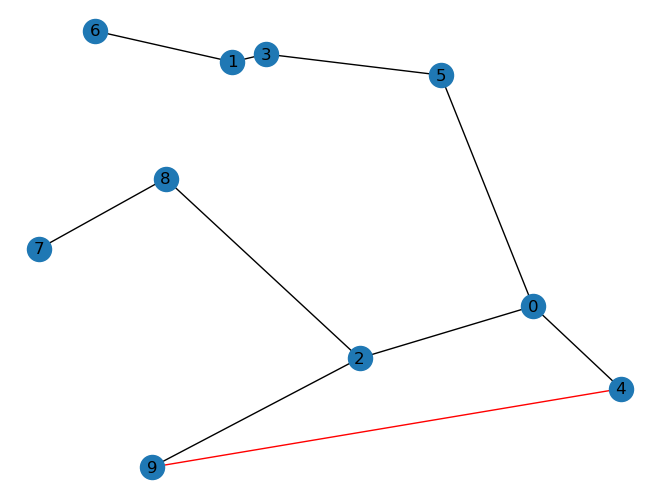

added edges [(4, 9)]
min cc 0.23076923076923078
budget -0.19772921150798417
-----------------------------------------------
(4, 9, 2)
edge (4, 9)
done True
-----------------------------------------------
(4, 9, 3)
edge (4, 9)
out of budget
edge (9, 3)
done False


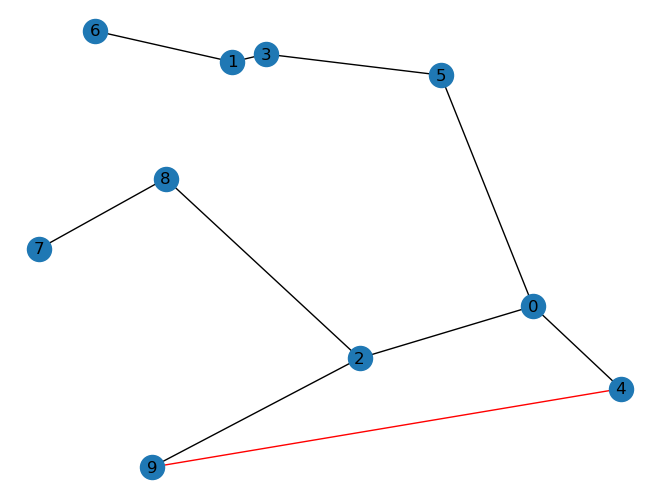

added edges [(4, 9)]
min cc 0.23076923076923078
budget -0.22436891426872807
-----------------------------------------------
(4, 9, 5)
edge (4, 9)
out of budget
edge (9, 5)
done False


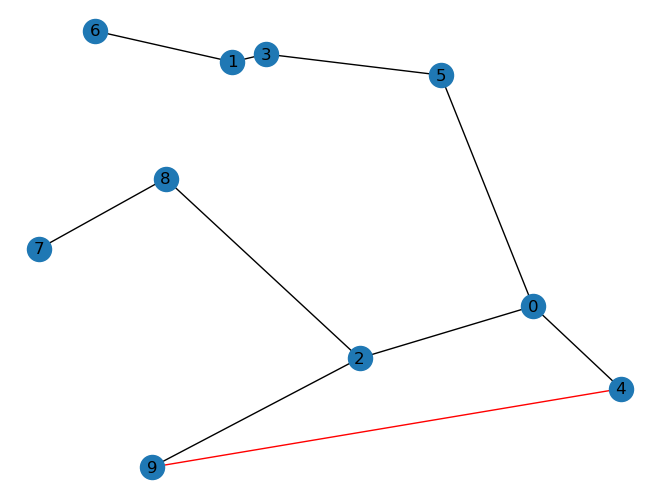

added edges [(4, 9)]
min cc 0.23076923076923078
budget -0.2748244543162287
-----------------------------------------------
(4, 9, 6)
edge (4, 9)
out of budget
edge (9, 6)
done False


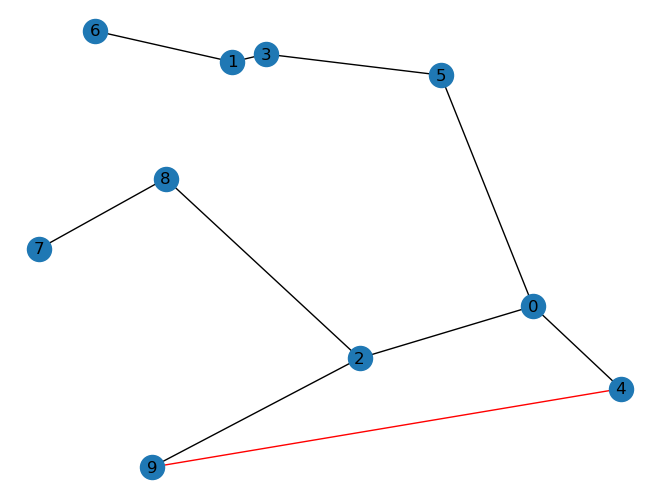

added edges [(4, 9)]
min cc 0.23076923076923078
budget -0.26277877423315876
-----------------------------------------------
(4, 9, 7)
edge (4, 9)
edge (9, 7)
done False


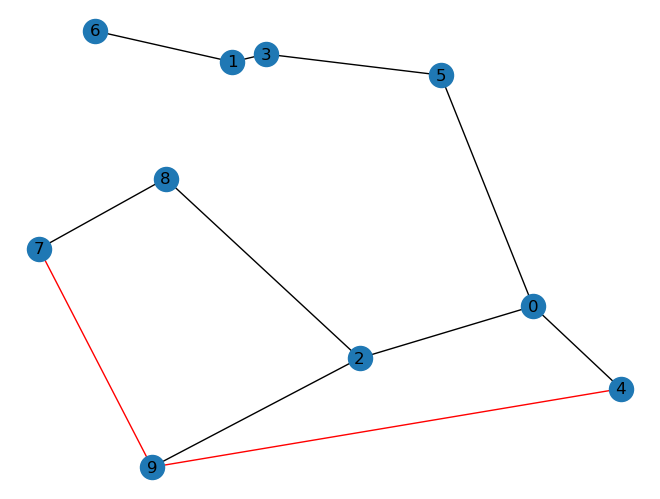

added edges [(4, 9), (9, 7)]
min cc 0.23076923076923078
budget 0.198420192200505
-----------------------------------------------
(4, 9, 8)
edge (4, 9)
edge (9, 8)
done False


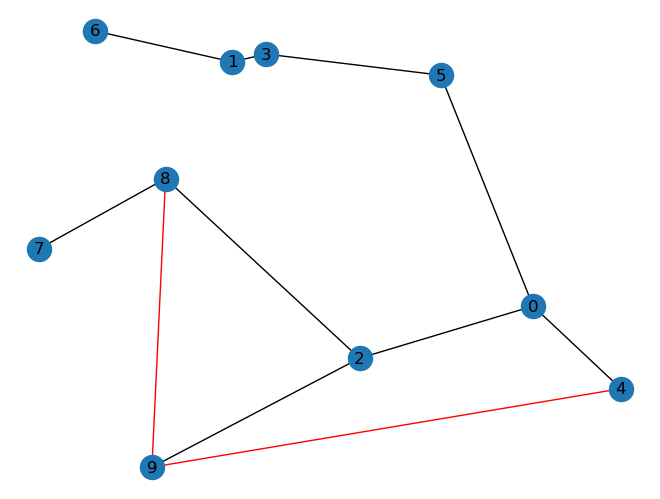

added edges [(4, 9), (9, 8)]
min cc 0.23076923076923078
budget 0.07302961207305603
-----------------------------------------------
(5, 0, 1)
done True
-----------------------------------------------
(5, 0, 2)
done True
-----------------------------------------------
(5, 0, 3)
done True
-----------------------------------------------
(5, 0, 4)
done True
-----------------------------------------------
(5, 0, 6)
done True
-----------------------------------------------
(5, 0, 7)
done True
-----------------------------------------------
(5, 0, 8)
done True
-----------------------------------------------
(5, 0, 9)
done True
-----------------------------------------------
(5, 1, 0)
edge (5, 1)
edge (1, 0)
done False


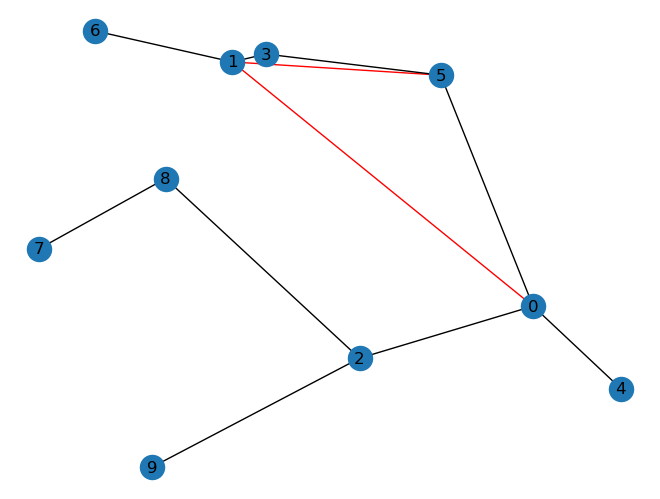

added edges [(5, 1), (1, 0)]
min cc 0.2903225806451613
budget 0.42936772405056445
-----------------------------------------------
(5, 1, 2)
edge (5, 1)
edge (1, 2)
done False


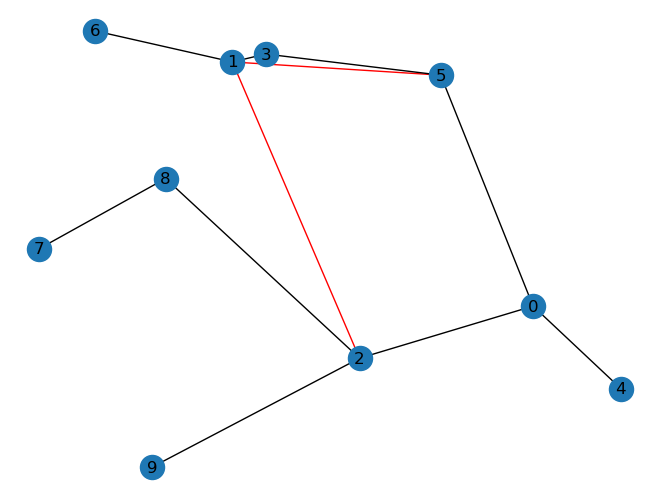

added edges [(5, 1), (1, 2)]
min cc 0.32142857142857145
budget 0.46550801461522184
-----------------------------------------------
(5, 1, 3)
edge (5, 1)
done True
-----------------------------------------------
(5, 1, 4)
edge (5, 1)
edge (1, 4)
done False


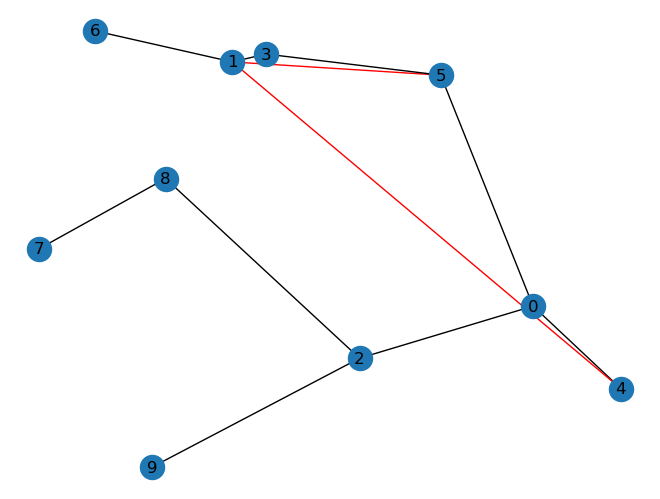

added edges [(5, 1), (1, 4)]
min cc 0.2727272727272727
budget 0.19619195574874515
-----------------------------------------------
(5, 1, 6)
edge (5, 1)
done True
-----------------------------------------------
(5, 1, 7)
edge (5, 1)
edge (1, 7)
done False


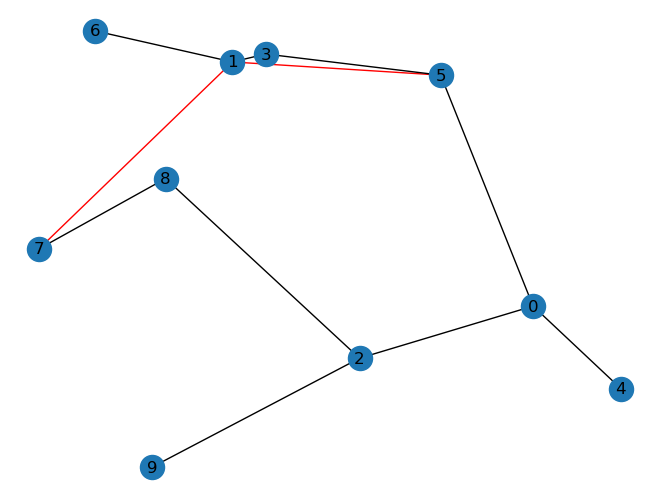

added edges [(5, 1), (1, 7)]
min cc 0.3333333333333333
budget 0.6389424654547826
-----------------------------------------------
(5, 1, 8)
edge (5, 1)
edge (1, 8)
done False


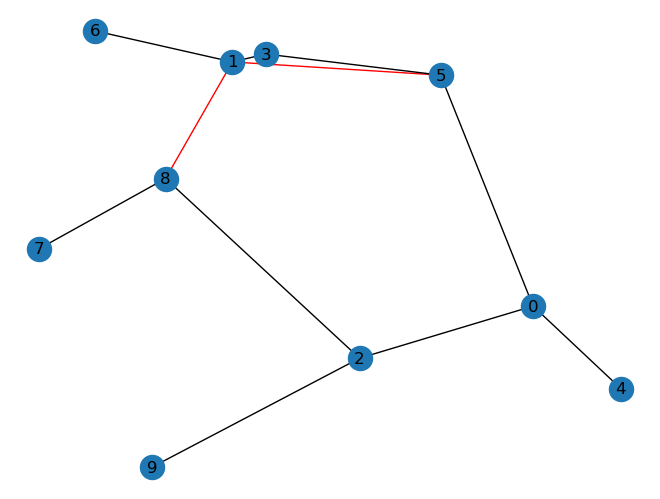

added edges [(5, 1), (1, 8)]
min cc 0.36
budget 0.8788366263042511
-----------------------------------------------
(5, 1, 9)
edge (5, 1)
edge (1, 9)
done False


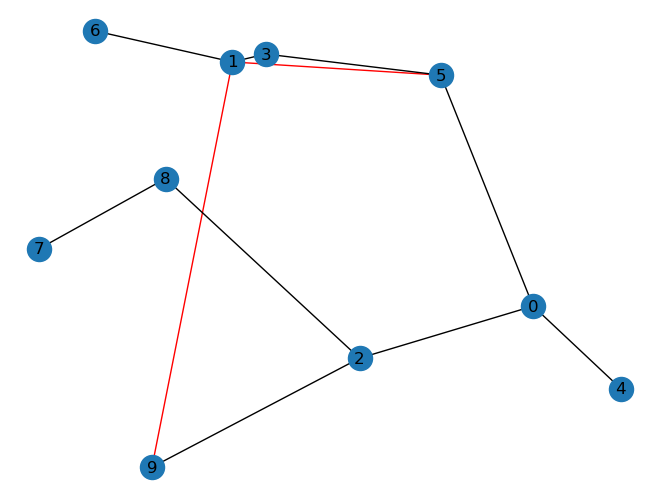

added edges [(5, 1), (1, 9)]
min cc 0.2903225806451613
budget 0.24248355599552585
-----------------------------------------------
(5, 2, 0)
edge (5, 2)
done True
-----------------------------------------------
(5, 2, 1)
edge (5, 2)
edge (2, 1)
done False


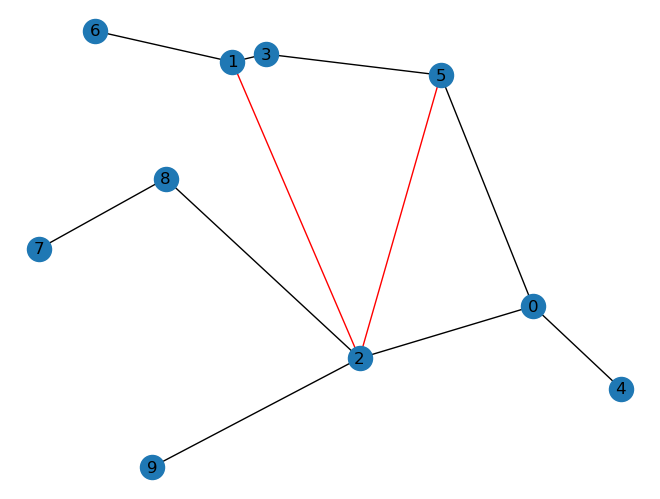

added edges [(5, 2), (2, 1)]
min cc 0.3333333333333333
budget 0.1540226461564359
-----------------------------------------------
(5, 2, 3)
edge (5, 2)
edge (2, 3)
done False


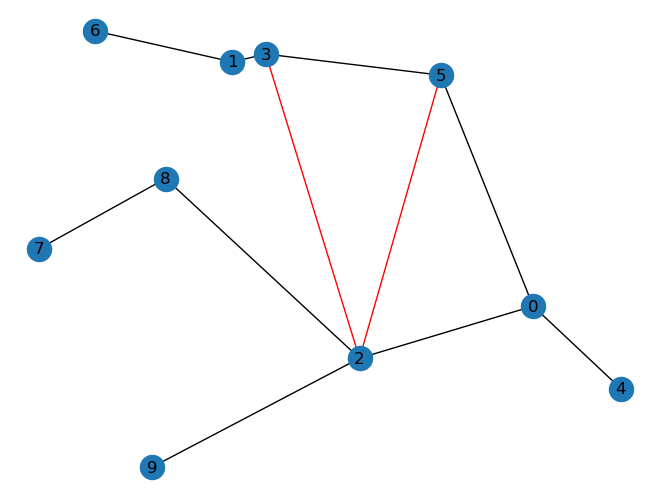

added edges [(5, 2), (2, 3)]
min cc 0.2903225806451613
budget 0.15058201845712238
-----------------------------------------------
(5, 2, 4)
edge (5, 2)
edge (2, 4)
done False


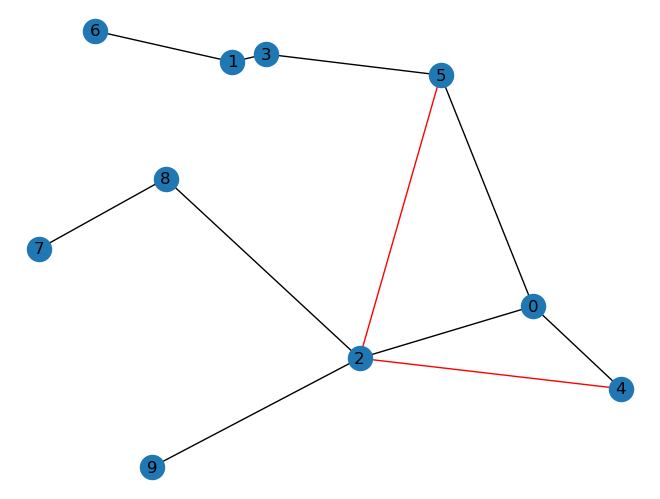

added edges [(5, 2), (2, 4)]
min cc 0.2571428571428571
budget 0.42273378366714953
-----------------------------------------------
(5, 2, 6)
edge (5, 2)
out of budget
edge (2, 6)
done False


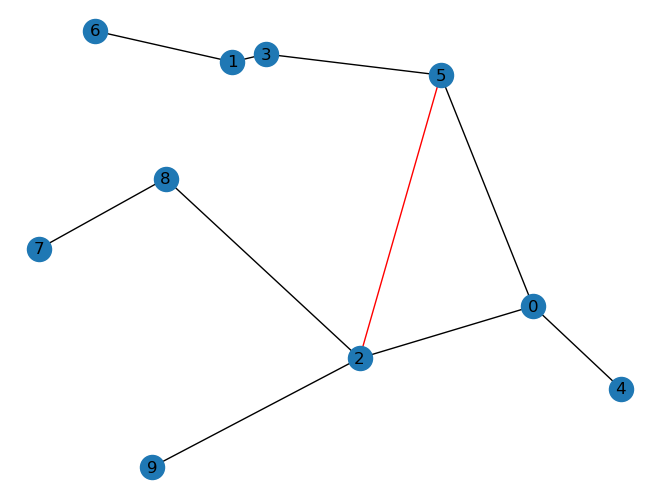

added edges [(5, 2)]
min cc 0.2571428571428571
budget -0.00027636636674122084
-----------------------------------------------
(5, 2, 7)
edge (5, 2)
edge (2, 7)
done False


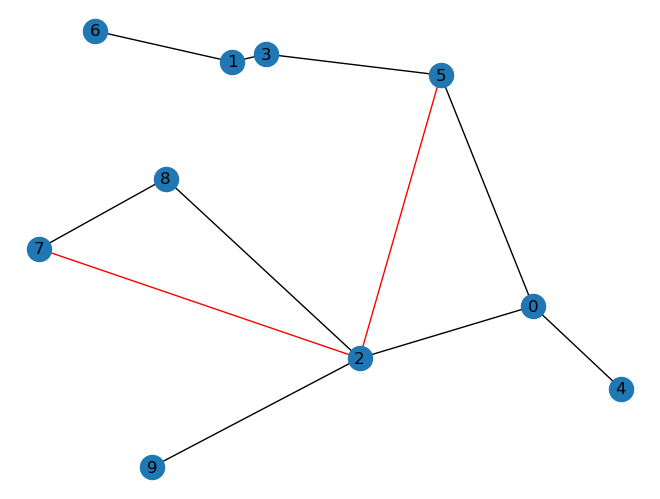

added edges [(5, 2), (2, 7)]
min cc 0.2647058823529412
budget 0.2773935089301026
-----------------------------------------------
(5, 2, 8)
edge (5, 2)
done True
-----------------------------------------------
(5, 2, 9)
edge (5, 2)
done True
-----------------------------------------------
(5, 3, 0)
done True
-----------------------------------------------
(5, 3, 1)
done True
-----------------------------------------------
(5, 3, 2)
done True
-----------------------------------------------
(5, 3, 4)
done True
-----------------------------------------------
(5, 3, 6)
done True
-----------------------------------------------
(5, 3, 7)
done True
-----------------------------------------------
(5, 3, 8)
done True
-----------------------------------------------
(5, 3, 9)
done True
-----------------------------------------------
(5, 4, 0)
edge (5, 4)
done True
-----------------------------------------------
(5, 4, 1)
edge (5, 4)
out of budget
edge (4, 1)
done False


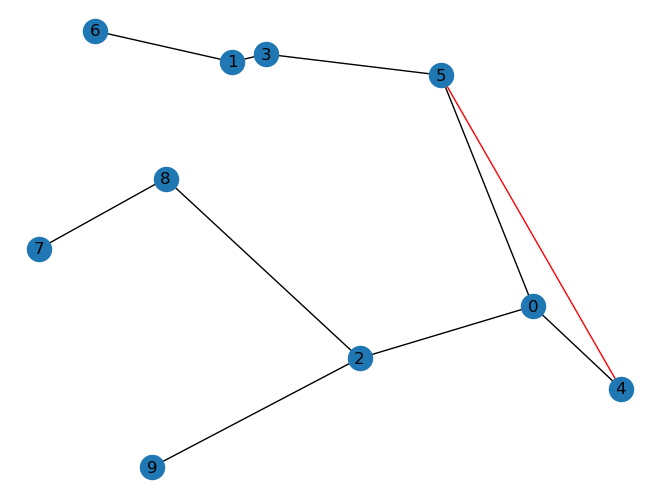

added edges [(5, 4)]
min cc 0.23684210526315788
budget -0.2281789235026499
-----------------------------------------------
(5, 4, 2)
edge (5, 4)
edge (4, 2)
done False


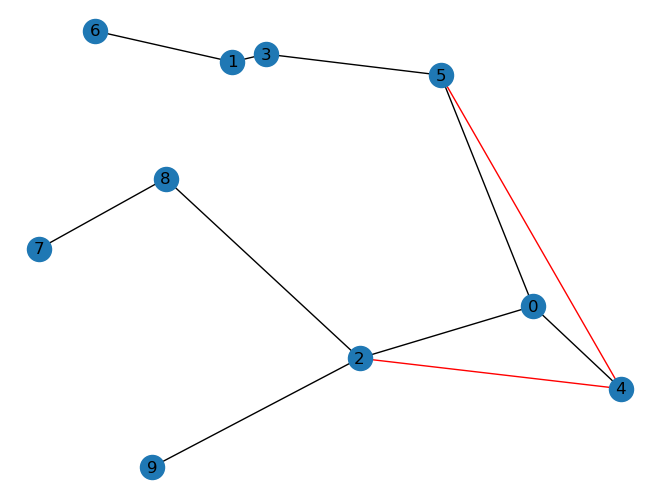

added edges [(5, 4), (4, 2)]
min cc 0.23684210526315788
budget 0.3098482728745404
-----------------------------------------------
(5, 4, 3)
edge (5, 4)
out of budget
edge (4, 3)
done False


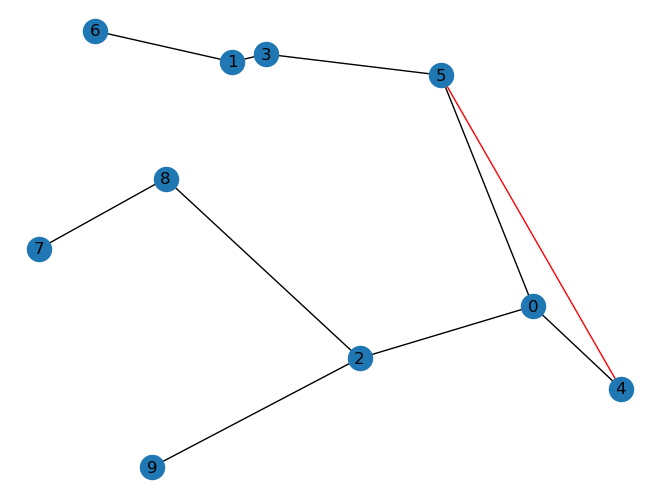

added edges [(5, 4)]
min cc 0.23684210526315788
budget -0.2081447510703378
-----------------------------------------------
(5, 4, 6)
edge (5, 4)
out of budget
edge (4, 6)
done False


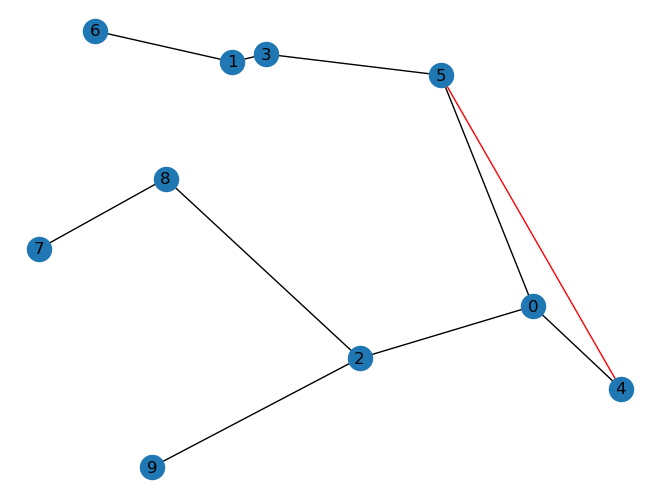

added edges [(5, 4)]
min cc 0.23684210526315788
budget -0.432365886386601
-----------------------------------------------
(5, 4, 7)
edge (5, 4)
out of budget
edge (4, 7)
done False


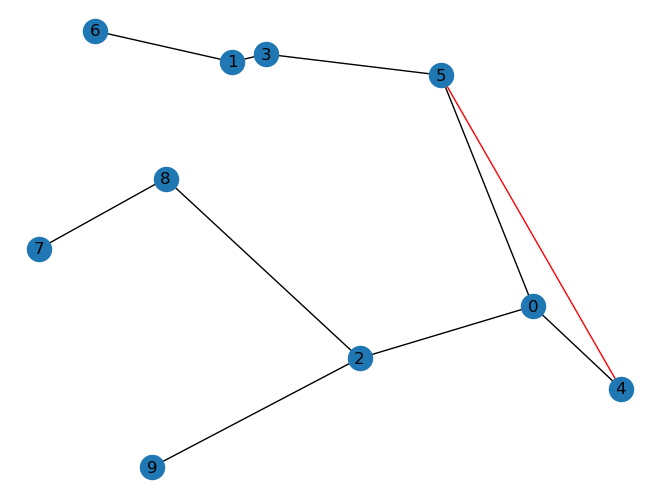

added edges [(5, 4)]
min cc 0.23684210526315788
budget -0.253607390611299
-----------------------------------------------
(5, 4, 8)
edge (5, 4)
out of budget
edge (4, 8)
done False


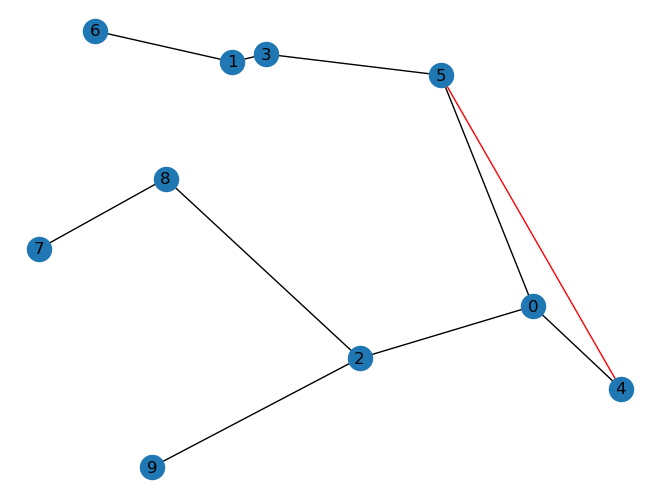

added edges [(5, 4)]
min cc 0.23684210526315788
budget -0.13651685169023298
-----------------------------------------------
(5, 4, 9)
edge (5, 4)
out of budget
edge (4, 9)
done False


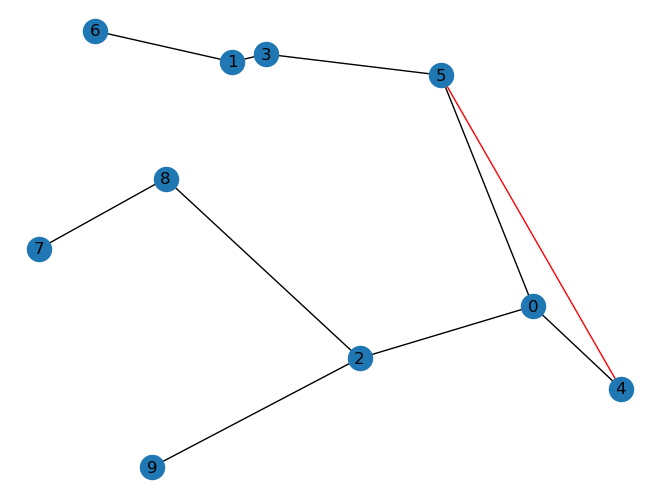

added edges [(5, 4)]
min cc 0.23684210526315788
budget -0.040355276804038054
-----------------------------------------------
(5, 6, 0)
edge (5, 6)
out of budget
edge (6, 0)
done False


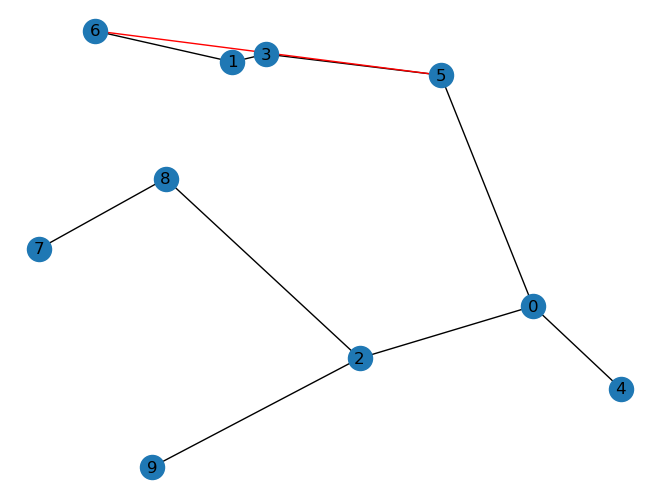

added edges [(5, 6)]
min cc 0.2727272727272727
budget -0.007899775891720306
-----------------------------------------------
(5, 6, 1)
edge (5, 6)
done True
-----------------------------------------------
(5, 6, 2)
edge (5, 6)
edge (6, 2)
done False


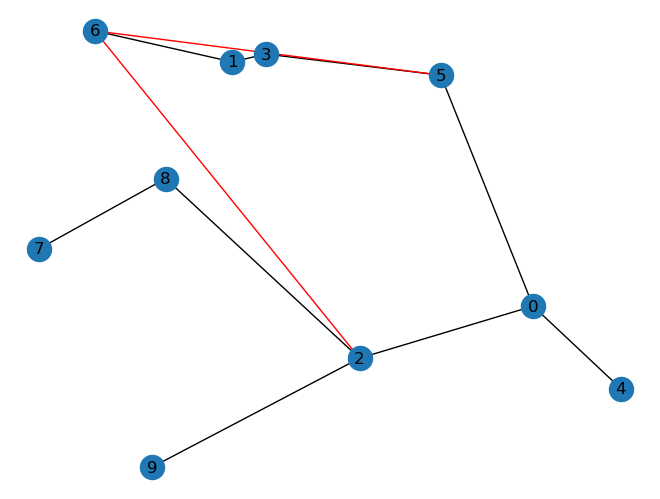

added edges [(5, 6), (6, 2)]
min cc 0.3103448275862069
budget 0.0814046775838394
-----------------------------------------------
(5, 6, 3)
edge (5, 6)
edge (6, 3)
done False


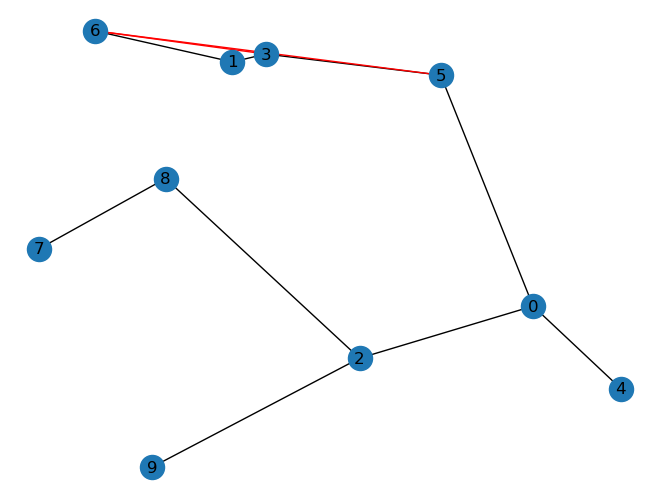

added edges [(5, 6), (6, 3)]
min cc 0.2727272727272727
budget 0.651215342202973
-----------------------------------------------
(5, 6, 4)
edge (5, 6)
out of budget
edge (6, 4)
done False


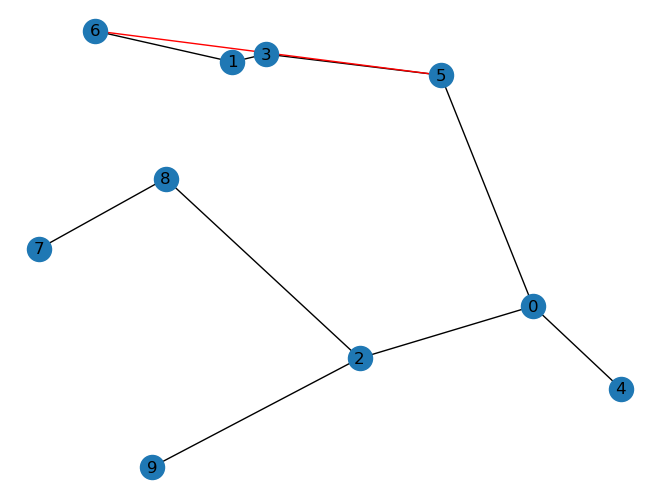

added edges [(5, 6)]
min cc 0.2727272727272727
budget -0.23779933164341127
-----------------------------------------------
(5, 6, 7)
edge (5, 6)
edge (6, 7)
done False


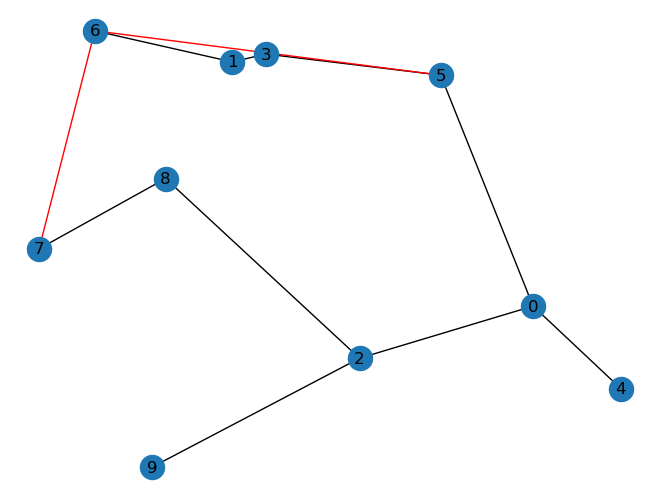

added edges [(5, 6), (6, 7)]
min cc 0.3333333333333333
budget 0.43445116375896925
-----------------------------------------------
(5, 6, 8)
edge (5, 6)
edge (6, 8)
done False


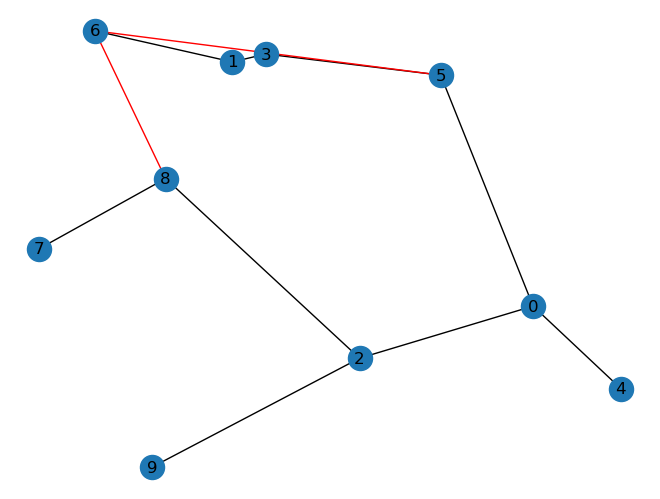

added edges [(5, 6), (6, 8)]
min cc 0.36
budget 0.5813154771559619
-----------------------------------------------
(5, 6, 9)
edge (5, 6)
out of budget
edge (6, 9)
done False


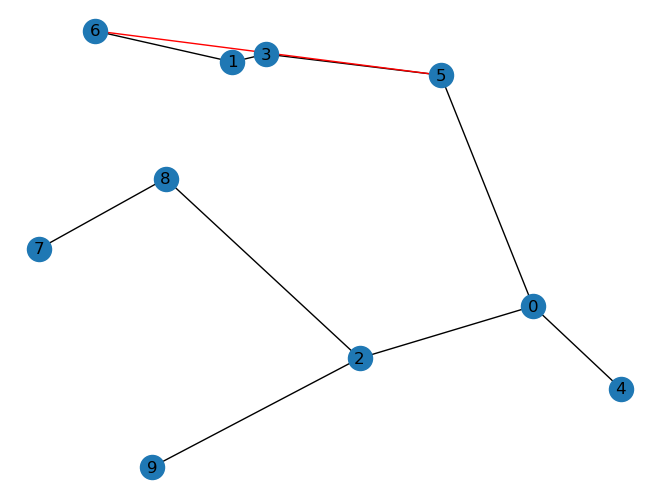

added edges [(5, 6)]
min cc 0.2727272727272727
budget -0.05237033123785406
-----------------------------------------------
(5, 7, 0)
edge (5, 7)
out of budget
edge (7, 0)
done False


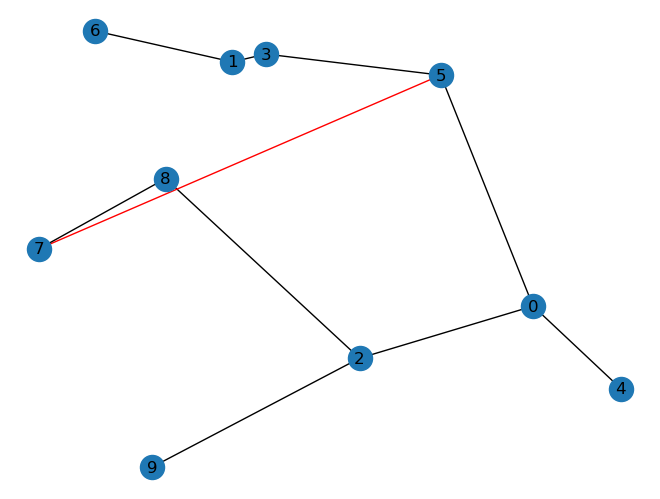

added edges [(5, 7)]
min cc 0.2571428571428571
budget -0.0657123007516831
-----------------------------------------------
(5, 7, 1)
edge (5, 7)
edge (7, 1)
done False


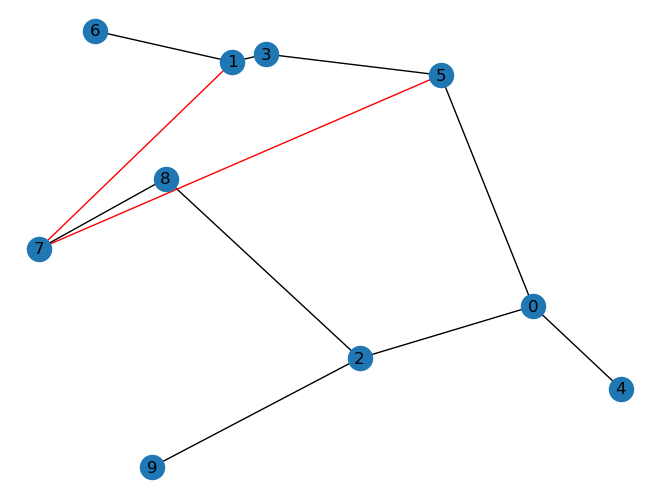

added edges [(5, 7), (7, 1)]
min cc 0.3103448275862069
budget 0.21968073612248584
-----------------------------------------------
(5, 7, 2)
edge (5, 7)
edge (7, 2)
done False


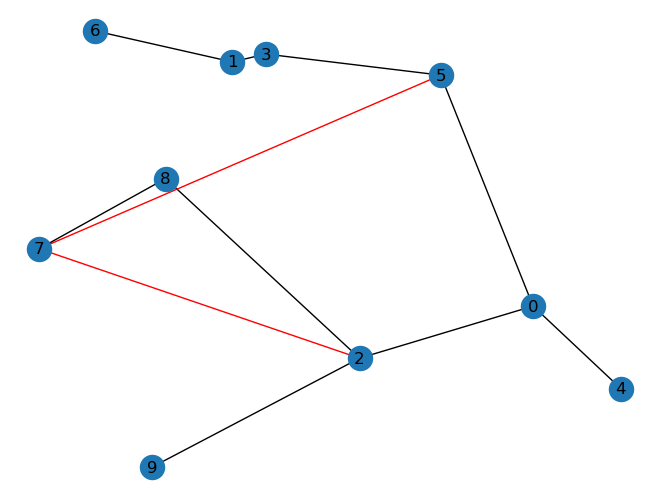

added edges [(5, 7), (7, 2)]
min cc 0.2571428571428571
budget 0.16961714805659178
-----------------------------------------------
(5, 7, 3)
edge (5, 7)
edge (7, 3)
done False


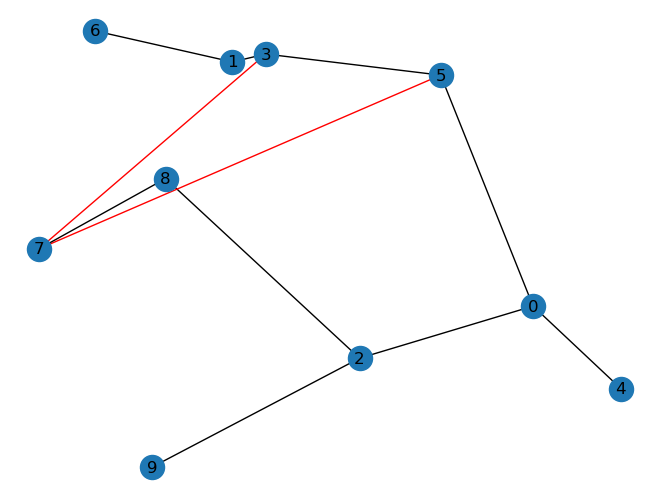

added edges [(5, 7), (7, 3)]
min cc 0.2727272727272727
budget 0.1722558966805725
-----------------------------------------------
(5, 7, 4)
edge (5, 7)
out of budget
edge (7, 4)
done False


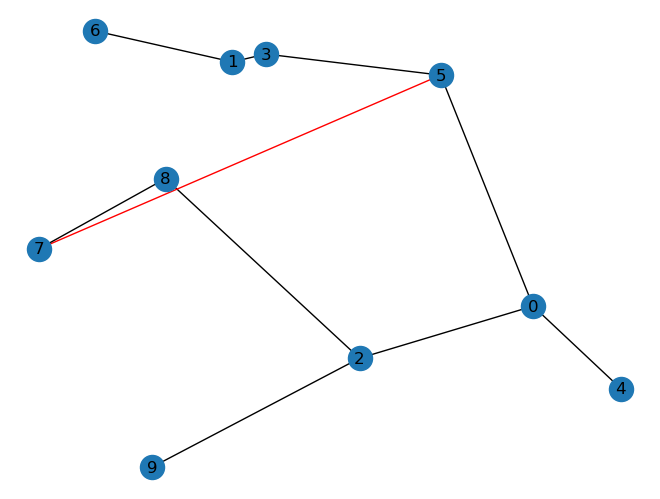

added edges [(5, 7)]
min cc 0.2571428571428571
budget -0.24849824069220072
-----------------------------------------------
(5, 7, 6)
edge (5, 7)
edge (7, 6)
done False


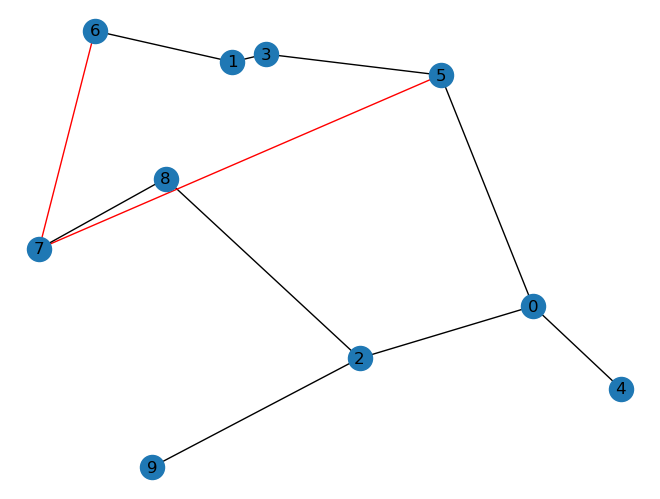

added edges [(5, 7), (7, 6)]
min cc 0.3333333333333333
budget 0.2449937589348778
-----------------------------------------------
(5, 7, 8)
edge (5, 7)
done True
-----------------------------------------------
(5, 7, 9)
edge (5, 7)
edge (7, 9)
done False


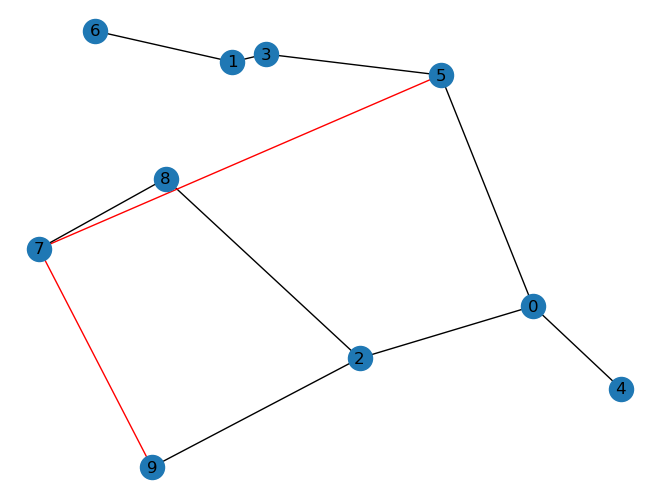

added edges [(5, 7), (7, 9)]
min cc 0.2647058823529412
budget 0.21937123037171824
-----------------------------------------------
(5, 8, 0)
edge (5, 8)
edge (8, 0)
done False


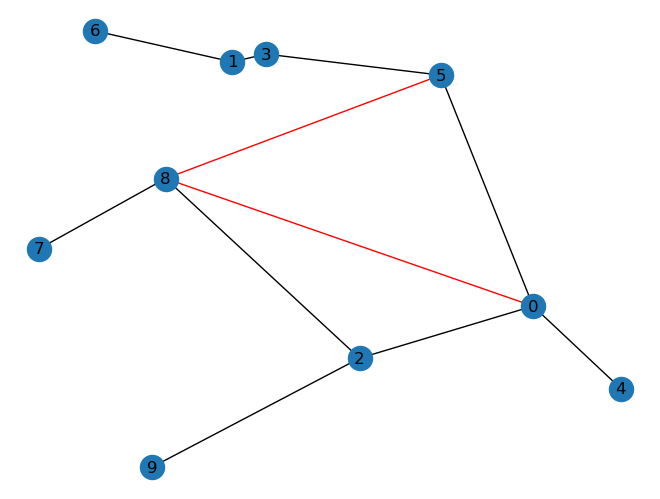

added edges [(5, 8), (8, 0)]
min cc 0.2571428571428571
budget 0.33904289246121166
-----------------------------------------------
(5, 8, 1)
edge (5, 8)
edge (8, 1)
done False


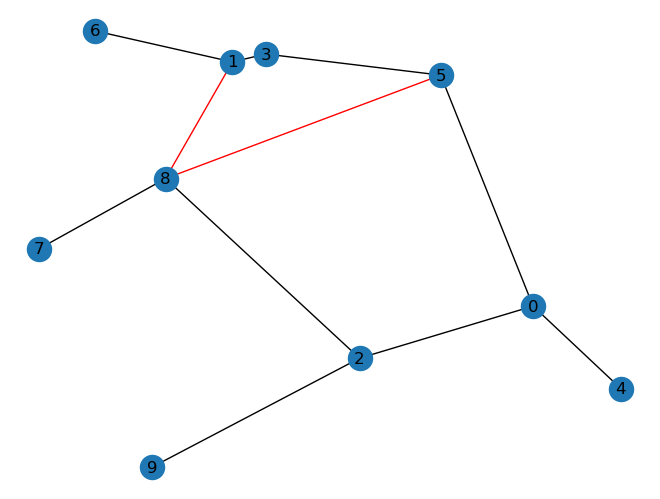

added edges [(5, 8), (8, 1)]
min cc 0.3333333333333333
budget 0.7151526835490154
-----------------------------------------------
(5, 8, 2)
edge (5, 8)
done True
-----------------------------------------------
(5, 8, 3)
edge (5, 8)
edge (8, 3)
done False


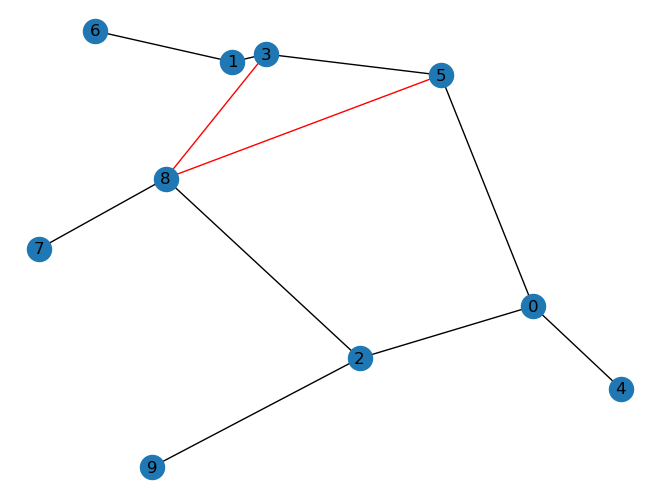

added edges [(5, 8), (8, 3)]
min cc 0.2903225806451613
budget 0.6752405223313689
-----------------------------------------------
(5, 8, 4)
edge (5, 8)
edge (8, 4)
done False


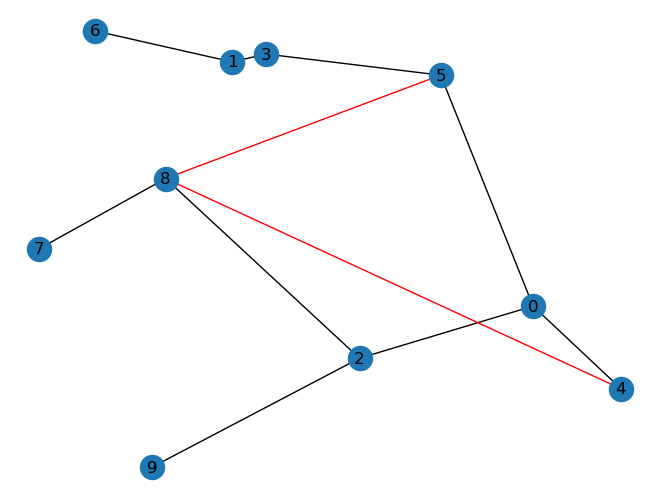

added edges [(5, 8), (8, 4)]
min cc 0.2571428571428571
budget 0.12417008480592628
-----------------------------------------------
(5, 8, 6)
edge (5, 8)
edge (8, 6)
done False


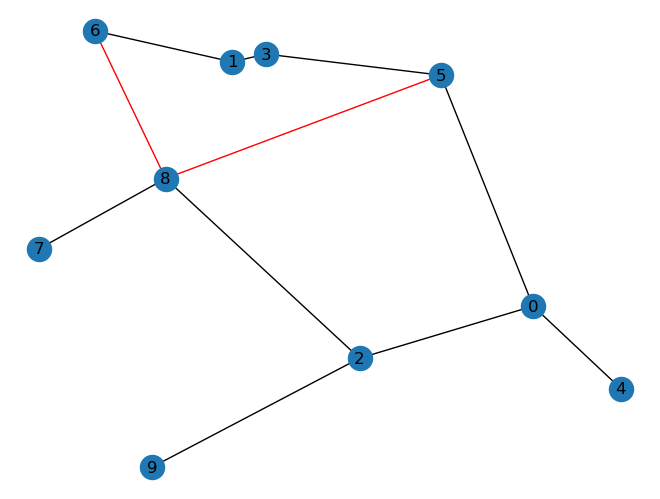

added edges [(5, 8), (8, 6)]
min cc 0.34615384615384615
budget 0.6474358589089313
-----------------------------------------------
(5, 8, 7)
edge (5, 8)
done True
-----------------------------------------------
(5, 8, 9)
edge (5, 8)
edge (8, 9)
done False


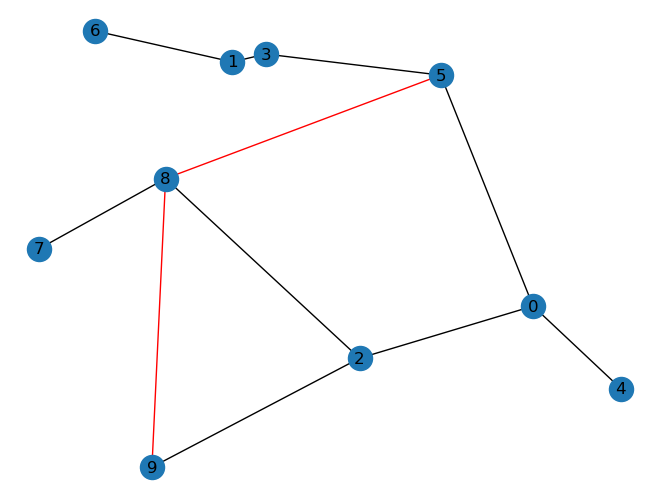

added edges [(5, 8), (8, 9)]
min cc 0.2647058823529412
budget 0.34955843682133025
-----------------------------------------------
(5, 9, 0)
edge (5, 9)
out of budget
edge (9, 0)
done False


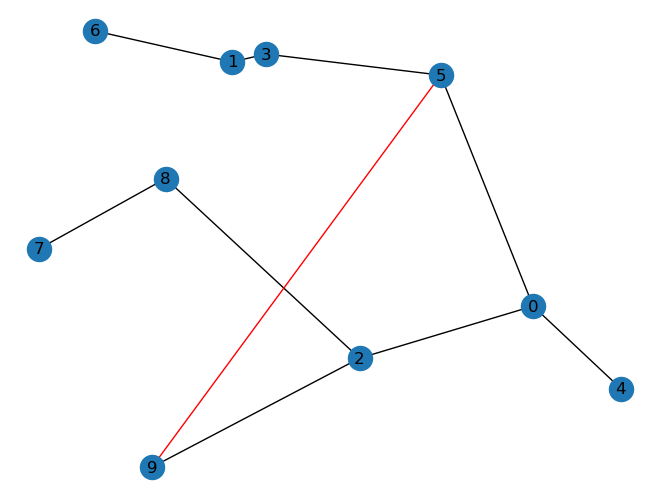

added edges [(5, 9)]
min cc 0.24324324324324326
budget -0.21109302058636115
-----------------------------------------------
(5, 9, 1)
edge (5, 9)
out of budget
edge (9, 1)
done False


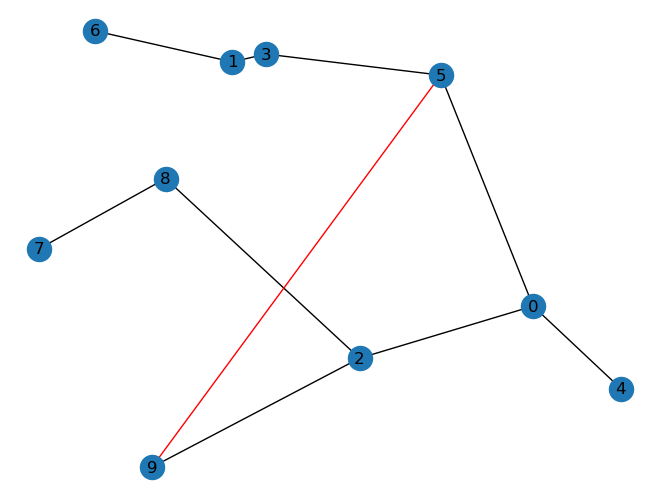

added edges [(5, 9)]
min cc 0.24324324324324326
budget -0.41635650076805986
-----------------------------------------------
(5, 9, 2)
edge (5, 9)
done True
-----------------------------------------------
(5, 9, 3)
edge (5, 9)
out of budget
edge (9, 3)
done False


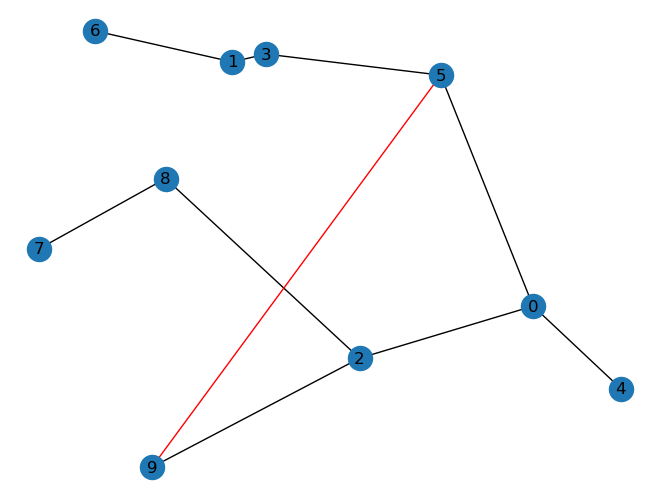

added edges [(5, 9)]
min cc 0.24324324324324326
budget -0.44299620352880376
-----------------------------------------------
(5, 9, 4)
edge (5, 9)
out of budget
edge (9, 4)
done False


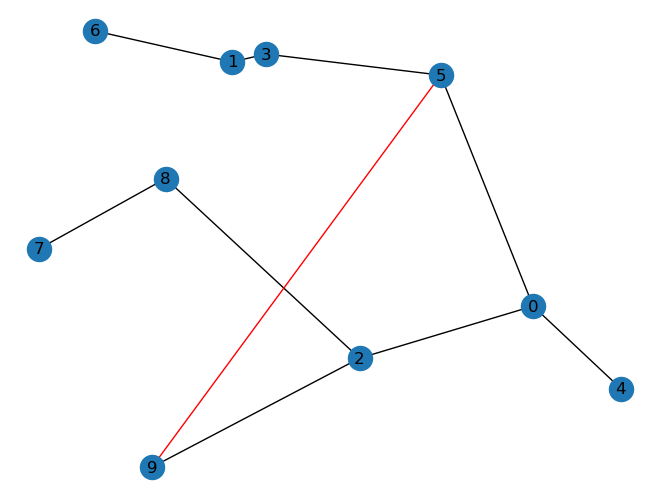

added edges [(5, 9)]
min cc 0.24324324324324326
budget -0.2748244543162287
-----------------------------------------------
(5, 9, 6)
edge (5, 9)
out of budget
edge (9, 6)
done False


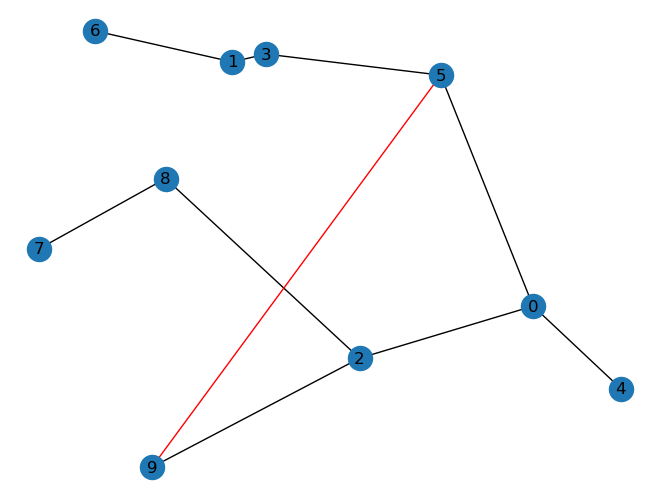

added edges [(5, 9)]
min cc 0.24324324324324326
budget -0.48140606349323445
-----------------------------------------------
(5, 9, 7)
edge (5, 9)
out of budget
edge (9, 7)
done False


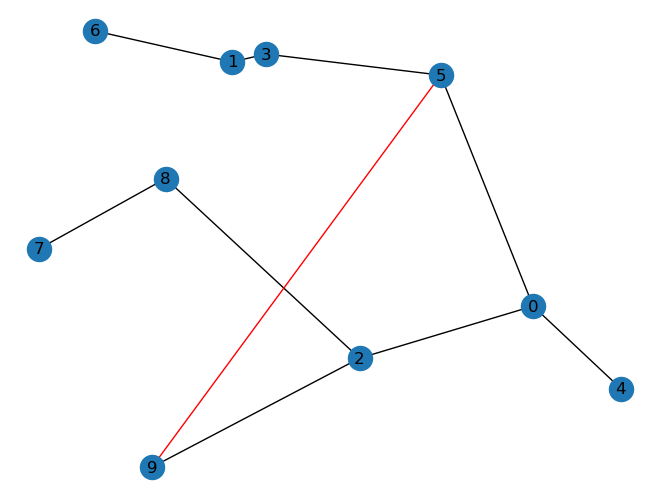

added edges [(5, 9)]
min cc 0.24324324324324326
budget -0.02020709705957069
-----------------------------------------------
(5, 9, 8)
edge (5, 9)
out of budget
edge (9, 8)
done False


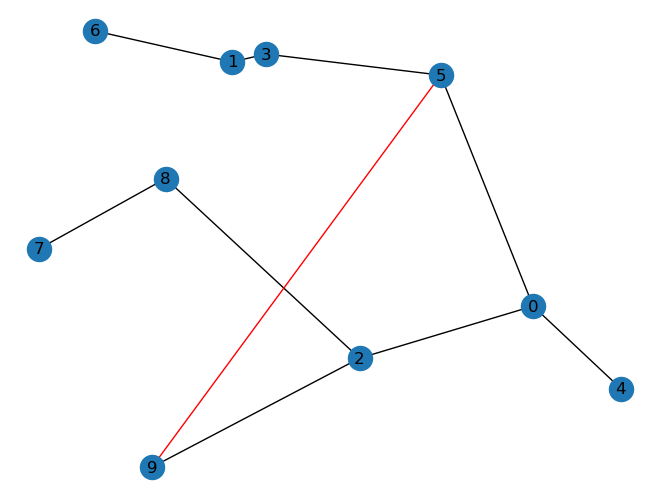

added edges [(5, 9)]
min cc 0.24324324324324326
budget -0.14559767718701966
-----------------------------------------------
(6, 0, 1)
edge (6, 0)
out of budget
edge (0, 1)
done False


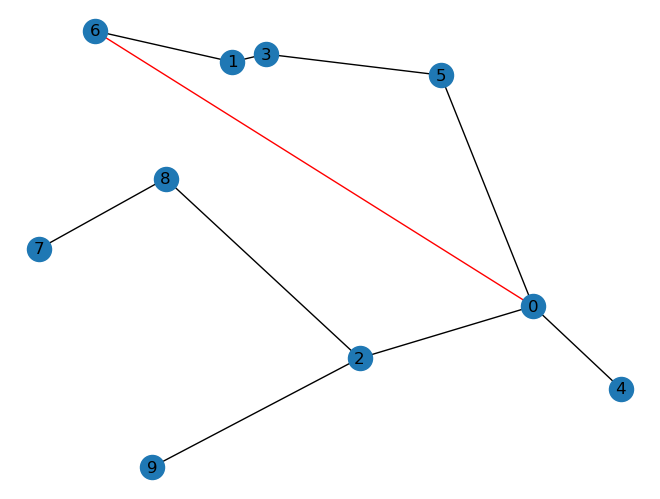

added edges [(6, 0)]
min cc 0.2903225806451613
budget -0.17295609728381756
-----------------------------------------------
(6, 0, 2)
edge (6, 0)
done True
-----------------------------------------------
(6, 0, 3)
edge (6, 0)
out of budget
edge (0, 3)
done False


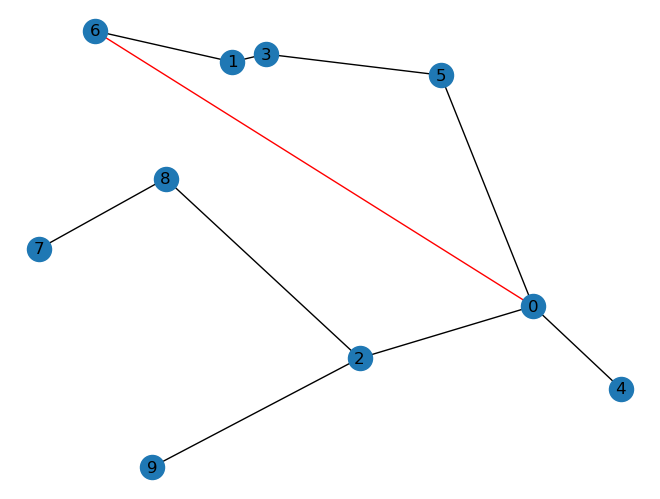

added edges [(6, 0)]
min cc 0.2903225806451613
budget -0.15246332541260377
-----------------------------------------------
(6, 0, 4)
edge (6, 0)
done True
-----------------------------------------------
(6, 0, 5)
edge (6, 0)
done True
-----------------------------------------------
(6, 0, 7)
edge (6, 0)
out of budget
edge (0, 7)
done False


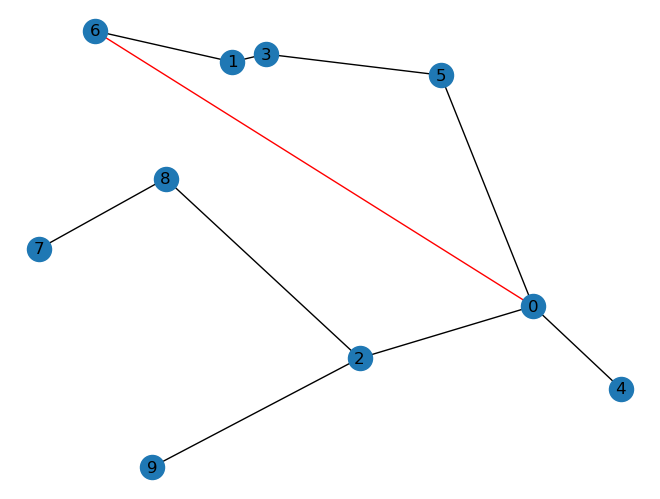

added edges [(6, 0)]
min cc 0.2903225806451613
budget -0.24877439275376834
-----------------------------------------------
(6, 0, 8)
edge (6, 0)
out of budget
edge (0, 8)
done False


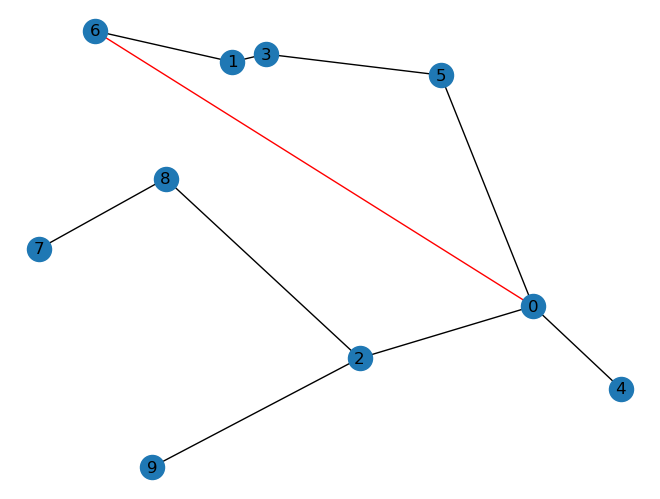

added edges [(6, 0)]
min cc 0.2903225806451613
budget -0.09959698611793455
-----------------------------------------------
(6, 0, 9)
edge (6, 0)
out of budget
edge (0, 9)
done False


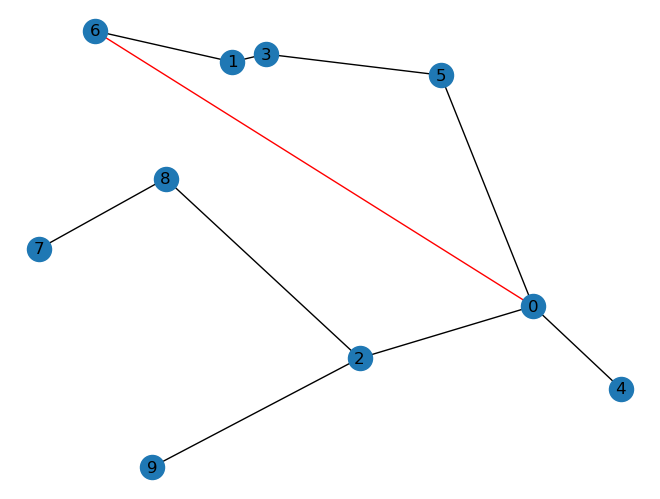

added edges [(6, 0)]
min cc 0.2903225806451613
budget -0.15457678515715745
-----------------------------------------------
(6, 1, 0)
done True
-----------------------------------------------
(6, 1, 2)
done True
-----------------------------------------------
(6, 1, 3)
done True
-----------------------------------------------
(6, 1, 4)
done True
-----------------------------------------------
(6, 1, 5)
done True
-----------------------------------------------
(6, 1, 7)
done True
-----------------------------------------------
(6, 1, 8)
done True
-----------------------------------------------
(6, 1, 9)
done True
-----------------------------------------------
(6, 2, 0)
edge (6, 2)
done True
-----------------------------------------------
(6, 2, 1)
edge (6, 2)
out of budget
edge (2, 1)
done False


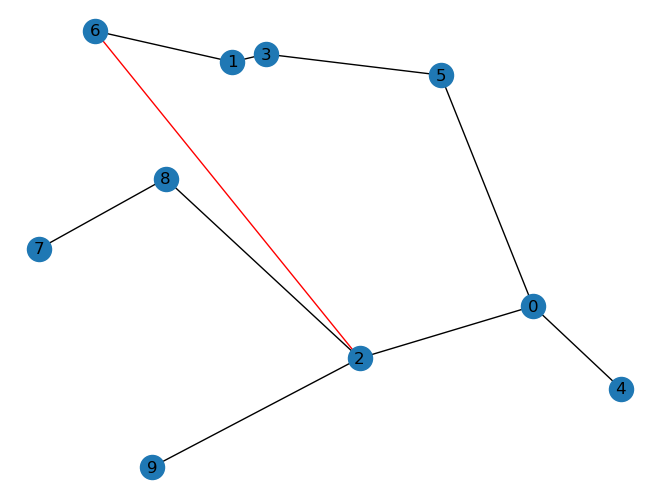

added edges [(6, 2)]
min cc 0.3103448275862069
budget -0.04751135324360045
-----------------------------------------------
(6, 2, 3)
edge (6, 2)
out of budget
edge (2, 3)
done False


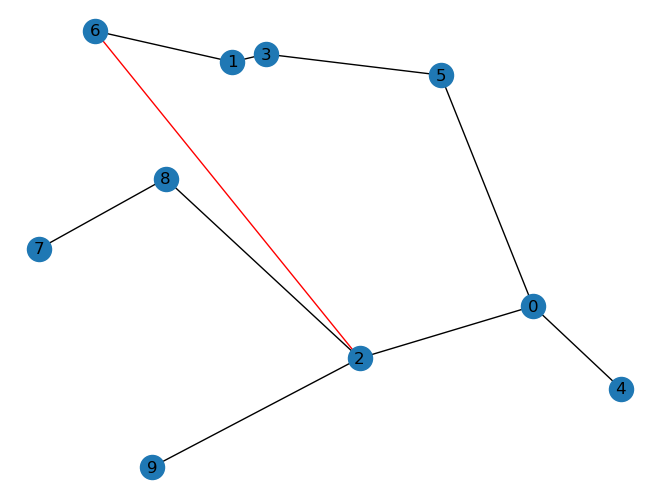

added edges [(6, 2)]
min cc 0.3103448275862069
budget -0.05095198094291398
-----------------------------------------------
(6, 2, 4)
edge (6, 2)
edge (2, 4)
done False


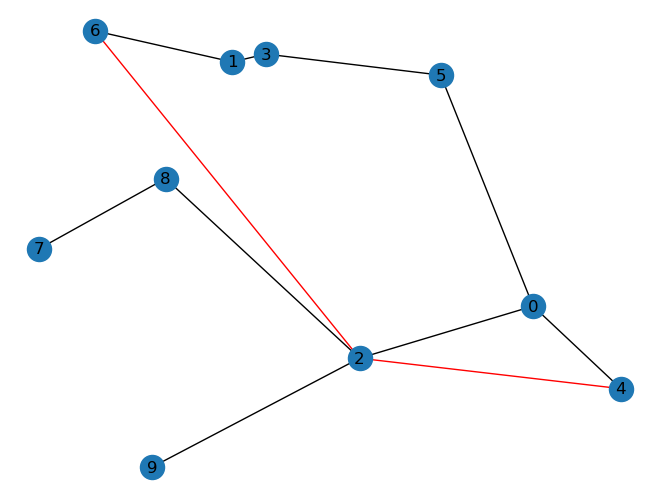

added edges [(6, 2), (2, 4)]
min cc 0.32142857142857145
budget 0.22119978426711318
-----------------------------------------------
(6, 2, 5)
edge (6, 2)
out of budget
edge (2, 5)
done False


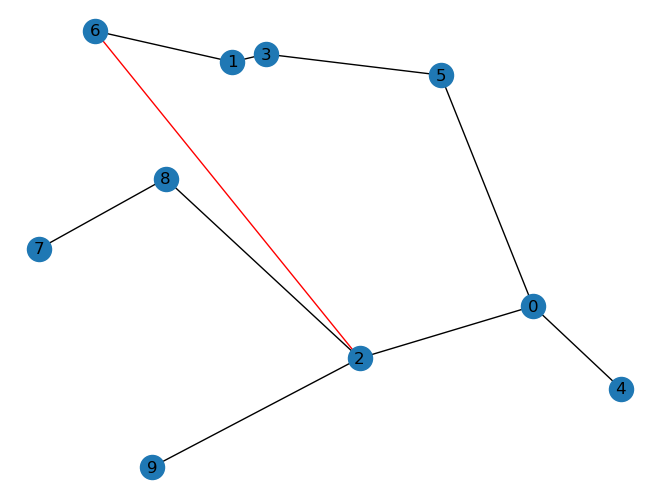

added edges [(6, 2)]
min cc 0.3103448275862069
budget -0.00027636636674122084
-----------------------------------------------
(6, 2, 7)
edge (6, 2)
edge (2, 7)
done False


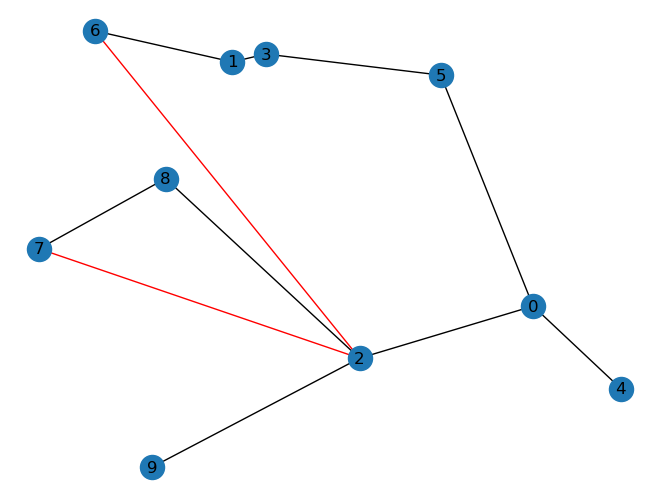

added edges [(6, 2), (2, 7)]
min cc 0.375
budget 0.07585950953006626
-----------------------------------------------
(6, 2, 8)
edge (6, 2)
done True
-----------------------------------------------
(6, 2, 9)
edge (6, 2)
done True
-----------------------------------------------
(6, 3, 0)
edge (6, 3)
edge (3, 0)
done False


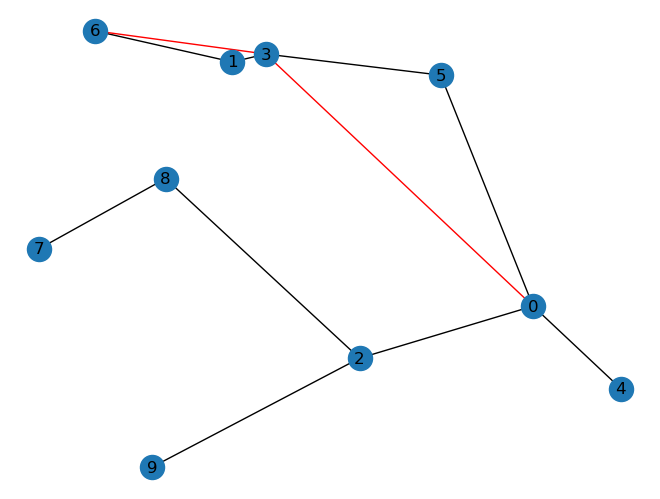

added edges [(6, 3), (3, 0)]
min cc 0.2903225806451613
budget 0.5066517926820895
-----------------------------------------------
(6, 3, 1)
edge (6, 3)
done True
-----------------------------------------------
(6, 3, 2)
edge (6, 3)
edge (3, 2)
done False


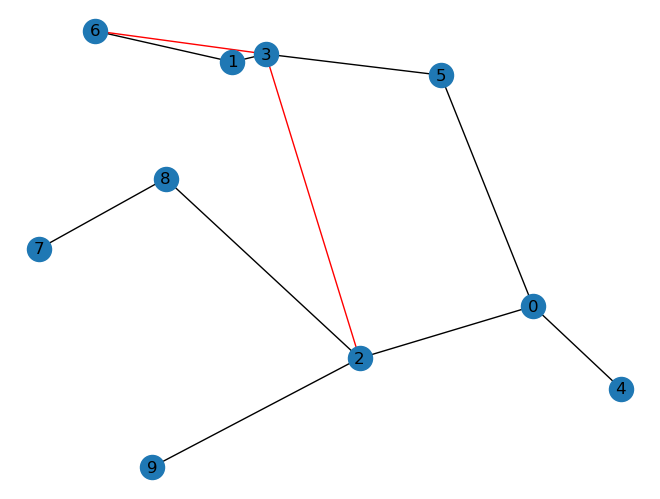

added edges [(6, 3), (3, 2)]
min cc 0.32142857142857145
budget 0.5188586836762196
-----------------------------------------------
(6, 3, 4)
edge (6, 3)
edge (3, 4)
done False


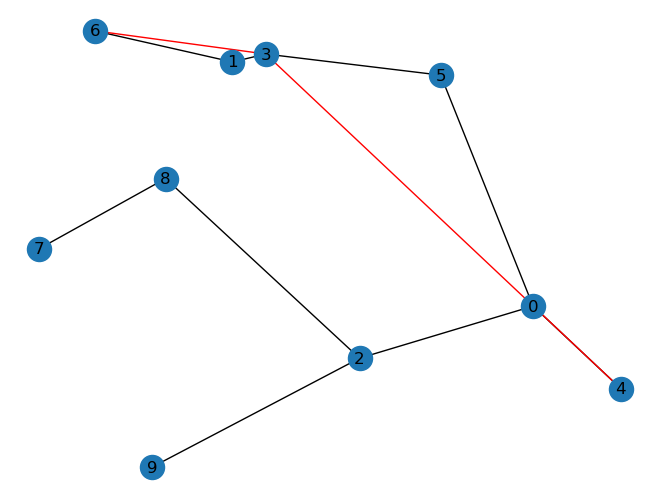

added edges [(6, 3), (3, 4)]
min cc 0.2647058823529412
budget 0.2730174249413685
-----------------------------------------------
(6, 3, 5)
edge (6, 3)
done True
-----------------------------------------------
(6, 3, 7)
edge (6, 3)
edge (3, 7)
done False


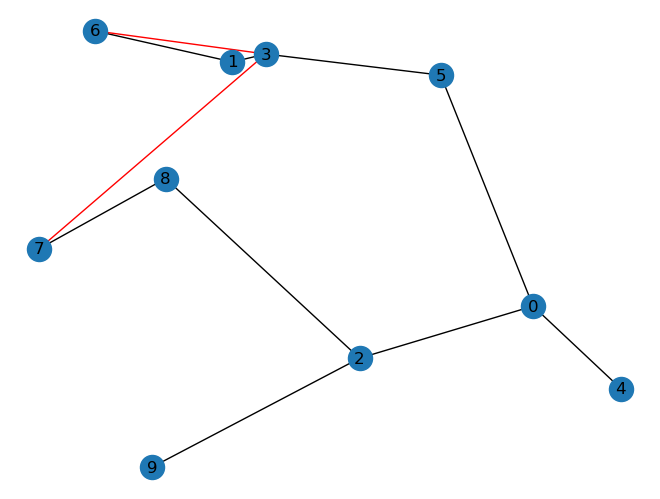

added edges [(6, 3), (3, 7)]
min cc 0.32142857142857145
budget 0.6483089227731805
-----------------------------------------------
(6, 3, 8)
edge (6, 3)
edge (3, 8)
done False


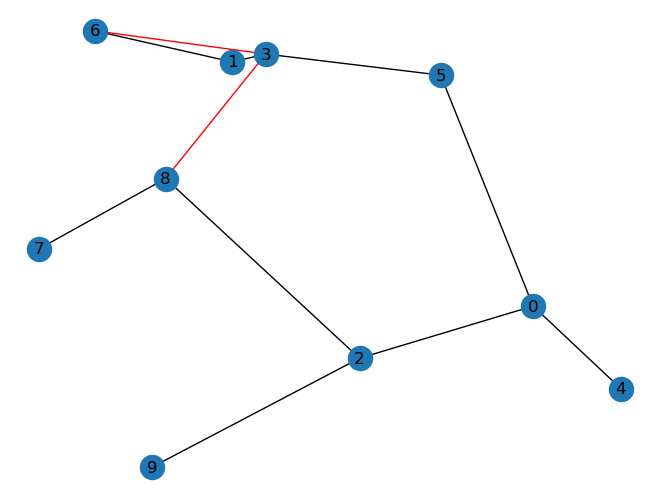

added edges [(6, 3), (3, 8)]
min cc 0.34615384615384615
budget 0.8957157618469158
-----------------------------------------------
(6, 3, 9)
edge (6, 3)
edge (3, 9)
done False


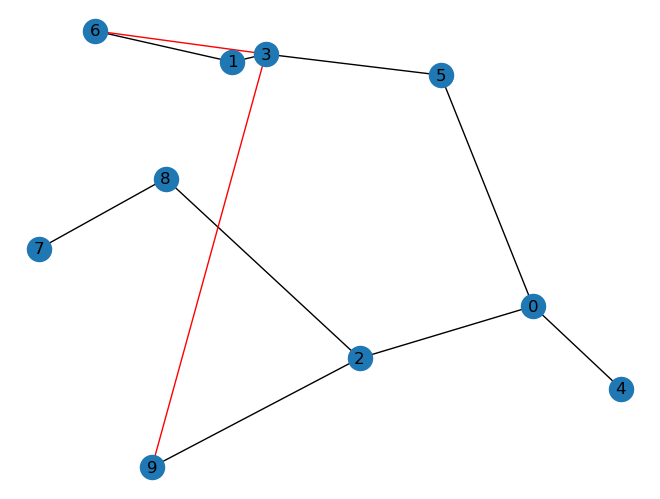

added edges [(6, 3), (3, 9)]
min cc 0.2903225806451613
budget 0.2726351499950932
-----------------------------------------------
(6, 4, 0)
edge (6, 4)
done True
-----------------------------------------------
(6, 4, 1)
edge (6, 4)
out of budget
edge (4, 1)
done False


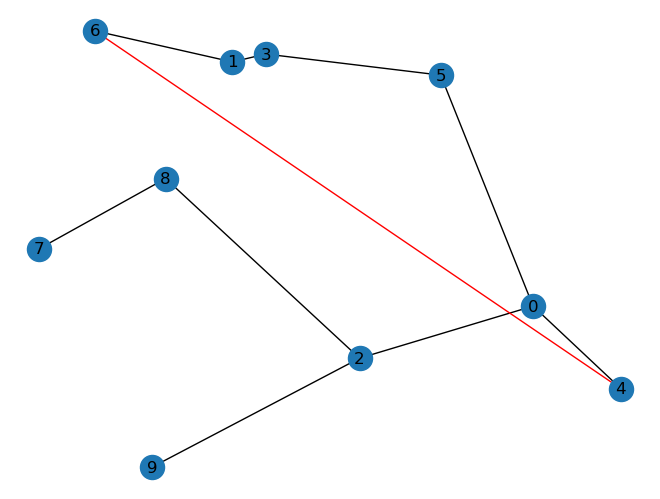

added edges [(6, 4)]
min cc 0.2727272727272727
budget -0.6360314213373278
-----------------------------------------------
(6, 4, 2)
edge (6, 4)
out of budget
edge (4, 2)
done False


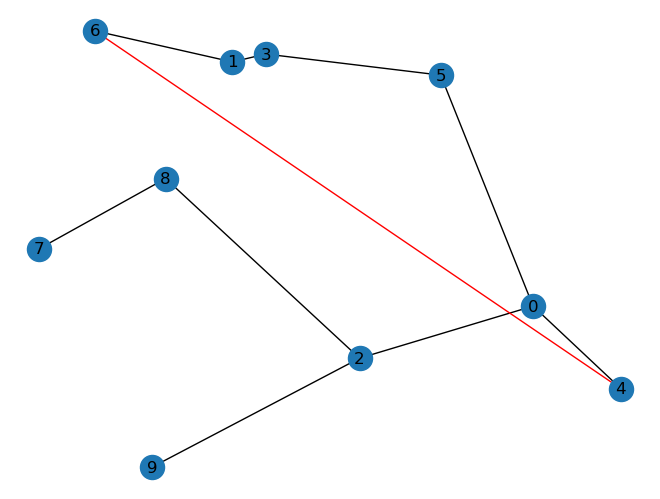

added edges [(6, 4)]
min cc 0.2727272727272727
budget -0.0980042249601375
-----------------------------------------------
(6, 4, 3)
edge (6, 4)
out of budget
edge (4, 3)
done False


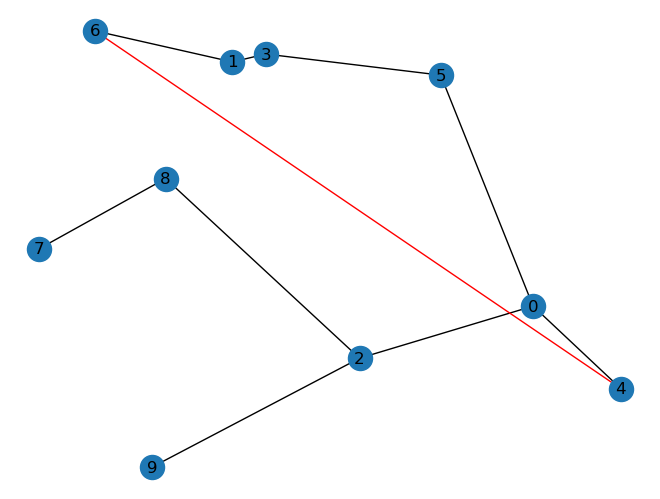

added edges [(6, 4)]
min cc 0.2727272727272727
budget -0.6159972489050157
-----------------------------------------------
(6, 4, 5)
edge (6, 4)
out of budget
edge (4, 5)
done False


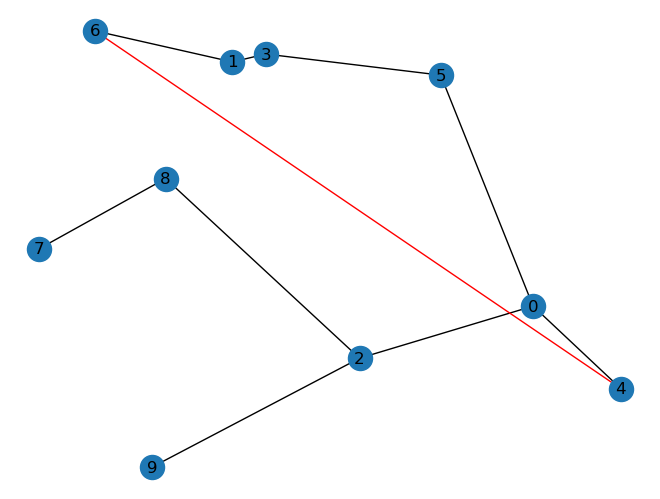

added edges [(6, 4)]
min cc 0.2727272727272727
budget -0.432365886386601
-----------------------------------------------
(6, 4, 7)
edge (6, 4)
out of budget
edge (4, 7)
done False


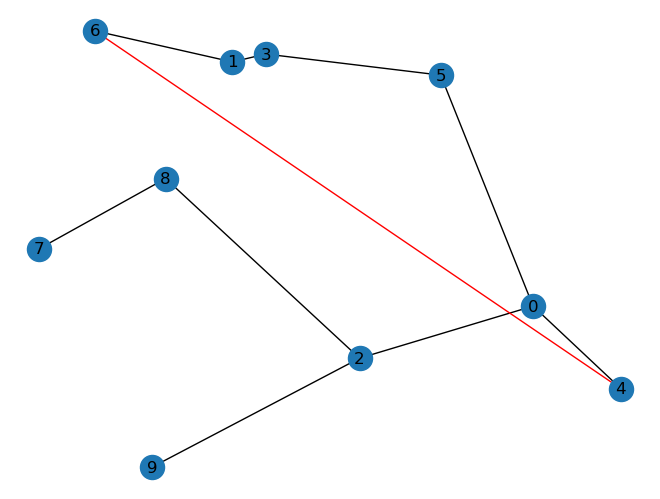

added edges [(6, 4)]
min cc 0.2727272727272727
budget -0.6614598884459769
-----------------------------------------------
(6, 4, 8)
edge (6, 4)
out of budget
edge (4, 8)
done False


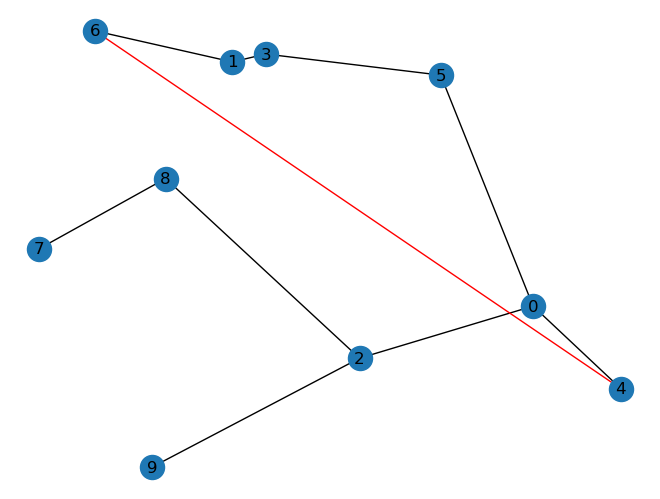

added edges [(6, 4)]
min cc 0.2727272727272727
budget -0.5443693495249109
-----------------------------------------------
(6, 4, 9)
edge (6, 4)
out of budget
edge (4, 9)
done False


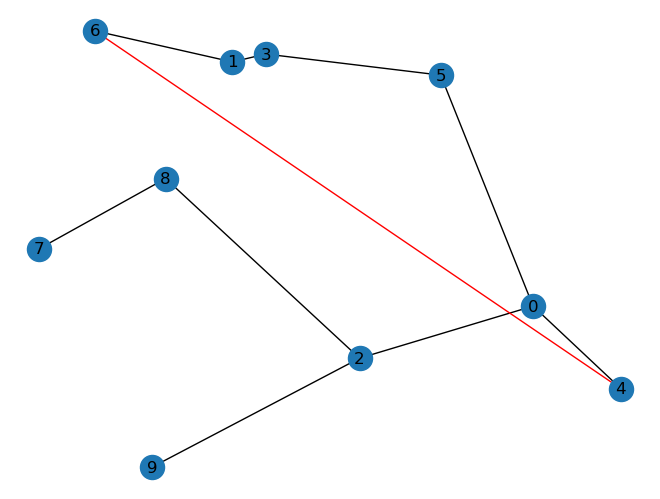

added edges [(6, 4)]
min cc 0.2727272727272727
budget -0.44820777463871597
-----------------------------------------------
(6, 5, 0)
edge (6, 5)
done True
-----------------------------------------------
(6, 5, 1)
edge (6, 5)
edge (5, 1)
done False


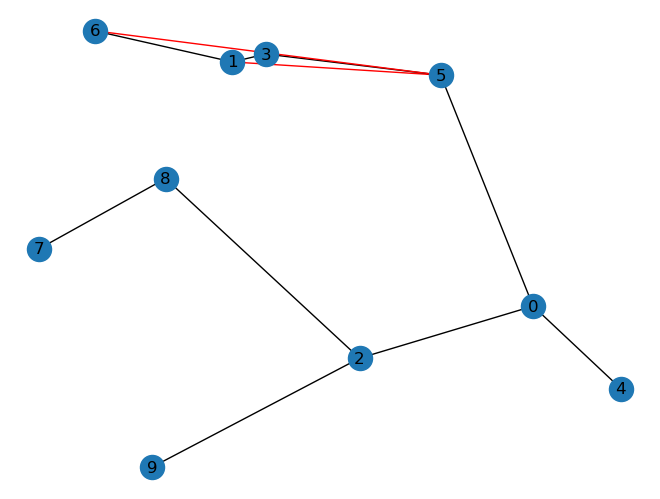

added edges [(6, 5), (5, 1)]
min cc 0.28125
budget 0.5944240454426618
-----------------------------------------------
(6, 5, 2)
edge (6, 5)
edge (5, 2)
done False


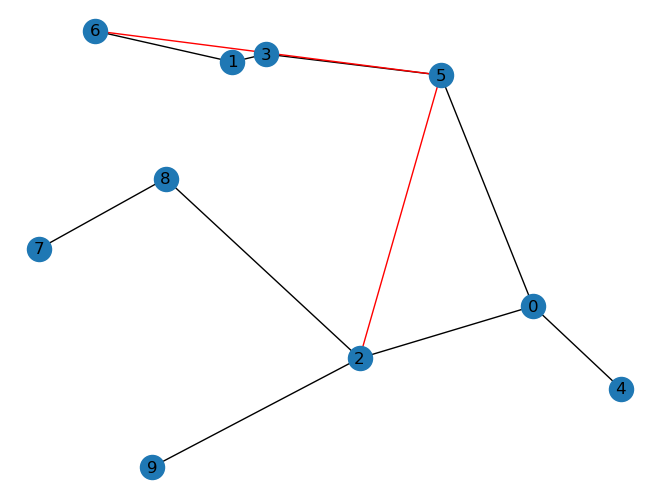

added edges [(6, 5), (5, 2)]
min cc 0.3103448275862069
budget 0.28293867698387576
-----------------------------------------------
(6, 5, 3)
edge (6, 5)
done True
-----------------------------------------------
(6, 5, 4)
edge (6, 5)
edge (5, 4)
done False


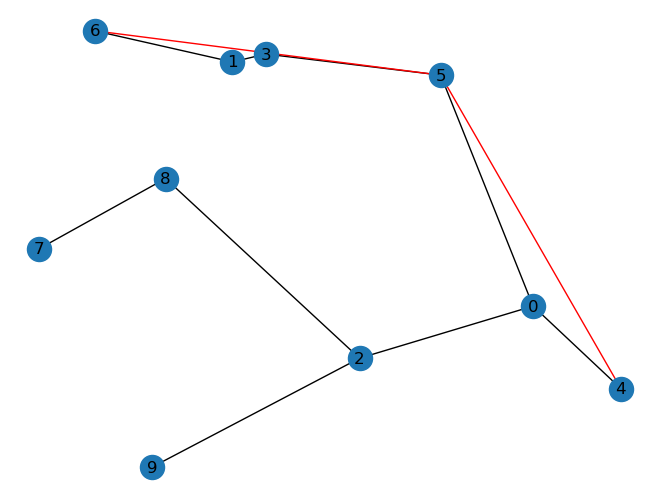

added edges [(6, 5), (5, 4)]
min cc 0.2727272727272727
budget 0.17005316619126665
-----------------------------------------------
(6, 5, 7)
edge (6, 5)
edge (5, 7)
done False


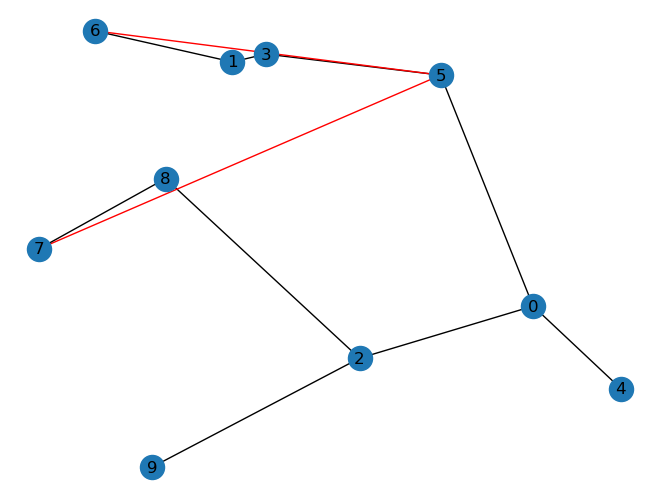

added edges [(6, 5), (5, 7)]
min cc 0.3333333333333333
budget 0.17516231611036492
-----------------------------------------------
(6, 5, 8)
edge (6, 5)
edge (5, 8)
done False


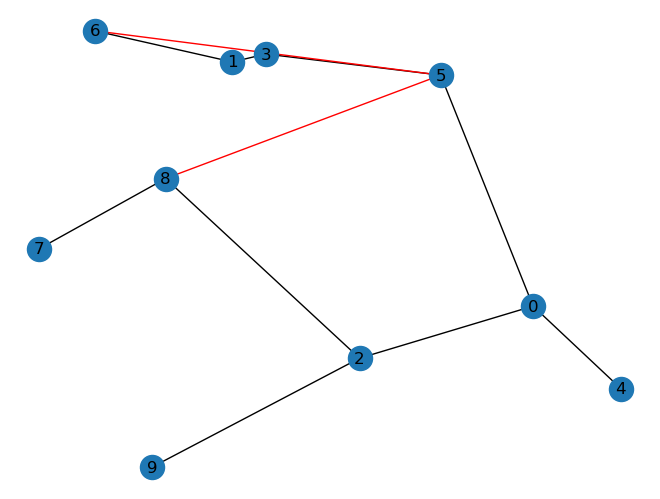

added edges [(6, 5), (5, 8)]
min cc 0.3333333333333333
budget 0.4307401026874259
-----------------------------------------------
(6, 5, 9)
edge (6, 5)
out of budget
edge (5, 9)
done False


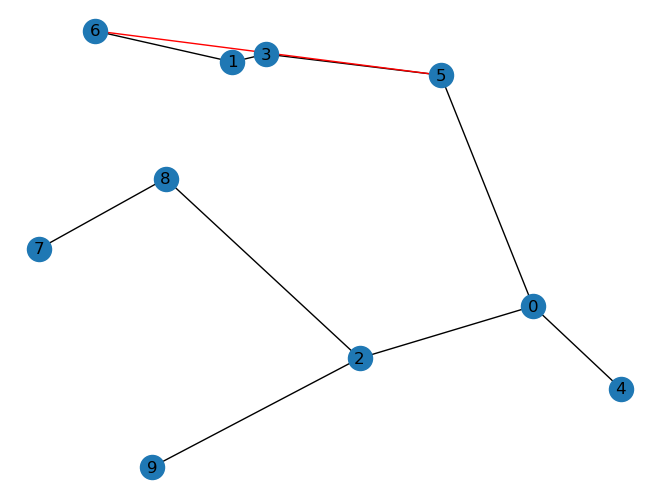

added edges [(6, 5)]
min cc 0.2727272727272727
budget -0.064416011320924
-----------------------------------------------
(6, 7, 0)
edge (6, 7)
edge (7, 0)
done False


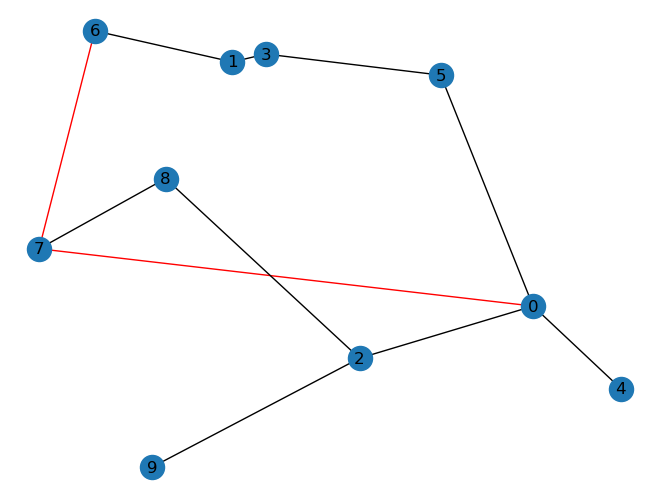

added edges [(6, 7), (7, 0)]
min cc 0.3333333333333333
budget 0.19357654689692116
-----------------------------------------------
(6, 7, 1)
edge (6, 7)
edge (7, 1)
done False


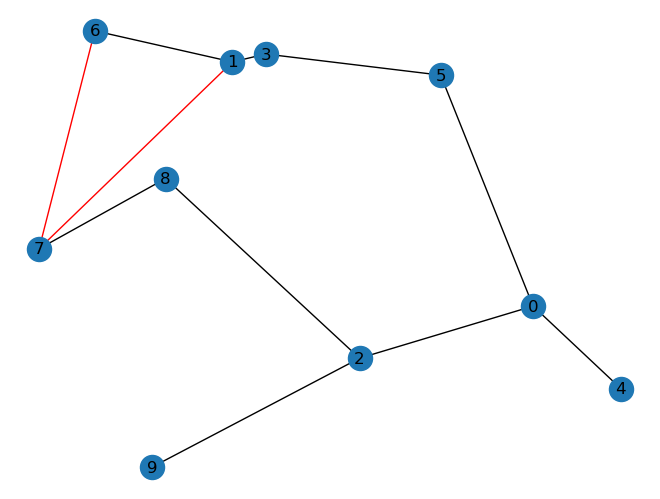

added edges [(6, 7), (7, 1)]
min cc 0.3333333333333333
budget 0.4789695837710901
-----------------------------------------------
(6, 7, 2)
edge (6, 7)
edge (7, 2)
done False


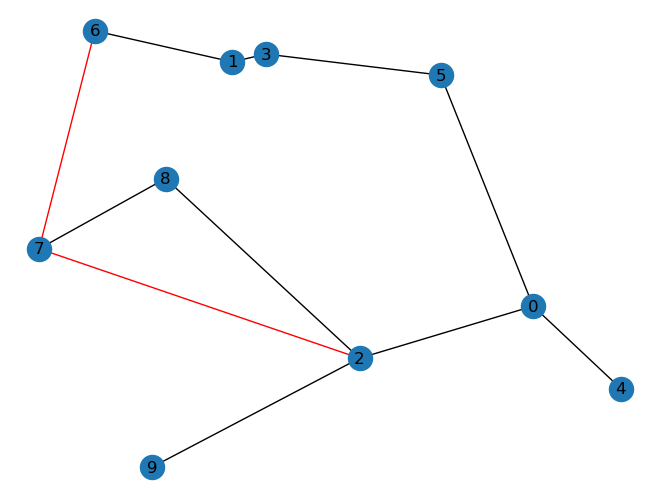

added edges [(6, 7), (7, 2)]
min cc 0.36
budget 0.42890599570519605
-----------------------------------------------
(6, 7, 3)
edge (6, 7)
edge (7, 3)
done False


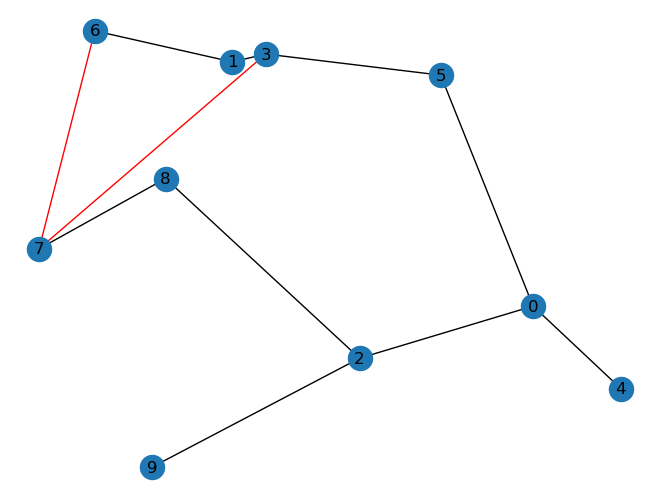

added edges [(6, 7), (7, 3)]
min cc 0.3333333333333333
budget 0.4315447443291768
-----------------------------------------------
(6, 7, 4)
edge (6, 7)
edge (7, 4)
done False


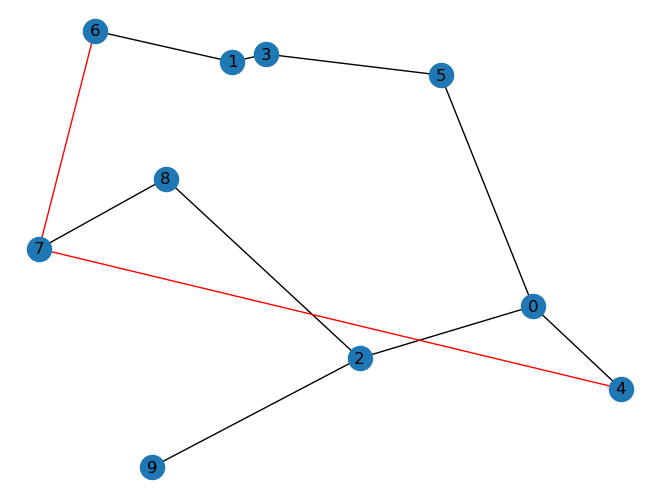

added edges [(6, 7), (7, 4)]
min cc 0.3333333333333333
budget 0.010790606956403548
-----------------------------------------------
(6, 7, 5)
edge (6, 7)
edge (7, 5)
done False


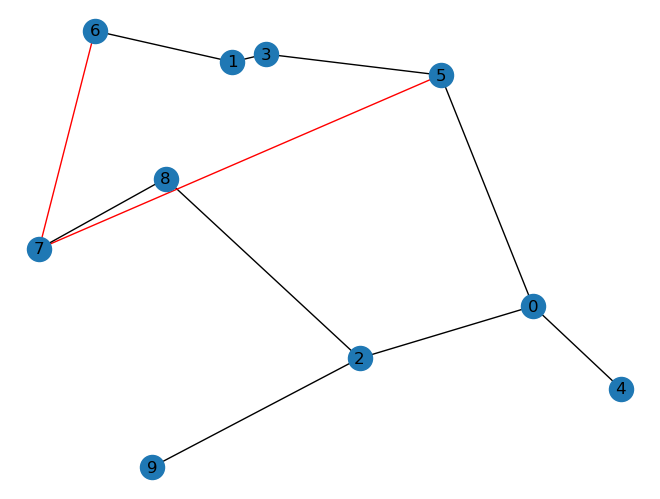

added edges [(6, 7), (7, 5)]
min cc 0.3333333333333333
budget 0.24499375893487774
-----------------------------------------------
(6, 7, 8)
edge (6, 7)
done True
-----------------------------------------------
(6, 7, 9)
edge (6, 7)
edge (7, 9)
done False


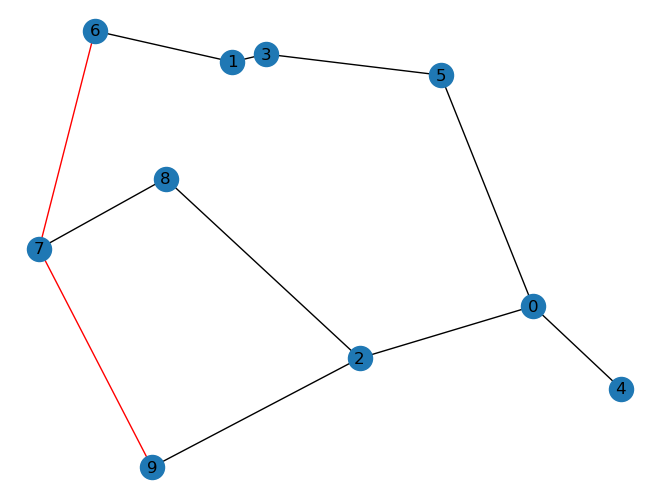

added edges [(6, 7), (7, 9)]
min cc 0.3333333333333333
budget 0.4786600780203225
-----------------------------------------------
(6, 8, 0)
edge (6, 8)
edge (8, 0)
done False


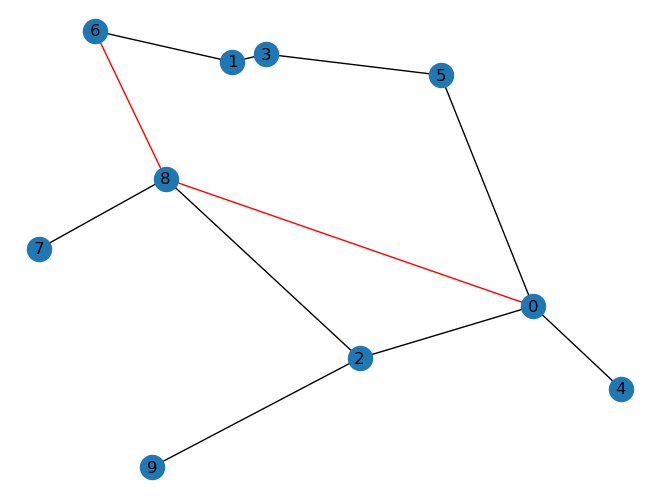

added edges [(6, 8), (8, 0)]
min cc 0.36
budget 0.48961826692974764
-----------------------------------------------
(6, 8, 1)
edge (6, 8)
edge (8, 1)
done False


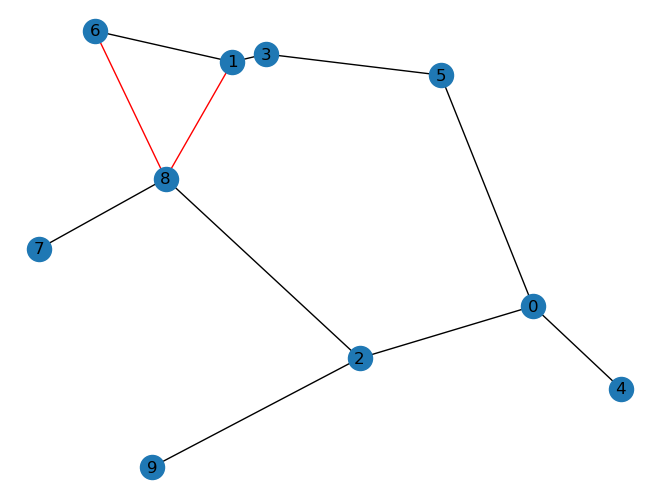

added edges [(6, 8), (8, 1)]
min cc 0.34615384615384615
budget 0.8657280580175513
-----------------------------------------------
(6, 8, 2)
edge (6, 8)
done True
-----------------------------------------------
(6, 8, 3)
edge (6, 8)
edge (8, 3)
done False


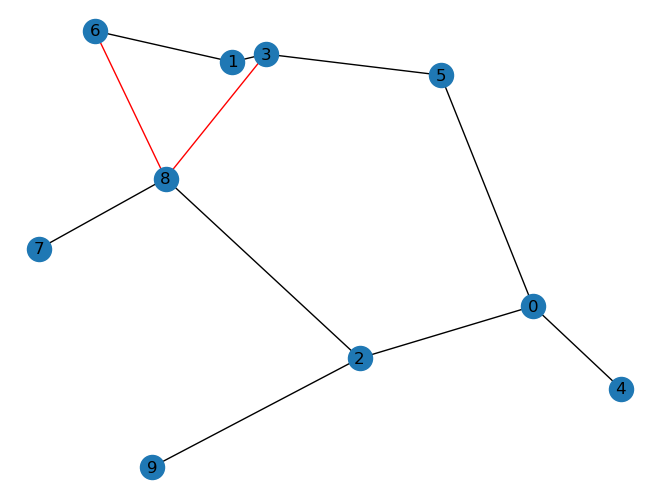

added edges [(6, 8), (8, 3)]
min cc 0.34615384615384615
budget 0.8258158967999047
-----------------------------------------------
(6, 8, 4)
edge (6, 8)
edge (8, 4)
done False


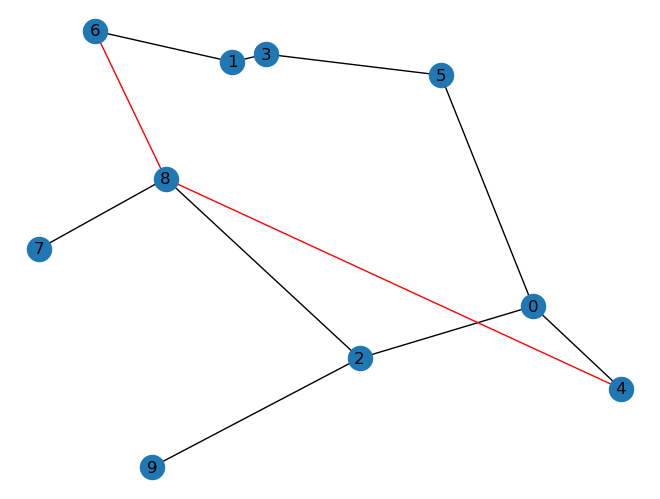

added edges [(6, 8), (8, 4)]
min cc 0.36
budget 0.27474545927446226
-----------------------------------------------
(6, 8, 5)
edge (6, 8)
edge (8, 5)
done False


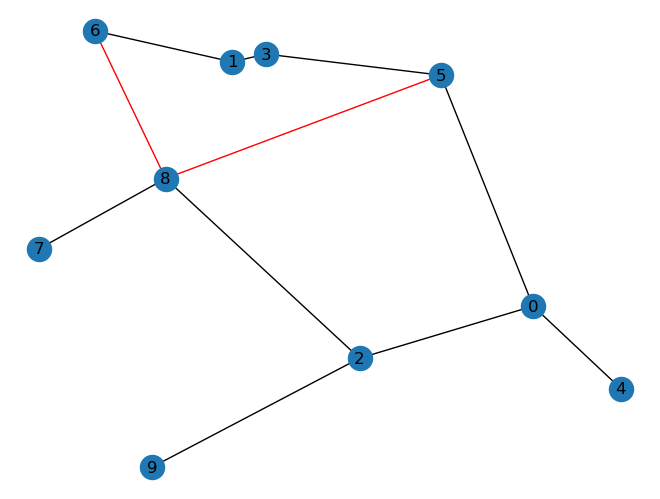

added edges [(6, 8), (8, 5)]
min cc 0.34615384615384615
budget 0.6474358589089314
-----------------------------------------------
(6, 8, 7)
edge (6, 8)
done True
-----------------------------------------------
(6, 8, 9)
edge (6, 8)
edge (8, 9)
done False


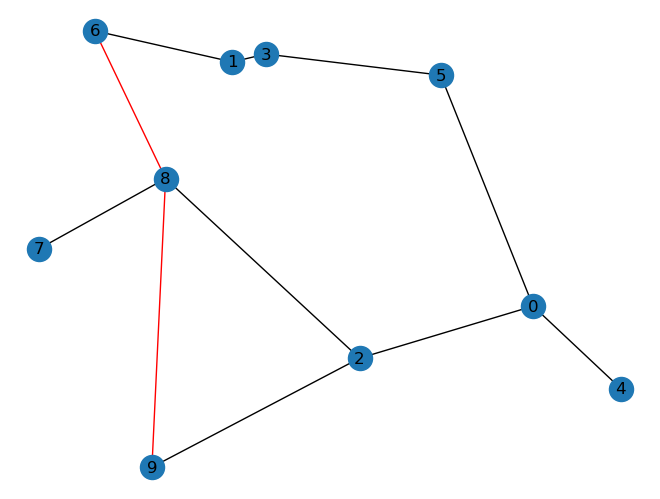

added edges [(6, 8), (8, 9)]
min cc 0.34615384615384615
budget 0.5001338112898662
-----------------------------------------------
(6, 9, 0)
edge (6, 9)
out of budget
edge (9, 0)
done False


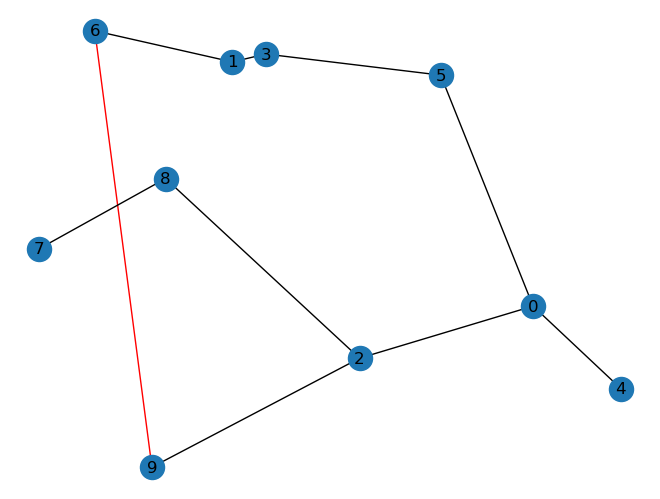

added edges [(6, 9)]
min cc 0.2903225806451613
budget -0.1990473405032912
-----------------------------------------------
(6, 9, 1)
edge (6, 9)
out of budget
edge (9, 1)
done False


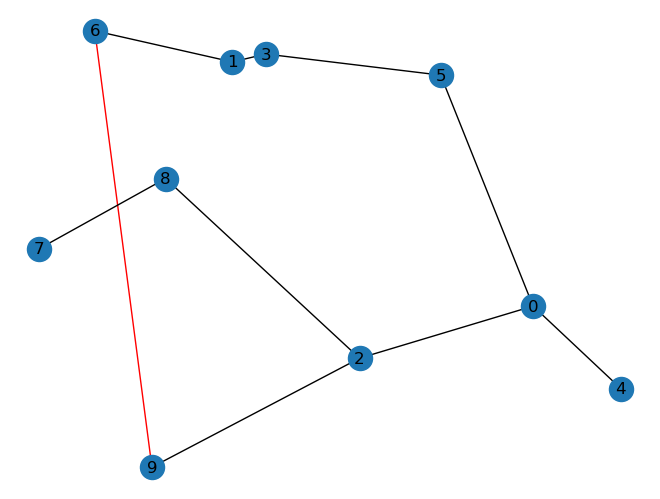

added edges [(6, 9)]
min cc 0.2903225806451613
budget -0.4043108206849899
-----------------------------------------------
(6, 9, 2)
edge (6, 9)
done True
-----------------------------------------------
(6, 9, 3)
edge (6, 9)
out of budget
edge (9, 3)
done False


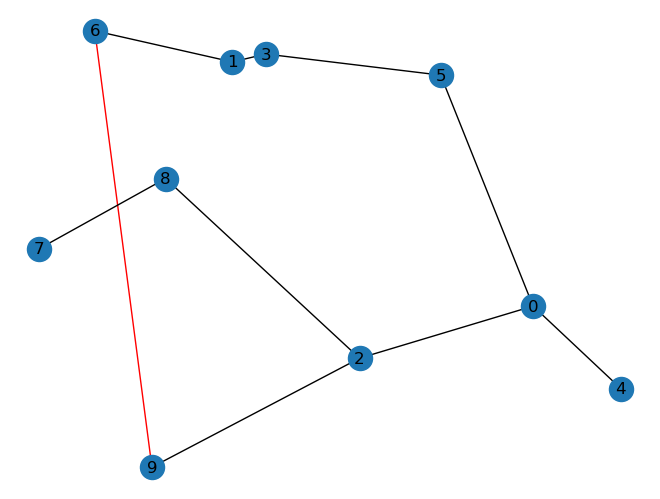

added edges [(6, 9)]
min cc 0.2903225806451613
budget -0.4309505234457338
-----------------------------------------------
(6, 9, 4)
edge (6, 9)
out of budget
edge (9, 4)
done False


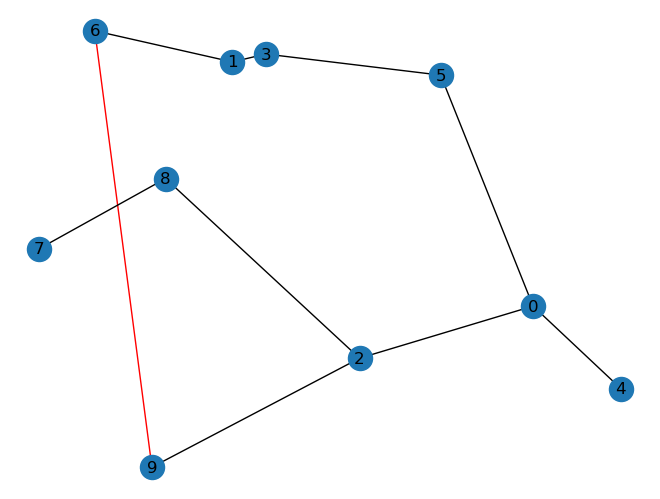

added edges [(6, 9)]
min cc 0.2903225806451613
budget -0.26277877423315876
-----------------------------------------------
(6, 9, 5)
edge (6, 9)
out of budget
edge (9, 5)
done False


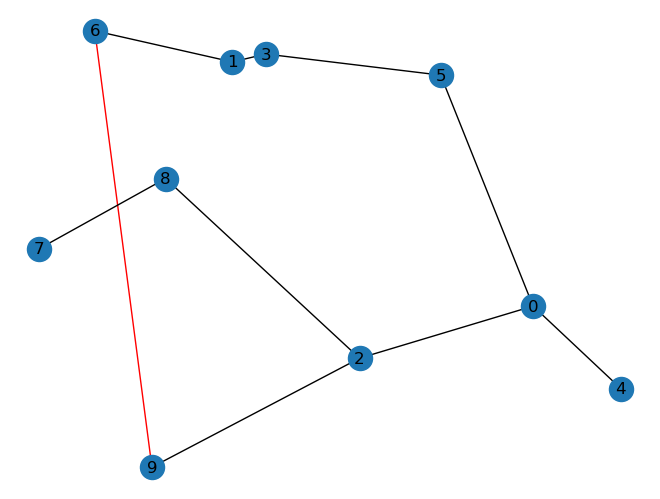

added edges [(6, 9)]
min cc 0.2903225806451613
budget -0.48140606349323445
-----------------------------------------------
(6, 9, 7)
edge (6, 9)
out of budget
edge (9, 7)
done False


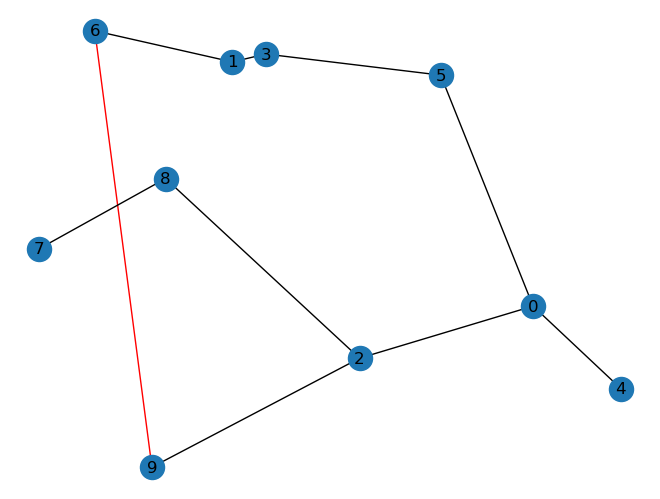

added edges [(6, 9)]
min cc 0.2903225806451613
budget -0.008161416976500746
-----------------------------------------------
(6, 9, 8)
edge (6, 9)
out of budget
edge (9, 8)
done False


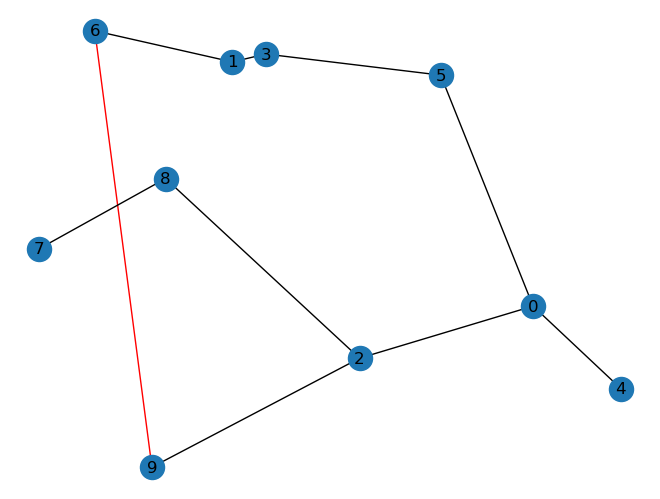

added edges [(6, 9)]
min cc 0.2903225806451613
budget -0.13355199710394972
-----------------------------------------------
(7, 0, 1)
edge (7, 0)
out of budget
edge (0, 1)
done False


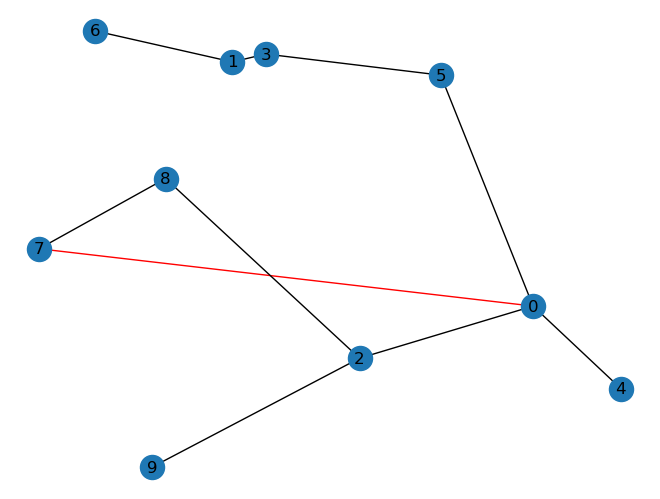

added edges [(7, 0)]
min cc 0.24324324324324326
budget -0.0413112173196889
-----------------------------------------------
(7, 0, 2)
edge (7, 0)
done True
-----------------------------------------------
(7, 0, 3)
edge (7, 0)
out of budget
edge (0, 3)
done False


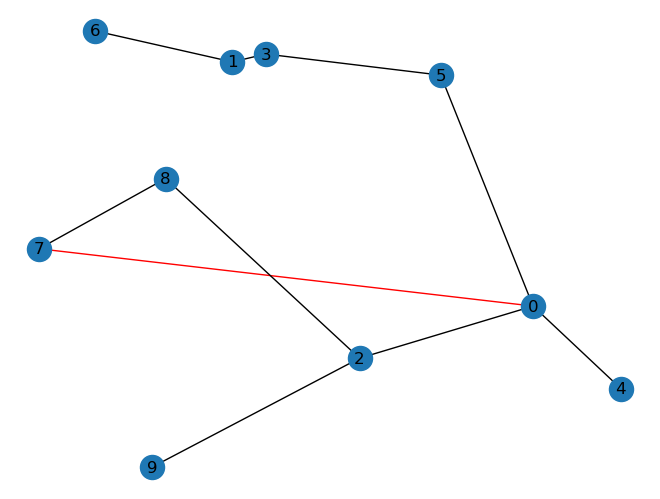

added edges [(7, 0)]
min cc 0.24324324324324326
budget -0.02081844544847511
-----------------------------------------------
(7, 0, 4)
edge (7, 0)
done True
-----------------------------------------------
(7, 0, 5)
edge (7, 0)
done True
-----------------------------------------------
(7, 0, 6)
edge (7, 0)
out of budget
edge (0, 6)
done False


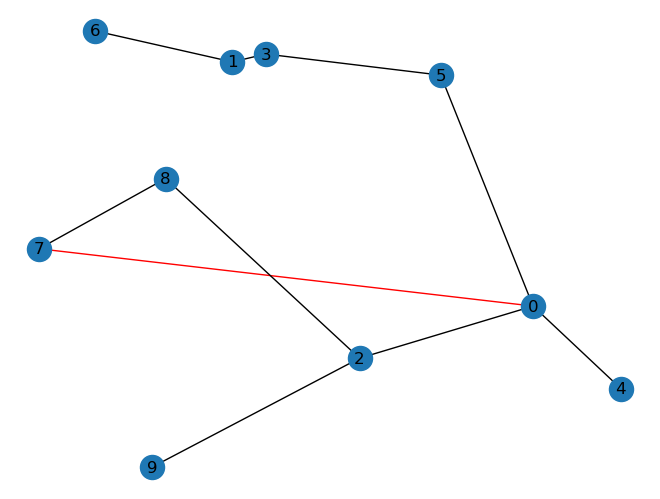

added edges [(7, 0)]
min cc 0.24324324324324326
budget -0.24877439275376834
-----------------------------------------------
(7, 0, 8)
edge (7, 0)
edge (0, 8)
done False


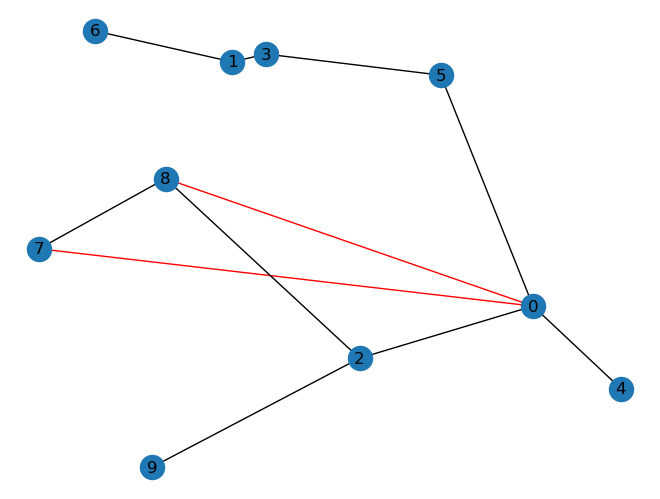

added edges [(7, 0), (0, 8)]
min cc 0.25
budget 0.03204789384619411
-----------------------------------------------
(7, 0, 9)
edge (7, 0)
out of budget
edge (0, 9)
done False


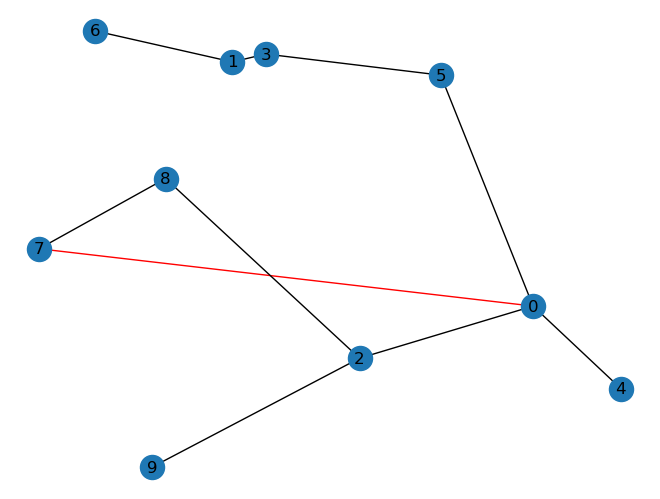

added edges [(7, 0)]
min cc 0.24324324324324326
budget -0.02293190519302879
-----------------------------------------------
(7, 1, 0)
edge (7, 1)
edge (1, 0)
done False


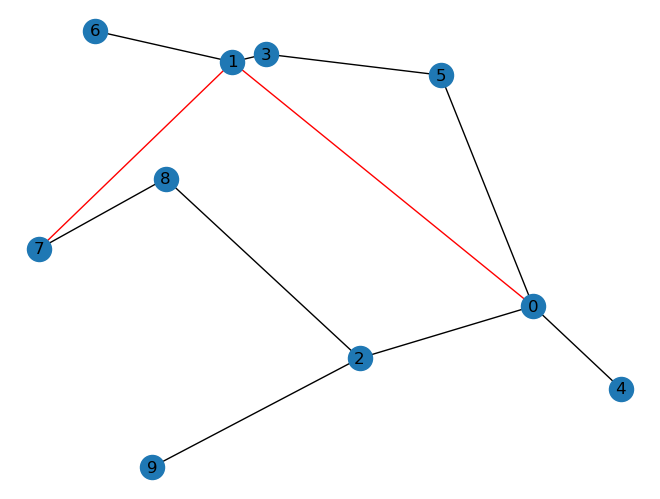

added edges [(7, 1), (1, 0)]
min cc 0.36
budget 0.24408181955448005
-----------------------------------------------
(7, 1, 2)
edge (7, 1)
edge (1, 2)
done False


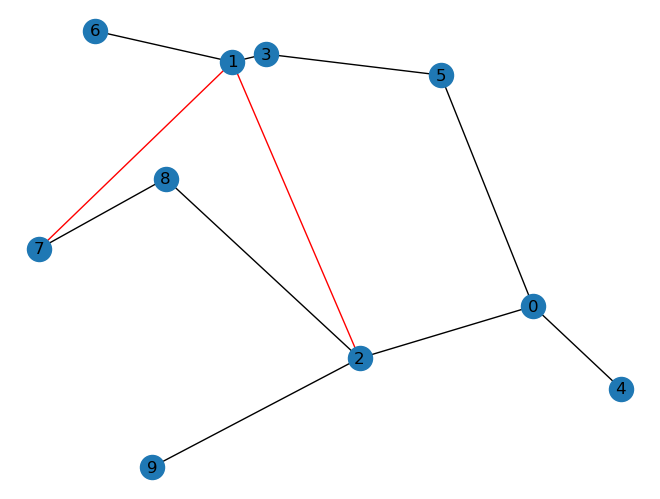

added edges [(7, 1), (1, 2)]
min cc 0.36
budget 0.28022211011913745
-----------------------------------------------
(7, 1, 3)
edge (7, 1)
done True
-----------------------------------------------
(7, 1, 4)
edge (7, 1)
edge (1, 4)
done False


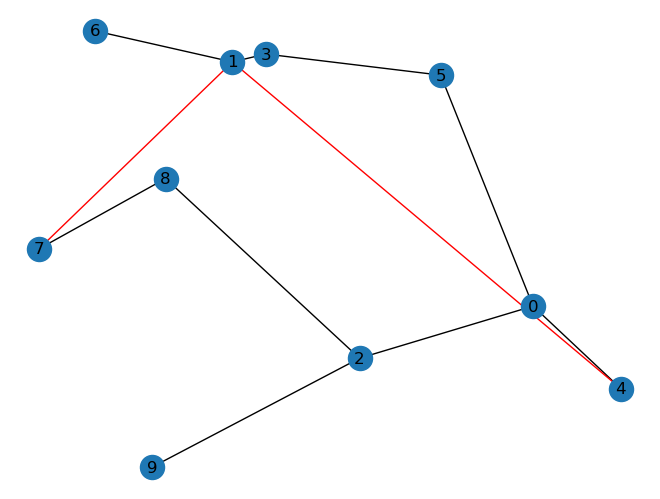

added edges [(7, 1), (1, 4)]
min cc 0.3333333333333333
budget 0.010906051252660753
-----------------------------------------------
(7, 1, 5)
edge (7, 1)
edge (1, 5)
done False


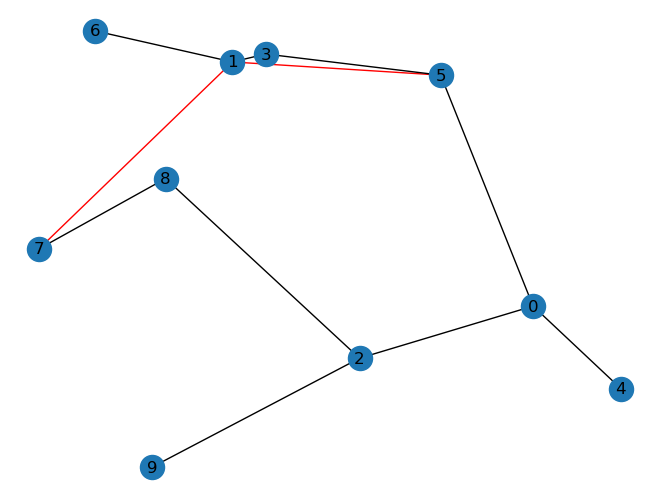

added edges [(7, 1), (1, 5)]
min cc 0.3333333333333333
budget 0.6389424654547827
-----------------------------------------------
(7, 1, 6)
edge (7, 1)
done True
-----------------------------------------------
(7, 1, 8)
edge (7, 1)
edge (1, 8)
done False


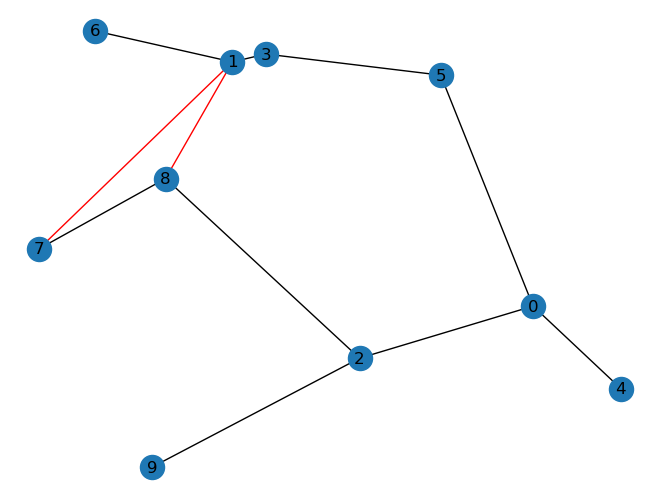

added edges [(7, 1), (1, 8)]
min cc 0.3333333333333333
budget 0.6935507218081667
-----------------------------------------------
(7, 1, 9)
edge (7, 1)
edge (1, 9)
done False


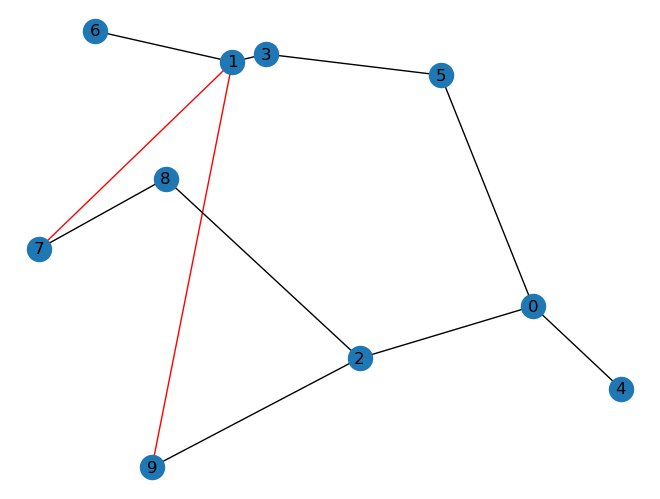

added edges [(7, 1), (1, 9)]
min cc 0.3333333333333333
budget 0.05719765149944145
-----------------------------------------------
(7, 2, 0)
edge (7, 2)
done True
-----------------------------------------------
(7, 2, 1)
edge (7, 2)
edge (2, 1)
done False


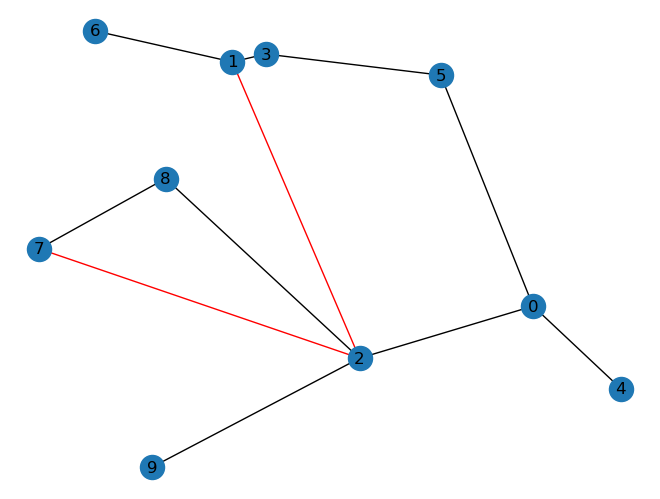

added edges [(7, 2), (2, 1)]
min cc 0.375
budget 0.2301585220532434
-----------------------------------------------
(7, 2, 3)
edge (7, 2)
edge (2, 3)
done False


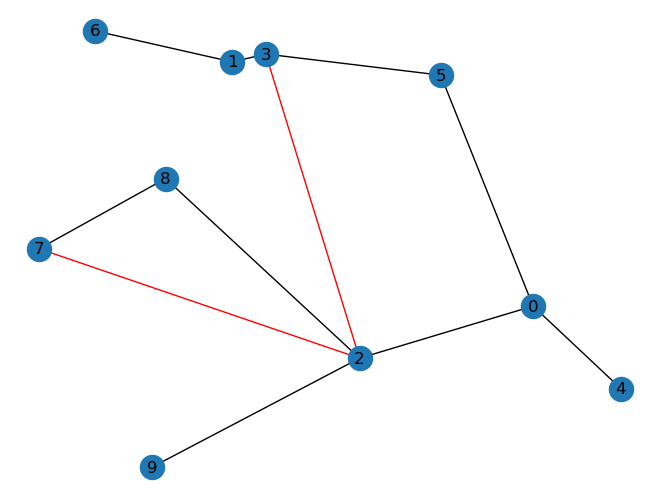

added edges [(7, 2), (2, 3)]
min cc 0.3
budget 0.22671789435392986
-----------------------------------------------
(7, 2, 4)
edge (7, 2)
edge (2, 4)
done False


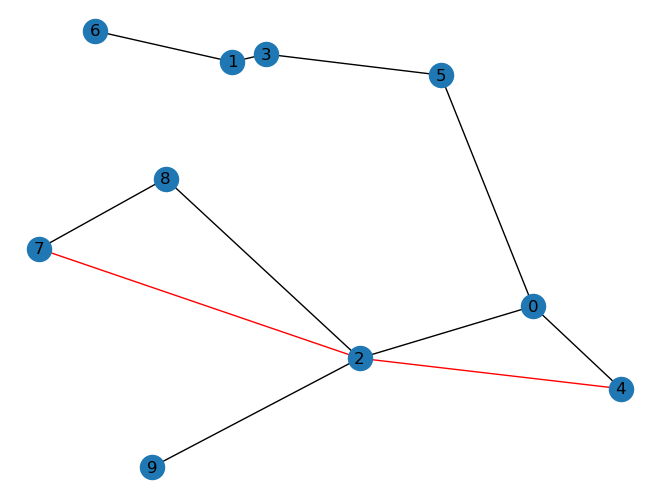

added edges [(7, 2), (2, 4)]
min cc 0.23684210526315788
budget 0.498869659563957
-----------------------------------------------
(7, 2, 5)
edge (7, 2)
edge (2, 5)
done False


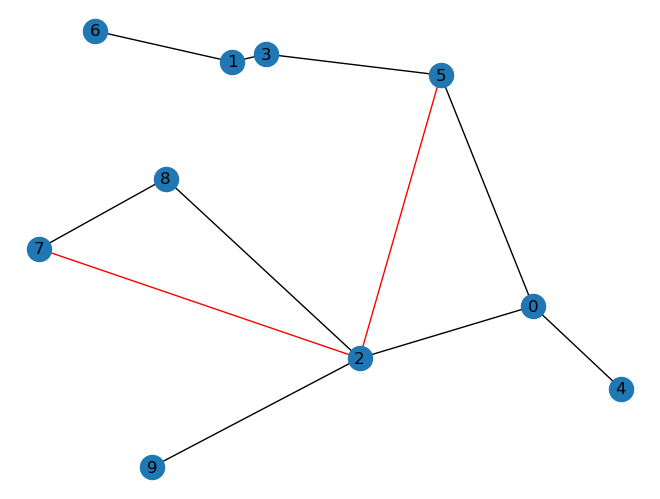

added edges [(7, 2), (2, 5)]
min cc 0.2647058823529412
budget 0.2773935089301026
-----------------------------------------------
(7, 2, 6)
edge (7, 2)
edge (2, 6)
done False


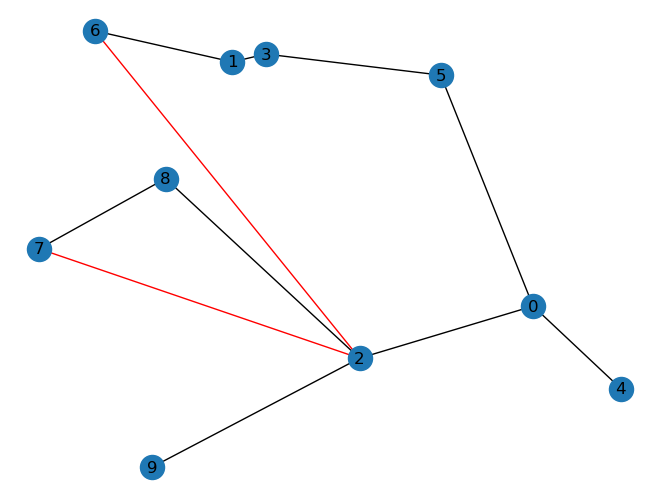

added edges [(7, 2), (2, 6)]
min cc 0.375
budget 0.07585950953006626
-----------------------------------------------
(7, 2, 8)
edge (7, 2)
done True
-----------------------------------------------
(7, 2, 9)
edge (7, 2)
done True
-----------------------------------------------
(7, 3, 0)
edge (7, 3)
edge (3, 0)
done False


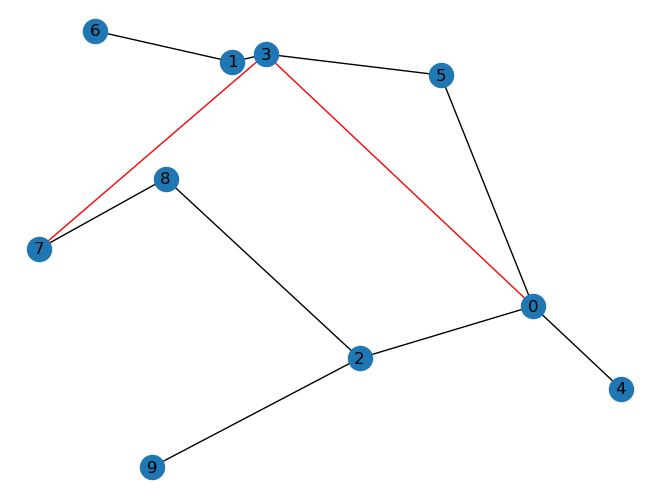

added edges [(7, 3), (3, 0)]
min cc 0.3103448275862069
budget 0.2171497519837805
-----------------------------------------------
(7, 3, 1)
edge (7, 3)
done True
-----------------------------------------------
(7, 3, 2)
edge (7, 3)
edge (3, 2)
done False


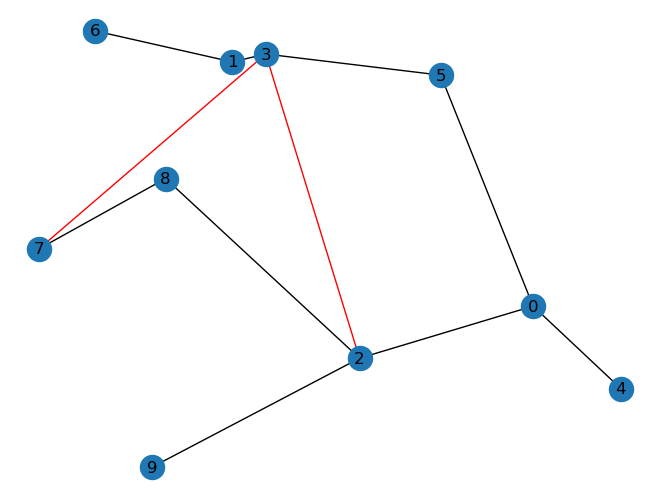

added edges [(7, 3), (3, 2)]
min cc 0.3103448275862069
budget 0.22935664297791059
-----------------------------------------------
(7, 3, 4)
edge (7, 3)
out of budget
edge (3, 4)
done False


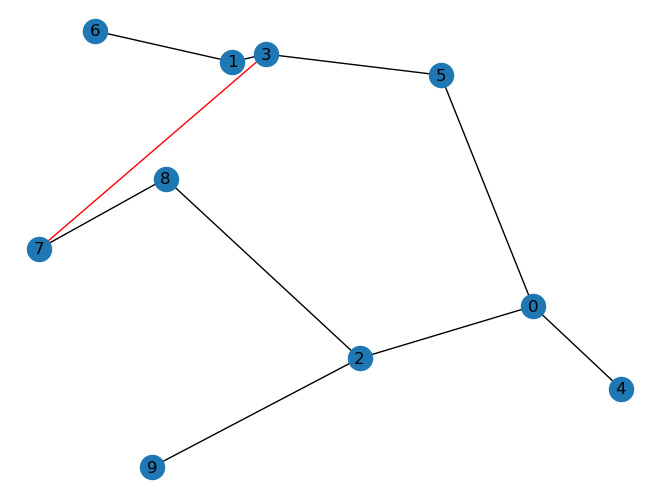

added edges [(7, 3)]
min cc 0.2727272727272727
budget -0.01648461575694049
-----------------------------------------------
(7, 3, 5)
edge (7, 3)
done True
-----------------------------------------------
(7, 3, 6)
edge (7, 3)
edge (3, 6)
done False


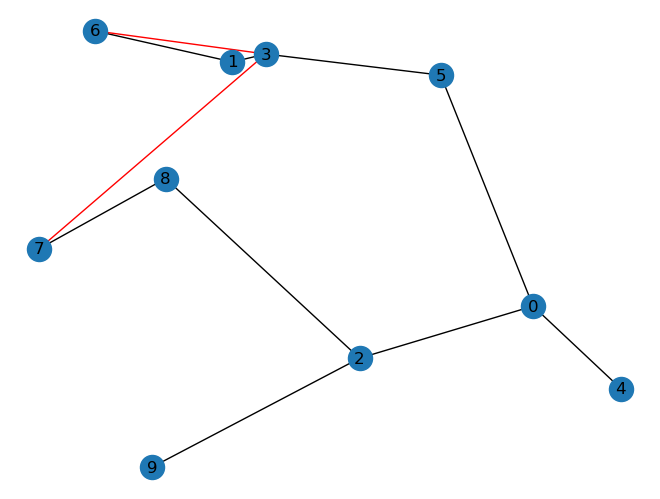

added edges [(7, 3), (3, 6)]
min cc 0.32142857142857145
budget 0.6483089227731805
-----------------------------------------------
(7, 3, 8)
edge (7, 3)
edge (3, 8)
done False


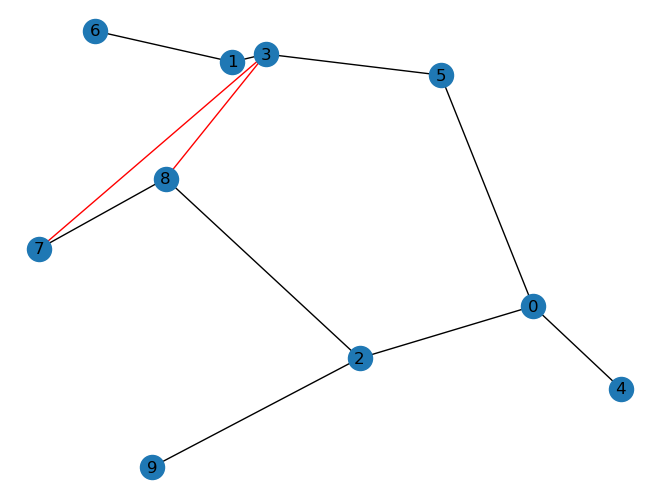

added edges [(7, 3), (3, 8)]
min cc 0.3
budget 0.6062137211486069
-----------------------------------------------
(7, 3, 9)
edge (7, 3)
out of budget
edge (3, 9)
done False


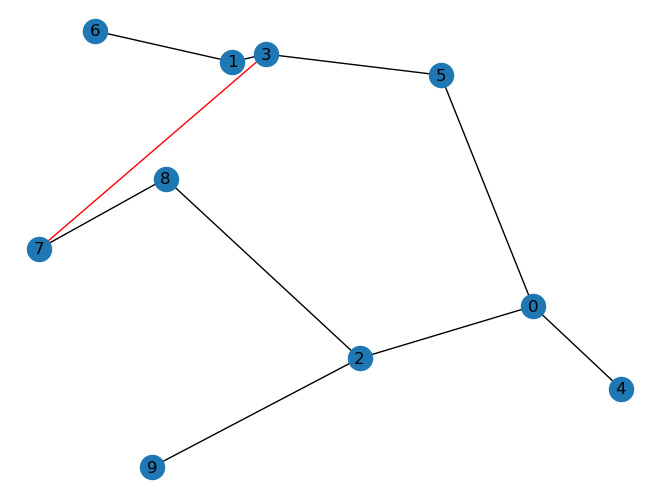

added edges [(7, 3)]
min cc 0.2727272727272727
budget -0.016866890703215787
-----------------------------------------------
(7, 4, 0)
edge (7, 4)
done True
-----------------------------------------------
(7, 4, 1)
edge (7, 4)
out of budget
edge (4, 1)
done False


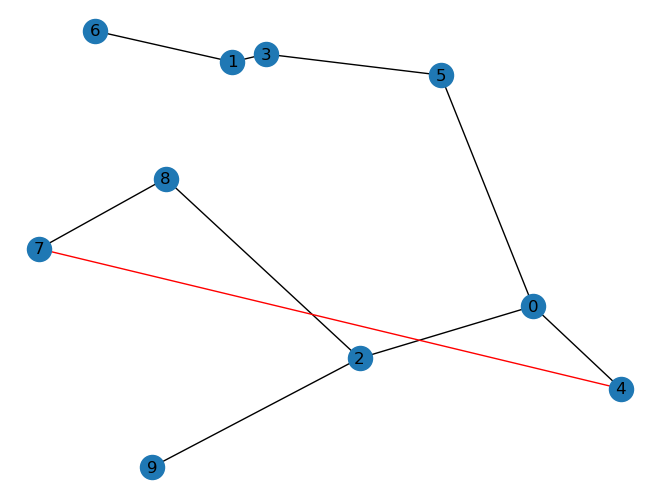

added edges [(7, 4)]
min cc 0.23684210526315788
budget -0.4572729255620258
-----------------------------------------------
(7, 4, 2)
edge (7, 4)
edge (4, 2)
done False


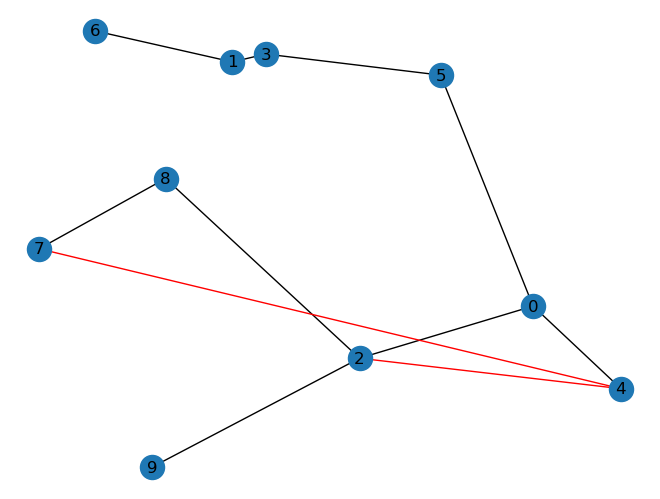

added edges [(7, 4), (4, 2)]
min cc 0.23684210526315788
budget 0.08075427081516451
-----------------------------------------------
(7, 4, 3)
edge (7, 4)
out of budget
edge (4, 3)
done False


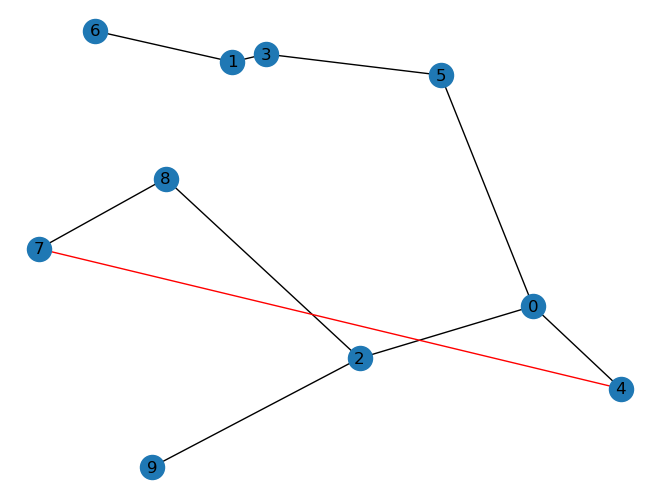

added edges [(7, 4)]
min cc 0.23684210526315788
budget -0.4372387531297137
-----------------------------------------------
(7, 4, 5)
edge (7, 4)
out of budget
edge (4, 5)
done False


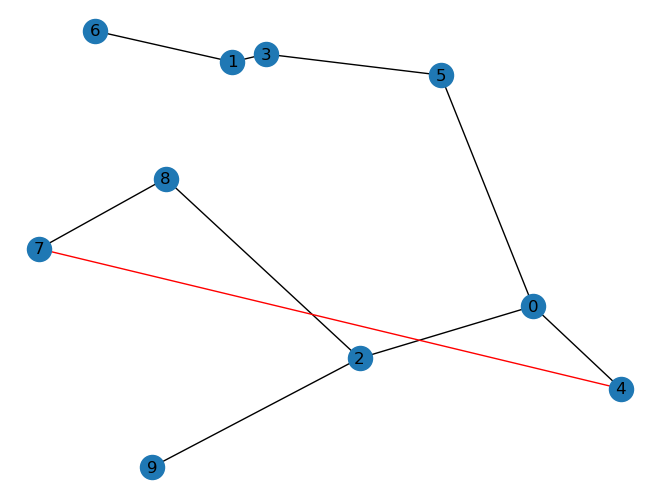

added edges [(7, 4)]
min cc 0.23684210526315788
budget -0.253607390611299
-----------------------------------------------
(7, 4, 6)
edge (7, 4)
out of budget
edge (4, 6)
done False


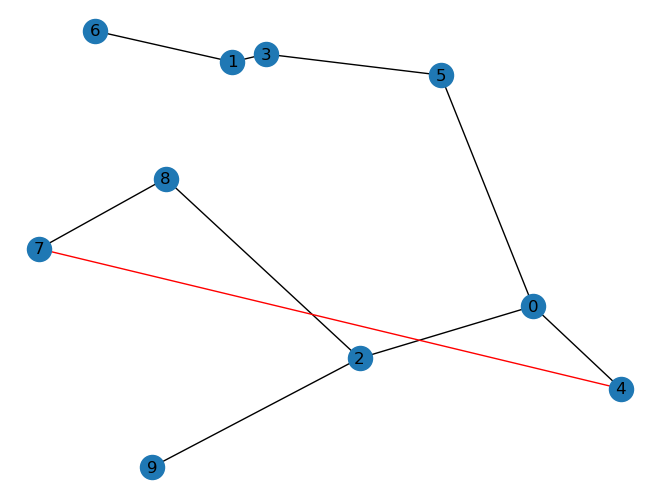

added edges [(7, 4)]
min cc 0.23684210526315788
budget -0.6614598884459769
-----------------------------------------------
(7, 4, 8)
edge (7, 4)
out of budget
edge (4, 8)
done False


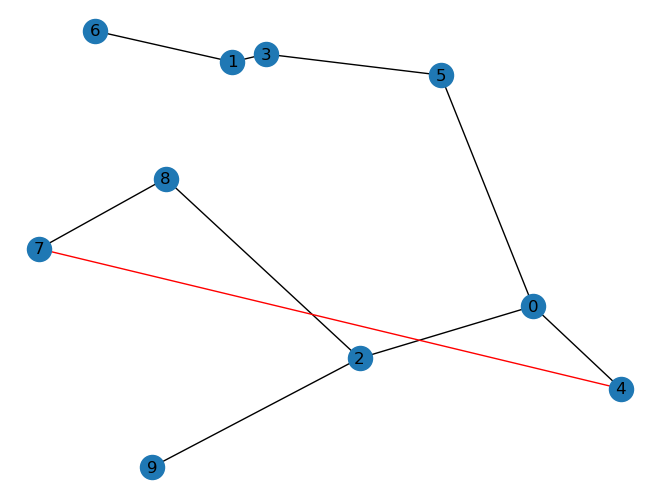

added edges [(7, 4)]
min cc 0.23684210526315788
budget -0.3656108537496089
-----------------------------------------------
(7, 4, 9)
edge (7, 4)
out of budget
edge (4, 9)
done False


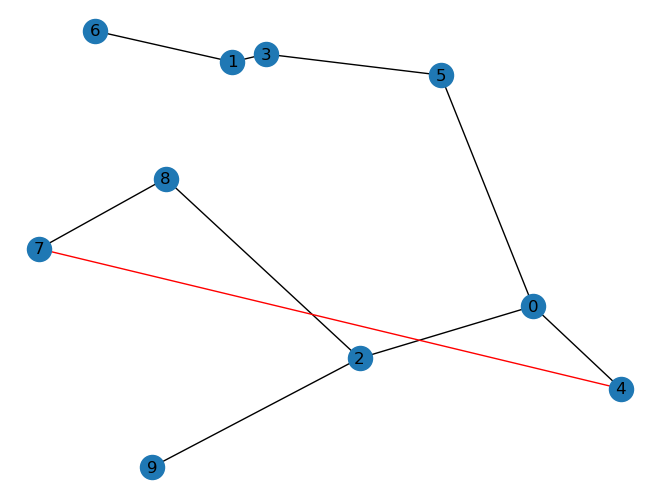

added edges [(7, 4)]
min cc 0.23684210526315788
budget -0.26944927886341397
-----------------------------------------------
(7, 5, 0)
edge (7, 5)
done True
-----------------------------------------------
(7, 5, 1)
edge (7, 5)
edge (5, 1)
done False


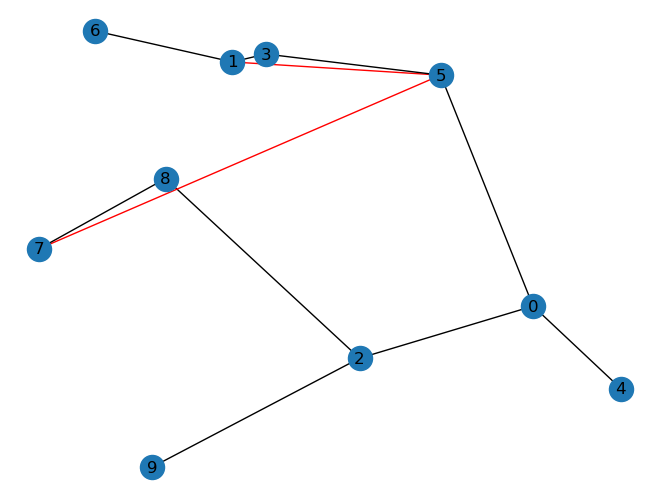

added edges [(7, 5), (5, 1)]
min cc 0.32142857142857145
budget 0.40496664061857035
-----------------------------------------------
(7, 5, 2)
edge (7, 5)
edge (5, 2)
done False


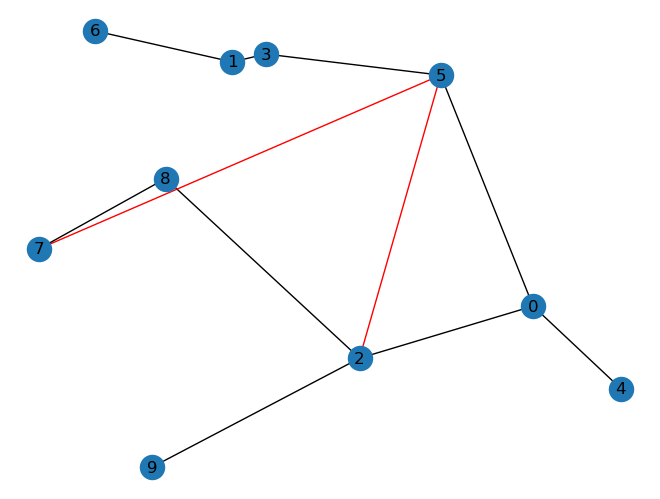

added edges [(7, 5), (5, 2)]
min cc 0.2727272727272727
budget 0.0934812721597843
-----------------------------------------------
(7, 5, 3)
edge (7, 5)
done True
-----------------------------------------------
(7, 5, 4)
edge (7, 5)
out of budget
edge (5, 4)
done False


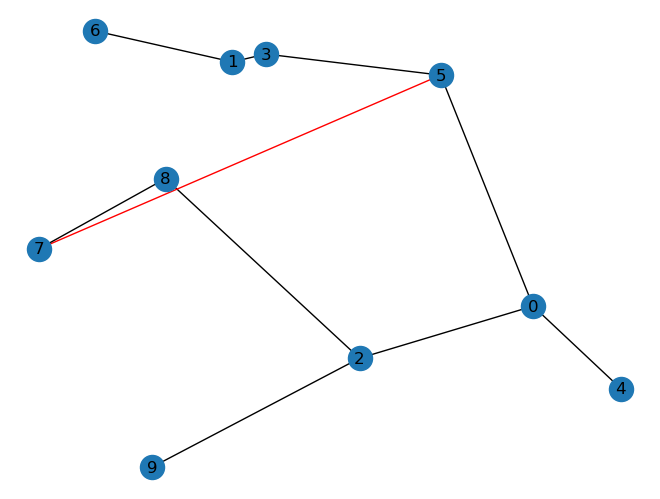

added edges [(7, 5)]
min cc 0.2571428571428571
budget -0.01940423863282481
-----------------------------------------------
(7, 5, 6)
edge (7, 5)
edge (5, 6)
done False


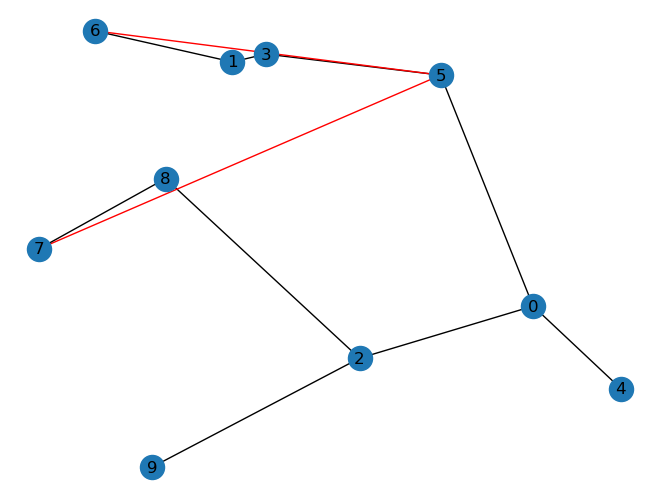

added edges [(7, 5), (5, 6)]
min cc 0.3333333333333333
budget 0.17516231611036492
-----------------------------------------------
(7, 5, 8)
edge (7, 5)
edge (5, 8)
done False


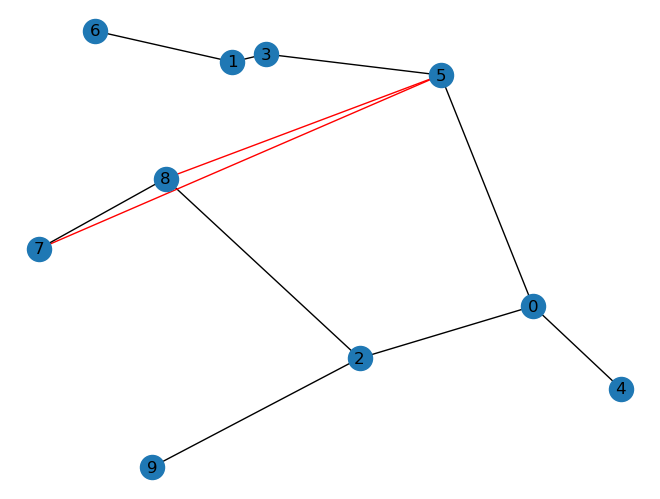

added edges [(7, 5), (5, 8)]
min cc 0.2647058823529412
budget 0.24128269786333445
-----------------------------------------------
(7, 5, 9)
edge (7, 5)
out of budget
edge (5, 9)
done False


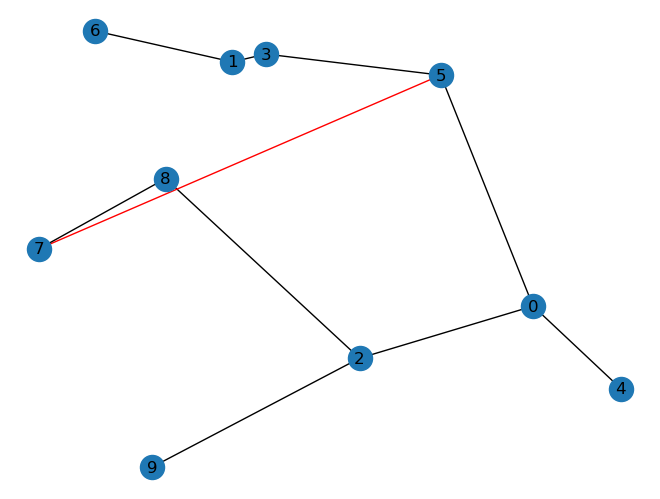

added edges [(7, 5)]
min cc 0.2571428571428571
budget -0.25387341614501546
-----------------------------------------------
(7, 6, 0)
edge (7, 6)
edge (6, 0)
done False


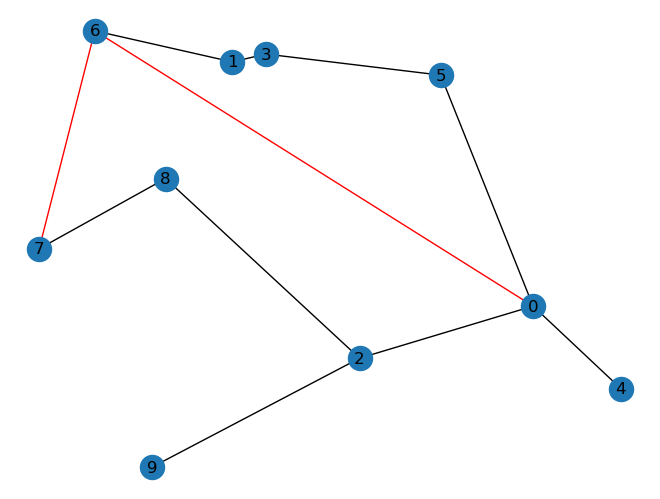

added edges [(7, 6), (6, 0)]
min cc 0.36
budget 0.061931666932792506
-----------------------------------------------
(7, 6, 1)
edge (7, 6)
done True
-----------------------------------------------
(7, 6, 2)
edge (7, 6)
edge (6, 2)
done False


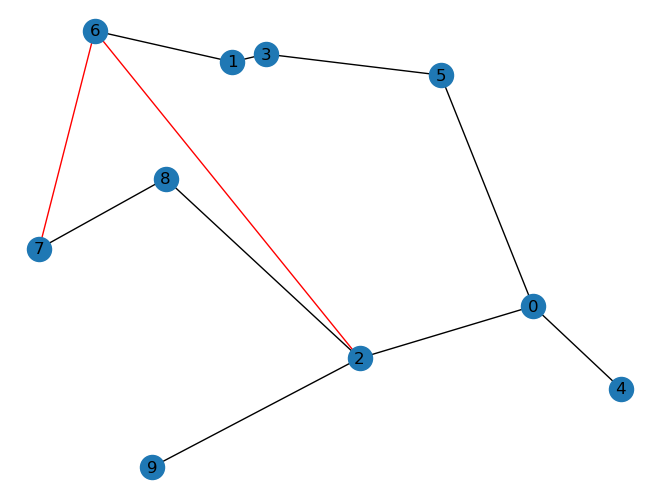

added edges [(7, 6), (6, 2)]
min cc 0.36
budget 0.15123612040835221
-----------------------------------------------
(7, 6, 3)
edge (7, 6)
edge (6, 3)
done False


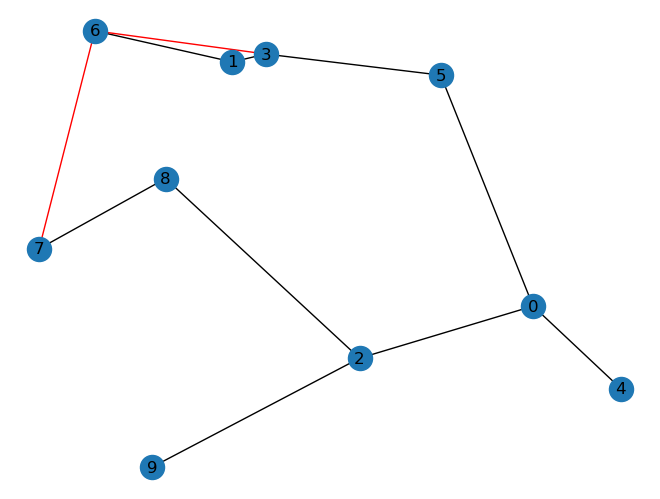

added edges [(7, 6), (6, 3)]
min cc 0.3333333333333333
budget 0.7210467850274858
-----------------------------------------------
(7, 6, 4)
edge (7, 6)
out of budget
edge (6, 4)
done False


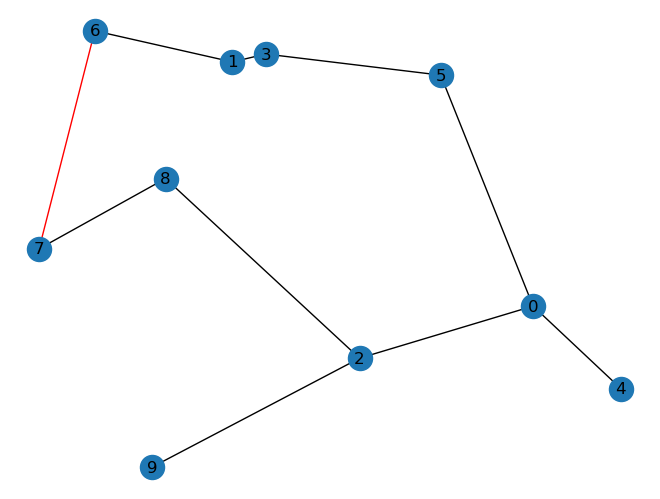

added edges [(7, 6)]
min cc 0.3333333333333333
budget -0.16796788881889846
-----------------------------------------------
(7, 6, 5)
edge (7, 6)
edge (6, 5)
done False


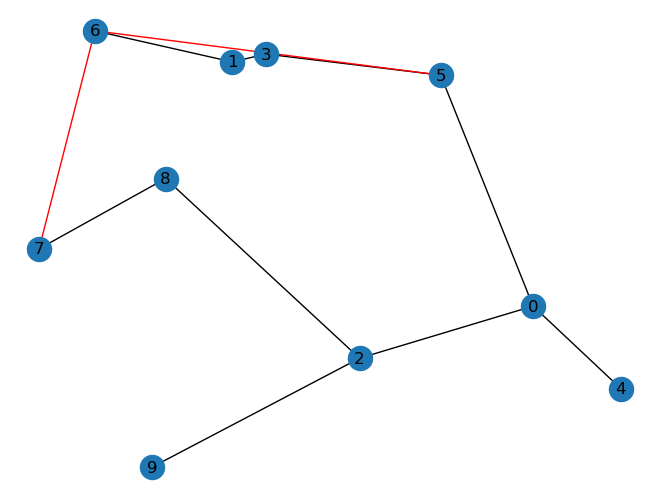

added edges [(7, 6), (6, 5)]
min cc 0.3333333333333333
budget 0.4344511637589692
-----------------------------------------------
(7, 6, 8)
edge (7, 6)
edge (6, 8)
done False


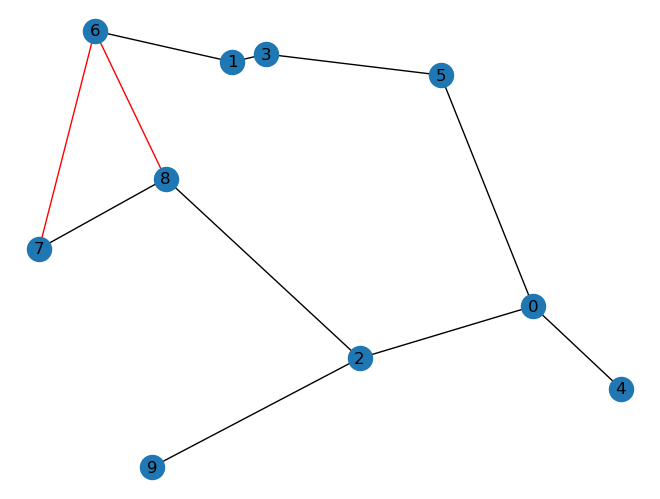

added edges [(7, 6), (6, 8)]
min cc 0.34615384615384615
budget 0.6511469199804747
-----------------------------------------------
(7, 6, 9)
edge (7, 6)
edge (6, 9)
done False


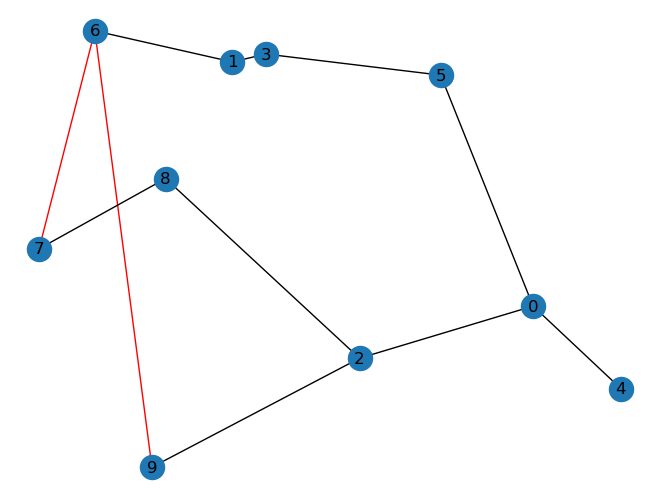

added edges [(7, 6), (6, 9)]
min cc 0.34615384615384615
budget 0.01746111158665875
-----------------------------------------------
(7, 8, 0)
done True
-----------------------------------------------
(7, 8, 1)
done True
-----------------------------------------------
(7, 8, 2)
done True
-----------------------------------------------
(7, 8, 3)
done True
-----------------------------------------------
(7, 8, 4)
done True
-----------------------------------------------
(7, 8, 5)
done True
-----------------------------------------------
(7, 8, 6)
done True
-----------------------------------------------
(7, 8, 9)
done True
-----------------------------------------------
(7, 9, 0)
edge (7, 9)
edge (9, 0)
done False


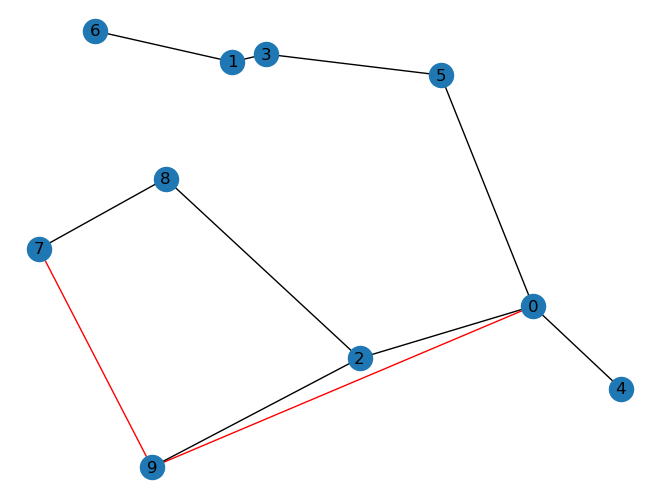

added edges [(7, 9), (9, 0)]
min cc 0.24324324324324326
budget 0.26215162593037256
-----------------------------------------------
(7, 9, 1)
edge (7, 9)
edge (9, 1)
done False


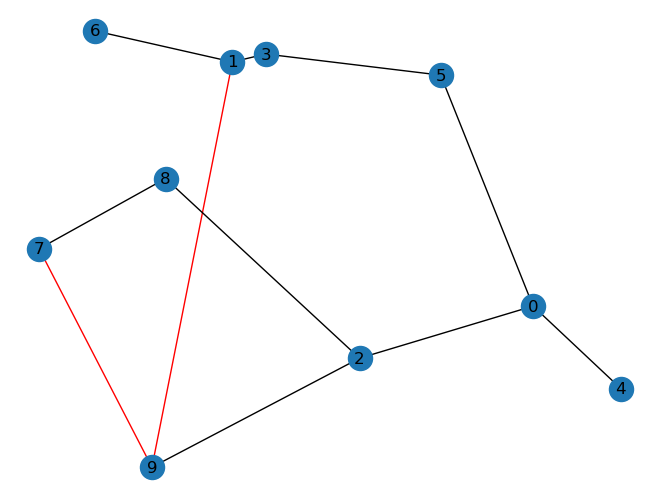

added edges [(7, 9), (9, 1)]
min cc 0.3333333333333333
budget 0.056888145748673846
-----------------------------------------------
(7, 9, 2)
edge (7, 9)
done True
-----------------------------------------------
(7, 9, 3)
edge (7, 9)
edge (9, 3)
done False


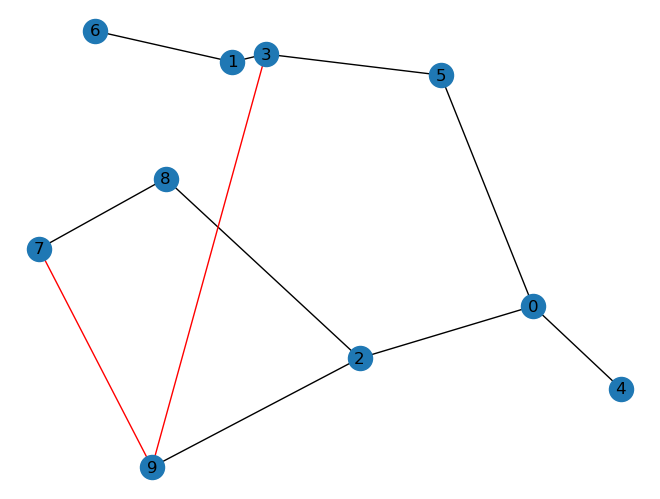

added edges [(7, 9), (9, 3)]
min cc 0.2903225806451613
budget 0.030248442987929947
-----------------------------------------------
(7, 9, 4)
edge (7, 9)
edge (9, 4)
done False


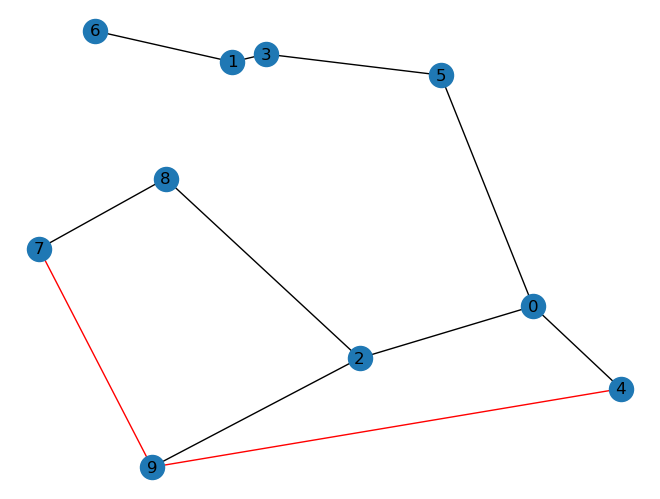

added edges [(7, 9), (9, 4)]
min cc 0.23076923076923078
budget 0.198420192200505
-----------------------------------------------
(7, 9, 5)
edge (7, 9)
out of budget
edge (9, 5)
done False


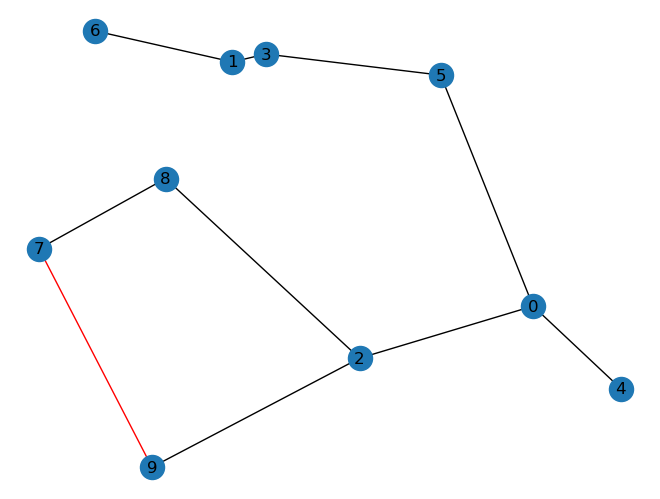

added edges [(7, 9)]
min cc 0.23076923076923078
budget -0.02020709705957069
-----------------------------------------------
(7, 9, 6)
edge (7, 9)
out of budget
edge (9, 6)
done False


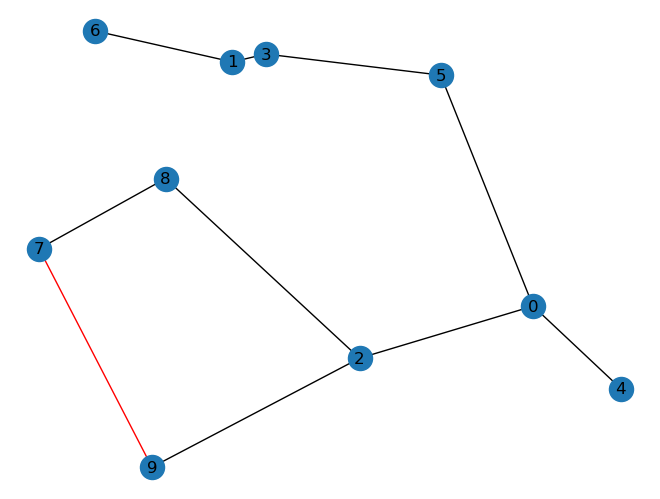

added edges [(7, 9)]
min cc 0.23076923076923078
budget -0.008161416976500746
-----------------------------------------------
(7, 9, 8)
edge (7, 9)
edge (9, 8)
done False


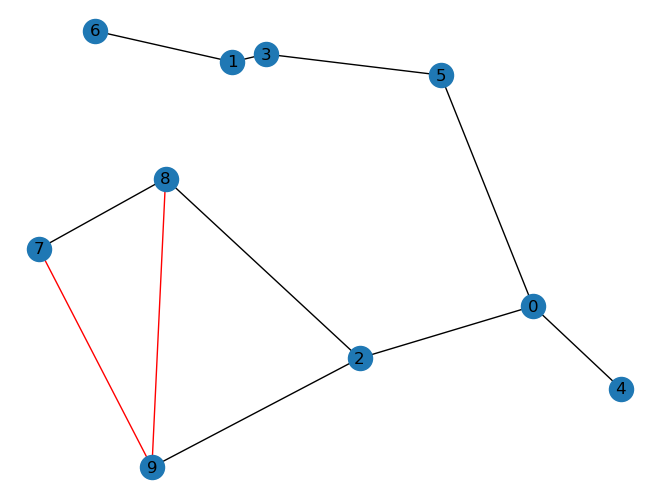

added edges [(7, 9), (9, 8)]
min cc 0.23076923076923078
budget 0.32764696932971404
-----------------------------------------------
(8, 0, 1)
edge (8, 0)
edge (0, 1)
done False


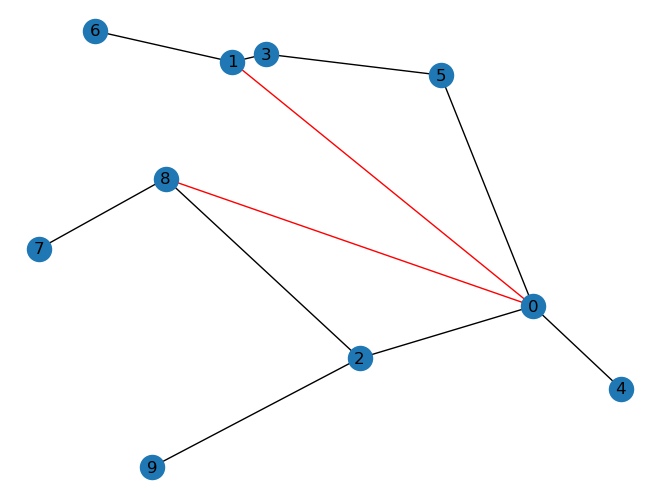

added edges [(8, 0), (0, 1)]
min cc 0.36
budget 0.10786618931614489
-----------------------------------------------
(8, 0, 2)
edge (8, 0)
done True
-----------------------------------------------
(8, 0, 3)
edge (8, 0)
edge (0, 3)
done False


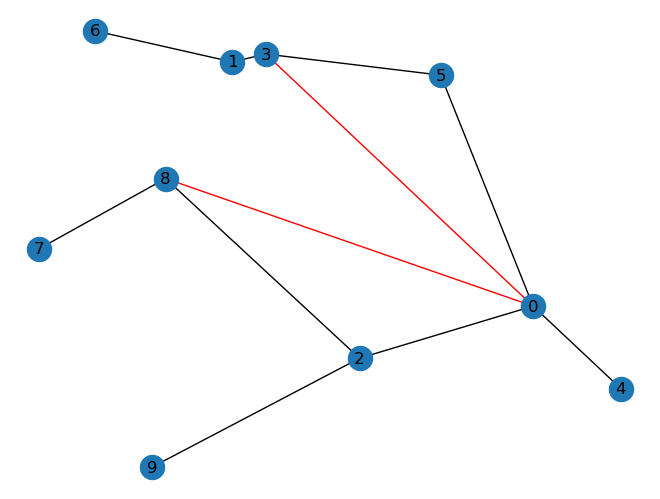

added edges [(8, 0), (0, 3)]
min cc 0.2903225806451613
budget 0.12835896118735868
-----------------------------------------------
(8, 0, 4)
edge (8, 0)
done True
-----------------------------------------------
(8, 0, 5)
edge (8, 0)
done True
-----------------------------------------------
(8, 0, 6)
edge (8, 0)
out of budget
edge (0, 6)
done False


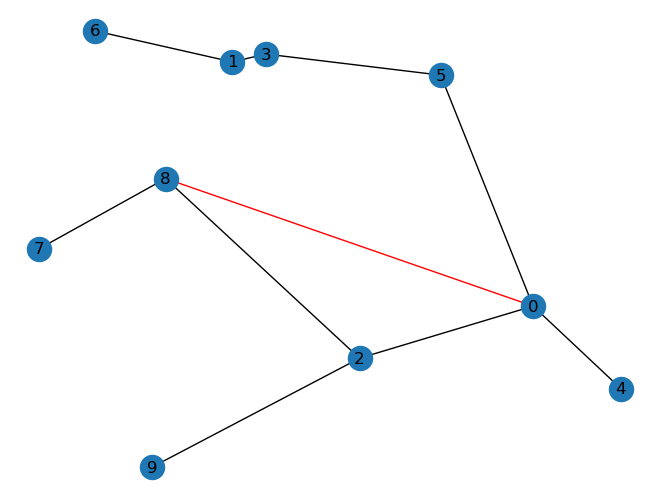

added edges [(8, 0)]
min cc 0.24324324324324326
budget -0.09959698611793455
-----------------------------------------------
(8, 0, 7)
edge (8, 0)
edge (0, 7)
done False


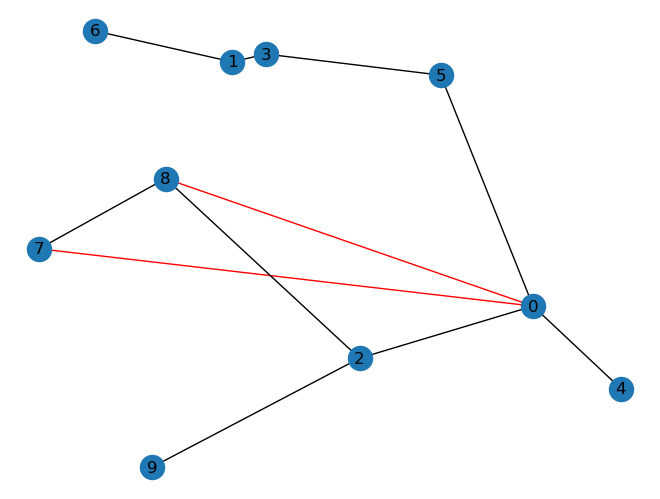

added edges [(8, 0), (0, 7)]
min cc 0.25
budget 0.03204789384619411
-----------------------------------------------
(8, 0, 9)
edge (8, 0)
edge (0, 9)
done False


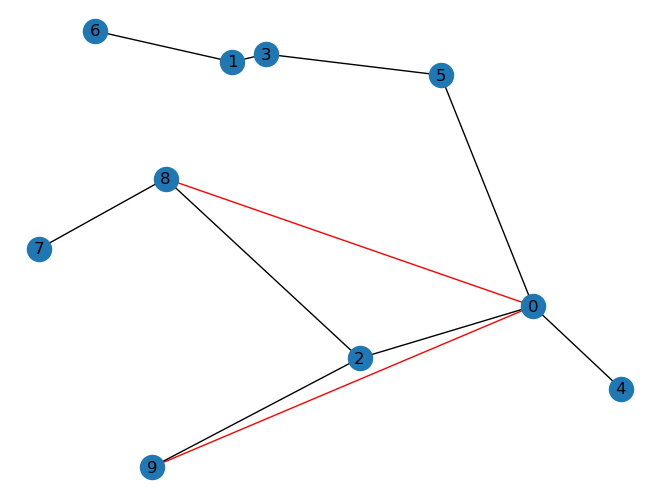

added edges [(8, 0), (0, 9)]
min cc 0.25
budget 0.126245501442805
-----------------------------------------------
(8, 1, 0)
edge (8, 1)
edge (1, 0)
done False


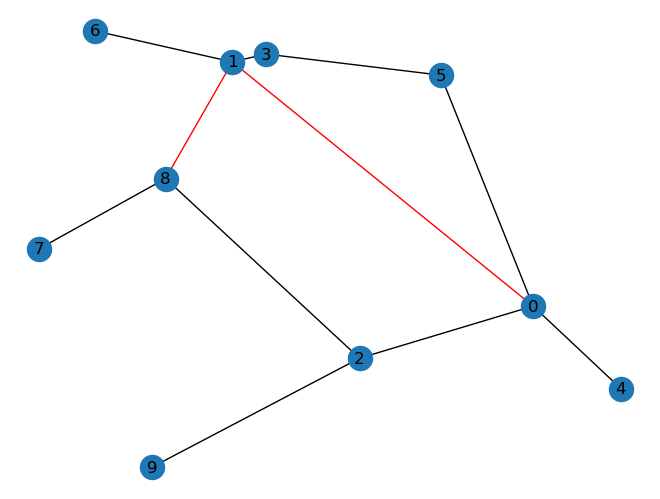

added edges [(8, 1), (1, 0)]
min cc 0.36
budget 0.4839759804039485
-----------------------------------------------
(8, 1, 2)
edge (8, 1)
edge (1, 2)
done False


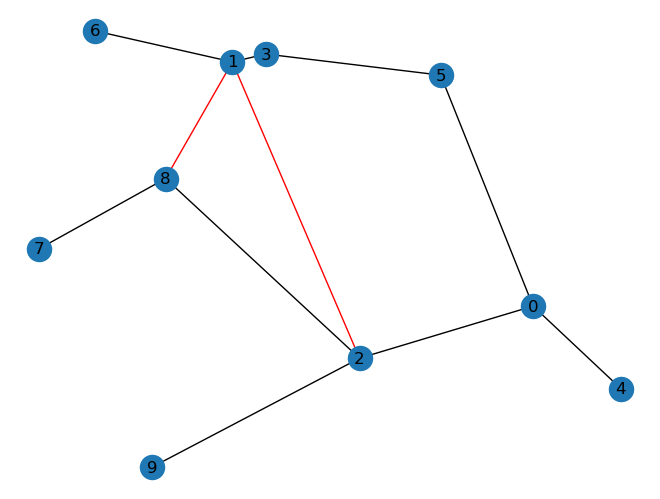

added edges [(8, 1), (1, 2)]
min cc 0.36
budget 0.5201162709686059
-----------------------------------------------
(8, 1, 3)
edge (8, 1)
done True
-----------------------------------------------
(8, 1, 4)
edge (8, 1)
edge (1, 4)
done False


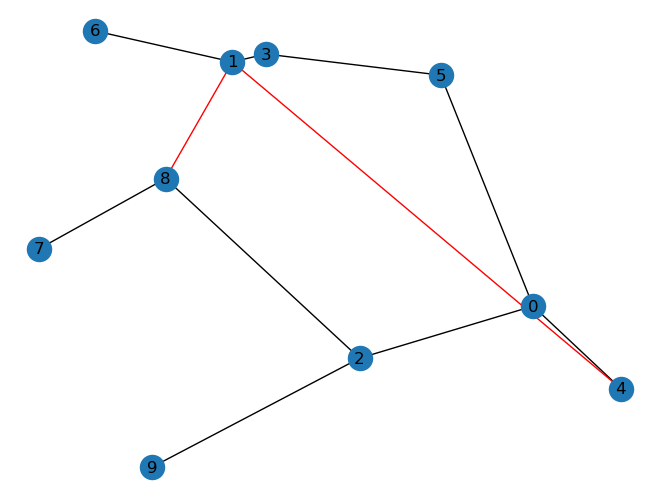

added edges [(8, 1), (1, 4)]
min cc 0.36
budget 0.2508002121021292
-----------------------------------------------
(8, 1, 5)
edge (8, 1)
edge (1, 5)
done False


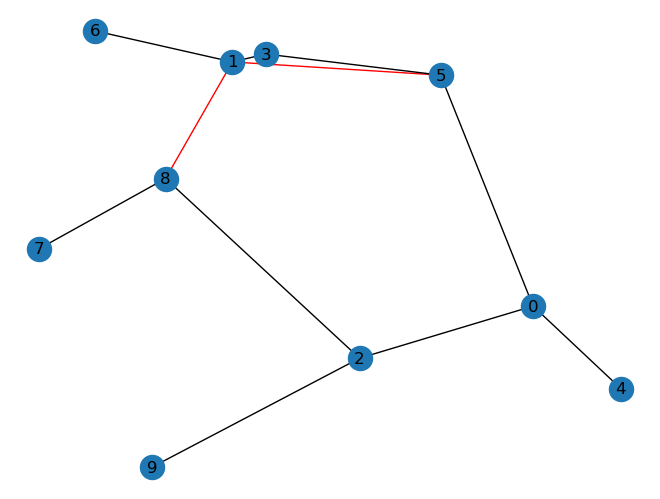

added edges [(8, 1), (1, 5)]
min cc 0.36
budget 0.8788366263042512
-----------------------------------------------
(8, 1, 6)
edge (8, 1)
done True
-----------------------------------------------
(8, 1, 7)
edge (8, 1)
edge (1, 7)
done False


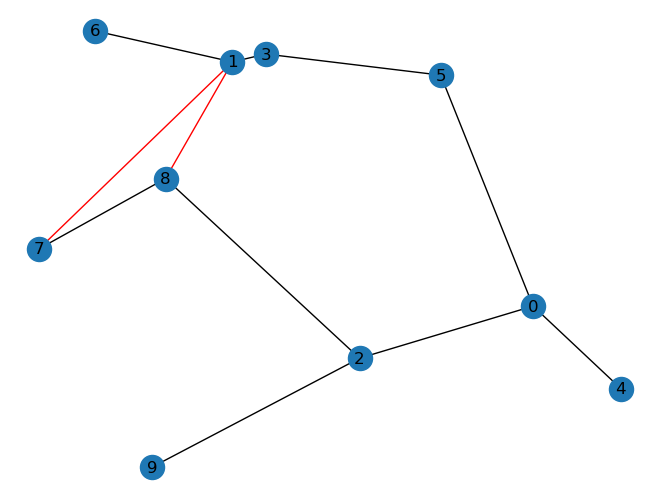

added edges [(8, 1), (1, 7)]
min cc 0.3333333333333333
budget 0.6935507218081667
-----------------------------------------------
(8, 1, 9)
edge (8, 1)
edge (1, 9)
done False


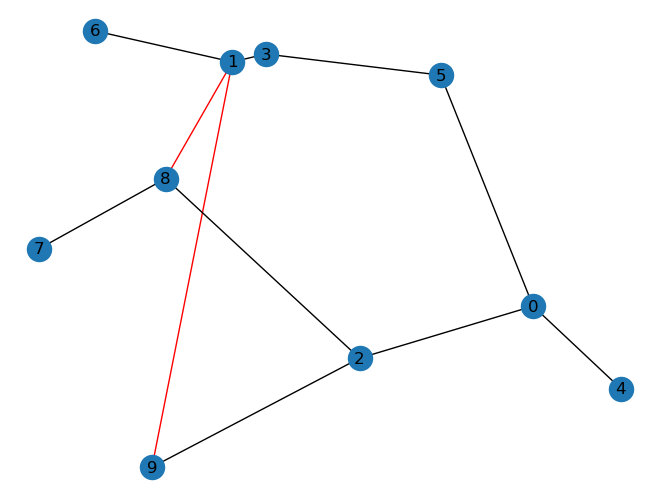

added edges [(8, 1), (1, 9)]
min cc 0.3333333333333333
budget 0.2970918123489099
-----------------------------------------------
(8, 2, 0)
done True
-----------------------------------------------
(8, 2, 1)
done True
-----------------------------------------------
(8, 2, 3)
done True
-----------------------------------------------
(8, 2, 4)
done True
-----------------------------------------------
(8, 2, 5)
done True
-----------------------------------------------
(8, 2, 6)
done True
-----------------------------------------------
(8, 2, 7)
done True
-----------------------------------------------
(8, 2, 9)
done True
-----------------------------------------------
(8, 3, 0)
edge (8, 3)
edge (3, 0)
done False


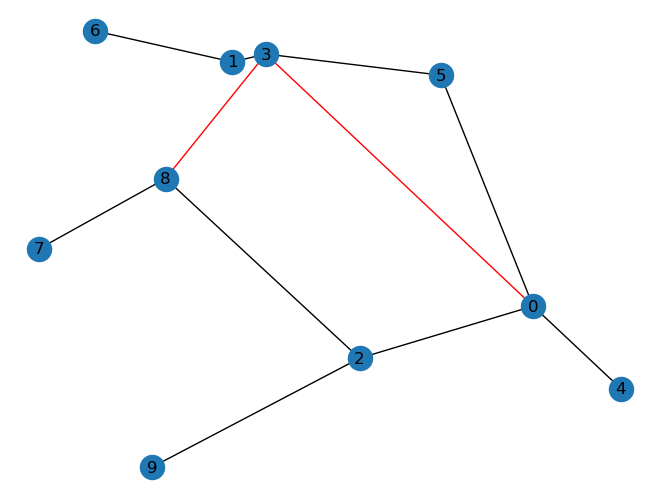

added edges [(8, 3), (3, 0)]
min cc 0.3103448275862069
budget 0.4645565910575158
-----------------------------------------------
(8, 3, 1)
edge (8, 3)
done True
-----------------------------------------------
(8, 3, 2)
edge (8, 3)
edge (3, 2)
done False


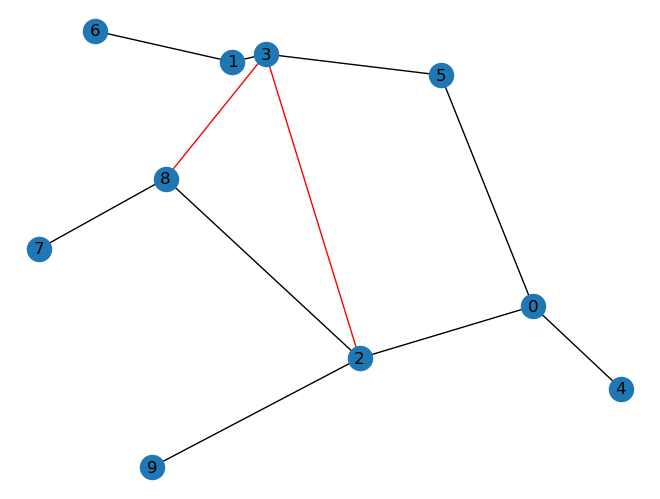

added edges [(8, 3), (3, 2)]
min cc 0.3103448275862069
budget 0.47676348205164587
-----------------------------------------------
(8, 3, 4)
edge (8, 3)
edge (3, 4)
done False


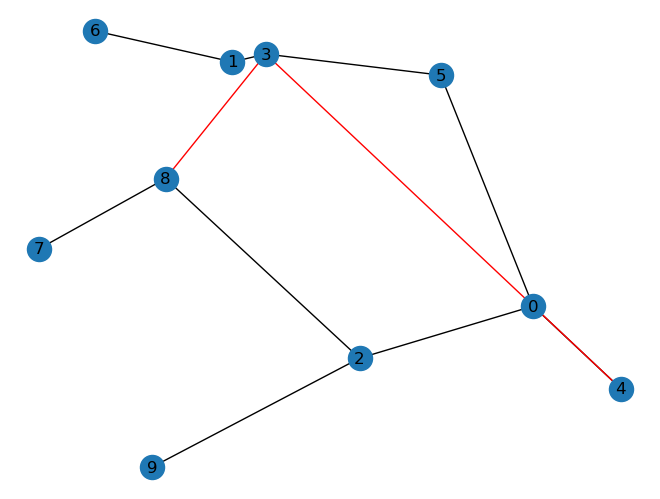

added edges [(8, 3), (3, 4)]
min cc 0.3103448275862069
budget 0.2309222233167948
-----------------------------------------------
(8, 3, 5)
edge (8, 3)
done True
-----------------------------------------------
(8, 3, 6)
edge (8, 3)
edge (3, 6)
done False


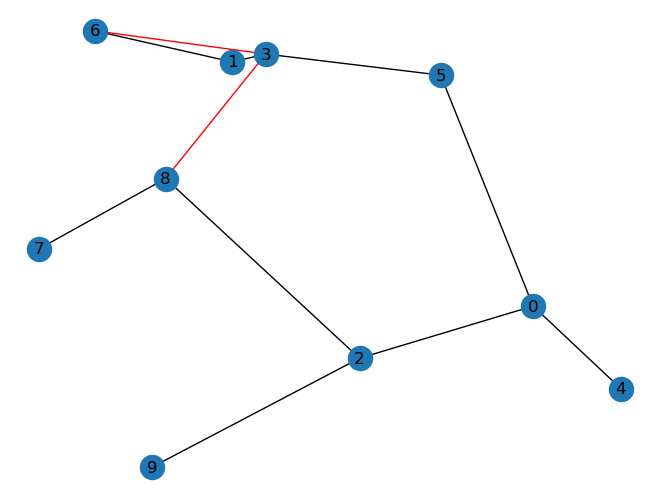

added edges [(8, 3), (3, 6)]
min cc 0.34615384615384615
budget 0.8957157618469158
-----------------------------------------------
(8, 3, 7)
edge (8, 3)
edge (3, 7)
done False


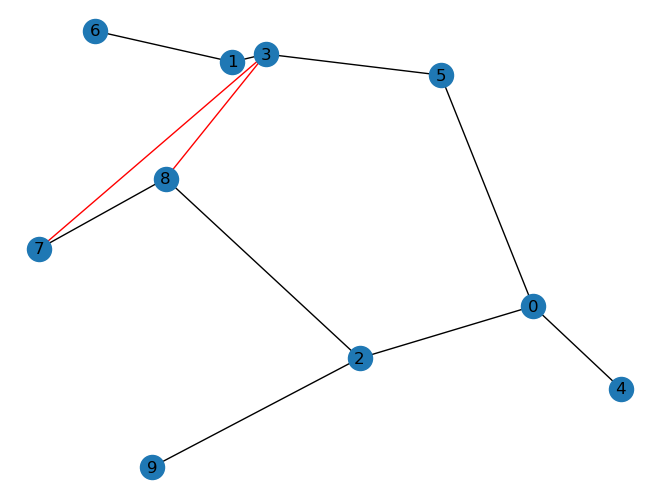

added edges [(8, 3), (3, 7)]
min cc 0.3
budget 0.6062137211486068
-----------------------------------------------
(8, 3, 9)
edge (8, 3)
edge (3, 9)
done False


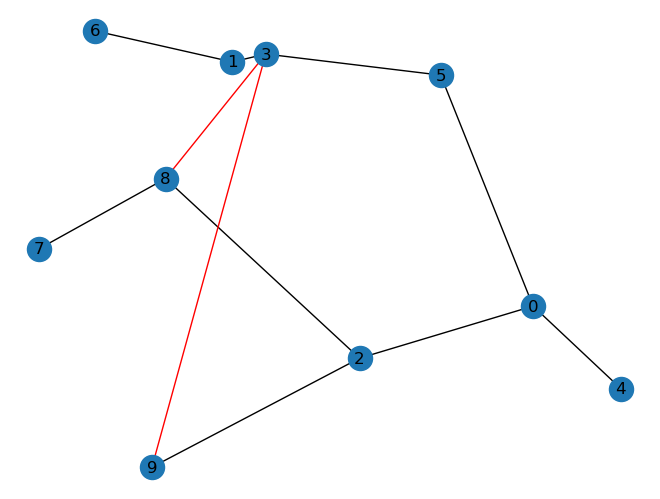

added edges [(8, 3), (3, 9)]
min cc 0.3103448275862069
budget 0.2305399483705195
-----------------------------------------------
(8, 4, 0)
edge (8, 4)
done True
-----------------------------------------------
(8, 4, 1)
edge (8, 4)
out of budget
edge (4, 1)
done False


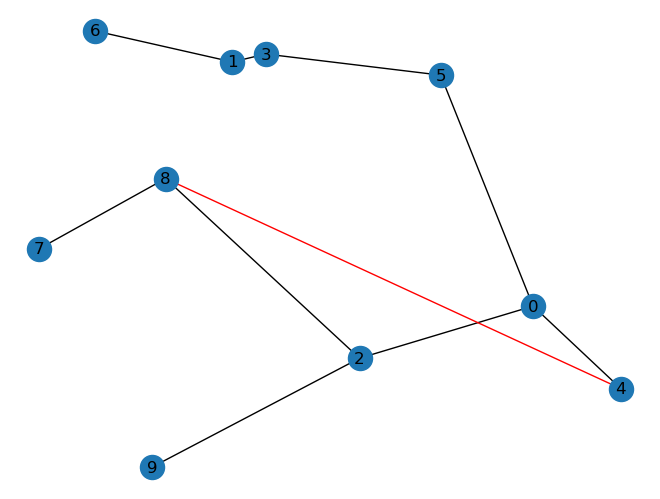

added edges [(8, 4)]
min cc 0.23076923076923078
budget -0.3401823866409598
-----------------------------------------------
(8, 4, 2)
edge (8, 4)
edge (4, 2)
done False


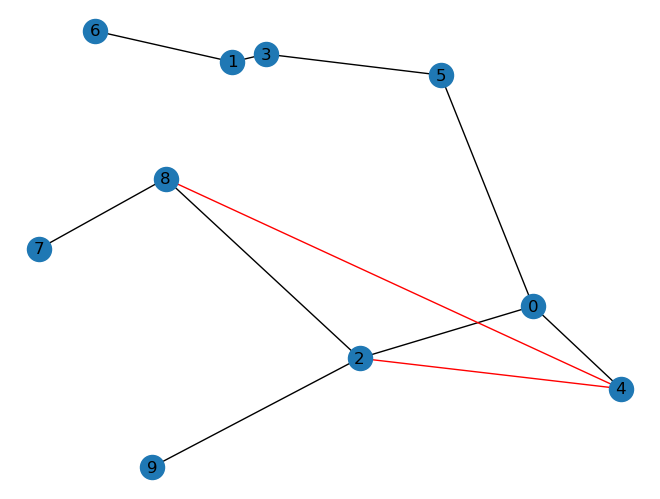

added edges [(8, 4), (4, 2)]
min cc 0.23076923076923078
budget 0.19784480973623053
-----------------------------------------------
(8, 4, 3)
edge (8, 4)
out of budget
edge (4, 3)
done False


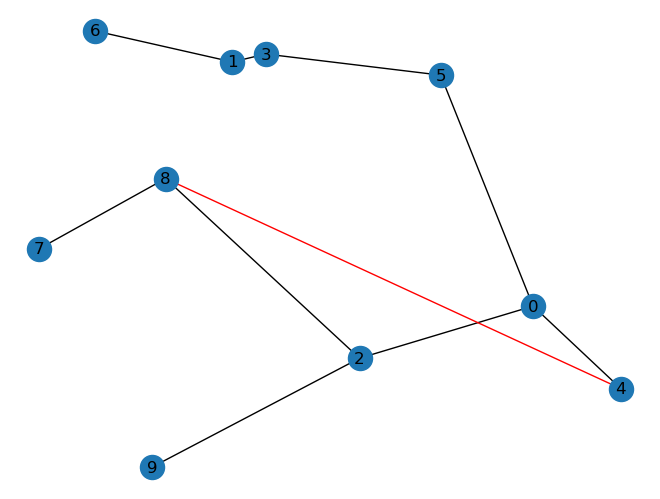

added edges [(8, 4)]
min cc 0.23076923076923078
budget -0.3201482142086477
-----------------------------------------------
(8, 4, 5)
edge (8, 4)
out of budget
edge (4, 5)
done False


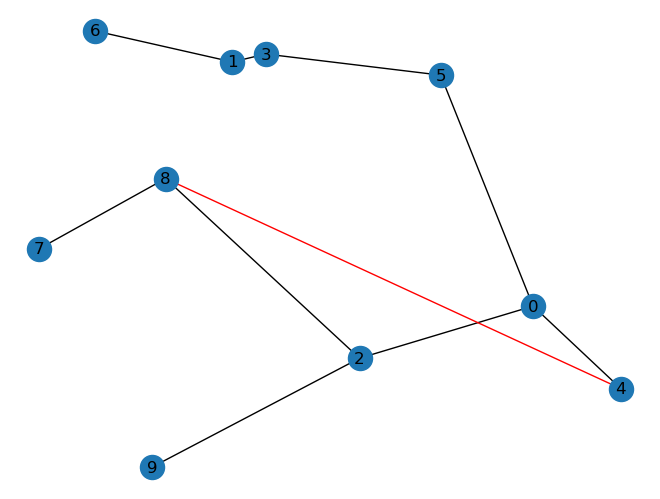

added edges [(8, 4)]
min cc 0.23076923076923078
budget -0.13651685169023298
-----------------------------------------------
(8, 4, 6)
edge (8, 4)
out of budget
edge (4, 6)
done False


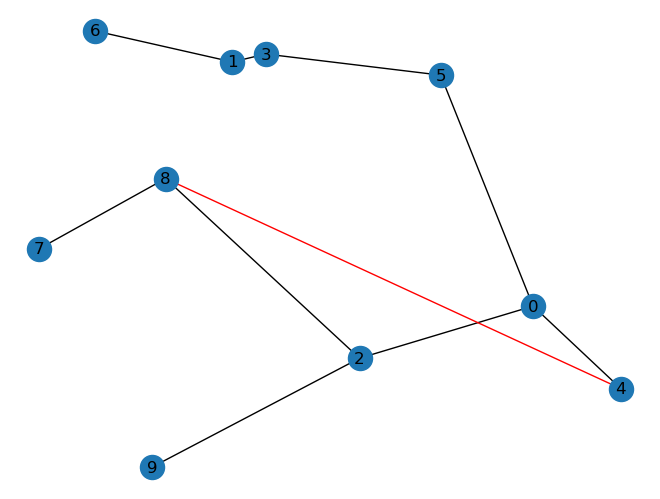

added edges [(8, 4)]
min cc 0.23076923076923078
budget -0.5443693495249109
-----------------------------------------------
(8, 4, 7)
edge (8, 4)
out of budget
edge (4, 7)
done False


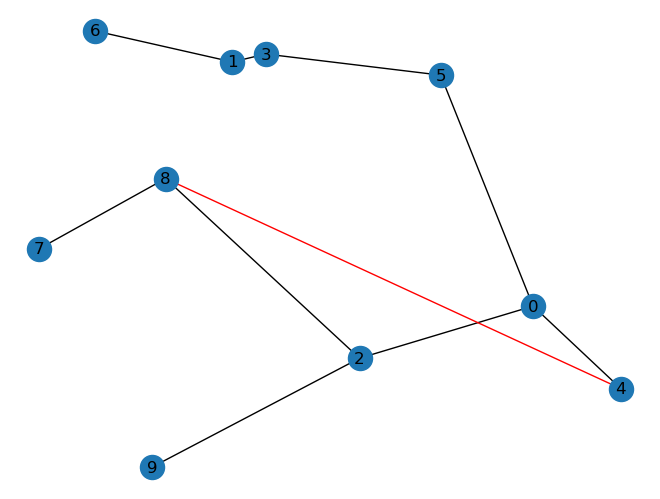

added edges [(8, 4)]
min cc 0.23076923076923078
budget -0.3656108537496089
-----------------------------------------------
(8, 4, 9)
edge (8, 4)
out of budget
edge (4, 9)
done False


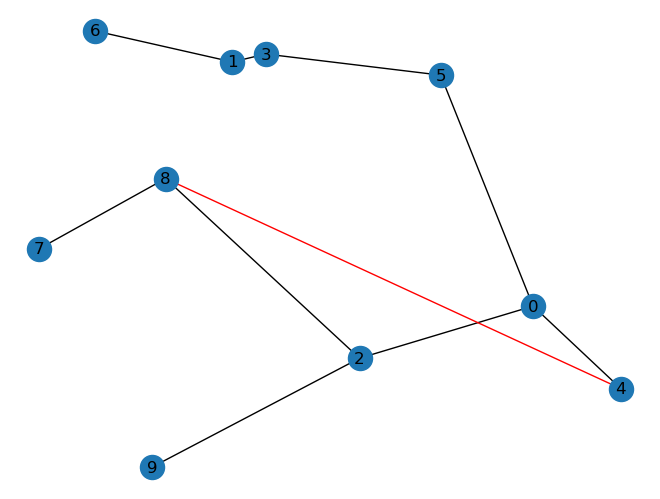

added edges [(8, 4)]
min cc 0.23076923076923078
budget -0.15235873994234794
-----------------------------------------------
(8, 5, 0)
edge (8, 5)
done True
-----------------------------------------------
(8, 5, 1)
edge (8, 5)
edge (5, 1)
done False


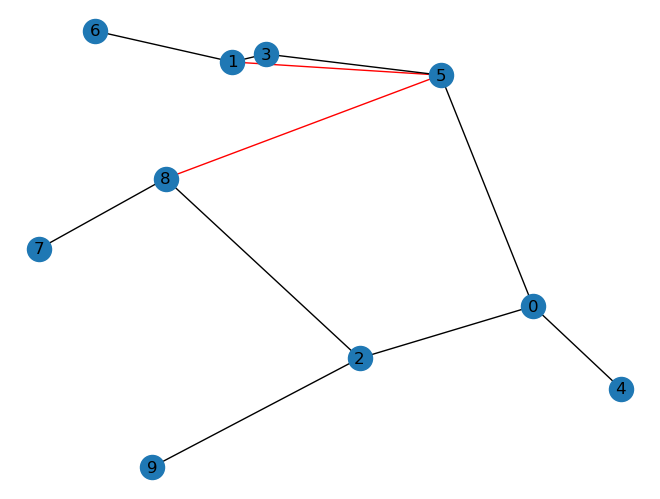

added edges [(8, 5), (5, 1)]
min cc 0.32142857142857145
budget 0.6605444271956313
-----------------------------------------------
(8, 5, 2)
edge (8, 5)
edge (5, 2)
done False


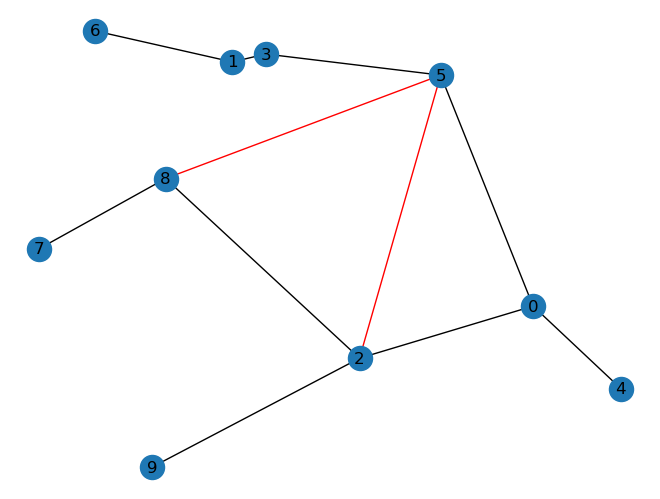

added edges [(8, 5), (5, 2)]
min cc 0.2727272727272727
budget 0.3490590587368453
-----------------------------------------------
(8, 5, 3)
edge (8, 5)
done True
-----------------------------------------------
(8, 5, 4)
edge (8, 5)
edge (5, 4)
done False


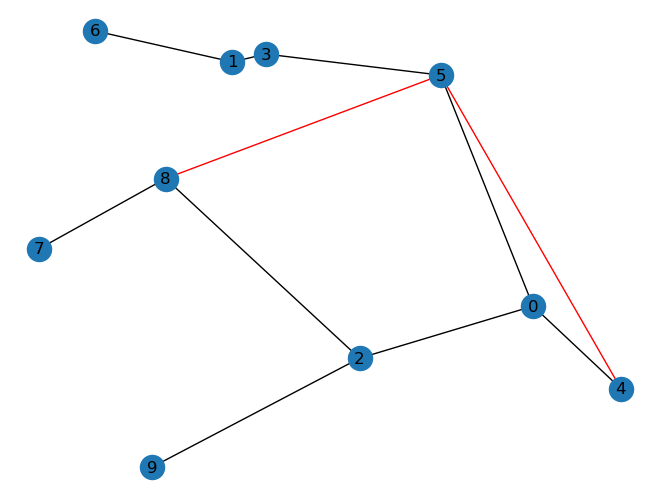

added edges [(8, 5), (5, 4)]
min cc 0.2647058823529412
budget 0.23617354794423617
-----------------------------------------------
(8, 5, 6)
edge (8, 5)
edge (5, 6)
done False


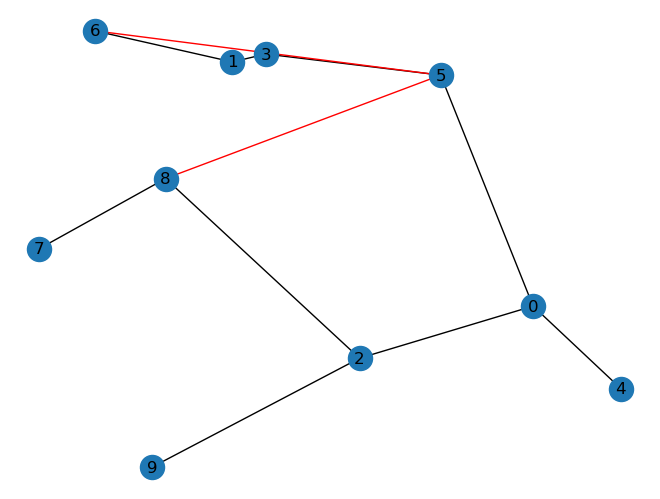

added edges [(8, 5), (5, 6)]
min cc 0.3333333333333333
budget 0.4307401026874259
-----------------------------------------------
(8, 5, 7)
edge (8, 5)
edge (5, 7)
done False


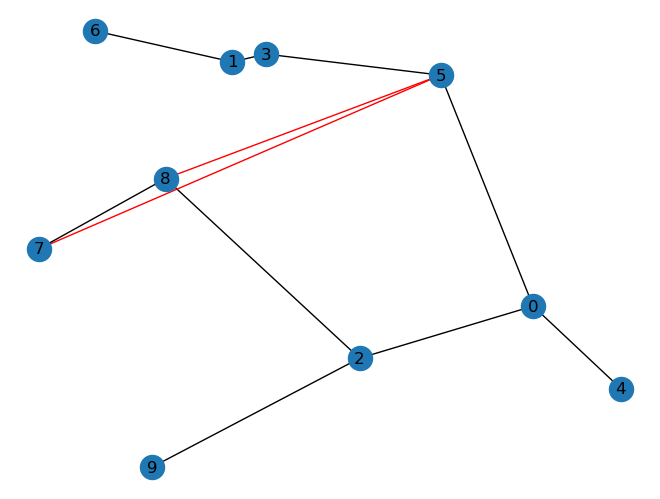

added edges [(8, 5), (5, 7)]
min cc 0.2647058823529412
budget 0.24128269786333445
-----------------------------------------------
(8, 5, 9)
edge (8, 5)
edge (5, 9)
done False


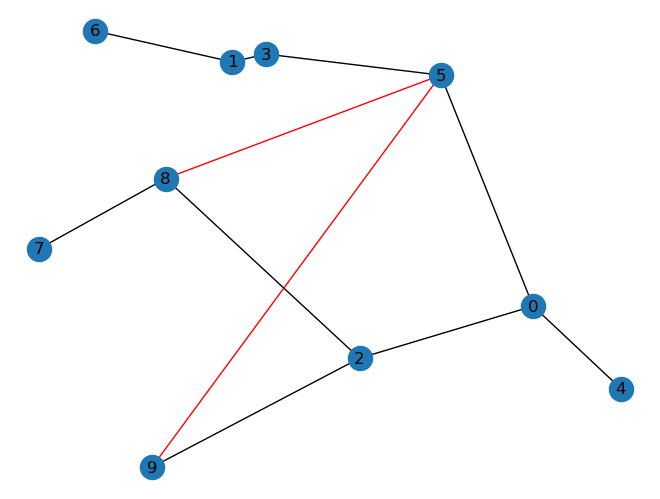

added edges [(8, 5), (5, 9)]
min cc 0.2727272727272727
budget 0.001704370432045521
-----------------------------------------------
(8, 6, 0)
edge (8, 6)
edge (6, 0)
done False


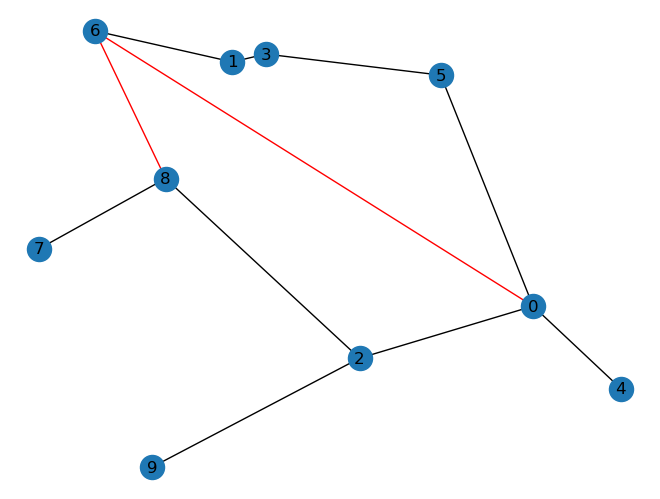

added edges [(8, 6), (6, 0)]
min cc 0.34615384615384615
budget 0.2087959803297852
-----------------------------------------------
(8, 6, 1)
edge (8, 6)
done True
-----------------------------------------------
(8, 6, 2)
edge (8, 6)
edge (6, 2)
done False


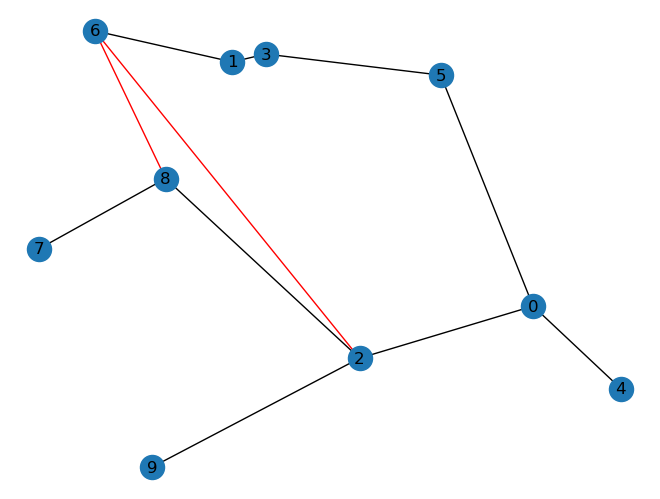

added edges [(8, 6), (6, 2)]
min cc 0.34615384615384615
budget 0.2981004338053449
-----------------------------------------------
(8, 6, 3)
edge (8, 6)
edge (6, 3)
done False


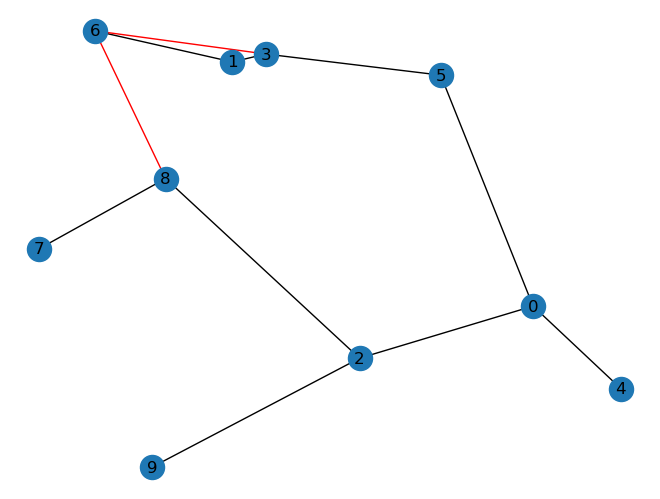

added edges [(8, 6), (6, 3)]
min cc 0.34615384615384615
budget 0.8679110984244784
-----------------------------------------------
(8, 6, 4)
edge (8, 6)
out of budget
edge (6, 4)
done False


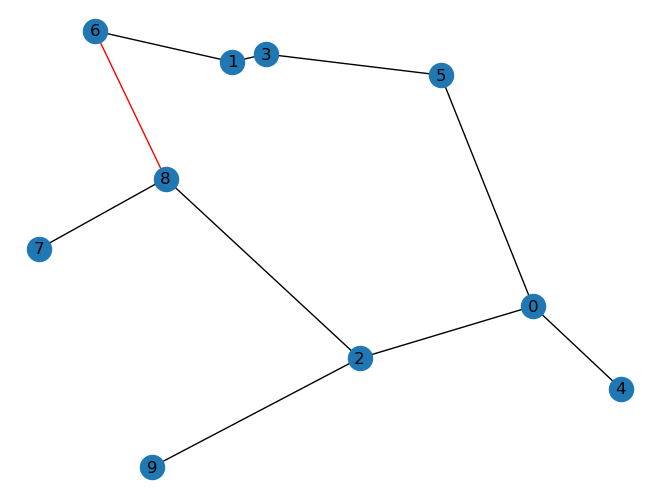

added edges [(8, 6)]
min cc 0.34615384615384615
budget -0.021103575421905774
-----------------------------------------------
(8, 6, 5)
edge (8, 6)
edge (6, 5)
done False


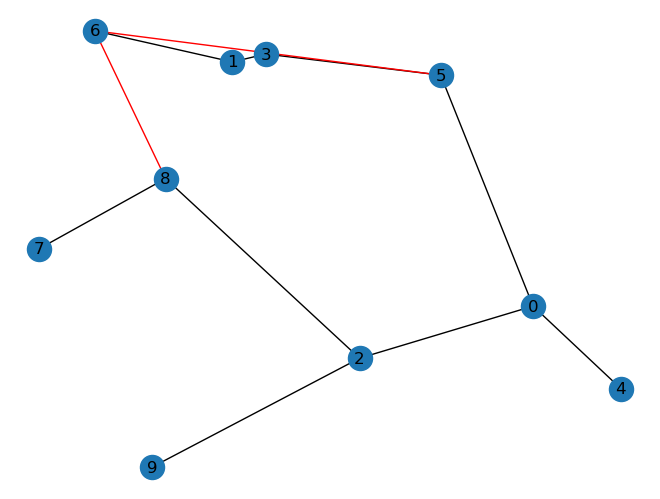

added edges [(8, 6), (6, 5)]
min cc 0.36
budget 0.5813154771559619
-----------------------------------------------
(8, 6, 7)
edge (8, 6)
edge (6, 7)
done False


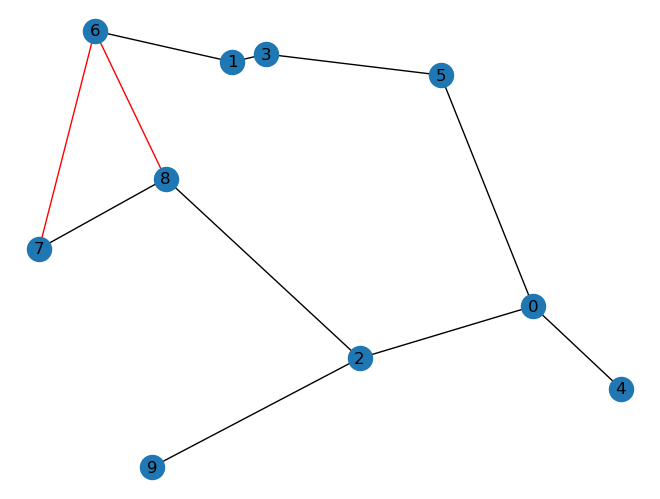

added edges [(8, 6), (6, 7)]
min cc 0.34615384615384615
budget 0.6511469199804747
-----------------------------------------------
(8, 6, 9)
edge (8, 6)
edge (6, 9)
done False


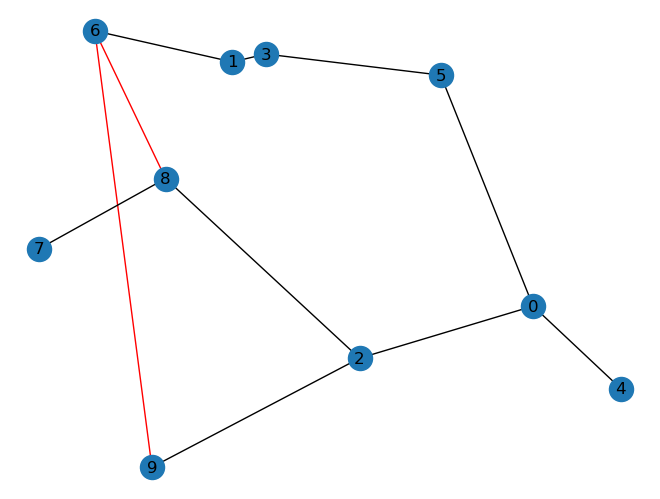

added edges [(8, 6), (6, 9)]
min cc 0.34615384615384615
budget 0.16432542498365144
-----------------------------------------------
(8, 7, 0)
done True
-----------------------------------------------
(8, 7, 1)
done True
-----------------------------------------------
(8, 7, 2)
done True
-----------------------------------------------
(8, 7, 3)
done True
-----------------------------------------------
(8, 7, 4)
done True
-----------------------------------------------
(8, 7, 5)
done True
-----------------------------------------------
(8, 7, 6)
done True
-----------------------------------------------
(8, 7, 9)
done True
-----------------------------------------------
(8, 9, 0)
edge (8, 9)
edge (9, 0)
done False


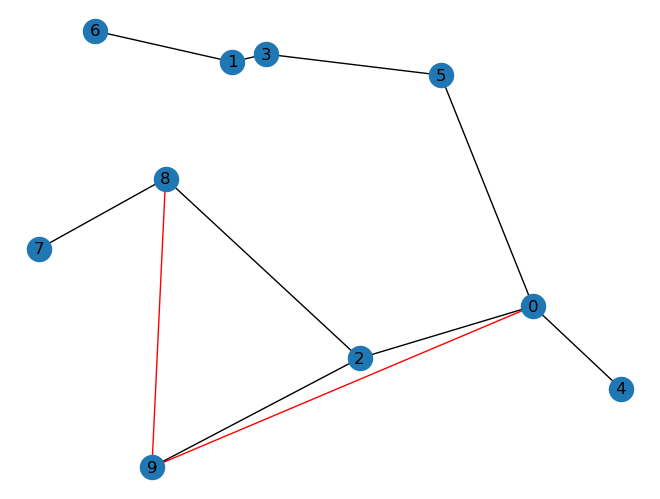

added edges [(8, 9), (9, 0)]
min cc 0.23684210526315788
budget 0.1367610458029236
-----------------------------------------------
(8, 9, 1)
edge (8, 9)
out of budget
edge (9, 1)
done False


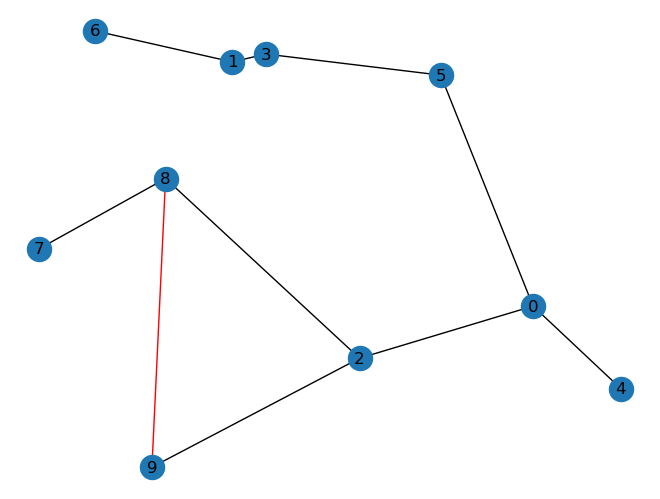

added edges [(8, 9)]
min cc 0.23076923076923078
budget -0.06850243437877512
-----------------------------------------------
(8, 9, 2)
edge (8, 9)
done True
-----------------------------------------------
(8, 9, 3)
edge (8, 9)
out of budget
edge (9, 3)
done False


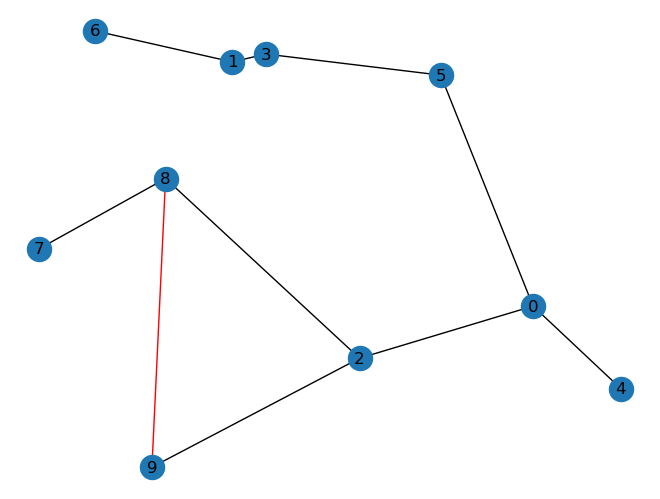

added edges [(8, 9)]
min cc 0.23076923076923078
budget -0.09514213713951902
-----------------------------------------------
(8, 9, 4)
edge (8, 9)
edge (9, 4)
done False


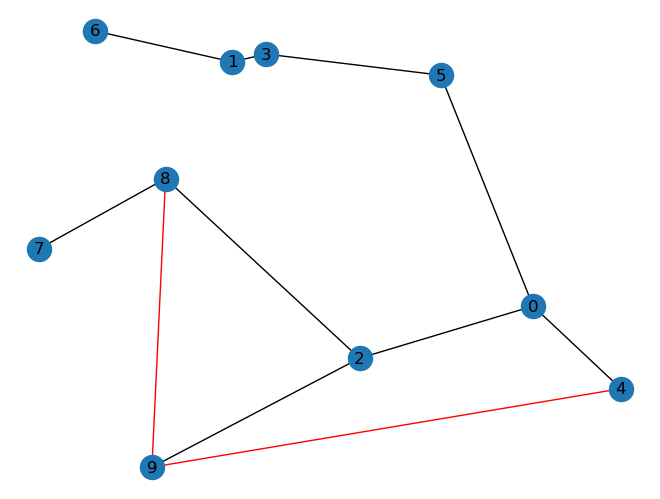

added edges [(8, 9), (9, 4)]
min cc 0.23076923076923078
budget 0.07302961207305603
-----------------------------------------------
(8, 9, 5)
edge (8, 9)
out of budget
edge (9, 5)
done False


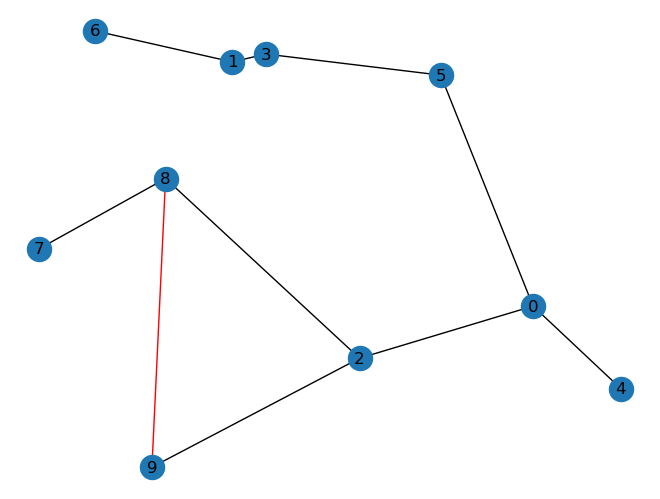

added edges [(8, 9)]
min cc 0.23076923076923078
budget -0.14559767718701966
-----------------------------------------------
(8, 9, 6)
edge (8, 9)
out of budget
edge (9, 6)
done False


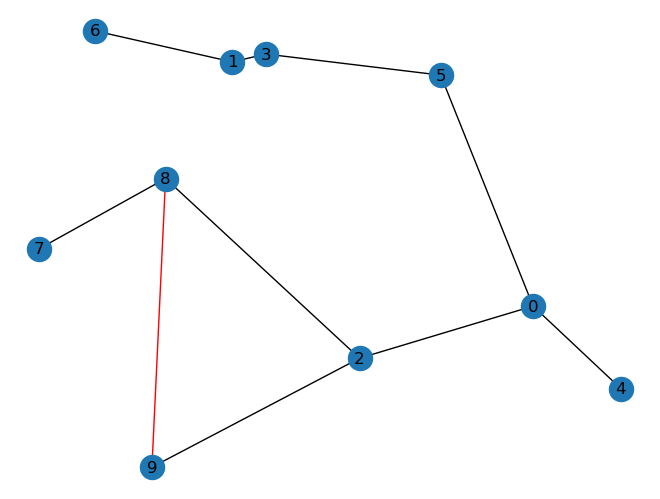

added edges [(8, 9)]
min cc 0.23076923076923078
budget -0.13355199710394972
-----------------------------------------------
(8, 9, 7)
edge (8, 9)
edge (9, 7)
done False


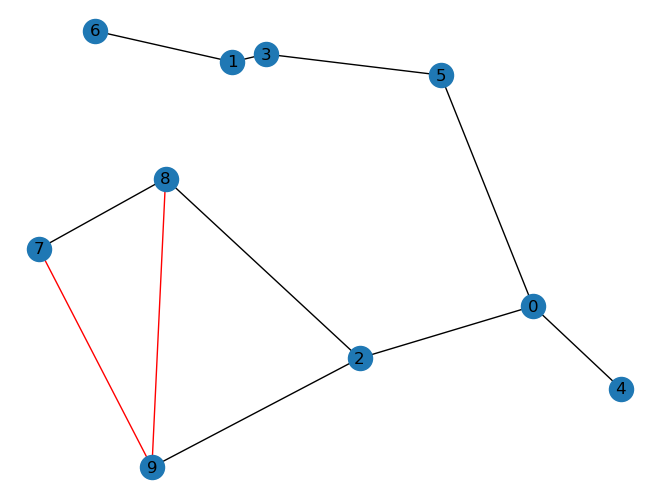

added edges [(8, 9), (9, 7)]
min cc 0.23076923076923078
budget 0.32764696932971404
-----------------------------------------------
(9, 0, 1)
edge (9, 0)
edge (0, 1)
done False


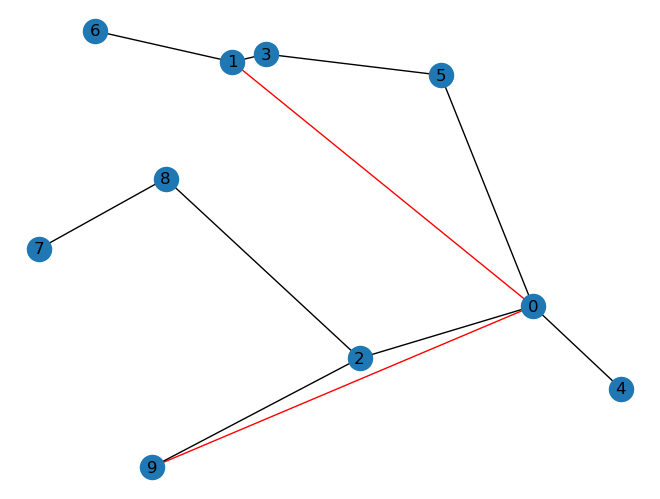

added edges [(9, 0), (0, 1)]
min cc 0.2903225806451613
budget 0.05288639027692199
-----------------------------------------------
(9, 0, 2)
edge (9, 0)
done True
-----------------------------------------------
(9, 0, 3)
edge (9, 0)
edge (0, 3)
done False


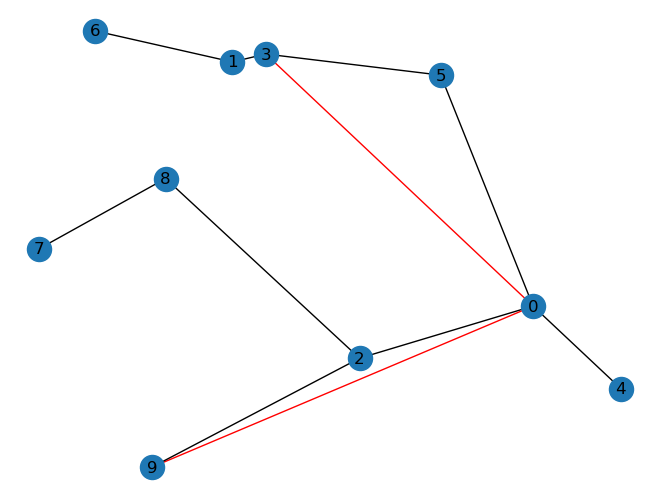

added edges [(9, 0), (0, 3)]
min cc 0.28125
budget 0.07337916214813578
-----------------------------------------------
(9, 0, 4)
edge (9, 0)
done True
-----------------------------------------------
(9, 0, 5)
edge (9, 0)
done True
-----------------------------------------------
(9, 0, 6)
edge (9, 0)
out of budget
edge (0, 6)
done False


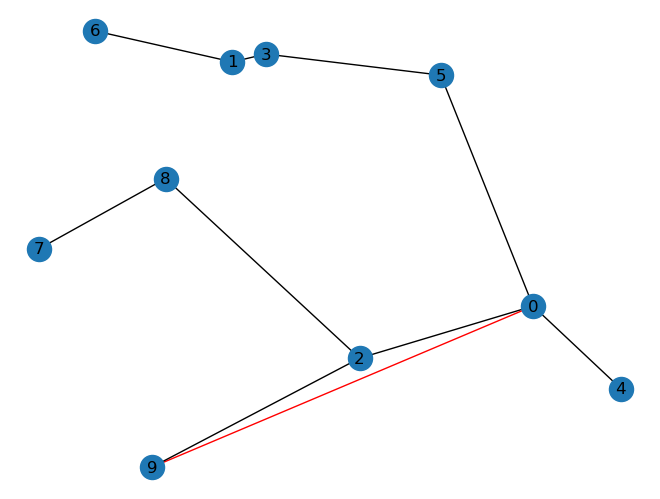

added edges [(9, 0)]
min cc 0.23684210526315788
budget -0.15457678515715745
-----------------------------------------------
(9, 0, 7)
edge (9, 0)
out of budget
edge (0, 7)
done False


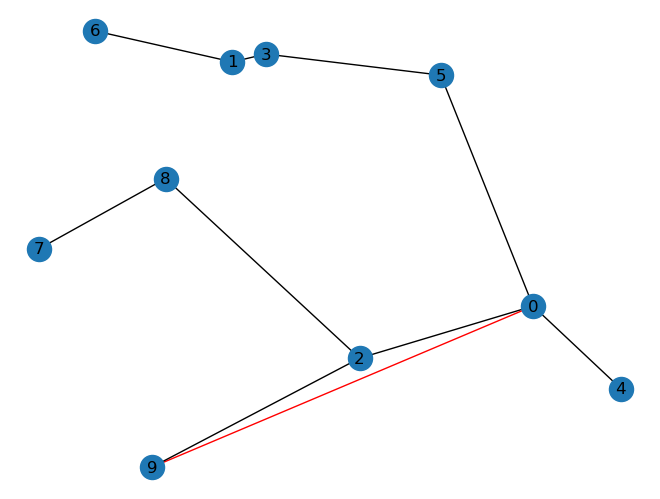

added edges [(9, 0)]
min cc 0.23684210526315788
budget -0.02293190519302879
-----------------------------------------------
(9, 0, 8)
edge (9, 0)
edge (0, 8)
done False


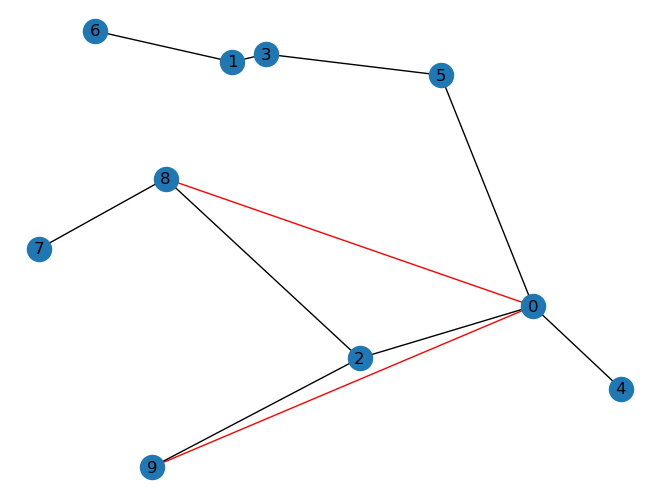

added edges [(9, 0), (0, 8)]
min cc 0.25
budget 0.126245501442805
-----------------------------------------------
(9, 1, 0)
edge (9, 1)
out of budget
edge (1, 0)
done False


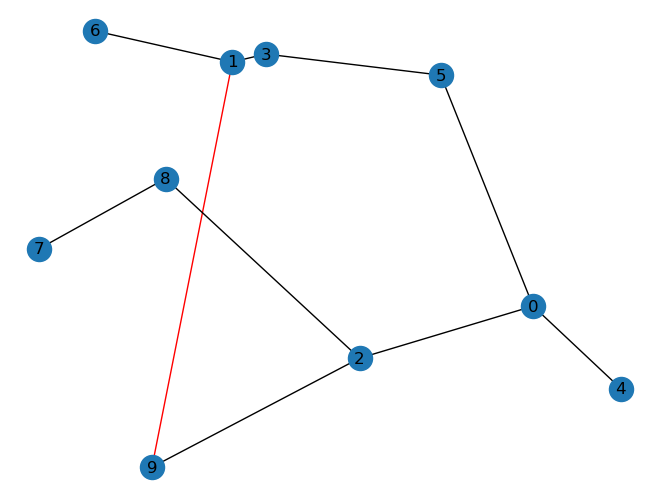

added edges [(9, 1)]
min cc 0.2903225806451613
budget -0.15237708990477672
-----------------------------------------------
(9, 1, 2)
edge (9, 1)
out of budget
edge (1, 2)
done False


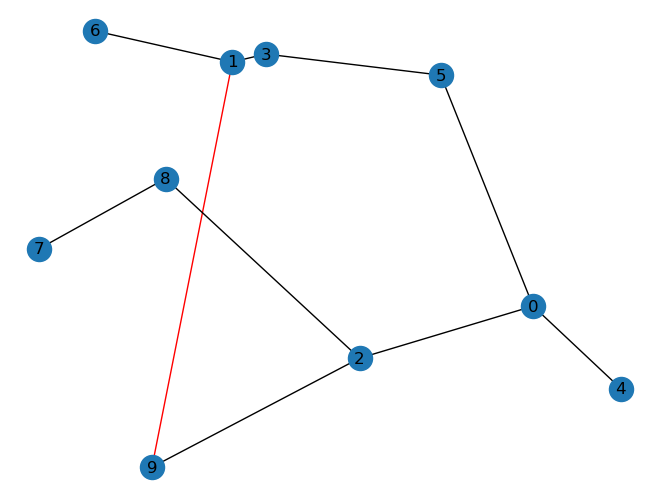

added edges [(9, 1)]
min cc 0.2903225806451613
budget -0.11623679934011932
-----------------------------------------------
(9, 1, 3)
edge (9, 1)
done True
-----------------------------------------------
(9, 1, 4)
edge (9, 1)
out of budget
edge (1, 4)
done False


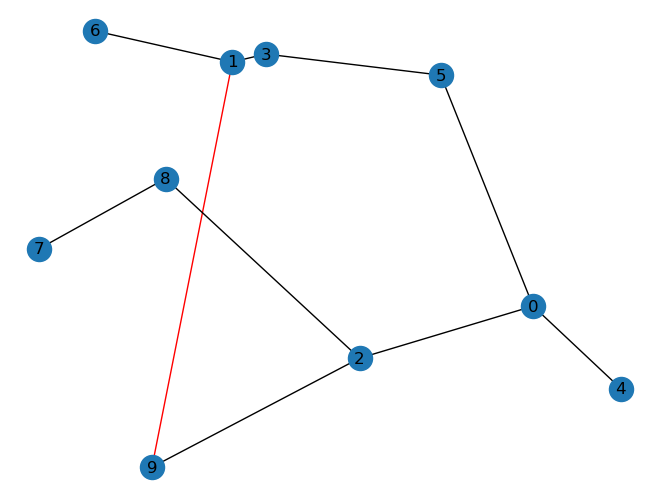

added edges [(9, 1)]
min cc 0.2903225806451613
budget -0.385552858206596
-----------------------------------------------
(9, 1, 5)
edge (9, 1)
edge (1, 5)
done False


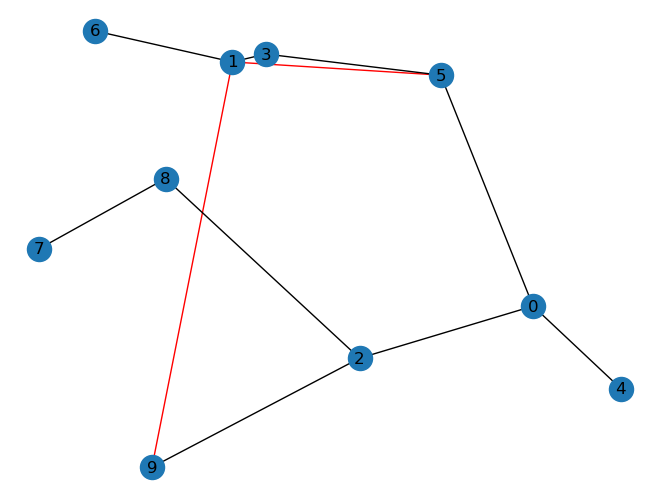

added edges [(9, 1), (1, 5)]
min cc 0.2903225806451613
budget 0.24248355599552596
-----------------------------------------------
(9, 1, 6)
edge (9, 1)
done True
-----------------------------------------------
(9, 1, 7)
edge (9, 1)
edge (1, 7)
done False


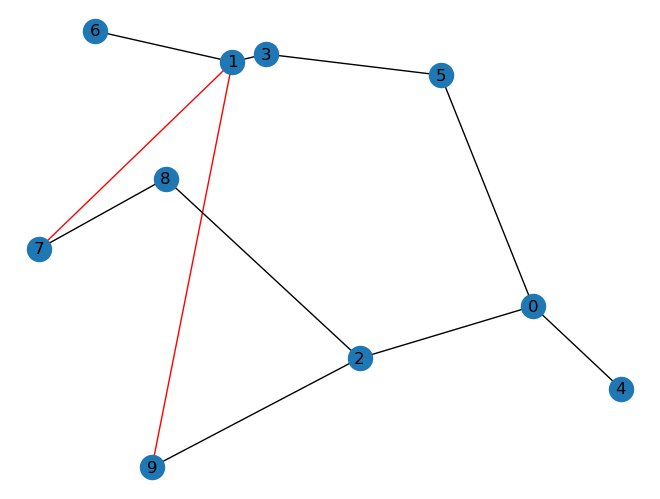

added edges [(9, 1), (1, 7)]
min cc 0.3333333333333333
budget 0.05719765149944145
-----------------------------------------------
(9, 1, 8)
edge (9, 1)
edge (1, 8)
done False


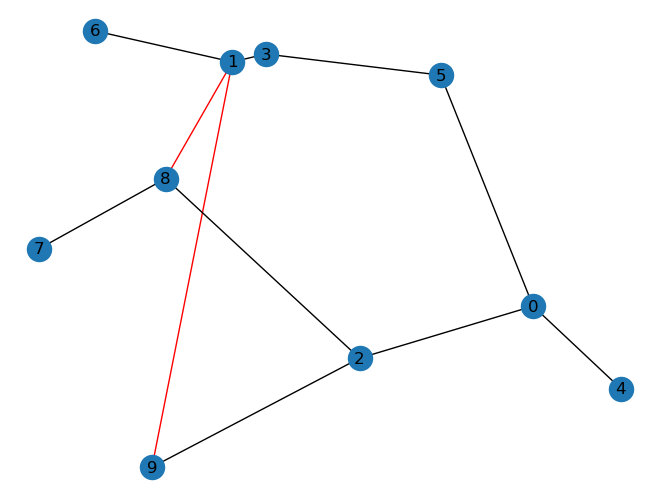

added edges [(9, 1), (1, 8)]
min cc 0.3333333333333333
budget 0.29709181234890997
-----------------------------------------------
(9, 2, 0)
done True
-----------------------------------------------
(9, 2, 1)
done True
-----------------------------------------------
(9, 2, 3)
done True
-----------------------------------------------
(9, 2, 4)
done True
-----------------------------------------------
(9, 2, 5)
done True
-----------------------------------------------
(9, 2, 6)
done True
-----------------------------------------------
(9, 2, 7)
done True
-----------------------------------------------
(9, 2, 8)
done True
-----------------------------------------------
(9, 3, 0)
edge (9, 3)
out of budget
edge (3, 0)
done False


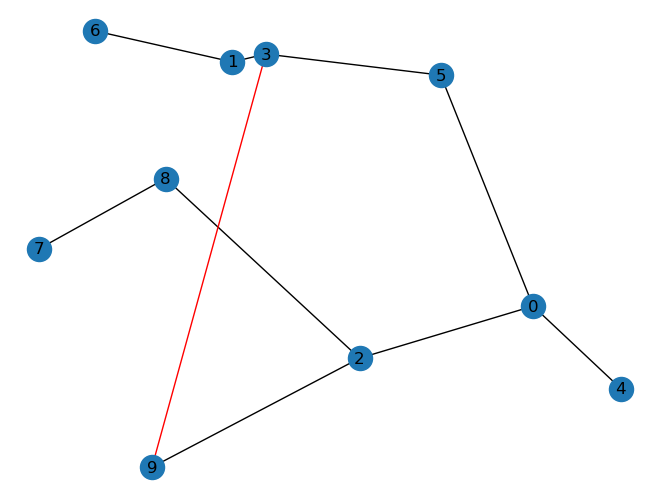

added edges [(9, 3)]
min cc 0.2727272727272727
budget -0.15852402079430683
-----------------------------------------------
(9, 3, 1)
edge (9, 3)
done True
-----------------------------------------------
(9, 3, 2)
edge (9, 3)
out of budget
edge (3, 2)
done False


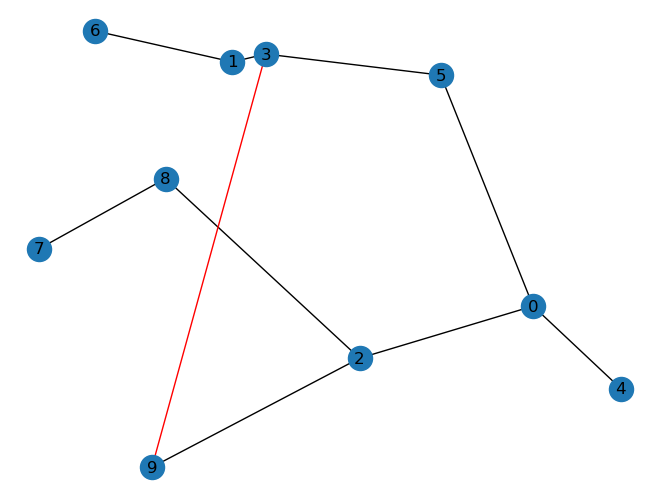

added edges [(9, 3)]
min cc 0.2727272727272727
budget -0.14631712980017675
-----------------------------------------------
(9, 3, 4)
edge (9, 3)
out of budget
edge (3, 4)
done False


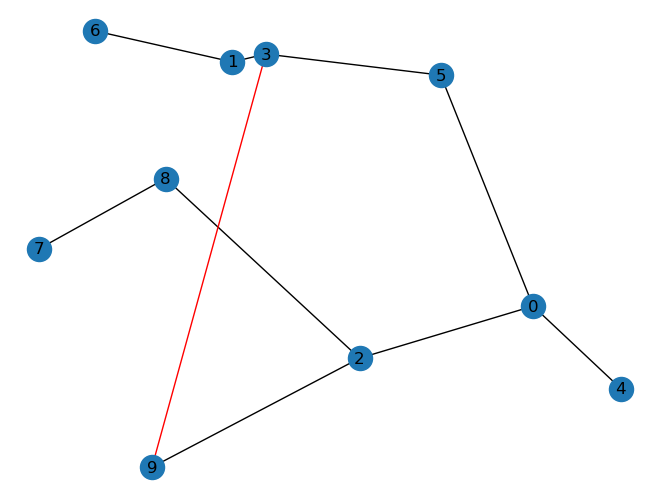

added edges [(9, 3)]
min cc 0.2727272727272727
budget -0.3921583885350278
-----------------------------------------------
(9, 3, 5)
edge (9, 3)
done True
-----------------------------------------------
(9, 3, 6)
edge (9, 3)
edge (3, 6)
done False


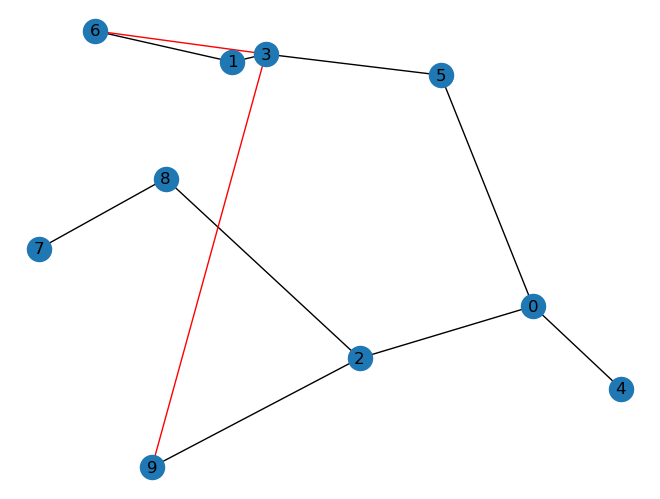

added edges [(9, 3), (3, 6)]
min cc 0.2903225806451613
budget 0.2726351499950932
-----------------------------------------------
(9, 3, 7)
edge (9, 3)
out of budget
edge (3, 7)
done False


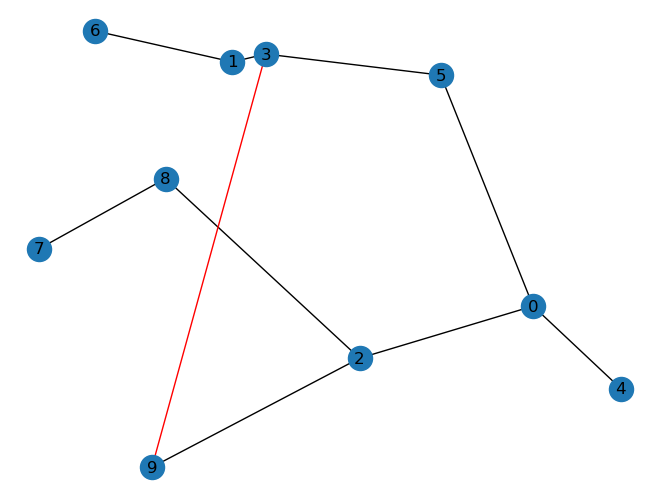

added edges [(9, 3)]
min cc 0.2727272727272727
budget -0.016866890703215787
-----------------------------------------------
(9, 3, 8)
edge (9, 3)
edge (3, 8)
done False


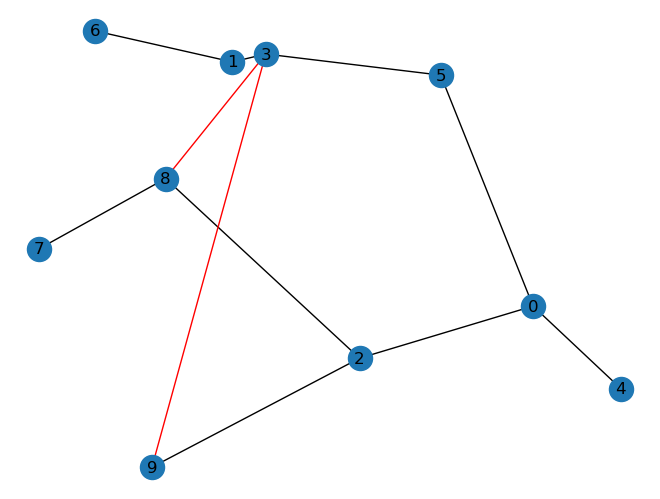

added edges [(9, 3), (3, 8)]
min cc 0.3103448275862069
budget 0.23053994837051955
-----------------------------------------------
(9, 4, 0)
edge (9, 4)
done True
-----------------------------------------------
(9, 4, 1)
edge (9, 4)
out of budget
edge (4, 1)
done False


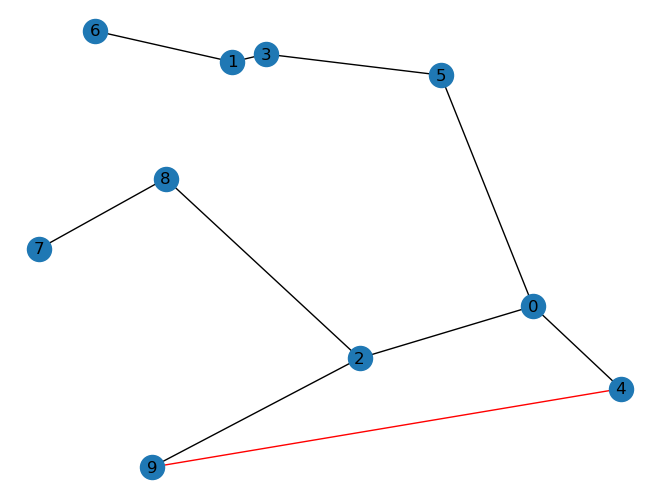

added edges [(9, 4)]
min cc 0.23076923076923078
budget -0.24402081175476487
-----------------------------------------------
(9, 4, 2)
edge (9, 4)
edge (4, 2)
done False


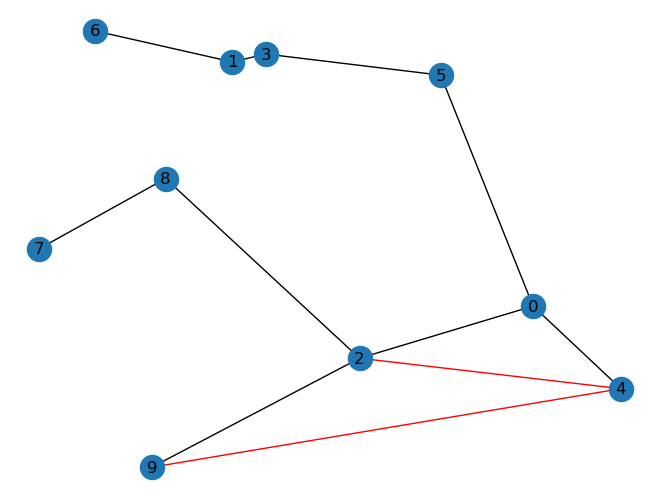

added edges [(9, 4), (4, 2)]
min cc 0.23076923076923078
budget 0.29400638462242545
-----------------------------------------------
(9, 4, 3)
edge (9, 4)
out of budget
edge (4, 3)
done False


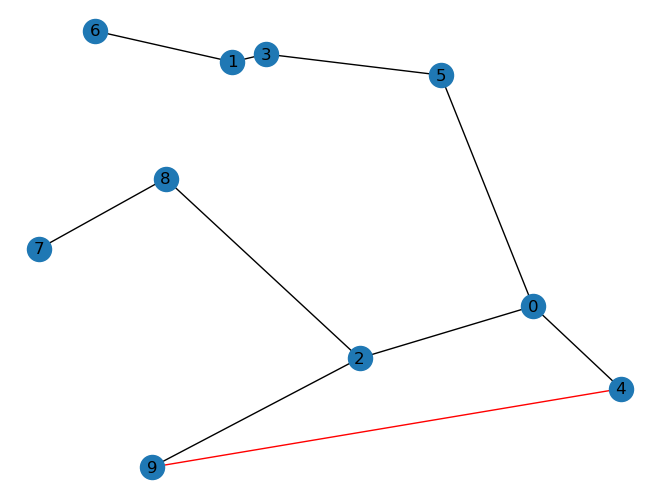

added edges [(9, 4)]
min cc 0.23076923076923078
budget -0.22398663932245277
-----------------------------------------------
(9, 4, 5)
edge (9, 4)
out of budget
edge (4, 5)
done False


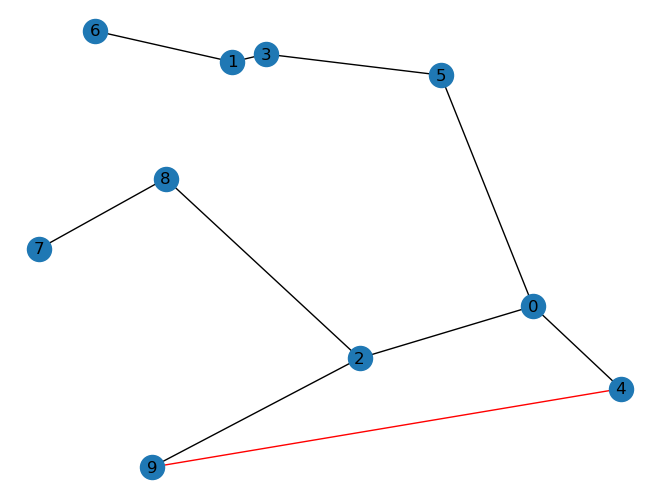

added edges [(9, 4)]
min cc 0.23076923076923078
budget -0.040355276804038054
-----------------------------------------------
(9, 4, 6)
edge (9, 4)
out of budget
edge (4, 6)
done False


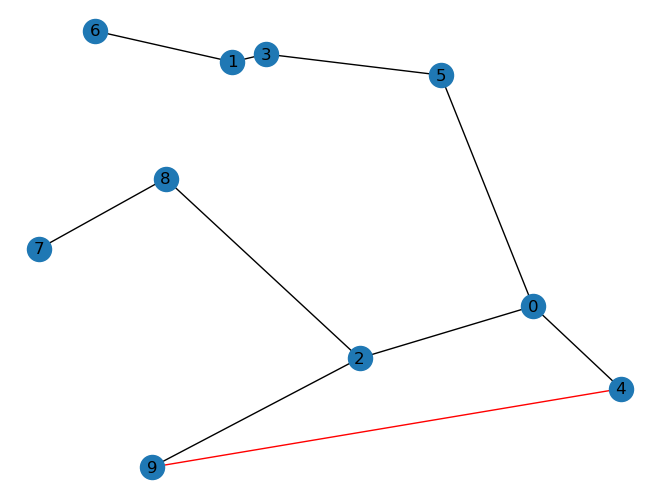

added edges [(9, 4)]
min cc 0.23076923076923078
budget -0.44820777463871597
-----------------------------------------------
(9, 4, 7)
edge (9, 4)
out of budget
edge (4, 7)
done False


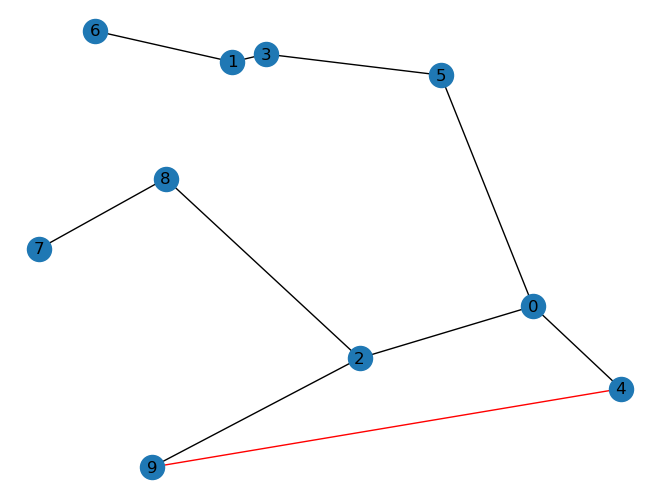

added edges [(9, 4)]
min cc 0.23076923076923078
budget -0.26944927886341397
-----------------------------------------------
(9, 4, 8)
edge (9, 4)
out of budget
edge (4, 8)
done False


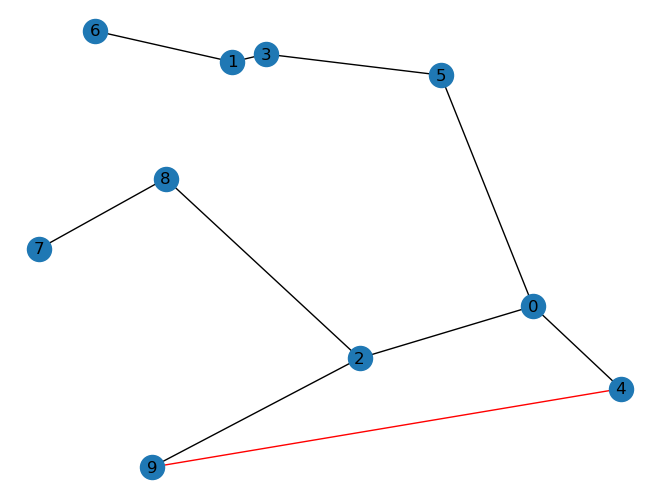

added edges [(9, 4)]
min cc 0.23076923076923078
budget -0.15235873994234794
-----------------------------------------------
(9, 5, 0)
edge (9, 5)
done True
-----------------------------------------------
(9, 5, 1)
edge (9, 5)
edge (5, 1)
done False


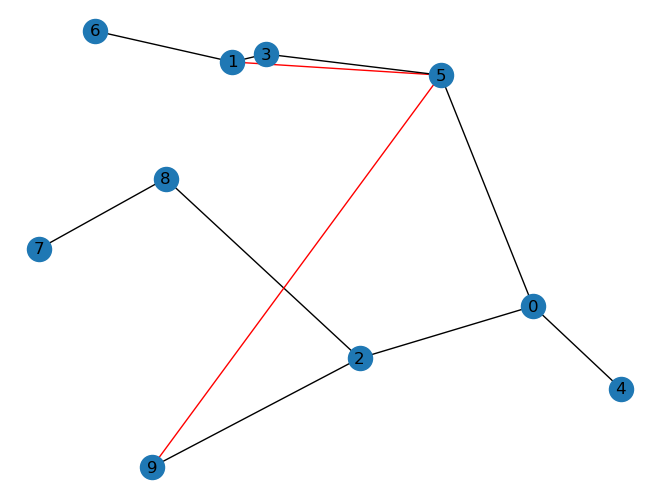

added edges [(9, 5), (5, 1)]
min cc 0.2727272727272727
budget 0.16538831318728142
-----------------------------------------------
(9, 5, 2)
edge (9, 5)
out of budget
edge (5, 2)
done False


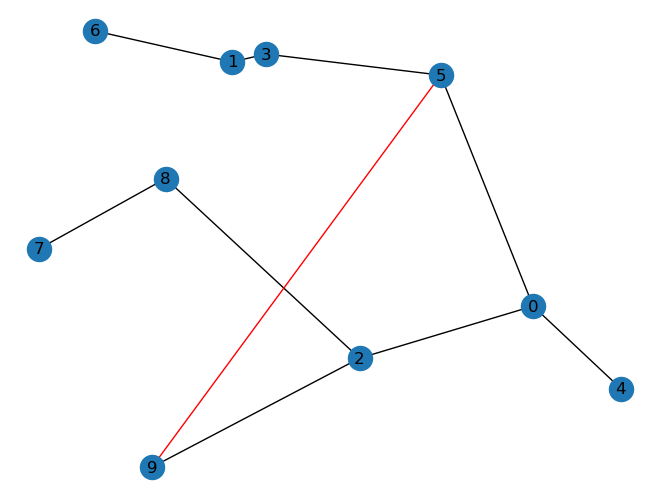

added edges [(9, 5)]
min cc 0.24324324324324326
budget -0.14609705527150463
-----------------------------------------------
(9, 5, 3)
edge (9, 5)
done True
-----------------------------------------------
(9, 5, 4)
edge (9, 5)
out of budget
edge (5, 4)
done False


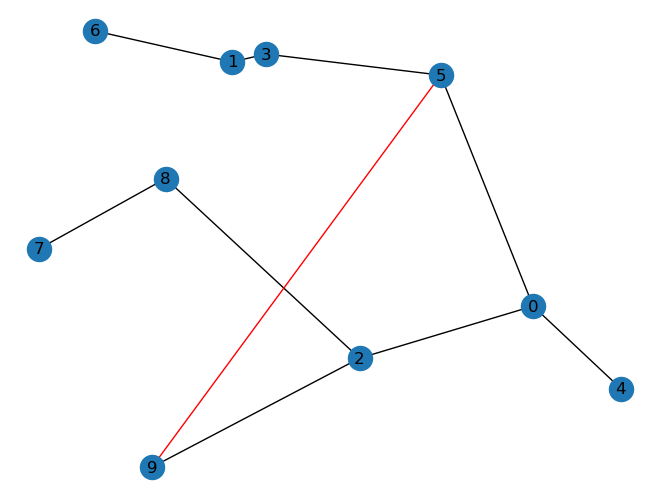

added edges [(9, 5)]
min cc 0.24324324324324326
budget -0.25898256606411374
-----------------------------------------------
(9, 5, 6)
edge (9, 5)
out of budget
edge (5, 6)
done False


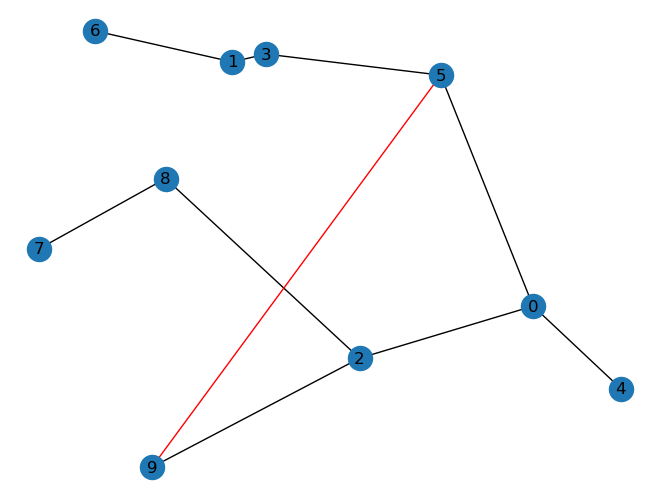

added edges [(9, 5)]
min cc 0.24324324324324326
budget -0.064416011320924
-----------------------------------------------
(9, 5, 7)
edge (9, 5)
out of budget
edge (5, 7)
done False


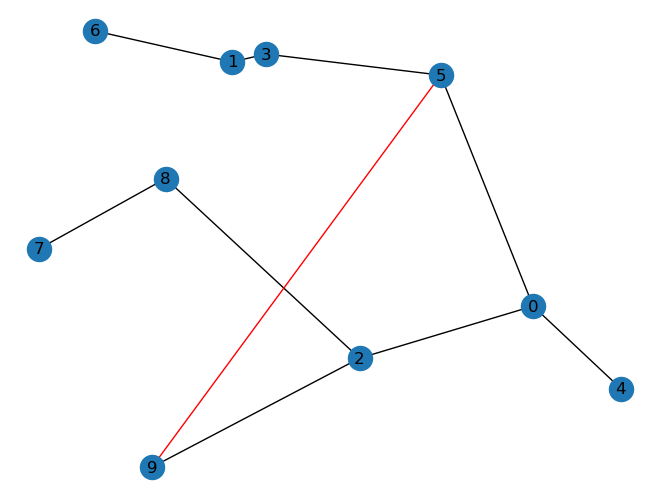

added edges [(9, 5)]
min cc 0.24324324324324326
budget -0.25387341614501546
-----------------------------------------------
(9, 5, 8)
edge (9, 5)
edge (5, 8)
done False


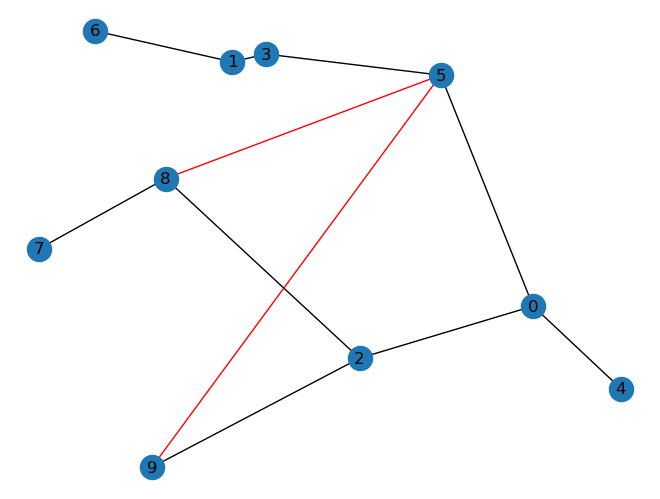

added edges [(9, 5), (5, 8)]
min cc 0.2727272727272727
budget 0.001704370432045521
-----------------------------------------------
(9, 6, 0)
edge (9, 6)
out of budget
edge (6, 0)
done False


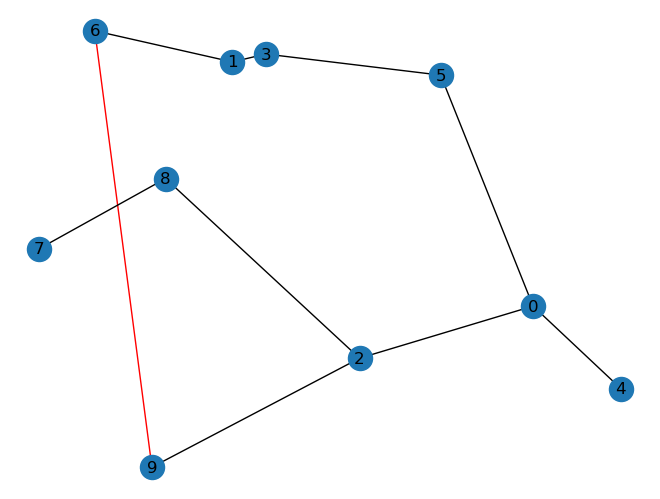

added edges [(9, 6)]
min cc 0.2903225806451613
budget -0.42488982806403075
-----------------------------------------------
(9, 6, 1)
edge (9, 6)
done True
-----------------------------------------------
(9, 6, 2)
edge (9, 6)
out of budget
edge (6, 2)
done False


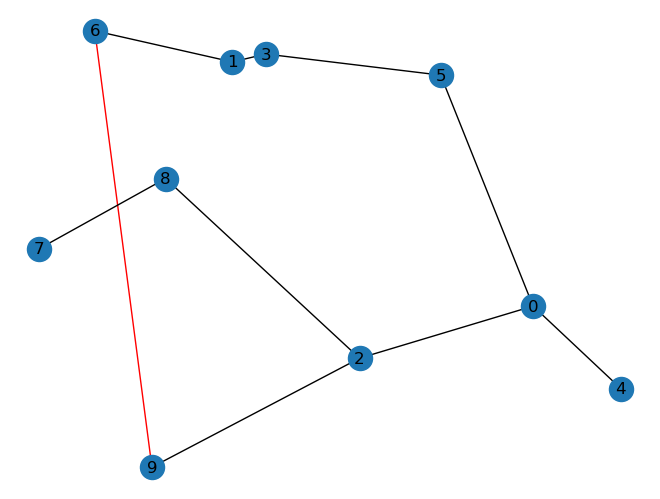

added edges [(9, 6)]
min cc 0.2903225806451613
budget -0.33558537458847104
-----------------------------------------------
(9, 6, 3)
edge (9, 6)
edge (6, 3)
done False


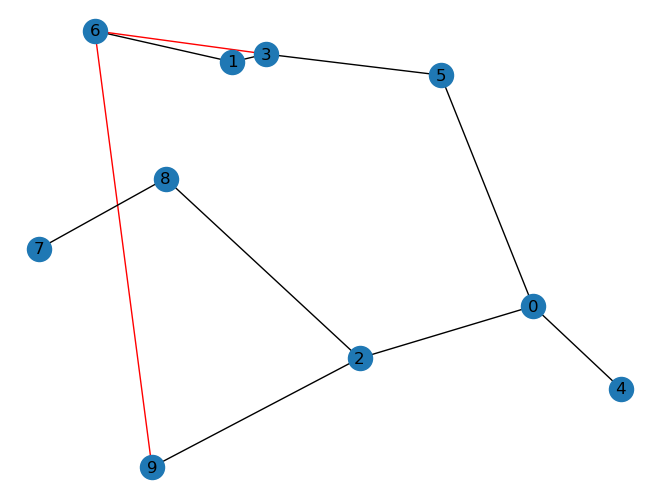

added edges [(9, 6), (6, 3)]
min cc 0.2903225806451613
budget 0.2342252900306625
-----------------------------------------------
(9, 6, 4)
edge (9, 6)
out of budget
edge (6, 4)
done False


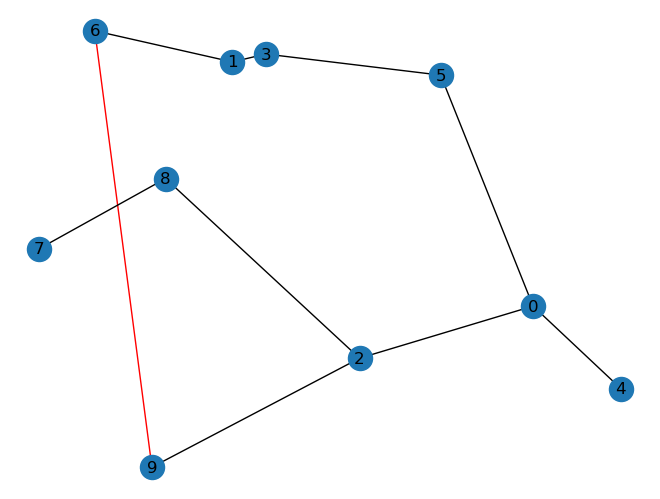

added edges [(9, 6)]
min cc 0.2903225806451613
budget -0.6547893838157217
-----------------------------------------------
(9, 6, 5)
edge (9, 6)
out of budget
edge (6, 5)
done False


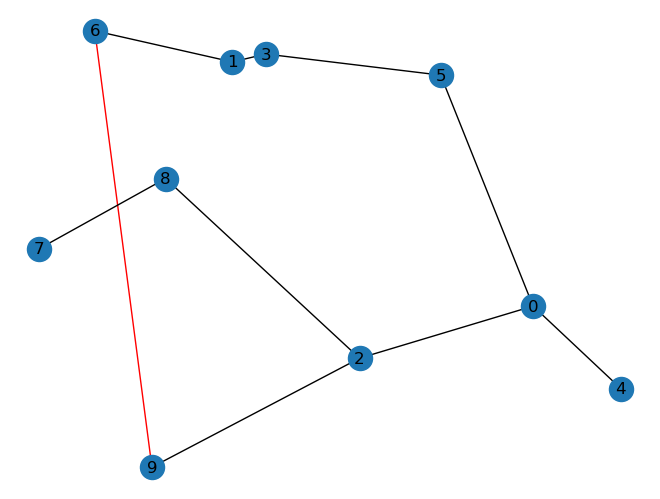

added edges [(9, 6)]
min cc 0.2903225806451613
budget -0.05237033123785406
-----------------------------------------------
(9, 6, 7)
edge (9, 6)
edge (6, 7)
done False


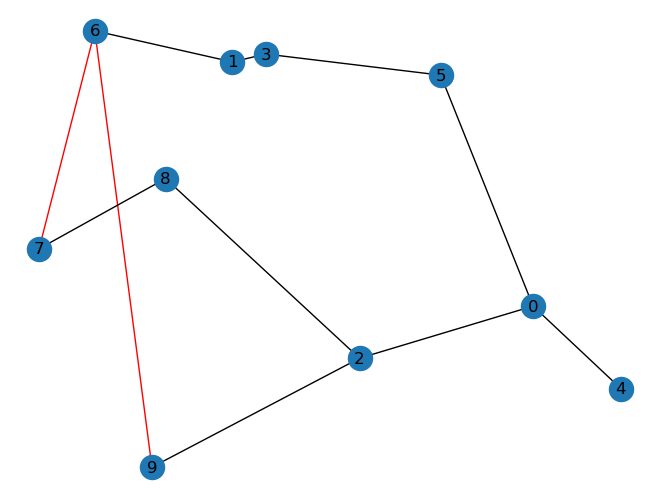

added edges [(9, 6), (6, 7)]
min cc 0.34615384615384615
budget 0.017461111586658806
-----------------------------------------------
(9, 6, 8)
edge (9, 6)
edge (6, 8)
done False


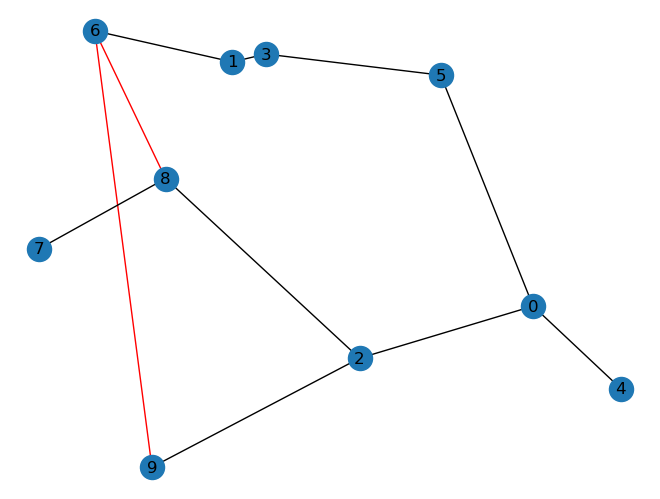

added edges [(9, 6), (6, 8)]
min cc 0.34615384615384615
budget 0.16432542498365138
-----------------------------------------------
(9, 7, 0)
edge (9, 7)
edge (7, 0)
done False


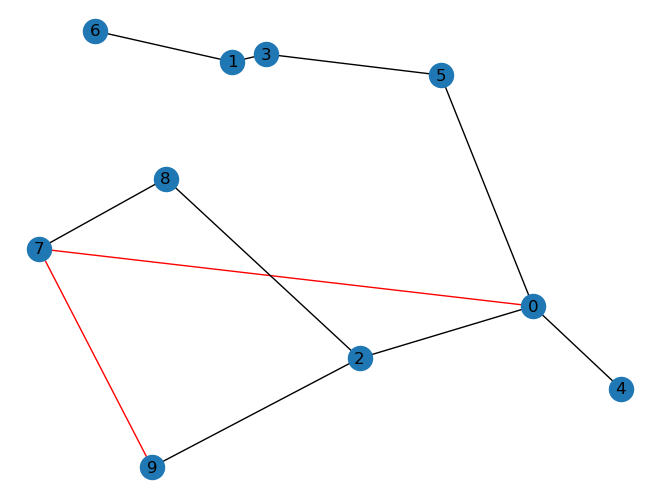

added edges [(9, 7), (7, 0)]
min cc 0.24324324324324326
budget 0.16795401833376167
-----------------------------------------------
(9, 7, 1)
edge (9, 7)
edge (7, 1)
done False


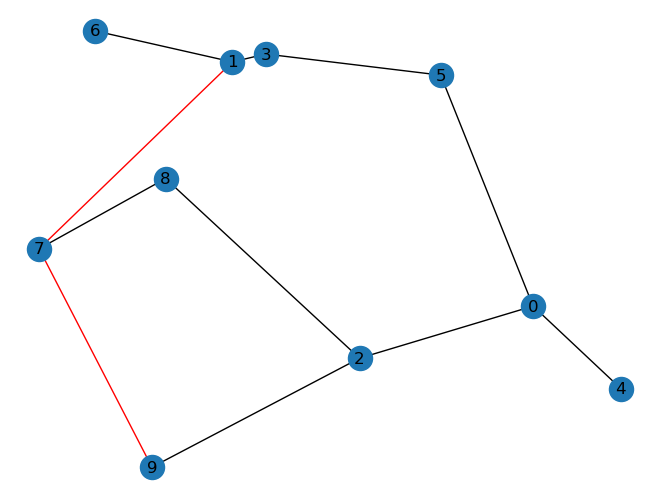

added edges [(9, 7), (7, 1)]
min cc 0.3333333333333333
budget 0.4533470552079306
-----------------------------------------------
(9, 7, 2)
edge (9, 7)
edge (7, 2)
done False


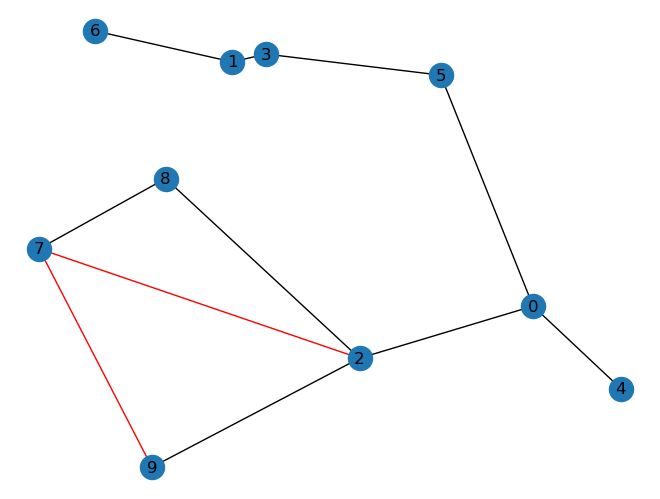

added edges [(9, 7), (7, 2)]
min cc 0.23684210526315788
budget 0.40328346714203656
-----------------------------------------------
(9, 7, 3)
edge (9, 7)
edge (7, 3)
done False


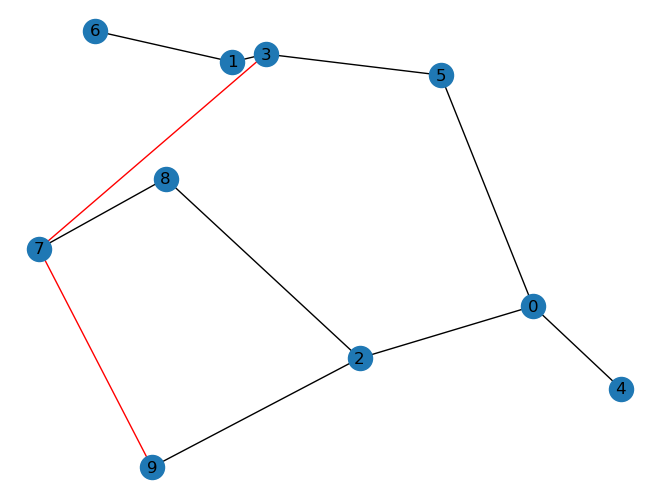

added edges [(9, 7), (7, 3)]
min cc 0.2903225806451613
budget 0.4059222157660173
-----------------------------------------------
(9, 7, 4)
edge (9, 7)
out of budget
edge (7, 4)
done False


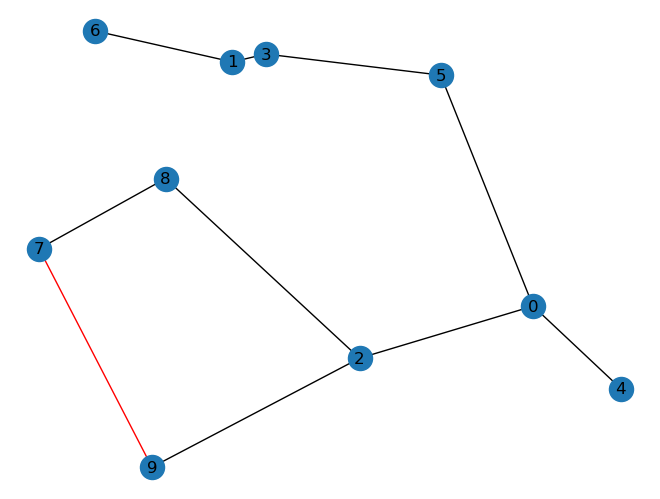

added edges [(9, 7)]
min cc 0.23076923076923078
budget -0.014831921606755949
-----------------------------------------------
(9, 7, 5)
edge (9, 7)
edge (7, 5)
done False


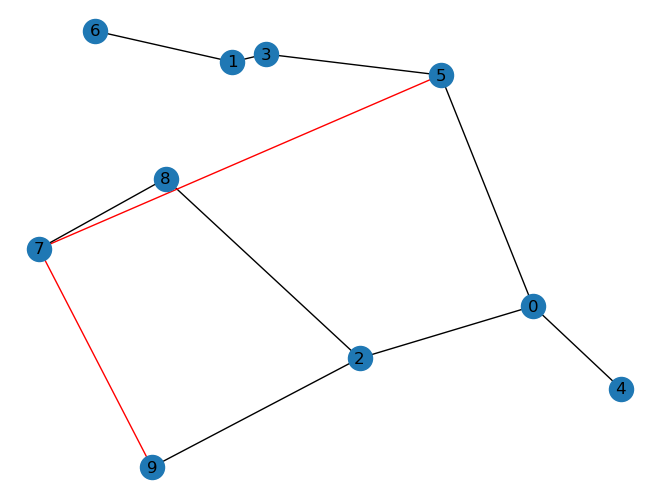

added edges [(9, 7), (7, 5)]
min cc 0.2647058823529412
budget 0.21937123037171824
-----------------------------------------------
(9, 7, 6)
edge (9, 7)
edge (7, 6)
done False


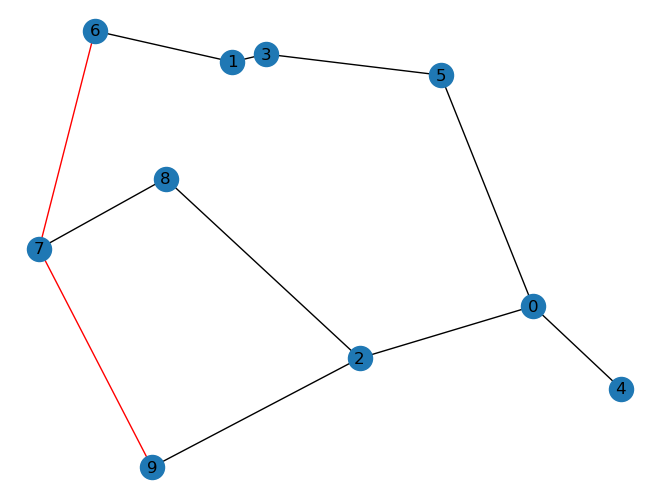

added edges [(9, 7), (7, 6)]
min cc 0.3333333333333333
budget 0.47866007802032257
-----------------------------------------------
(9, 7, 8)
edge (9, 7)
done True
-----------------------------------------------
(9, 8, 0)
edge (9, 8)
edge (8, 0)
done False


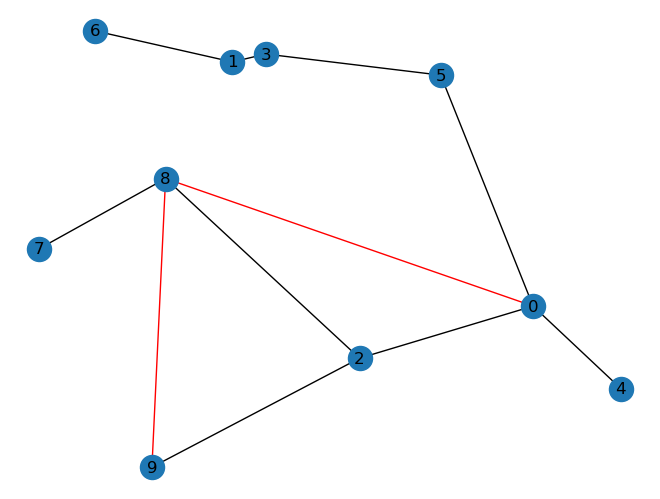

added edges [(9, 8), (8, 0)]
min cc 0.24324324324324326
budget 0.19174084484214649
-----------------------------------------------
(9, 8, 1)
edge (9, 8)
edge (8, 1)
done False


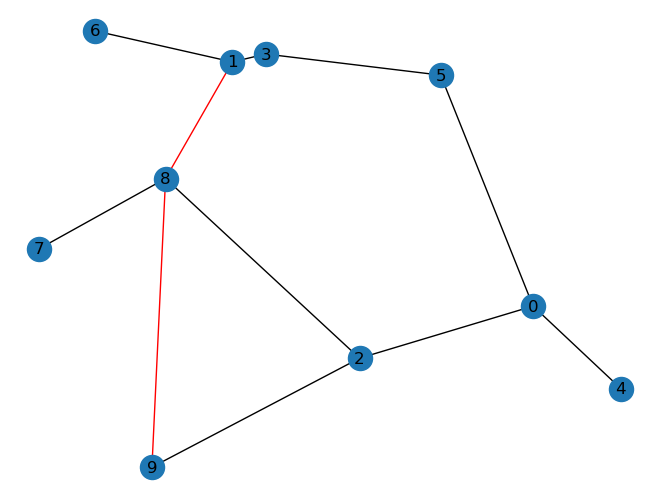

added edges [(9, 8), (8, 1)]
min cc 0.3333333333333333
budget 0.5678506359299502
-----------------------------------------------
(9, 8, 2)
edge (9, 8)
done True
-----------------------------------------------
(9, 8, 3)
edge (9, 8)
edge (8, 3)
done False


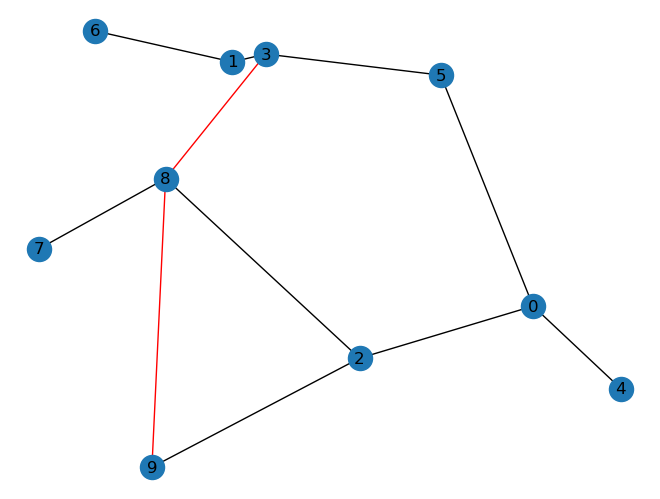

added edges [(9, 8), (8, 3)]
min cc 0.3
budget 0.5279384747123037
-----------------------------------------------
(9, 8, 4)
edge (9, 8)
out of budget
edge (8, 4)
done False


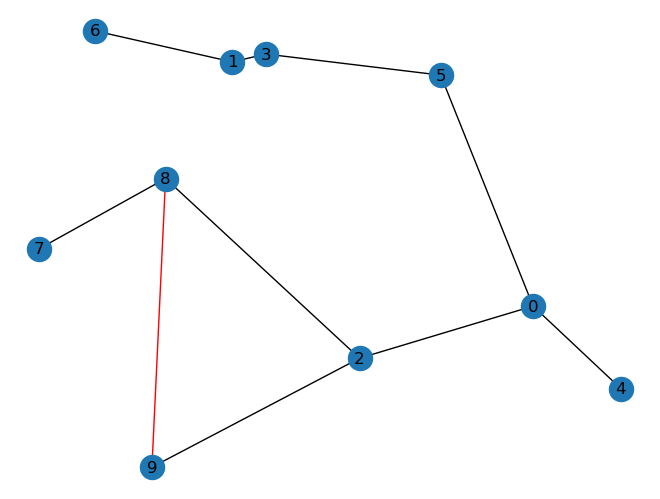

added edges [(9, 8)]
min cc 0.23076923076923078
budget -0.023131962813138895
-----------------------------------------------
(9, 8, 5)
edge (9, 8)
edge (8, 5)
done False


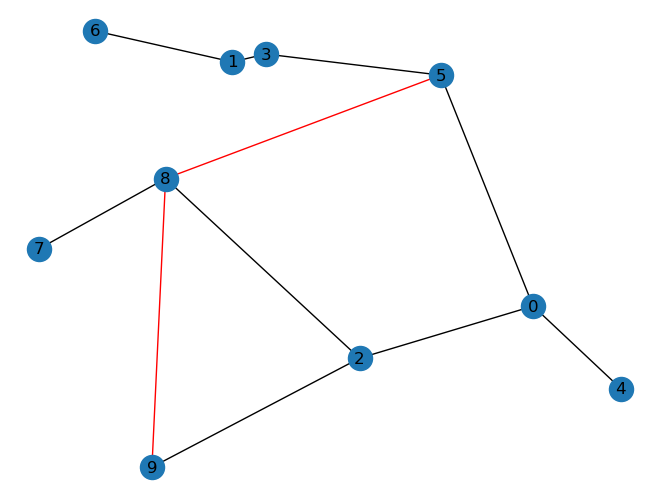

added edges [(9, 8), (8, 5)]
min cc 0.2647058823529412
budget 0.34955843682133025
-----------------------------------------------
(9, 8, 6)
edge (9, 8)
edge (8, 6)
done False


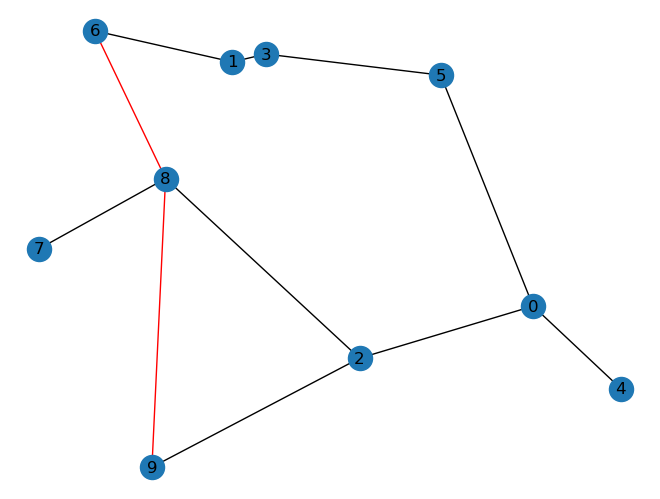

added edges [(9, 8), (8, 6)]
min cc 0.34615384615384615
budget 0.5001338112898661
-----------------------------------------------
(9, 8, 7)
edge (9, 8)
done True
{((0, 1), (1, 2)): 0.32142857142857145, ((0, 1),): 0.2903225806451613, ((0, 1), (1, 5)): 0.2903225806451613, ((0, 1), (1, 7)): 0.36, ((0, 1), (1, 8)): 0.36, ((0, 3), (3, 2)): 0.3103448275862069, ((0, 3),): 0.2727272727272727, ((0, 3), (3, 6)): 0.2903225806451613, ((0, 3), (3, 7)): 0.3103448275862069, ((0, 3), (3, 8)): 0.3103448275862069, ((0, 6),): 0.2903225806451613, ((0, 6), (6, 3)): 0.2903225806451613, ((0, 6), (6, 7)): 0.36, ((0, 6), (6, 8)): 0.34615384615384615, ((0, 7), (7, 1)): 0.3333333333333333, ((0, 7), (7, 2)): 0.24324324324324326, ((0, 7), (7, 3)): 0.2727272727272727, ((0, 7),): 0.24324324324324326, ((0, 7), (7, 6)): 0.3333333333333333, ((0, 7), (7, 9)): 0.24324324324324326, ((0, 8), (8, 1)): 0.36, ((0, 8), (8, 3)): 0.2903225806451613, ((0, 8),): 0.24324324324324326, ((0, 8), (8, 5)): 0.2571428571428571, ((0, 8), (

In [36]:
naive(g, 3, coords, 1.5)

{0: 0.5625, 1: 0.45, 2: 0.5294117647058824, 3: 0.45, 4: 0.5, 5: 0.5, 6: 0.5, 7: 0.5, 8: 0.5294117647058824, 9: 0.5}
KM budget 1.5


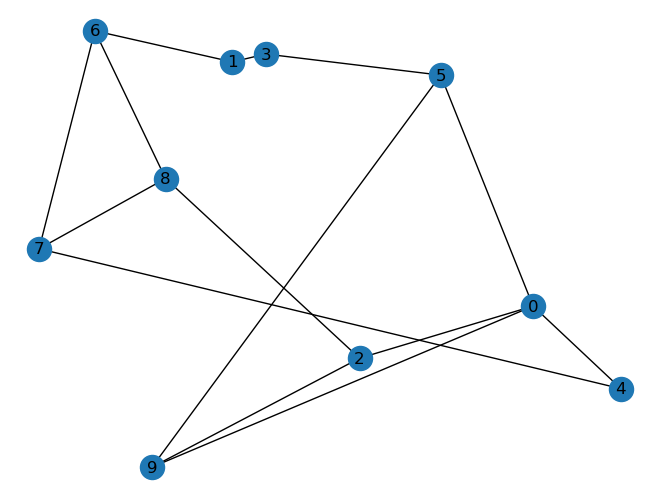

node sequence [8]
start node [0] = 8
worst node : 1
worst no neigbors node : 1
new node 5
cf [(8, 5)]
{0: 0.5625, 1: 0.45, 2: 0.5294117647058824, 3: 0.45, 4: 0.5, 5: 0.5, 6: 0.5, 7: 0.5, 8: 0.5294117647058824, 9: 0.5}
delta min closeness / reward 0.0
cumul_rewards = 0.0
kilometres 0.5015697577798023
budget left 0.9984302422201977


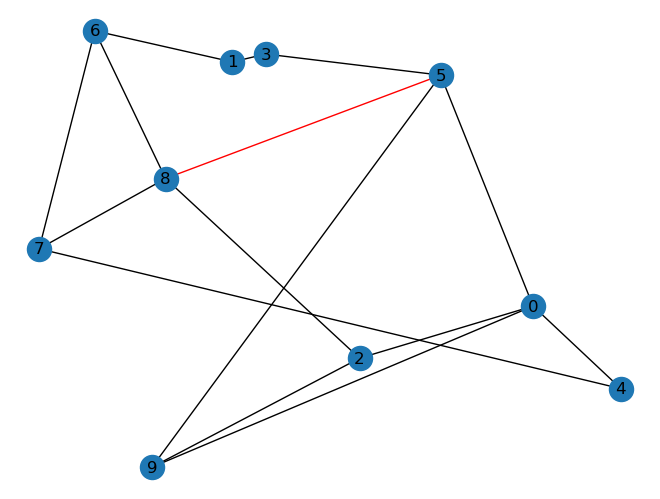

node sequence [8, 5]
start node [0] = 5
worst node : 1
worst no neigbors node : 1
new node 7
cf [(8, 5), (5, 7)]
{0: 0.5625, 1: 0.45, 2: 0.5294117647058824, 3: 0.47368421052631576, 4: 0.5, 5: 0.6428571428571429, 6: 0.5294117647058824, 7: 0.5294117647058824, 8: 0.6428571428571429, 9: 0.5}
delta min closeness / reward 0.0
cumul_rewards = 0.0
kilometres 0.7571475443568633
budget left 0.24128269786333445


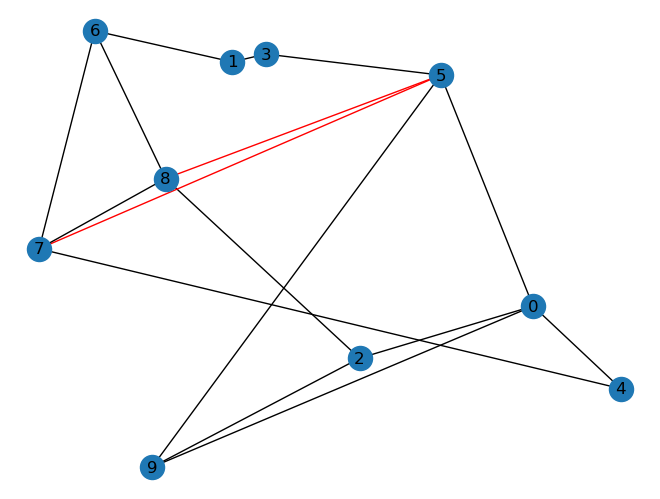

node sequence [8, 5, 7]
start node [0] = 7
worst node : 1
worst no neigbors node : 1
new node 9
cf [(8, 5), (5, 7), (7, 9)]
{0: 0.5625, 1: 0.45, 2: 0.5294117647058824, 3: 0.5, 4: 0.5, 5: 0.6923076923076923, 6: 0.5294117647058824, 7: 0.6428571428571429, 8: 0.6428571428571429, 9: 0.5294117647058824}
delta min closeness / reward 0.0
cumul_rewards = 0.0
kilometres 0.5234812252714185
budget left -0.28219852740808404


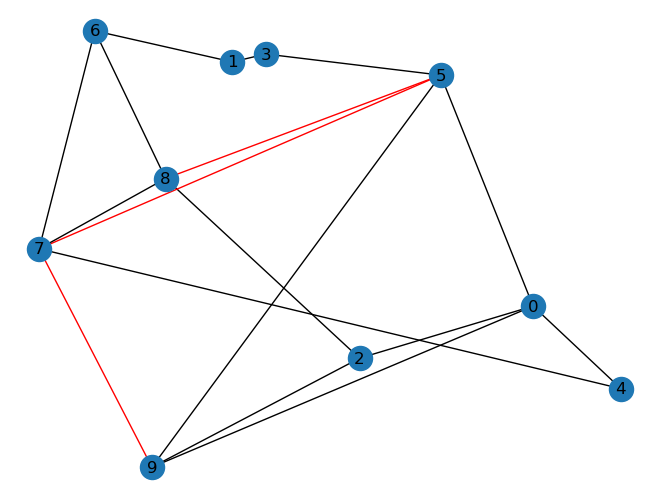

out of budget
[5, 7, 9]
[1, 1, 1]
--- 0.5896241664886475 seconds ---


In [43]:
draw(k ,10, coords, 'random', 1.5)

{0: 0.5, 1: 0.3103448275862069, 2: 0.42857142857142855, 3: 0.391304347826087, 4: 0.34615384615384615, 5: 0.47368421052631576, 6: 0.24324324324324326, 7: 0.2571428571428571, 8: 0.3333333333333333, 9: 0.47368421052631576}
KM budget 1.5


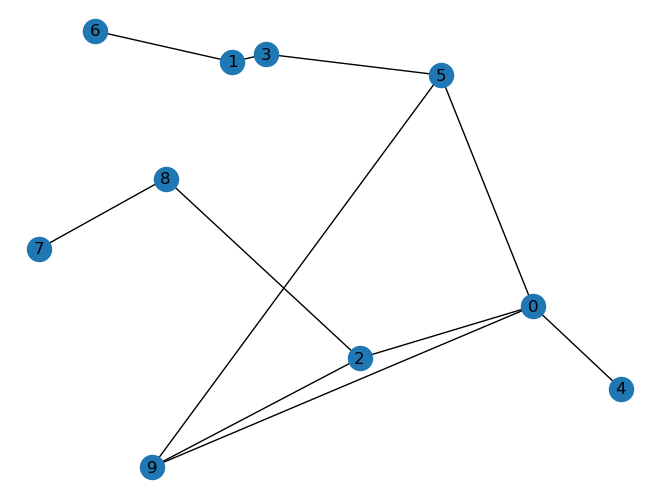

node sequence [8]
start node [0] = 8
worst node : 6
worst no neigbors node : 6
new node 6
cf [(8, 6)]
{0: 0.5, 1: 0.3103448275862069, 2: 0.42857142857142855, 3: 0.391304347826087, 4: 0.34615384615384615, 5: 0.47368421052631576, 6: 0.24324324324324326, 7: 0.2571428571428571, 8: 0.3333333333333333, 9: 0.47368421052631576}
delta min closeness / reward 0.0
cumul_rewards = 0.0
kilometres 0.35099438331126637
budget left 1.1490056166887337


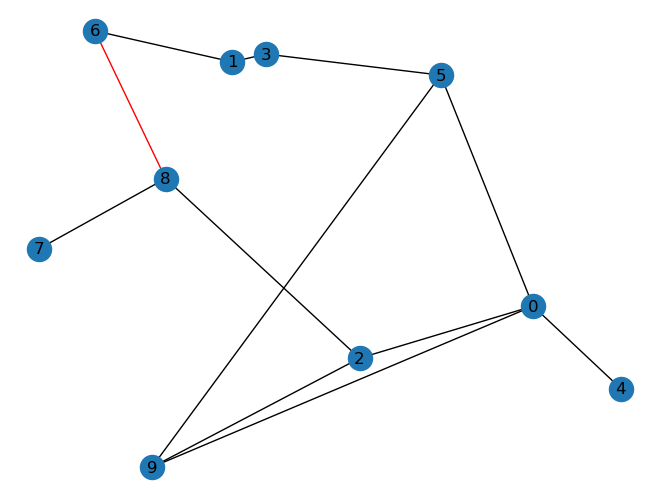

node sequence [8, 6]
start node [0] = 6
worst node : 7
worst no neigbors node : 7
new node 7
cf [(8, 6), (6, 7)]
{0: 0.5294117647058824, 1: 0.4090909090909091, 2: 0.5294117647058824, 3: 0.42857142857142855, 4: 0.36, 5: 0.47368421052631576, 6: 0.42857142857142855, 7: 0.34615384615384615, 8: 0.5, 9: 0.5}
delta min closeness / reward 0.10291060291060289
cumul_rewards = 0.10291060291060289
kilometres 0.49785869670825894
budget left 0.6511469199804747


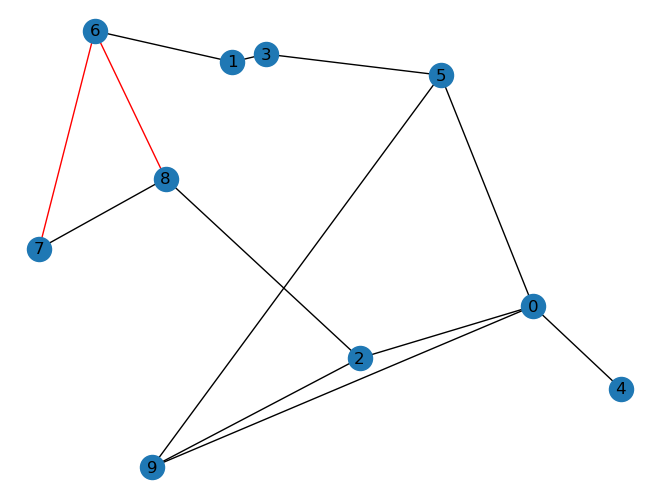

node sequence [8, 6, 7]
start node [0] = 7
worst node : 4
worst no neigbors node : 4
new node 4
cf [(8, 6), (6, 7), (7, 4)]
{0: 0.5294117647058824, 1: 0.42857142857142855, 2: 0.5294117647058824, 3: 0.45, 4: 0.36, 5: 0.47368421052631576, 6: 0.45, 7: 0.391304347826087, 8: 0.5, 9: 0.5}
delta min closeness / reward 0.013846153846153841
cumul_rewards = 0.11675675675675673
kilometres 0.9913506963353375
budget left -0.34020377635486276


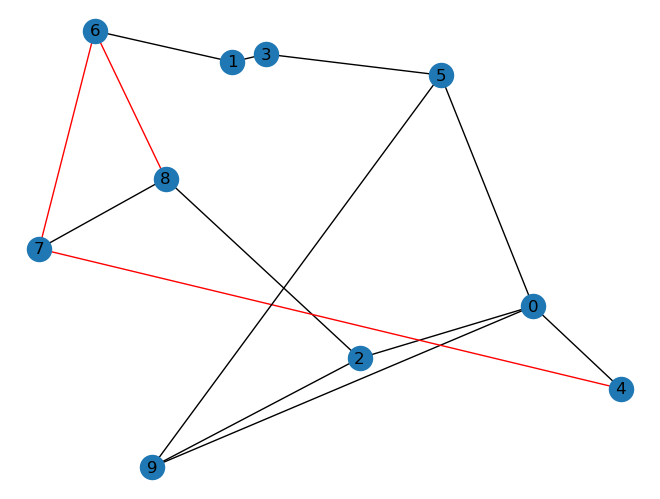

out of budget
[6, 7, 4]
[6, 7, 4]
--- 1.1173701286315918 seconds ---


In [39]:
draw(k ,10, coords, 'greedy', 1.5)